In [5823]:
# import the required packages
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt
import missingno as msno
import nltk
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import sent_tokenize, word_tokenize
import statsmodels.api as sm
from sklearn.feature_extraction.text import CountVectorizer
%matplotlib inline
from sklearn.model_selection import train_test_split
from feature_engine.outliers import Winsorizer
from feature_engine.transformation import YeoJohnsonTransformer
from feature_engine.transformation import LogTransformer
from feature_engine.transformation import BoxCoxTransformer
from sklearn.pipeline import Pipeline
import feature_engine.imputation as mdi
from feature_engine.encoding import OneHotEncoder, MeanEncoder
from feature_engine.discretisation import EqualWidthDiscretiser
from feature_engine.discretisation import EqualFrequencyDiscretiser
from sklearn.preprocessing import RobustScaler,StandardScaler, PolynomialFeatures, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, f1_score, recall_score
from imblearn.over_sampling import SMOTENC, SMOTE
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

## 1. HR Analytics

### 1.1 Load and Explore the data

In [5824]:
hr_data = pd.read_csv('hr_data.csv')
hr_data.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [5825]:
# good practice and used to compare correlation analysis with original dataset
hr_data_copy = hr_data.copy()
hr_data_copy.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [5826]:
hr_data.tail()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0
54807,51526,HR,region_22,Bachelor's,m,other,1,27,1.0,5,0,0,49,0


In [5827]:
# show data shape
hr_data.shape

(54808, 14)

In [5828]:
# show data types
hr_data.dtypes

employee_id               int64
department               object
region                   object
education                object
gender                   object
recruitment_channel      object
no_of_trainings           int64
age                       int64
previous_year_rating    float64
length_of_service         int64
KPIs_met >80%             int64
awards_won?               int64
avg_training_score        int64
is_promoted               int64
dtype: object

In [5829]:
hr_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [5830]:
hr_data.describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


In [5831]:
# show null values
hr_data.isnull().sum()

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

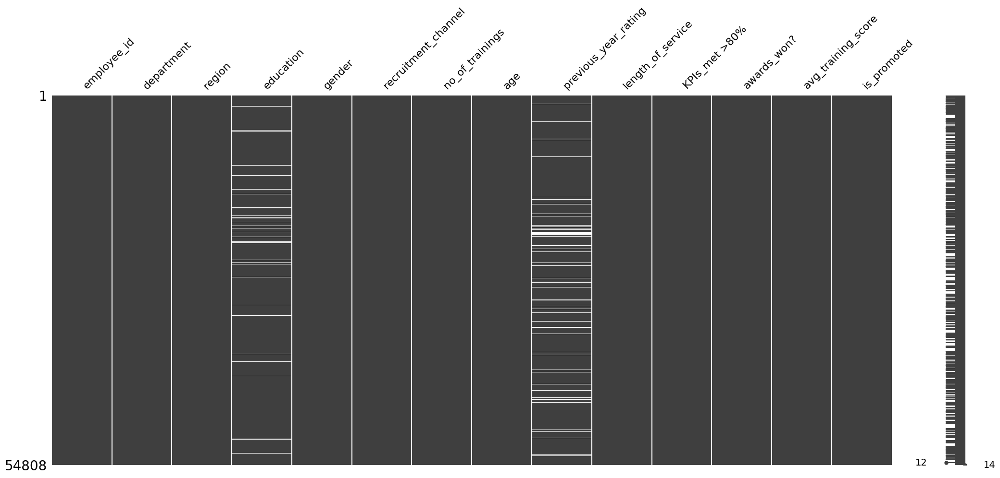

In [5832]:
# show which rows contain missing values 
msno.matrix(hr_data)
plt.show()

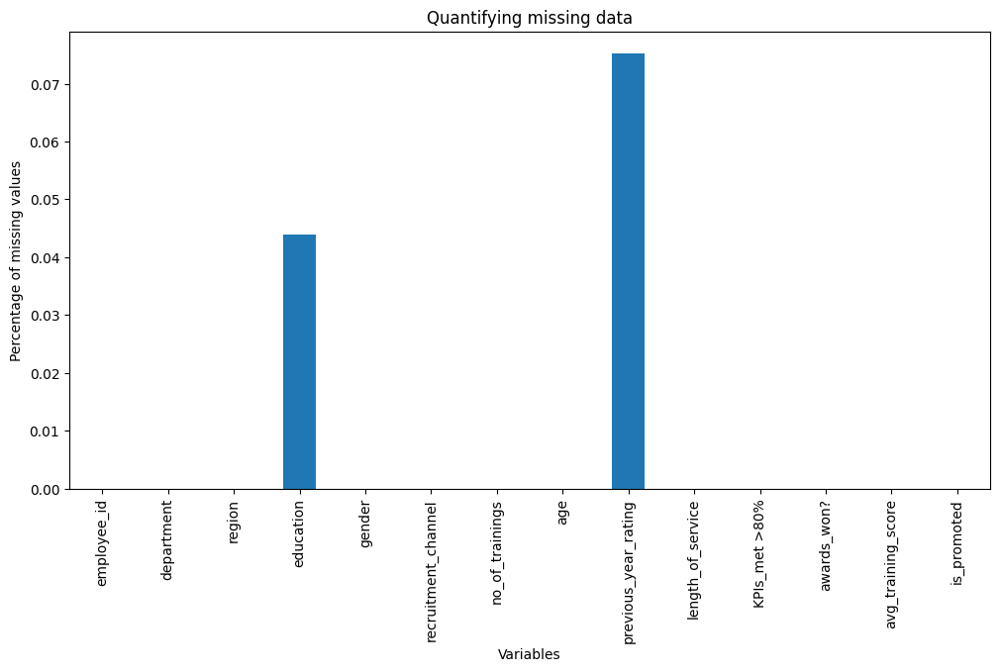

In [5833]:
# visualise percentage of missing values for hr_data
hr_data.isnull().mean().plot.bar(figsize=(12,6))
plt.ylabel('Percentage of missing values')
plt.xlabel('Variables')
plt.title('Quantifying missing data')
plt.show()

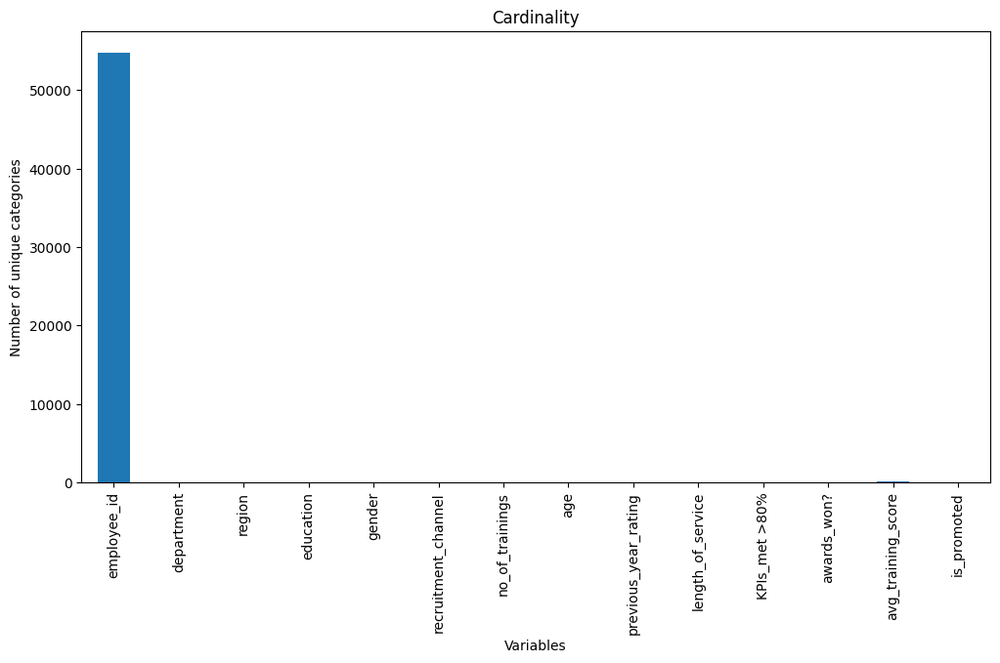

In [5834]:
# check cardinality
hr_data.nunique().plot.bar(figsize=(12,6))

plt.ylabel('Number of unique categories')
plt.xlabel('Variables')
plt.title('Cardinality')
plt.show()

In [5835]:
# check duplicates
# there are no duplicates in this dataset
hr_data[hr_data.duplicated()]

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted


In [5836]:
#show categorical columns along with their missing value percentages
cat_cols = [c for c in hr_data.columns if hr_data[c].dtypes=='O']
print(hr_data[cat_cols].isnull().mean().sort_values())

department             0.000000
region                 0.000000
gender                 0.000000
recruitment_channel    0.000000
education              0.043953
dtype: float64


#### Explore categorical columns

##### Identify if there is a need to group rare categories

In [5837]:
hr_data['department'].nunique()

9

In [5838]:
# find percentage of how much each category takes up for hr_data for department
hr_data['department'].value_counts()/len(hr_data)

department
Sales & Marketing    0.307254
Operations           0.207050
Technology           0.130236
Procurement          0.130236
Analytics            0.097650
Finance              0.046271
HR                   0.044118
Legal                0.018957
R&D                  0.018227
Name: count, dtype: float64

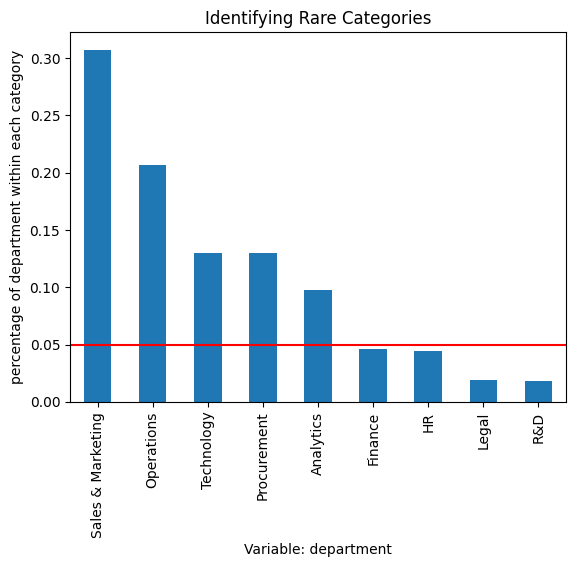

In [5839]:
label_freq = hr_data['department'].value_counts() / len(hr_data)

fig = label_freq.sort_values(ascending=False).plot.bar()

# add a line to signal 5 % frequency limit
# under which we will consider a category as rare
fig.axhline(y=0.05, color='red')

# add axis labels and title
fig.set_ylabel('percentage of department within each category')
fig.set_xlabel('Variable: department')
fig.set_title('Identifying Rare Categories')
plt.show()

In [5840]:
hr_data['region'].nunique()

34

In [5841]:
# find percentage of how much each category takes up for hr_data for region
hr_data['region'].value_counts()/len(hr_data)

region
region_2     0.225204
region_22    0.117282
region_7     0.088363
region_15    0.051233
region_13    0.048314
region_26    0.041235
region_31    0.035305
region_4     0.031072
region_27    0.030269
region_16    0.026730
region_28    0.024048
region_11    0.023993
region_23    0.021438
region_29    0.018136
region_32    0.017242
region_19    0.015947
region_20    0.015509
region_14    0.015089
region_25    0.014943
region_17    0.014523
region_5     0.013976
region_6     0.012589
region_30    0.011987
region_8     0.011951
region_10    0.011823
region_1     0.011130
region_24    0.009269
region_12    0.009123
region_9     0.007663
region_21    0.007499
region_3     0.006313
region_34    0.005328
region_33    0.004908
region_18    0.000566
Name: count, dtype: float64

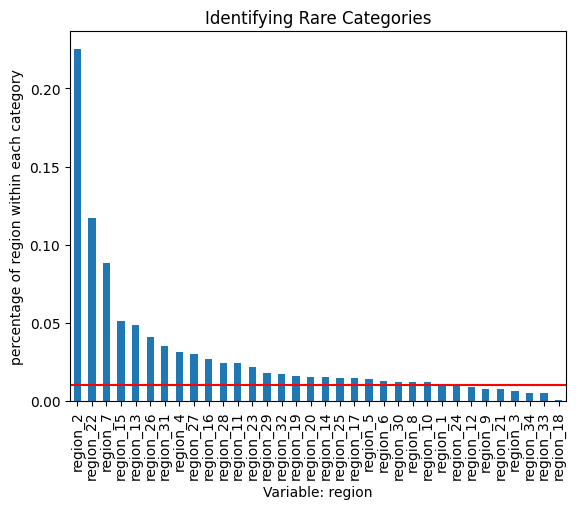

In [5842]:
label_freq = hr_data['region'].value_counts() / len(hr_data)

fig = label_freq.sort_values(ascending=False).plot.bar()

# add a line to signal 1 % frequency limit
# under which we will consider a category as rare
fig.axhline(y=0.01, color='red')

# add axis labels and title
fig.set_ylabel('percentage of region within each category')
fig.set_xlabel('Variable: region')
fig.set_title('Identifying Rare Categories')
plt.show()

In [5843]:
hr_data['gender'].nunique()

2

In [5844]:
# find percentage of how much each category takes up for hr_data for gender
hr_data['gender'].value_counts()/len(hr_data)

gender
m    0.702379
f    0.297621
Name: count, dtype: float64

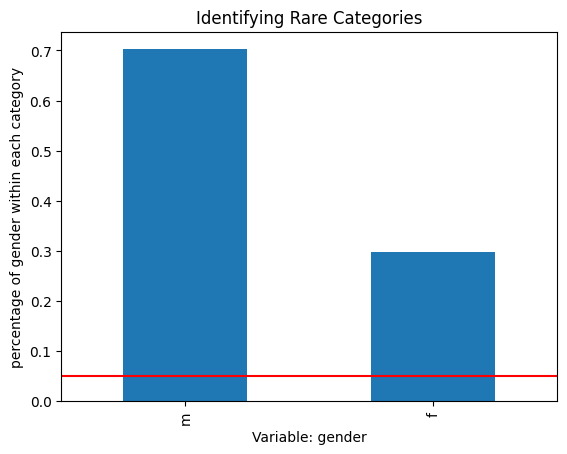

In [5845]:
label_freq = hr_data['gender'].value_counts() / len(hr_data)

fig = label_freq.sort_values(ascending=False).plot.bar()

# add a line to signal 5 % frequency limit
# under which we will consider a category as rare
fig.axhline(y=0.05, color='red')

# add axis labels and title
fig.set_ylabel('percentage of gender within each category')
fig.set_xlabel('Variable: gender')
fig.set_title('Identifying Rare Categories')
plt.show()

In [5846]:
hr_data['recruitment_channel'].nunique()

3

In [5847]:
# find percentage of how much each category takes up for hr_data for recruitment_channel
hr_data['recruitment_channel'].value_counts()/len(hr_data)

recruitment_channel
other       0.555503
sourcing    0.423661
referred    0.020836
Name: count, dtype: float64

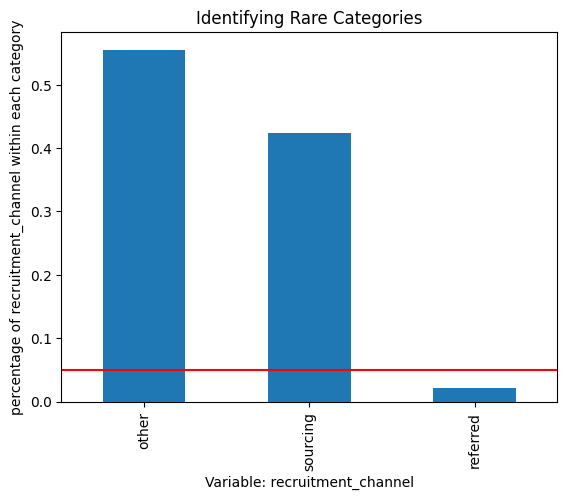

In [5848]:
label_freq = hr_data['recruitment_channel'].value_counts() / len(hr_data)

fig = label_freq.sort_values(ascending=False).plot.bar()

# add a line to signal 5 % frequency limit
# under which we will consider a category as rare
fig.axhline(y=0.05, color='red')

# add axis labels and title
fig.set_ylabel('percentage of recruitment_channel within each category')
fig.set_xlabel('Variable: recruitment_channel')
fig.set_title('Identifying Rare Categories')
plt.show()

In [5849]:
hr_data['education'].nunique()

3

In [5850]:
# find percentage of how much each category takes up for hr_data for education
hr_data['education'].value_counts()/len(hr_data)

education
Bachelor's          0.669045
Master's & above    0.272314
Below Secondary     0.014688
Name: count, dtype: float64

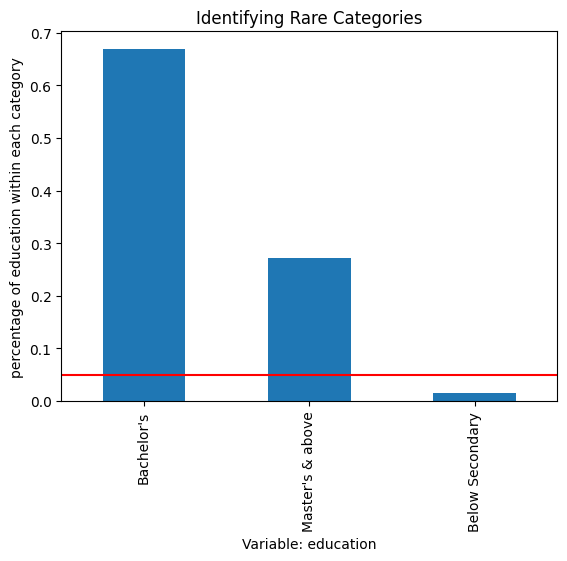

In [5851]:
label_freq = hr_data['education'].value_counts() / len(hr_data)

fig = label_freq.sort_values(ascending=False).plot.bar()

# add a line to signal 5 % frequency limit
# under which we will consider a category as rare
fig.axhline(y=0.05, color='red')

# add axis labels and title
fig.set_ylabel('percentage of education within each category')
fig.set_xlabel('Variable: education')
fig.set_title('Identifying Rare Categories')
plt.show()

#### Explore numerical columns

In [5852]:
# show numerical columns
num_cols = [c for c in hr_data.columns if hr_data[c].dtypes!='O']
print(hr_data[num_cols].isnull().mean().sort_values())

employee_id             0.000000
no_of_trainings         0.000000
age                     0.000000
length_of_service       0.000000
KPIs_met >80%           0.000000
awards_won?             0.000000
avg_training_score      0.000000
is_promoted             0.000000
previous_year_rating    0.075244
dtype: float64


<Axes: >

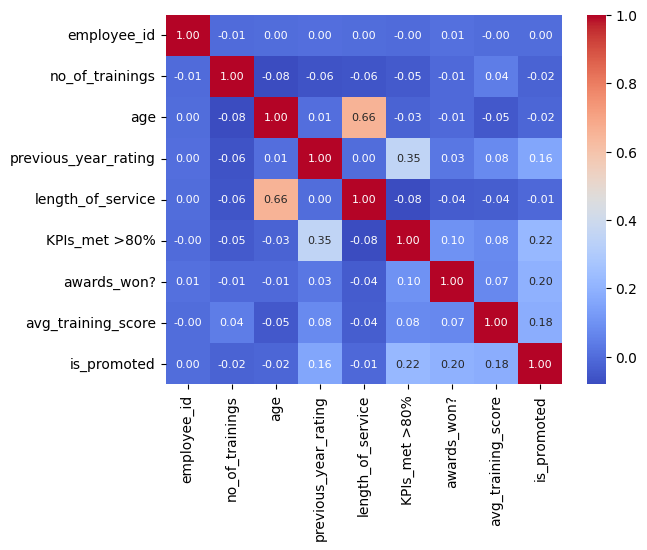

In [5853]:
# show correlation
correlation_matrix = hr_data[num_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})


In [5854]:
hr_data.dtypes

employee_id               int64
department               object
region                   object
education                object
gender                   object
recruitment_channel      object
no_of_trainings           int64
age                       int64
previous_year_rating    float64
length_of_service         int64
KPIs_met >80%             int64
awards_won?               int64
avg_training_score        int64
is_promoted               int64
dtype: object

In [5855]:
cat_cols = [c for c in hr_data.columns if hr_data[c].dtypes=='O']
print(hr_data[cat_cols].isnull().mean().sort_values())


department             0.000000
region                 0.000000
gender                 0.000000
recruitment_channel    0.000000
education              0.043953
dtype: float64


In [5856]:
num_cols = [c for c in hr_data.columns if hr_data[c].dtypes!='O']
print(hr_data[num_cols].isnull().mean().sort_values())


employee_id             0.000000
no_of_trainings         0.000000
age                     0.000000
length_of_service       0.000000
KPIs_met >80%           0.000000
awards_won?             0.000000
avg_training_score      0.000000
is_promoted             0.000000
previous_year_rating    0.075244
dtype: float64


In [5857]:
hr_data[num_cols].describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


### 1.2 Cleanse and Transform the data

### Check if any rows could be dropped due to low number of nulls

In [5858]:
hr_data.isnull().sum()

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

##### Since all no columns have low number of missing values, I will not be dropping any rows.

### Dropping redundant columns

In [5859]:
# data shape before dropping employee_id
hr_data.shape

(54808, 14)

In [5860]:
# an employee_id does not affect the employee's promotion
hr_data = hr_data.drop(columns=['employee_id'])

In [5861]:
# data shape after dropping employee_id
hr_data.shape

(54808, 13)

In [5862]:
hr_data.head()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [5863]:
hr_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   department            54808 non-null  object 
 1   region                54808 non-null  object 
 2   education             52399 non-null  object 
 3   gender                54808 non-null  object 
 4   recruitment_channel   54808 non-null  object 
 5   no_of_trainings       54808 non-null  int64  
 6   age                   54808 non-null  int64  
 7   previous_year_rating  50684 non-null  float64
 8   length_of_service     54808 non-null  int64  
 9   KPIs_met >80%         54808 non-null  int64  
 10  awards_won?           54808 non-null  int64  
 11  avg_training_score    54808 non-null  int64  
 12  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(7), object(5)
memory usage: 5.4+ MB


no_of_trainings         0.000000
age                     0.000000
previous_year_rating    0.075244
length_of_service       0.000000
KPIs_met >80%           0.000000
awards_won?             0.000000
avg_training_score      0.000000
is_promoted             0.000000
dtype: float64


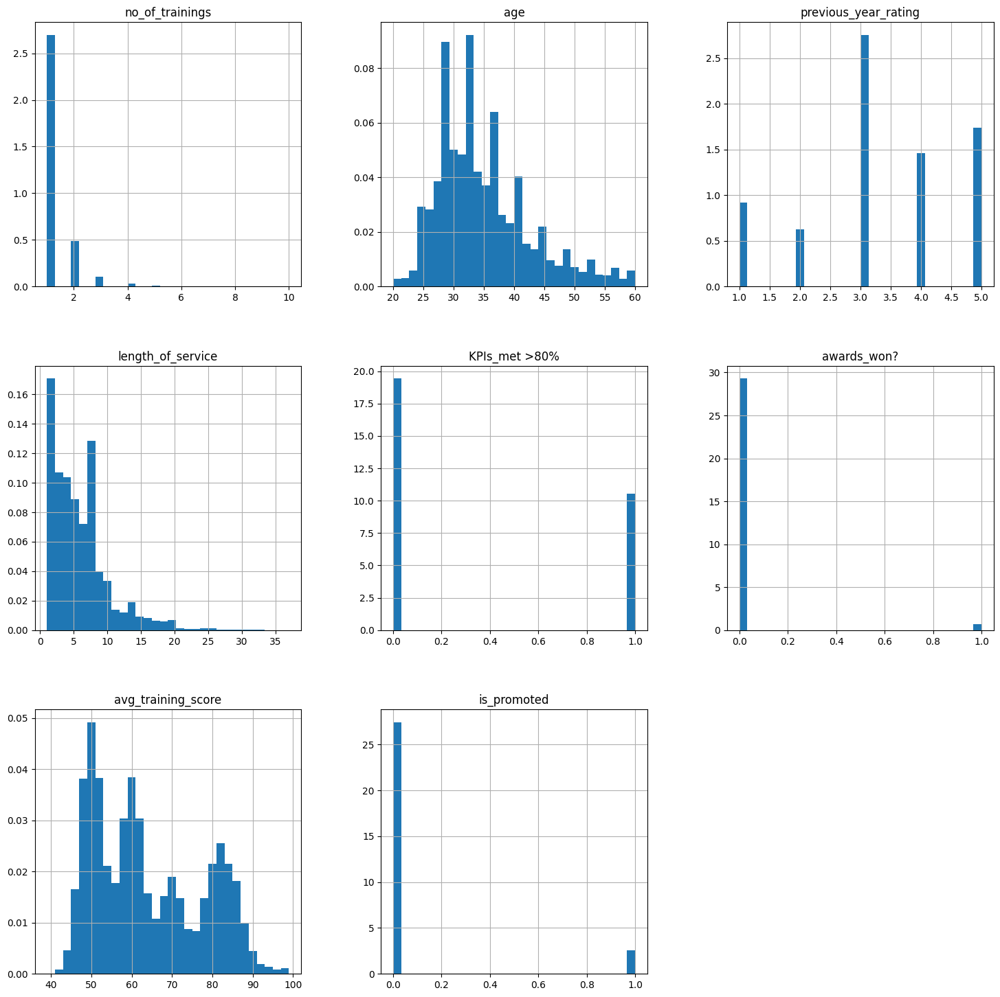

In [5864]:
num_cols = [c for c in hr_data.columns if hr_data[c].dtypes!='O']
print(hr_data[num_cols].isnull().mean())

hr_data[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

### Ensure appropriate data type

In [5865]:
hr_data.dtypes

department               object
region                   object
education                object
gender                   object
recruitment_channel      object
no_of_trainings           int64
age                       int64
previous_year_rating    float64
length_of_service         int64
KPIs_met >80%             int64
awards_won?               int64
avg_training_score        int64
is_promoted               int64
dtype: object

In [5866]:
# fill null values as 0 and convert to int64
hr_data['previous_year_rating'] = hr_data['previous_year_rating'].fillna(0).astype('int64')

In [5867]:
hr_data.dtypes

department              object
region                  object
education               object
gender                  object
recruitment_channel     object
no_of_trainings          int64
age                      int64
previous_year_rating     int64
length_of_service        int64
KPIs_met >80%            int64
awards_won?              int64
avg_training_score       int64
is_promoted              int64
dtype: object

In [5868]:
hr_data.isnull().sum()

department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating       0
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

In [5869]:
# replace 0 with null values in previous_year_rating
hr_data['previous_year_rating'] = hr_data['previous_year_rating'].replace(0, np.nan)

In [5870]:
hr_data.isnull().sum()

department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

<Axes: >

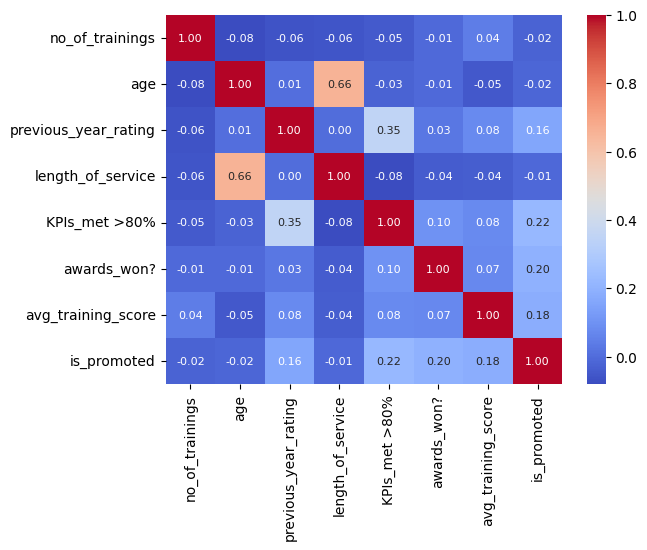

In [5871]:
num_cols = [c for c in hr_data.columns if hr_data[c].dtypes!='O']
correlation_matrix = hr_data[num_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})


### Identifying Outliers

In [5872]:
def find_boundaries(df, variable):

    # distance passed as an argument, gives us the option to
    # estimate 1.5 times or 3 times the IQR to calculate
    # the boundaries.

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df[variable].quantile(0.75) + (IQR * 1.5)

    return upper_boundary, lower_boundary


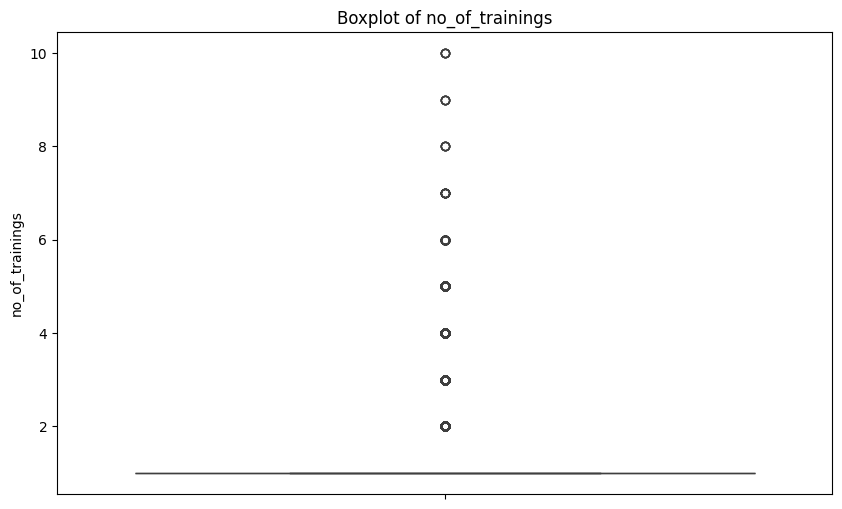

no_of_trainings - Upper Boundary: 1.0, Lower Boundary: 1.0
Number of outliers in no_of_trainings: 10430
no_of_trainings - Number of unique values: 10
Outliers in no_of_trainings:
3     2
5     2
13    2
24    2
31    2
Name: no_of_trainings, dtype: int64



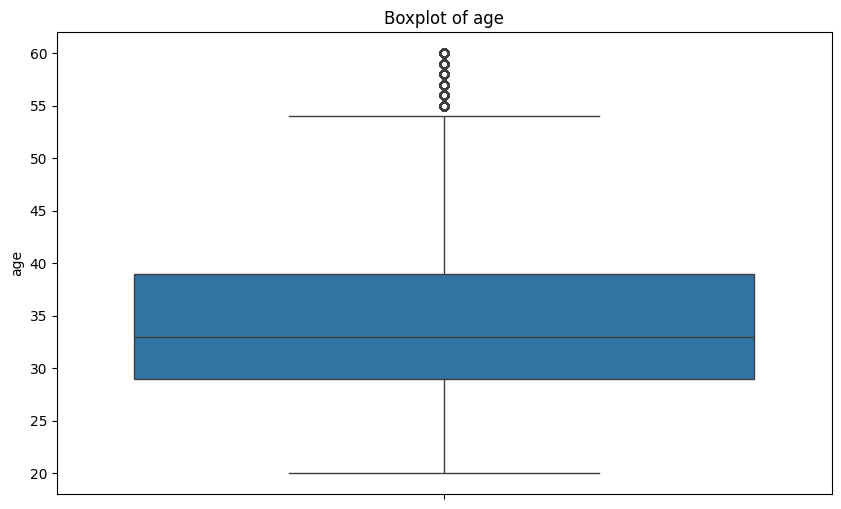

age - Upper Boundary: 54.0, Lower Boundary: 14.0
Number of outliers in age: 1435
age - Number of unique values: 41
Outliers in age:
33     57
42     59
49     56
99     60
307    58
Name: age, dtype: int64



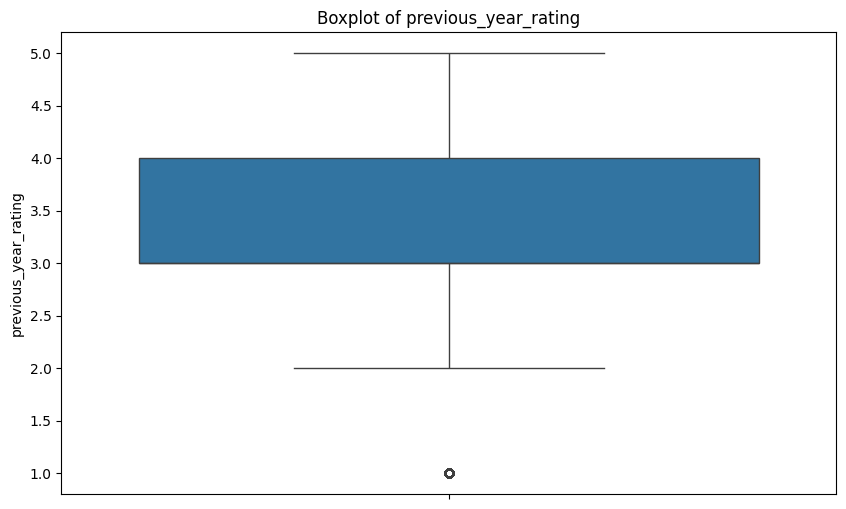

previous_year_rating - Upper Boundary: 5.5, Lower Boundary: 1.5
Number of outliers in previous_year_rating: 6223
previous_year_rating - Number of unique values: 5
Outliers in previous_year_rating:
3     1.0
15    1.0
17    1.0
31    1.0
32    1.0
Name: previous_year_rating, dtype: float64



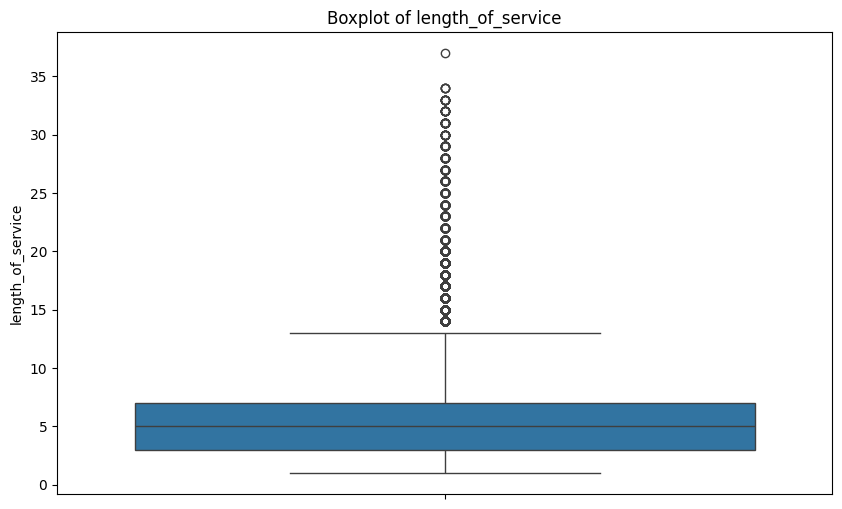

length_of_service - Upper Boundary: 13.0, Lower Boundary: -3.0
Number of outliers in length_of_service: 3489
length_of_service - Number of unique values: 35
Outliers in length_of_service:
13    16
42    26
60    17
74    14
99    17
Name: length_of_service, dtype: int64



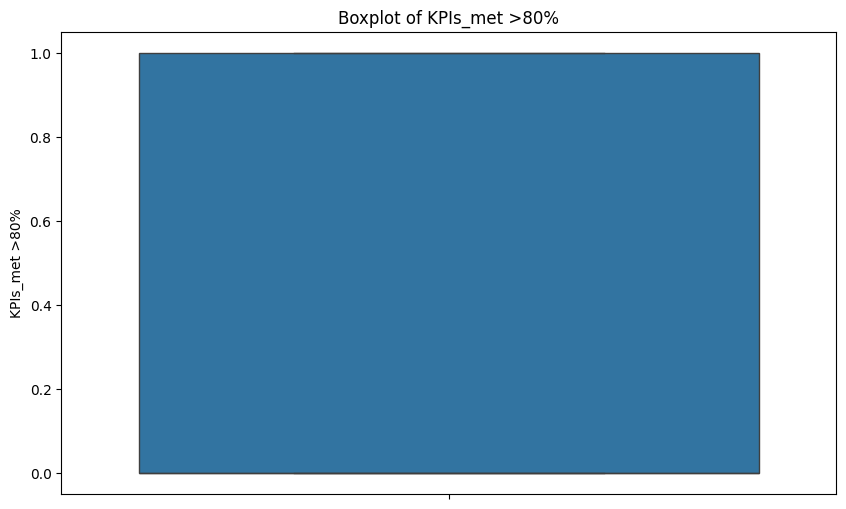

KPIs_met >80% - Upper Boundary: 2.5, Lower Boundary: -1.5
Number of outliers in KPIs_met >80%: 0
KPIs_met >80% - Number of unique values: 2
Outliers in KPIs_met >80%:
Series([], Name: KPIs_met >80%, dtype: int64)



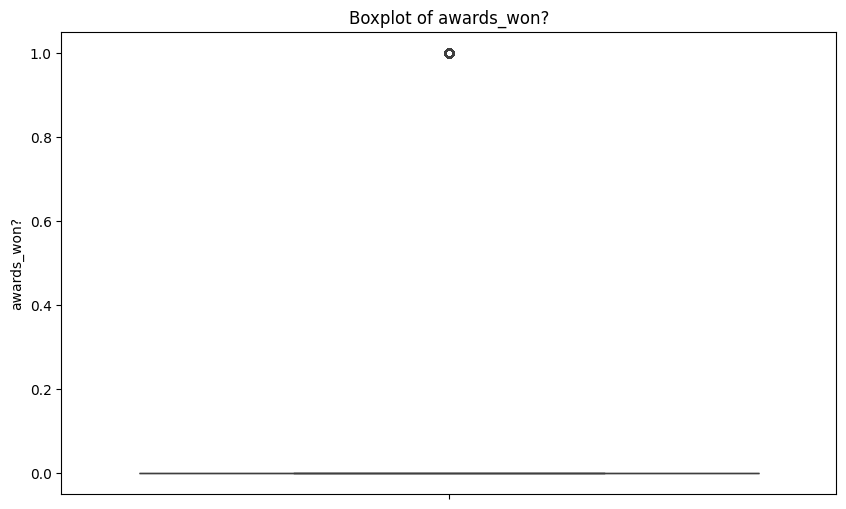

awards_won? - Upper Boundary: 0.0, Lower Boundary: 0.0
Number of outliers in awards_won?: 1270
awards_won? - Number of unique values: 2
Outliers in awards_won?:
66     1
122    1
138    1
140    1
200    1
Name: awards_won?, dtype: int64



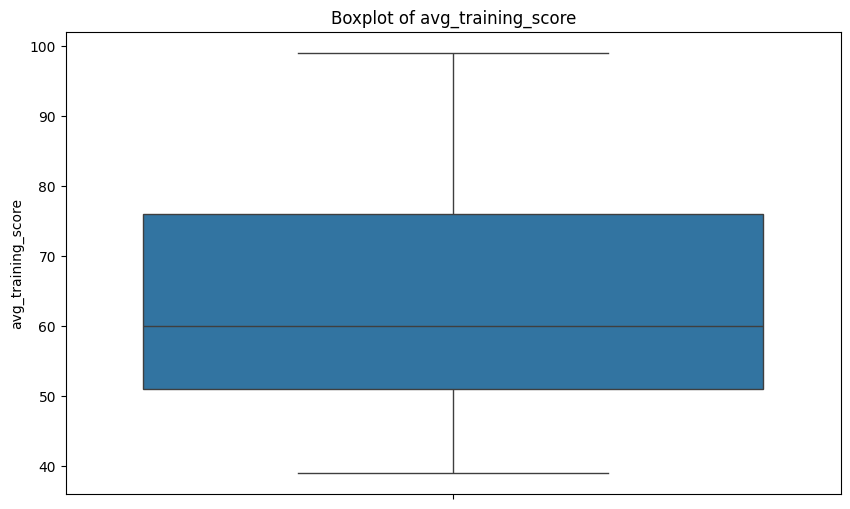

avg_training_score - Upper Boundary: 113.5, Lower Boundary: 13.5
Number of outliers in avg_training_score: 0
avg_training_score - Number of unique values: 61
Outliers in avg_training_score:
Series([], Name: avg_training_score, dtype: int64)



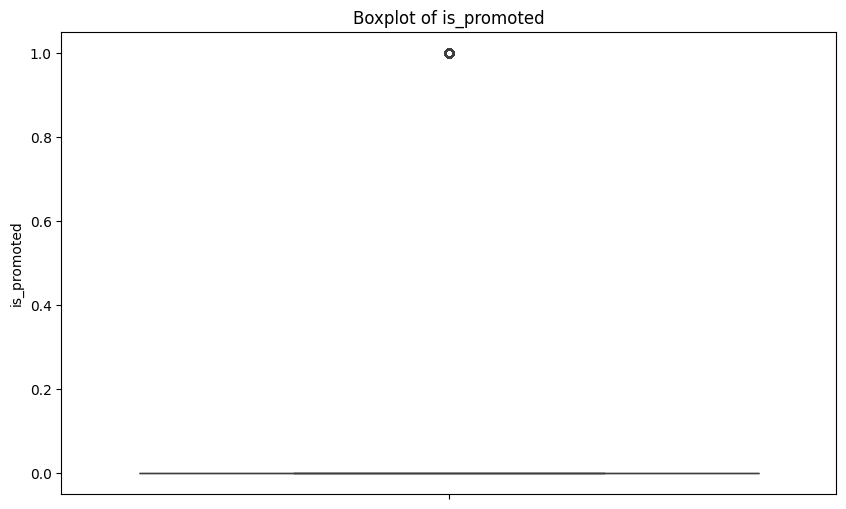

is_promoted - Upper Boundary: 0.0, Lower Boundary: 0.0
Number of outliers in is_promoted: 4668
is_promoted - Number of unique values: 2
Outliers in is_promoted:
11    1
39    1
60    1
66    1
67    1
Name: is_promoted, dtype: int64



In [5873]:
# Loop through each numeric column except 'price'
for column in hr_data.select_dtypes(include=[np.number]).columns:
    if column == 'price':
        continue  # Skip 'price' column
    
    # Plot boxplot
    plt.figure(figsize=(10, 6))
    sns.boxplot(y=hr_data[column])
    plt.title(f'Boxplot of {column}')
    plt.ylabel(column)
    plt.show()
    
    # Calculate boundaries (make sure you define this function 'find_boundaries')
    upper_boundary, lower_boundary = find_boundaries(hr_data, column)
    print(f'{column} - Upper Boundary: {upper_boundary}, Lower Boundary: {lower_boundary}')
    
    # Detect outliers
    outliers = np.where(hr_data[column] > upper_boundary, True,
                        np.where(hr_data[column] < lower_boundary, True, False))
    
    # Print number of outliers
    num_outliers = outliers.sum()
    print(f'Number of outliers in {column}: {num_outliers}')
    
    unique_values = hr_data[column].nunique()
    print(f'{column} - Number of unique values: {unique_values}')    
    
    # Print outlier values
    outliers_df = hr_data.loc[outliers, column]
    print(f'Outliers in {column}:')
    print(outliers_df.head())
    print()

In [5874]:
# create a method that indicates the columns with nulls for each row 
def null_encrypter(row):
    
    null_indices = [str(idx) for idx, value in enumerate(row) if pd.isna(value)]
    
    return ','.join(null_indices) if null_indices else 'notna'
            

hr_data['null_loc'] = hr_data.apply(null_encrypter, axis=1)

hr_data

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,null_loc
0,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0,notna
1,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0,notna
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0,notna
3,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0,notna
4,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0,notna
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0,notna
54804,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0,notna
54805,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0,notna
54806,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0,2


In [5875]:
# find rows where null_loc it is not notna
hr_data[hr_data['null_loc'] != 'notna']

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,null_loc
10,Technology,region_23,NaN,m,sourcing,1,30,NaN,1,0,0,77,0,"2,7"
21,Operations,region_15,NaN,m,sourcing,1,41,4.0,11,0,0,57,0,2
23,Procurement,region_5,Bachelor's,m,other,1,27,NaN,1,0,0,70,0,7
29,Sales & Marketing,region_4,Bachelor's,m,sourcing,1,26,NaN,1,0,0,44,0,7
32,Sales & Marketing,region_7,NaN,f,sourcing,1,24,1.0,2,0,0,48,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54742,Sales & Marketing,region_31,NaN,m,other,1,28,4.0,3,0,0,47,0,2
54746,Finance,region_6,Bachelor's,m,other,1,28,NaN,1,1,0,61,0,7
54773,Finance,region_2,Bachelor's,m,other,1,23,NaN,1,1,0,61,0,7
54801,Technology,region_26,Bachelor's,f,sourcing,1,31,NaN,1,0,0,78,0,7


In [5876]:
# fill_nulls
hr_data = hr_data.fillna(0)

hr_data

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,null_loc
0,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0,notna
1,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0,notna
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0,notna
3,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0,notna
4,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0,notna
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0,notna
54804,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0,notna
54805,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0,notna
54806,Sales & Marketing,region_9,0,m,sourcing,1,29,1.0,2,0,0,45,0,2


In [5877]:
hr_data['is_promoted'].value_counts()

is_promoted
0    50140
1     4668
Name: count, dtype: int64

### Apply SMOTE

In [5878]:
# I use smotenc to smote is_promoted to a 1:2 ratio to balance the dataset
# I applied smotenc to handle categorical columns

X = hr_data.drop(columns=['is_promoted'])
y = hr_data['is_promoted']

# get the categorical columns
cat_cols = [c for c in X.columns if X[c].dtypes == 'O']
cat_list = []

for col in cat_cols:
    cat_list.append(X.columns.get_loc(col))
    
print(cat_cols)
    
X[cat_cols] = X[cat_cols].astype(str)

# instantiate the smotenc object
smote_nc = SMOTENC(categorical_features = cat_list, sampling_strategy=0.5, random_state=0)
X_balanced, y_balanced = smote_nc.fit_resample(X, y)

y_balanced.value_counts()

['department', 'region', 'education', 'gender', 'recruitment_channel', 'null_loc']


is_promoted
0    50140
1    25070
Name: count, dtype: int64

In [5879]:
# reverse null values back to null
def apply_nulls(row):
    if row['null_loc'] != 'notna':
        for idx in row['null_loc'].split(','):
            row[int(idx)] = np.nan
    return row
    
X_balanced = X_balanced.apply(apply_nulls, axis=1)
X_balanced = X_balanced.drop(columns='null_loc')

X_balanced


C:\Users\user\AppData\Local\Temp\ipykernel_41172\1878551509.py:5: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  row[int(idx)] = np.nan


,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.000000,8,1,0,49
1,Operations,region_22,Bachelor's,m,other,1,30,5.000000,4,0,0,60
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.000000,7,0,0,50
3,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.000000,10,0,0,50
4,Technology,region_26,Bachelor's,m,other,1,45,3.000000,2,0,0,73
...,...,...,...,...,...,...,...,...,...,...,...,...
75205,Sales & Marketing,region_2,Bachelor's,m,other,1,34,3.253772,6,1,0,46
75206,Operations,region_7,Master's & above,m,other,1,46,1.969772,18,1,0,58
75207,Operations,region_13,Master's & above,m,other,1,34,5.000000,9,0,0,68
75208,Sales & Marketing,region_7,Master's & above,m,sourcing,1,33,4.603520,4,1,0,54


In [5880]:
X_balanced['education'].value_counts()

education
Bachelor's          50551
Master's & above    21099
Below Secondary       954
0                      17
Name: count, dtype: int64

### Train Test Split

In [5881]:
X_train_hr, X_test_hr, y_train_hr, y_test_hr = train_test_split(
    X_balanced, y_balanced, test_size=0.3, random_state=420)

X_train_hr.shape, X_test_hr.shape

((52647, 12), (22563, 12))

In [5882]:
y_train_hr.shape, y_test_hr.shape

((52647,), (22563,))

### Missing Value Imputation

In [5883]:
X_train_hr.isnull().sum()

department                 0
region                     0
education               1777
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    3892
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

In [5884]:
X_test_hr.isnull().sum()

department                 0
region                     0
education                812
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    1728
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

no_of_trainings         0.000000
age                     0.000000
length_of_service       0.000000
KPIs_met >80%           0.000000
awards_won?             0.000000
avg_training_score      0.000000
previous_year_rating    0.073926
dtype: float64


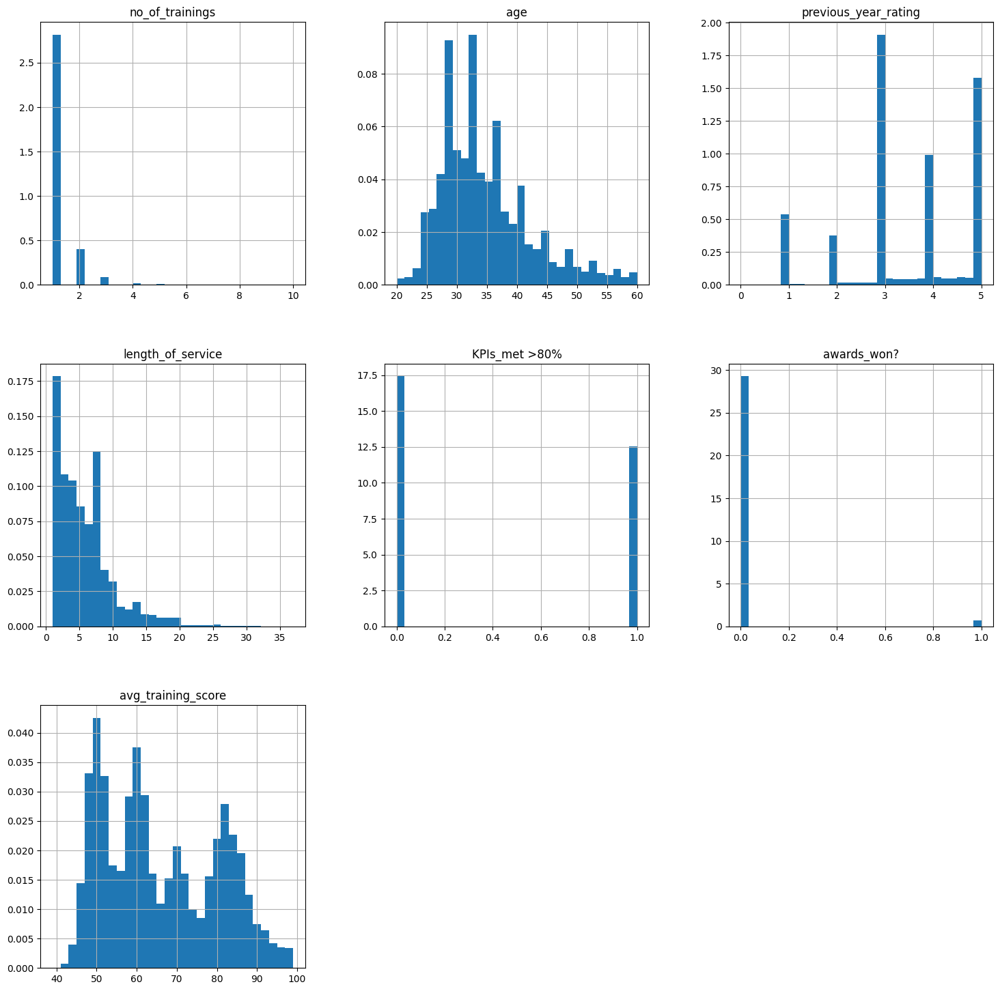

In [5885]:
num_cols = [c for c in X_train_hr.columns if X_train_hr[c].dtypes!='O']
print(X_train_hr[num_cols].isnull().mean().sort_values())

X_train_hr[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

In [5886]:
# there is no previous_year_rating when length_of_service is 1
X_train_hr[X_train_hr['length_of_service']==1]

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
63269,Procurement,region_22,Bachelor's,f,other,1,30,NaN,1,1,0,65
36204,Procurement,region_28,Bachelor's,m,sourcing,1,29,NaN,1,0,0,71
16839,Analytics,region_27,Bachelor's,m,other,1,29,NaN,1,1,0,86
36394,Sales & Marketing,region_6,Bachelor's,f,other,1,28,NaN,1,1,0,43
27090,R&D,region_27,Bachelor's,m,sourcing,1,29,NaN,1,0,0,88
...,...,...,...,...,...,...,...,...,...,...,...,...
3260,Sales & Marketing,region_27,Bachelor's,m,sourcing,1,28,NaN,1,0,0,50
72190,Analytics,region_22,Bachelor's,m,other,2,26,NaN,1,1,0,83
51787,Analytics,region_15,Bachelor's,m,sourcing,1,29,NaN,1,0,0,84
1209,HR,region_22,Bachelor's,m,sourcing,1,28,NaN,1,1,0,51


In [5887]:
# impute null values for previous_year_rating as 0 for x_train and x_test to indicate that the employee has not been rated
X_train_hr['previous_year_rating'] = X_train_hr['previous_year_rating'].fillna(0)
X_test_hr['previous_year_rating'] = X_test_hr['previous_year_rating'].fillna(0)

In [5888]:
X_train_hr.isnull().sum()

department                 0
region                     0
education               1777
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating       0
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

In [5889]:
X_test_hr.isnull().sum()

department                0
region                    0
education               812
gender                    0
recruitment_channel       0
no_of_trainings           0
age                       0
previous_year_rating      0
length_of_service         0
KPIs_met >80%             0
awards_won?               0
avg_training_score        0
dtype: int64

no_of_trainings         0.0
age                     0.0
previous_year_rating    0.0
length_of_service       0.0
KPIs_met >80%           0.0
awards_won?             0.0
avg_training_score      0.0
dtype: float64


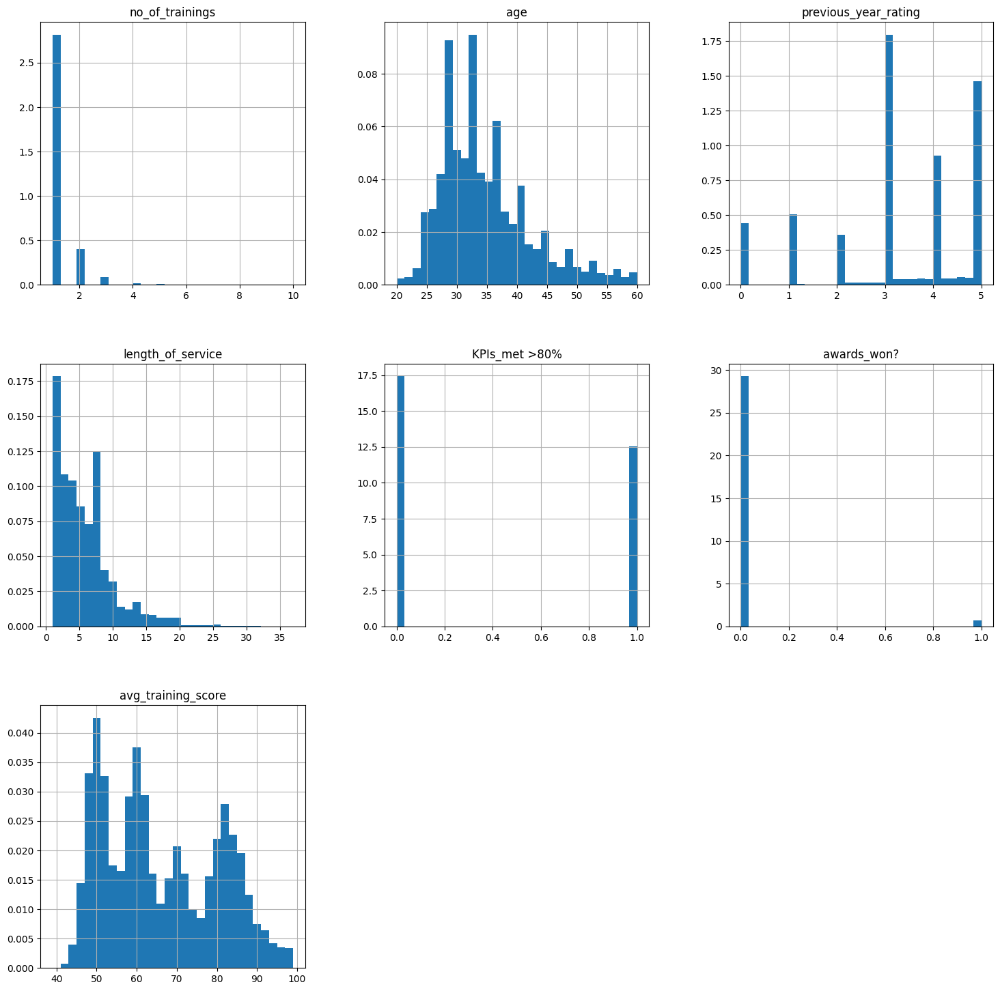

In [5890]:
num_cols = [c for c in X_train_hr.columns if X_train_hr[c].dtypes!='O']
print(X_train_hr[num_cols].isnull().mean().sort_values())

X_train_hr[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

In [5891]:
hr_data['education'].value_counts()

education
Bachelor's          36669
Master's & above    14925
0                    2409
Below Secondary       805
Name: count, dtype: int64

In [5892]:
mode_imputer = mdi.CategoricalImputer(variables=['education'], imputation_method = 'frequent')

mode_imputer.fit(X_train_hr)

CategoricalImputer(imputation_method='frequent', variables=['education'])

In [5893]:
# dictionary with the mappings for each variable
mode_imputer.imputer_dict_

{'education': "Bachelor's"}

In [5894]:
X_train_hr = mode_imputer.transform(X_train_hr)
X_test_hr = mode_imputer.transform(X_test_hr)

In [5895]:
X_train_hr.isnull().sum()

department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
dtype: int64

In [5896]:
X_test_hr.isnull().sum()

department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
dtype: int64

In [5897]:
X_train_hr['education'].value_counts()

education
Bachelor's          37245
Master's & above    14728
Below Secondary       661
0                      13
Name: count, dtype: int64

In [5898]:
X_test_hr['education'].value_counts()

education
Bachelor's          15895
Master's & above     6371
Below Secondary       293
0                       4
Name: count, dtype: int64

In [5899]:
# replace 0 in education with the mode
# 0 is used to fill na values before smote, so I must change back to mode
X_train_hr['education'] = X_train_hr['education'].replace('0', 'Bachelor\'s')
X_test_hr['education'] = X_test_hr['education'].replace('0', 'Bachelor\'s')

In [5900]:
X_train_hr['education'].value_counts()

education
Bachelor's          37258
Master's & above    14728
Below Secondary       661
Name: count, dtype: int64

In [5901]:
X_test_hr['education'].value_counts()

education
Bachelor's          15899
Master's & above     6371
Below Secondary       293
Name: count, dtype: int64

### Outlier Handling

In [5902]:
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30, kde=True)  
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('popularity quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

no_of_trainings         0.0
age                     0.0
previous_year_rating    0.0
length_of_service       0.0
KPIs_met >80%           0.0
awards_won?             0.0
avg_training_score      0.0
dtype: float64


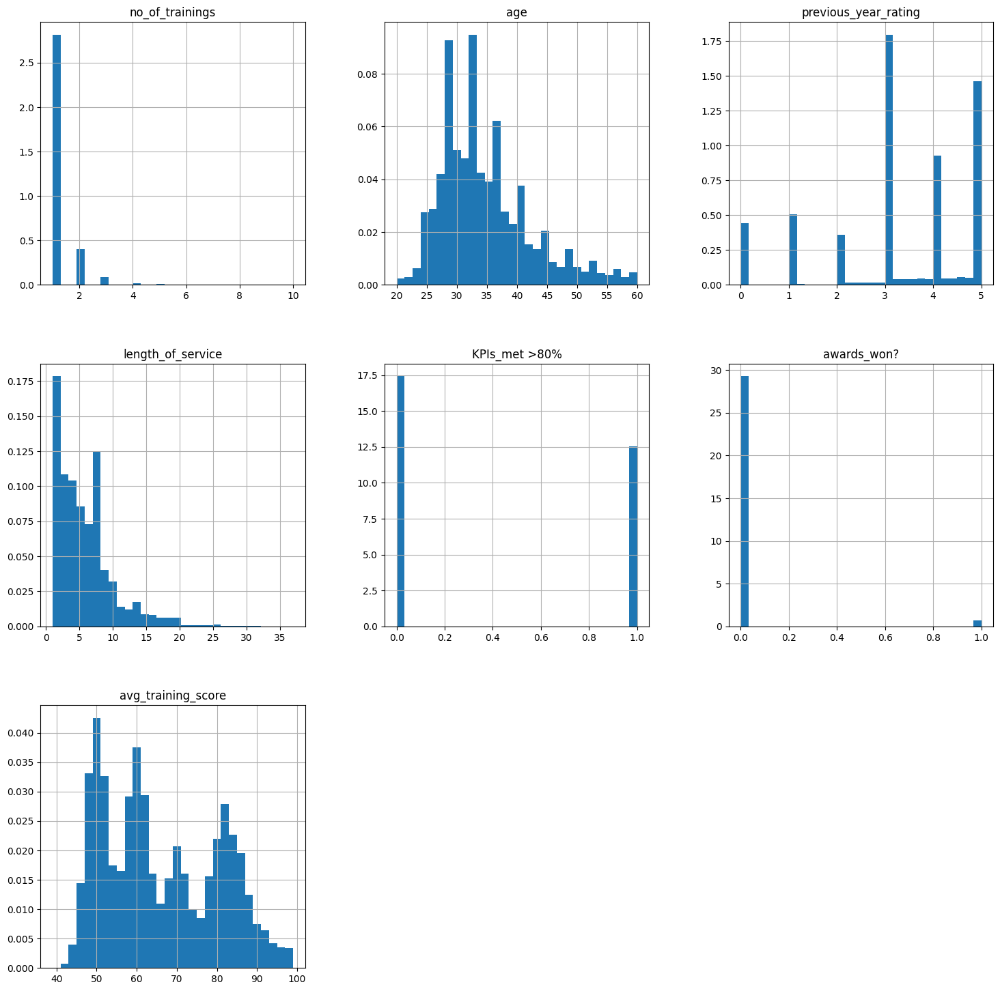

In [5903]:
num_cols = [c for c in X_train_hr.columns if X_train_hr[c].dtypes!='O']
print(X_train_hr[num_cols].isnull().mean())

X_train_hr[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

no_of_trainings         0.0
age                     0.0
previous_year_rating    0.0
length_of_service       0.0
KPIs_met >80%           0.0
awards_won?             0.0
avg_training_score      0.0
dtype: float64


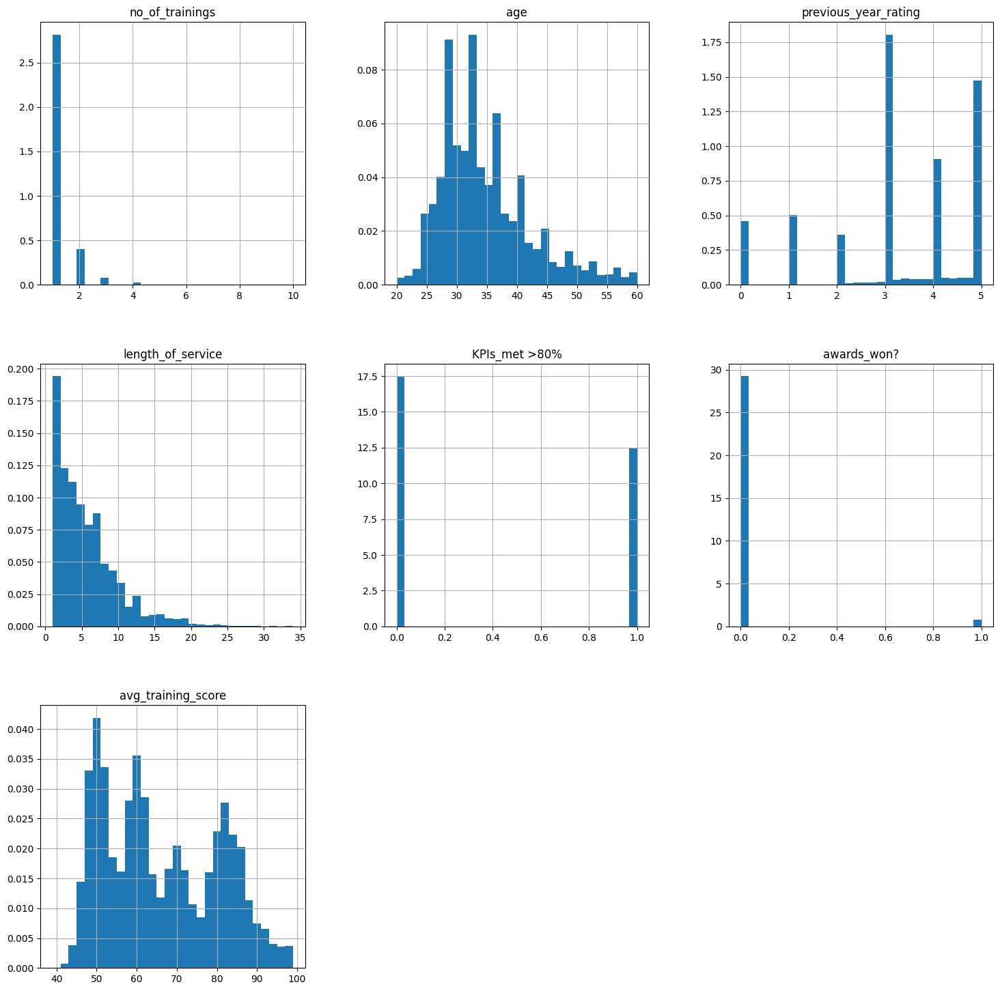

In [5904]:
num_cols = [c for c in X_test_hr.columns if X_test_hr[c].dtypes!='O']
print(X_test_hr[num_cols].isnull().mean())

X_test_hr[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

In [5905]:
numerical_columns = [c for c in X_train_hr.columns if X_train_hr[c].dtypes!='O']


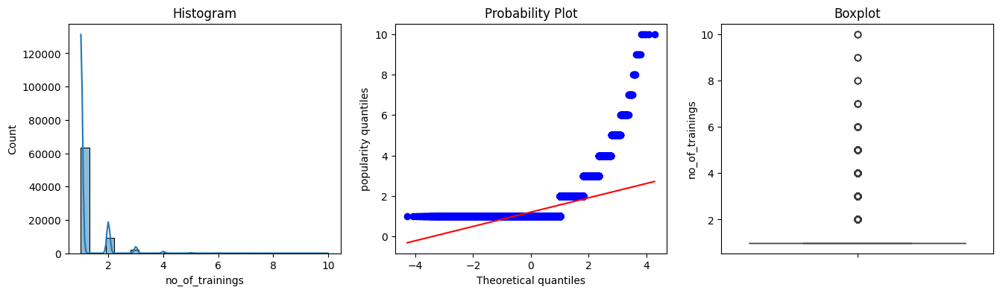

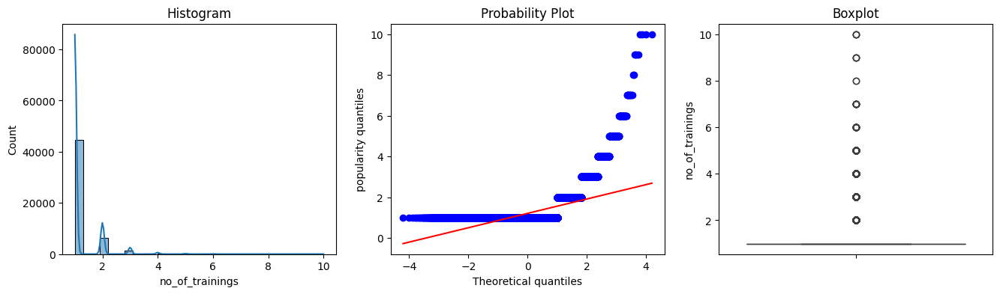

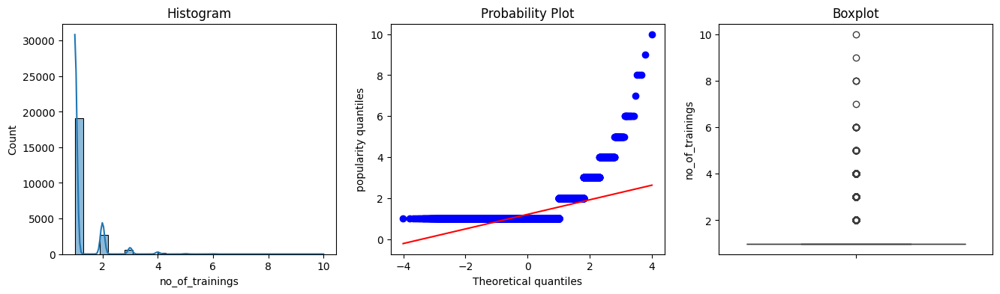

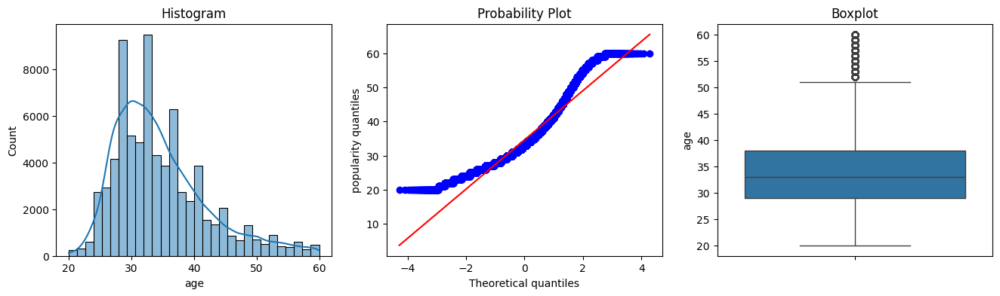

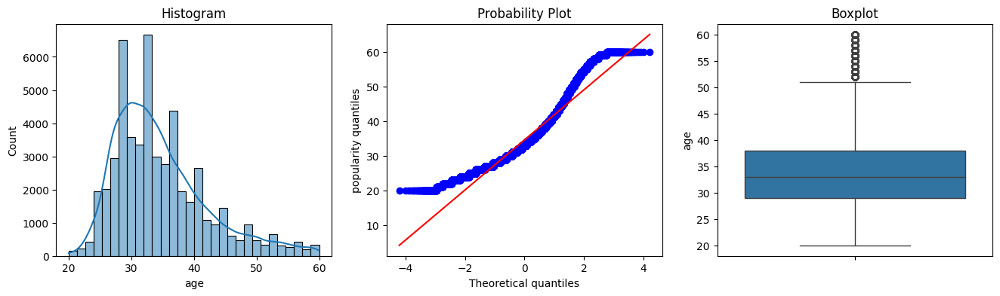

...

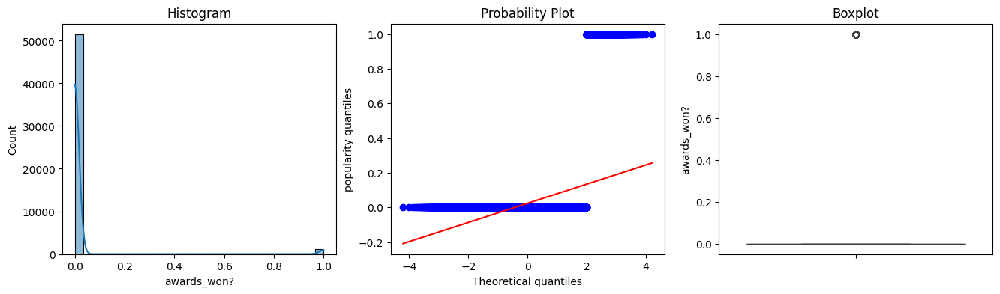

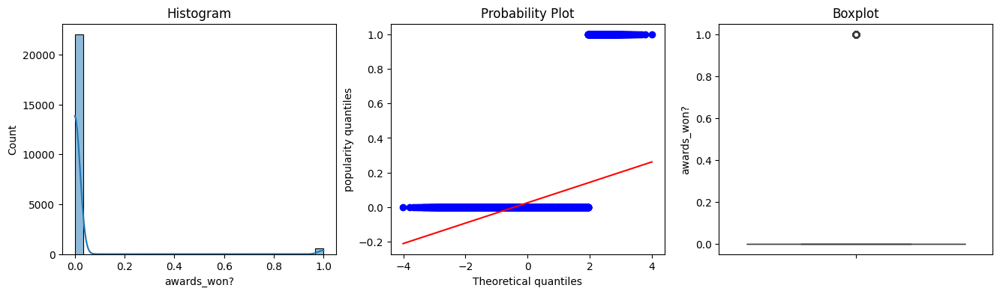

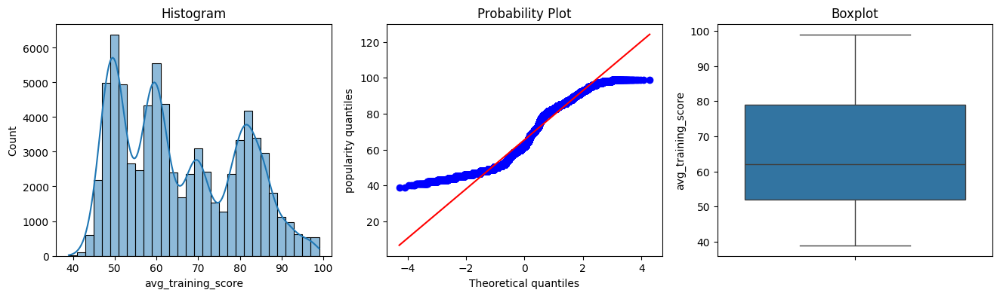

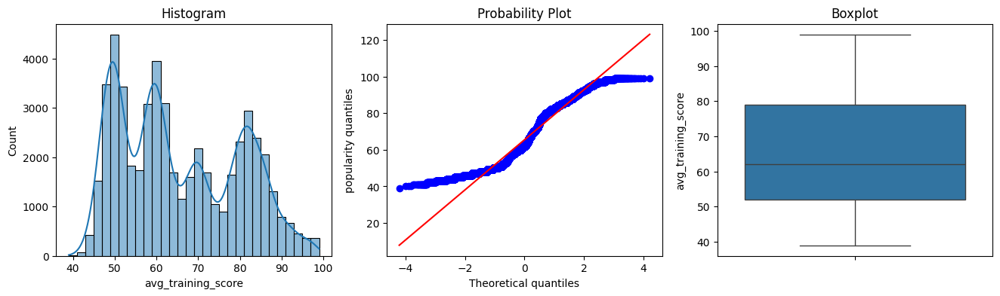

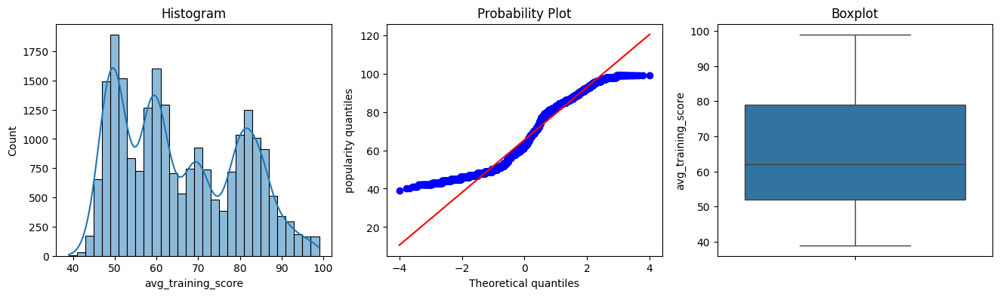

In [5906]:
# print distribution for all numerical columns execept target variable before handling outliers
for col in numerical_columns:
    diagnostic_plots(X_balanced, col)
    diagnostic_plots(X_train_hr, col)
    diagnostic_plots(X_test_hr, col)
    print()
    print()
    print()

### Attempted to cap outliers but it worsens the model performance.

In [5907]:
# windsorizer = Winsorizer(capping_method ='quantiles', 
#                         tail='both', # cap left, right or both tails
#                         fold =0.01,
#                         variables=['age','length_of_service','avg_training_score'])

# windsorizer.fit(X_train_hr)

In [5908]:
# X_train_hr = windsorizer.transform(X_train_hr)
# X_test_hr = windsorizer.transform(X_test_hr)

In [5909]:
# # print distribution after capping for all numerical columns execept target variable
# for col in numerical_columns:
#     diagnostic_plots(X_balanced, col)
#     diagnostic_plots(X_train_hr, col)
#     diagnostic_plots(X_test_hr, col)
#     print()
#     print()
#     print()

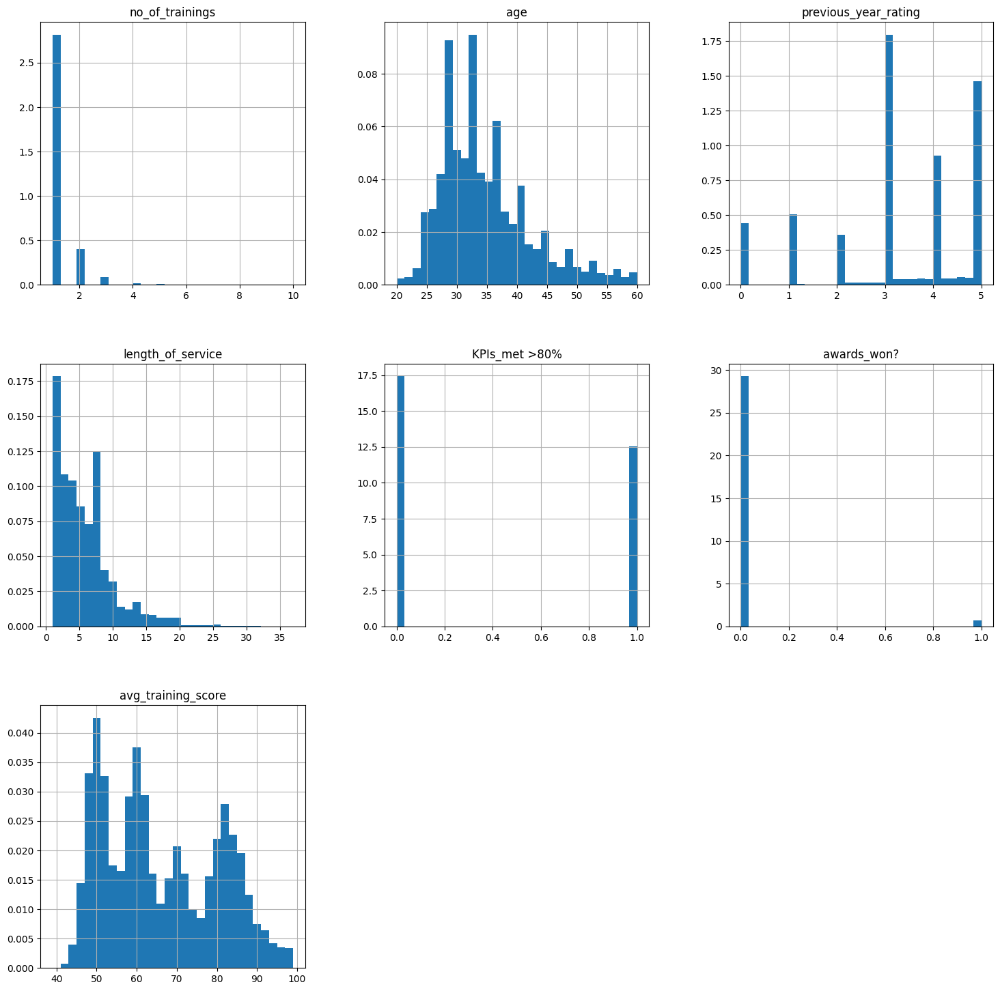

In [5910]:
num_cols = [c for c in X_train_hr.columns if X_train_hr[c].dtypes!='O']
X_train_hr[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

### Numerical Variable Transformation

In [5911]:
numerical_columns = [c for c in X_train_hr.columns if X_train_hr[c].dtypes!='O']

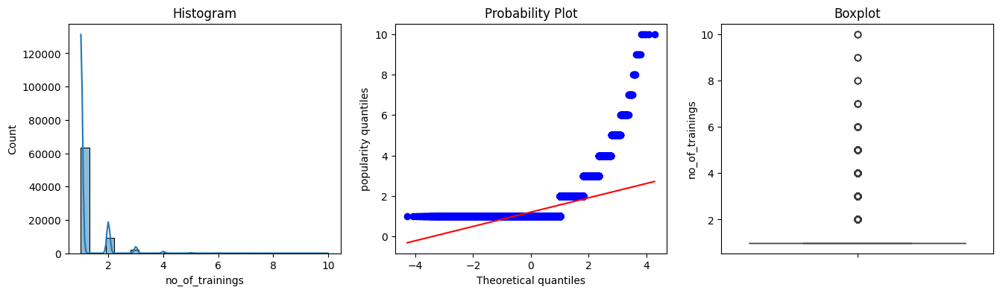

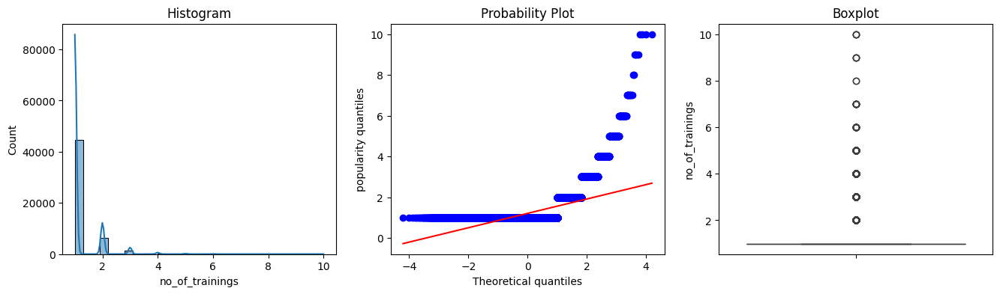

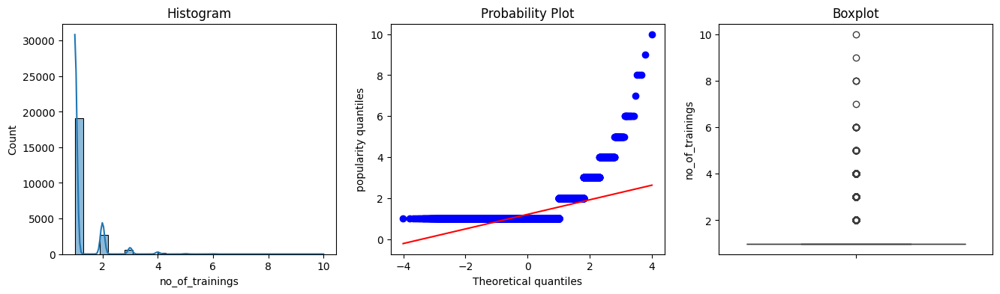

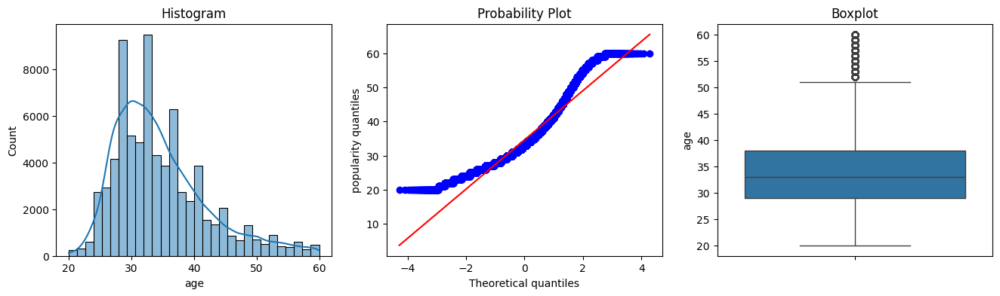

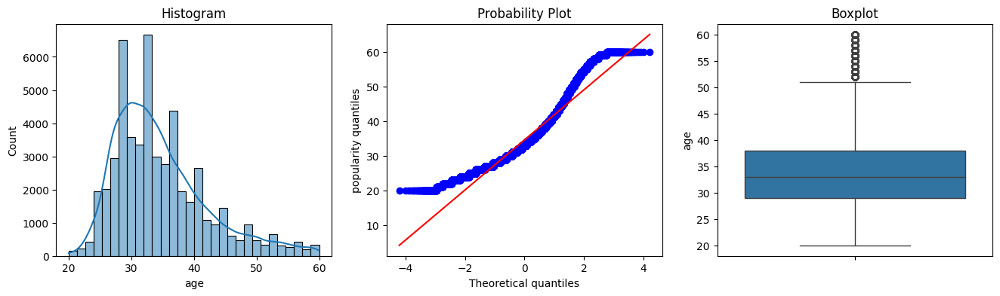

...

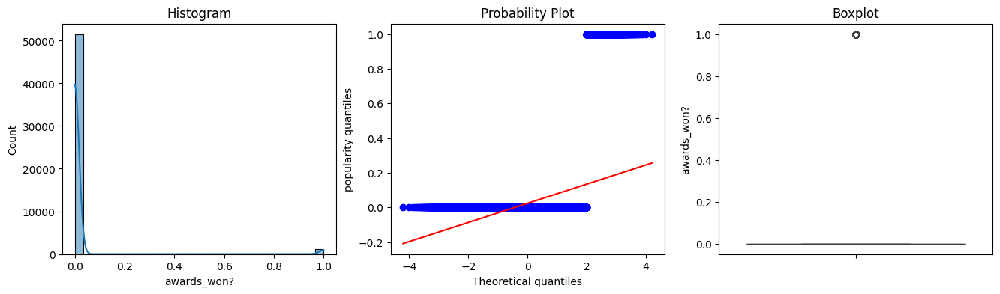

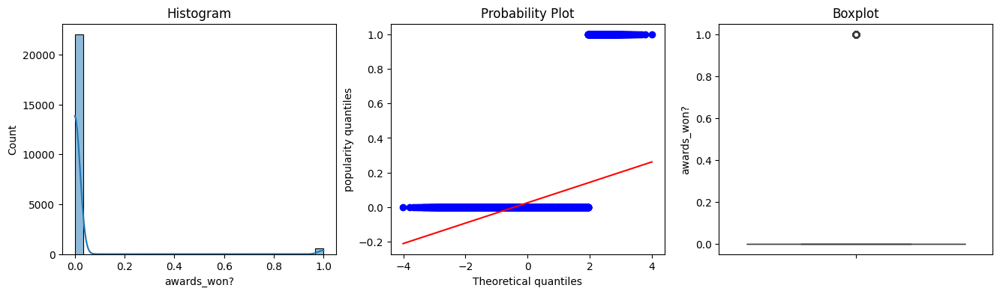

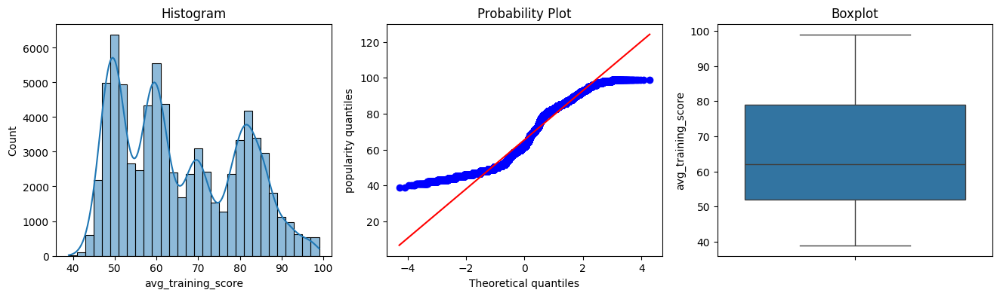

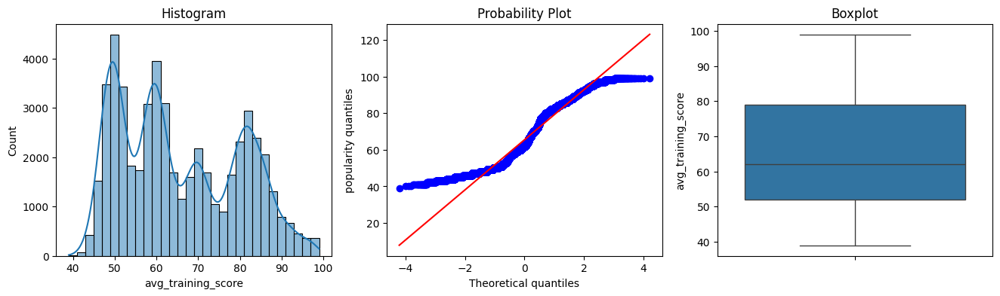

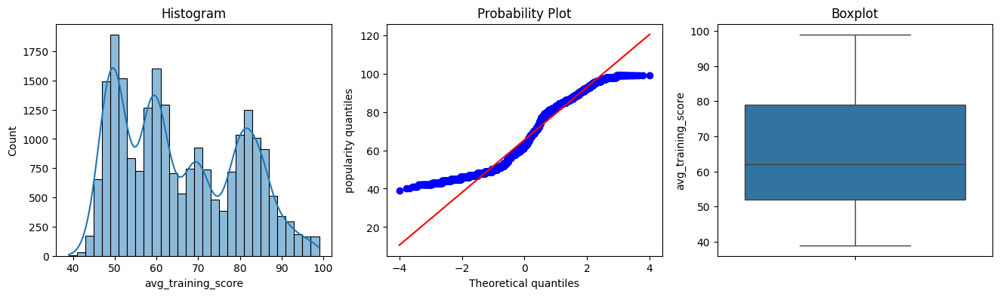

In [5912]:
# print distribution for numerical_columns before transformation
for col in numerical_columns:
    diagnostic_plots(X_balanced, col)
    diagnostic_plots(X_train_hr, col)
    diagnostic_plots(X_test_hr, col)
    print()
    print()
    print()


In [5913]:
# yjt = YeoJohnsonTransformer(variables = ['age','length_of_service','avg_training_score'])

# yjt.fit(X_train_hr)

In [5914]:
# X_train_hr = yjt.transform(X_train_hr)
# X_test_hr = yjt.transform(X_test_hr)

In [5915]:
# yjt.lambda_dict_

In [5916]:
lt = LogTransformer(variables=['age','length_of_service','avg_training_score'])

lt.fit(X_train_hr)

LogTransformer(variables=['age', 'length_of_service', 'avg_training_score'])

In [5917]:
X_train_hr = lt.transform(X_train_hr)
X_test_hr = lt.transform(X_test_hr)

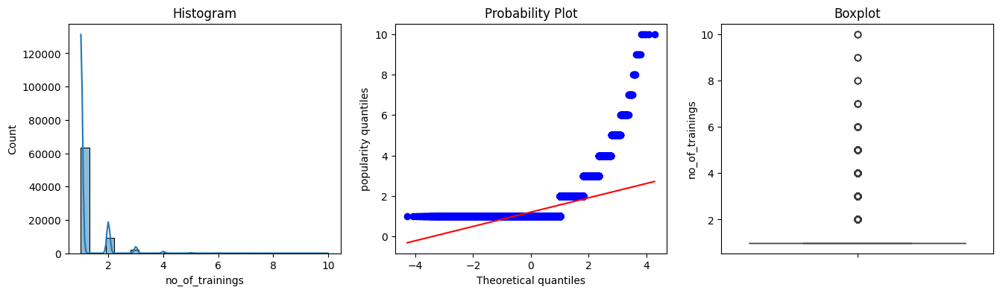

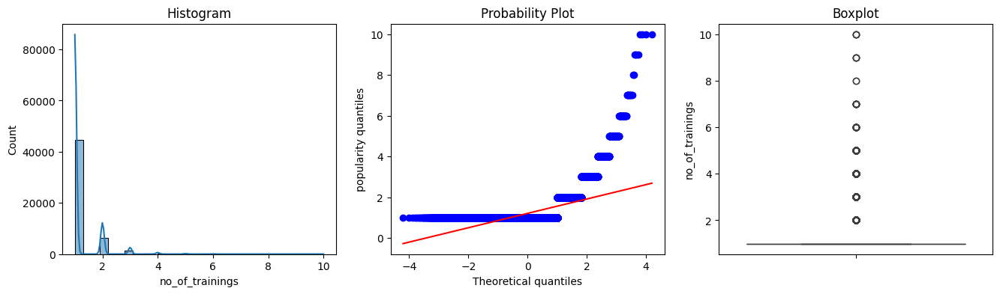

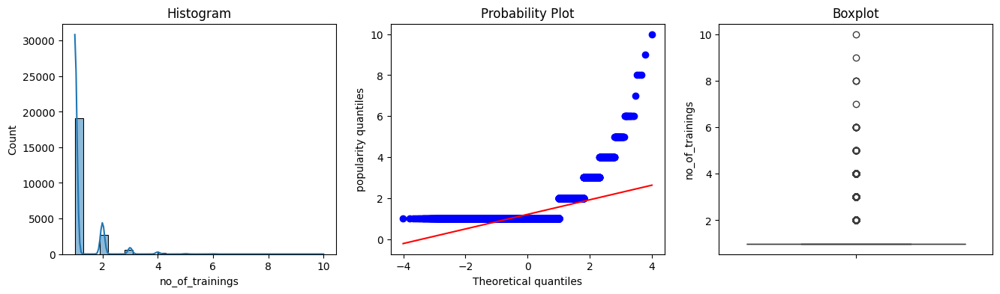

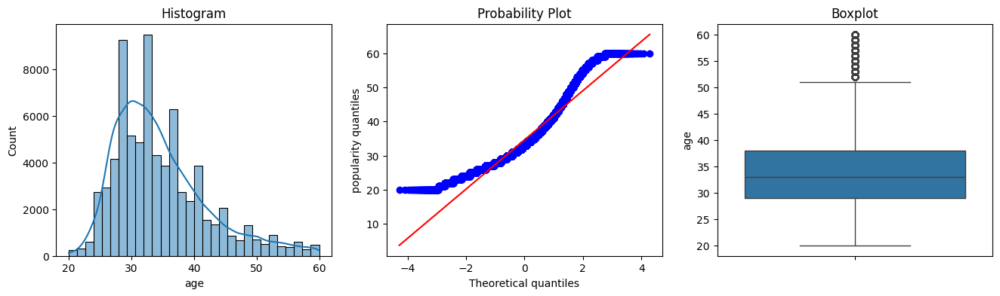

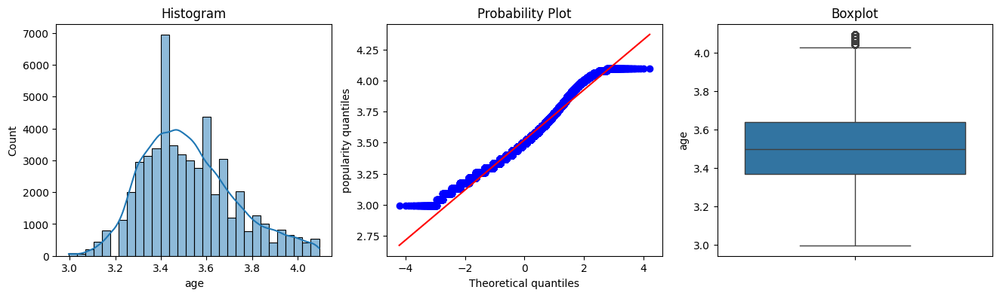

...

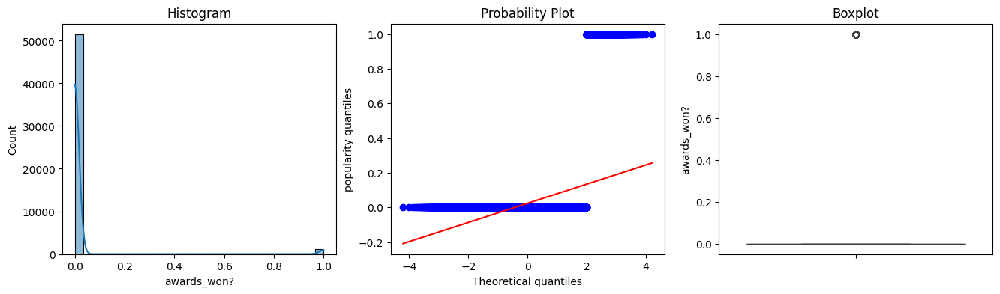

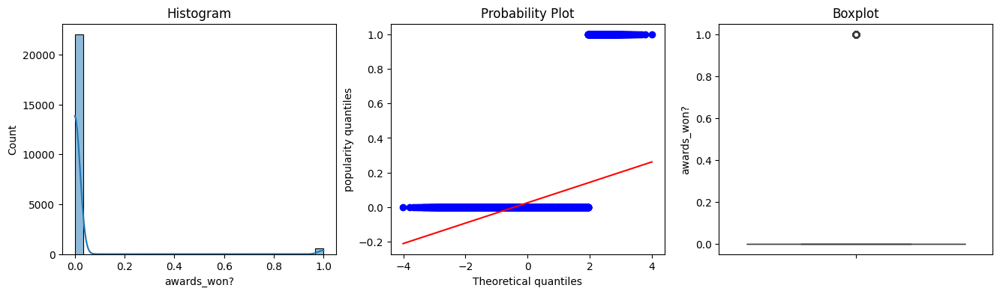

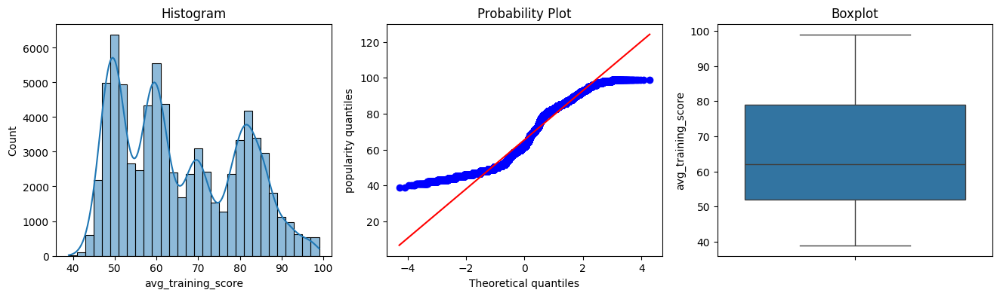

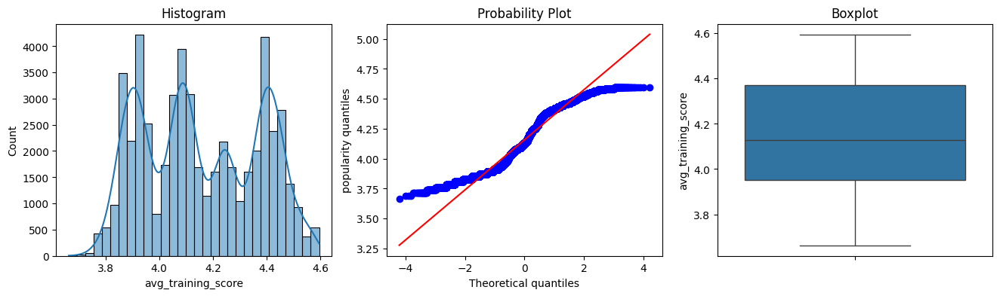

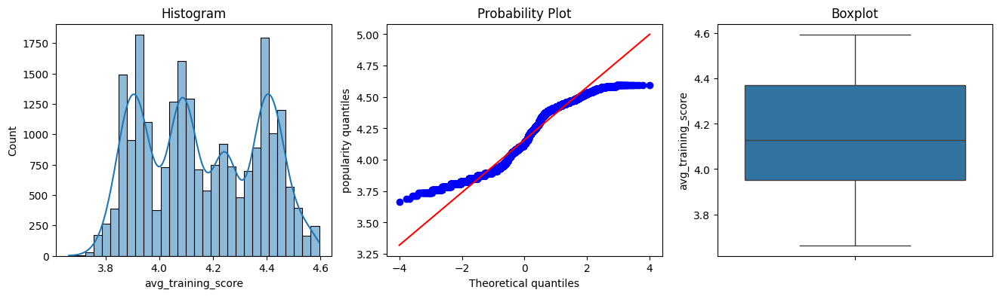

In [5918]:
# print distribution for numerical_columns before transformation
for col in numerical_columns:
    diagnostic_plots(X_balanced, col)
    diagnostic_plots(X_train_hr, col)
    diagnostic_plots(X_test_hr, col)
    print()
    print()
    print()


no_of_trainings         0.0
age                     0.0
previous_year_rating    0.0
length_of_service       0.0
KPIs_met >80%           0.0
awards_won?             0.0
avg_training_score      0.0
dtype: float64


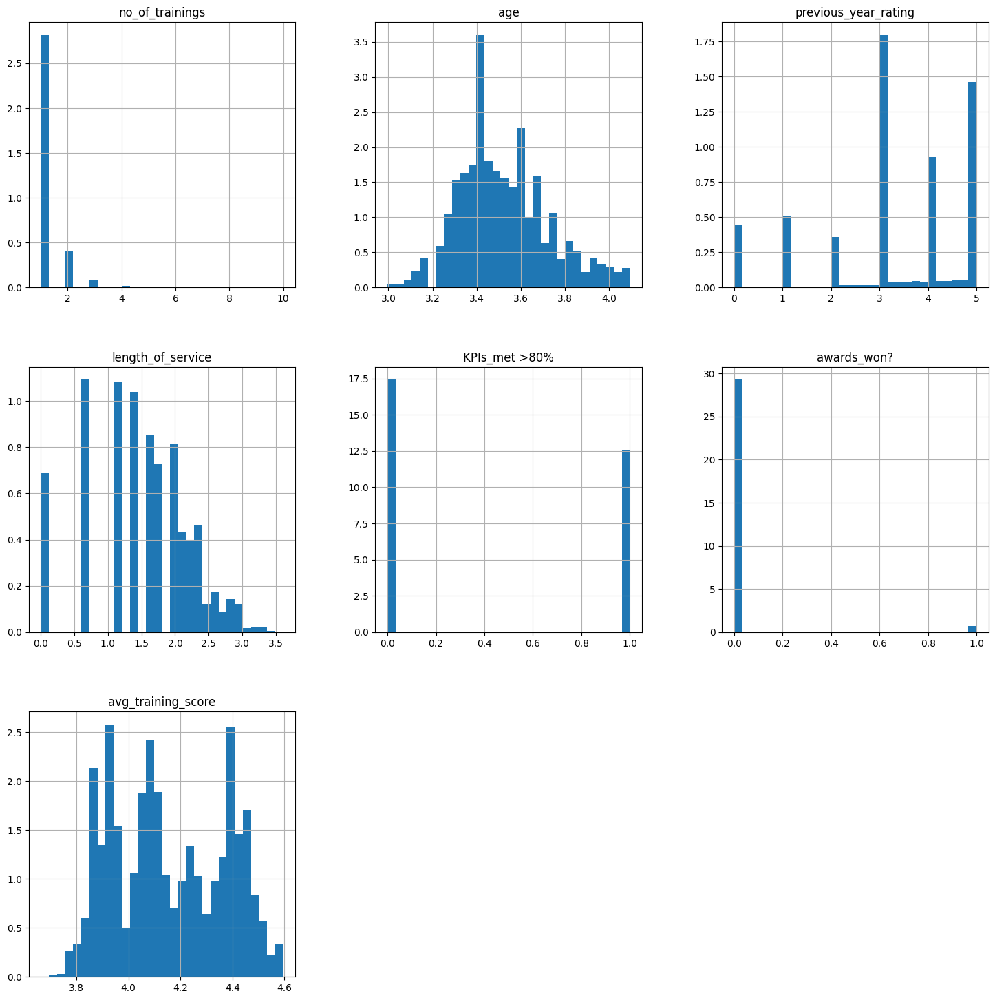

In [5919]:
num_cols = [c for c in X_train_hr.columns if X_train_hr[c].dtypes!='O']
print(X_train_hr[num_cols].isnull().mean())

X_train_hr[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

no_of_trainings         0.0
age                     0.0
previous_year_rating    0.0
length_of_service       0.0
KPIs_met >80%           0.0
awards_won?             0.0
avg_training_score      0.0
dtype: float64


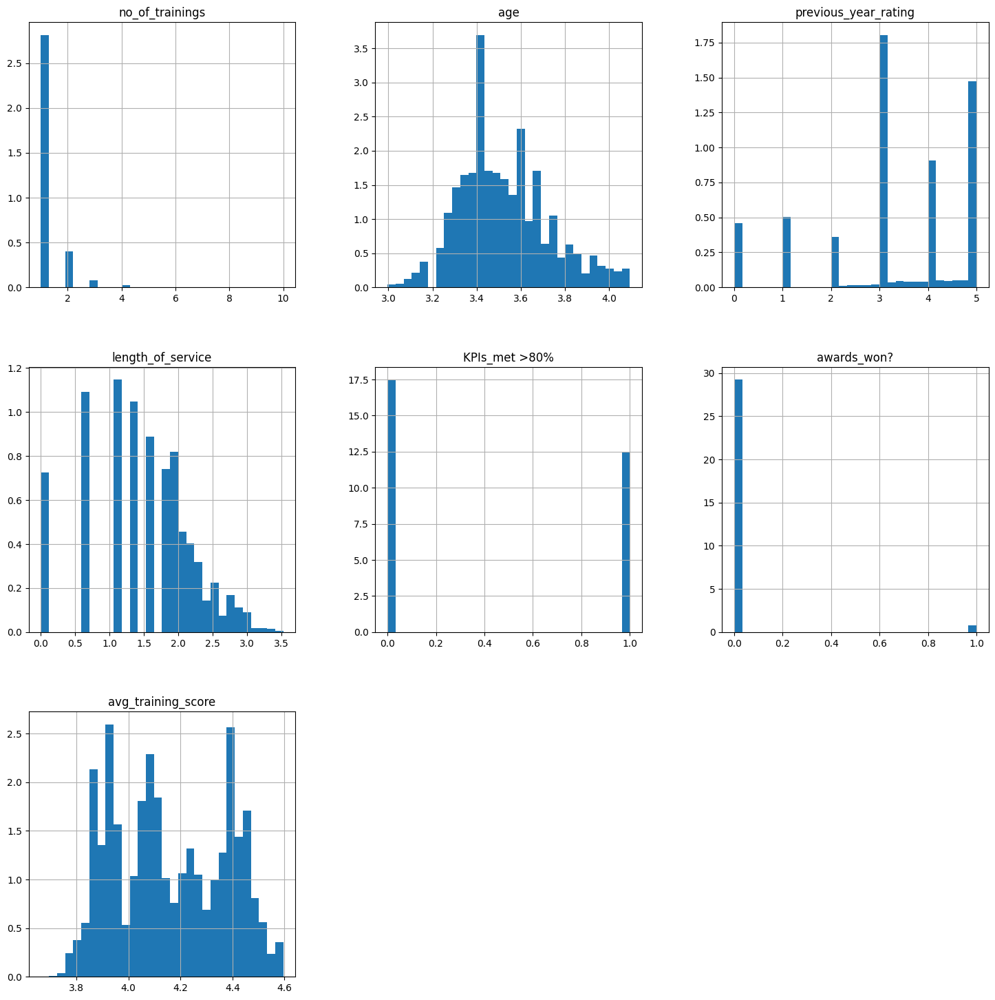

In [5920]:
num_cols = [c for c in X_test_hr.columns if X_test_hr[c].dtypes!='O']
print(X_test_hr[num_cols].isnull().mean())

X_test_hr[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

### Categorical Data Encoding

In [5921]:
X_train_hr.head()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
4907,Analytics,region_14,Bachelor's,m,sourcing,2,3.583519,3.000000,1.098612,0,0,4.454347
25494,Operations,region_13,Bachelor's,f,other,1,3.465736,3.000000,1.609438,0,0,4.204693
74747,Operations,region_2,Bachelor's,m,other,1,3.401197,3.448712,1.791759,1,0,4.043051
16497,Sales & Marketing,region_22,Bachelor's,m,other,1,3.295837,2.000000,1.098612,1,0,3.871201
41261,Operations,region_32,Bachelor's,m,other,1,3.433987,3.000000,1.945910,0,0,4.077537


In [5922]:
X_test_hr.head()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
48646,Analytics,region_22,Bachelor's,f,other,1,3.433987,5.000000,1.945910,0,0,4.382027
39076,Technology,region_2,Bachelor's,m,other,1,3.555348,1.000000,2.079442,0,0,4.382027
27236,Sales & Marketing,region_7,Master's & above,m,sourcing,1,3.931826,4.000000,2.944439,0,0,3.871201
15215,Sales & Marketing,region_4,Bachelor's,f,other,1,3.332205,5.000000,1.386294,0,0,3.951244
68709,Operations,region_22,Bachelor's,m,other,1,3.433987,1.495655,1.791759,1,0,4.025352


In [5923]:
X_train_hr.shape, X_test_hr.shape

((52647, 12), (22563, 12))

In [5924]:
ohe_enc = OneHotEncoder(
    top_categories=None,
    drop_last=True)  # to return k-1, false to return k

ohe_enc.fit(X_train_hr)

ohe_enc.variables

In [5925]:
X_train_hr_ohe = ohe_enc.transform(X_train_hr)
X_test_hr_ohe = ohe_enc.transform(X_test_hr)

In [5926]:
X_train_hr_ohe.head()

,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Operations,department_Sales & Marketing,...,region_region_19,region_region_1,region_region_24,region_region_10,region_region_21,education_Bachelor's,education_Master's & above,gender_m,recruitment_channel_sourcing,recruitment_channel_other
4907,2,3.583519,3.000000,1.098612,0,0,4.454347,1,0,0,...,0,0,0,0,0,1,0,1,1,0
25494,1,3.465736,3.000000,1.609438,0,0,4.204693,0,1,0,...,0,0,0,0,0,1,0,0,0,1
74747,1,3.401197,3.448712,1.791759,1,0,4.043051,0,1,0,...,0,0,0,0,0,1,0,1,0,1
16497,1,3.295837,2.000000,1.098612,1,0,3.871201,0,0,1,...,0,0,0,0,0,1,0,1,0,1
41261,1,3.433987,3.000000,1.945910,0,0,4.077537,0,1,0,...,0,0,0,0,0,1,0,1,0,1


In [5927]:
X_test_hr_ohe.head()

,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Operations,department_Sales & Marketing,...,region_region_19,region_region_1,region_region_24,region_region_10,region_region_21,education_Bachelor's,education_Master's & above,gender_m,recruitment_channel_sourcing,recruitment_channel_other
48646,1,3.433987,5.000000,1.945910,0,0,4.382027,1,0,0,...,0,0,0,0,0,1,0,0,0,1
39076,1,3.555348,1.000000,2.079442,0,0,4.382027,0,0,0,...,0,0,0,0,0,1,0,1,0,1
27236,1,3.931826,4.000000,2.944439,0,0,3.871201,0,0,1,...,0,0,0,0,0,0,1,1,1,0
15215,1,3.332205,5.000000,1.386294,0,0,3.951244,0,0,1,...,0,0,0,0,0,1,0,0,0,1
68709,1,3.433987,1.495655,1.791759,1,0,4.025352,0,1,0,...,0,0,0,0,0,1,0,1,0,1


In [5928]:
X_train_hr_ohe.shape

(52647, 53)

In [5929]:
X_test_hr_ohe.shape

(22563, 53)

### Binning

In [5930]:
num_cols = [c for c in X_train_hr_ohe.columns if X_train_hr_ohe[c].dtypes!='O']
print(X_train_hr_ohe[num_cols].isnull().mean().sort_values())

no_of_trainings                 0.0
region_region_15                0.0
region_region_31                0.0
region_region_8                 0.0
region_region_5                 0.0
region_region_27                0.0
region_region_17                0.0
region_region_25                0.0
region_region_9                 0.0
region_region_12                0.0
region_region_30                0.0
region_region_33                0.0
region_region_16                0.0
region_region_29                0.0
region_region_3                 0.0
region_region_11                0.0
region_region_19                0.0
region_region_1                 0.0
region_region_24                0.0
region_region_10                0.0
region_region_21                0.0
education_Bachelor's            0.0
education_Master's & above      0.0
gender_m                        0.0
region_region_4                 0.0
recruitment_channel_sourcing    0.0
region_region_7                 0.0
region_region_6             

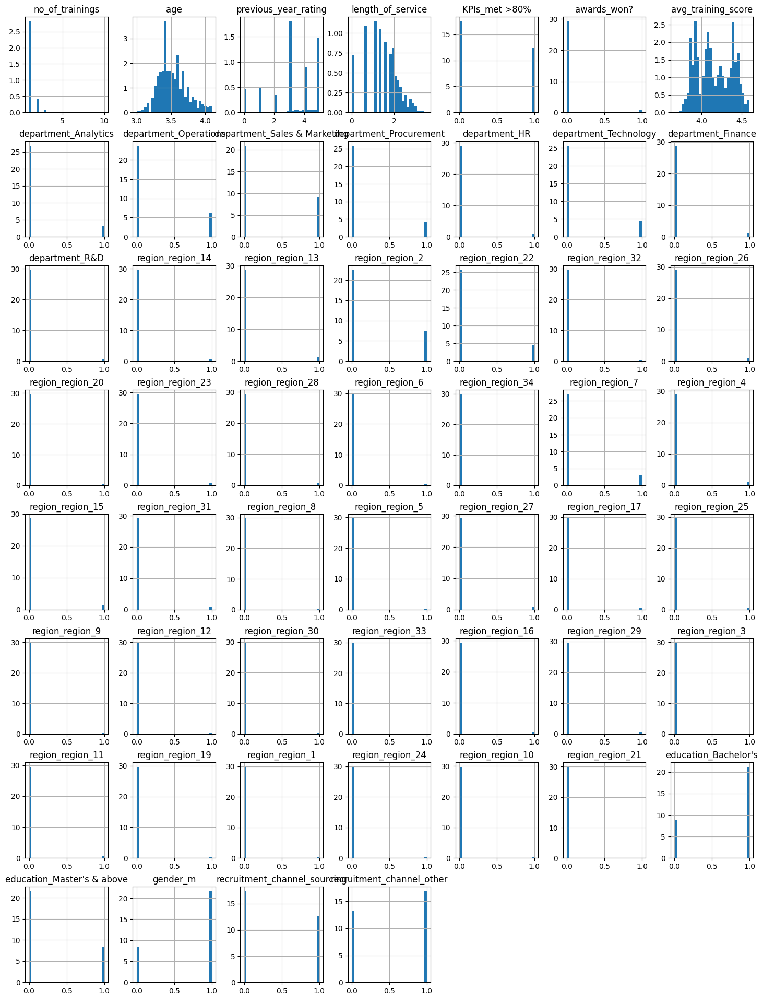

In [5931]:
X_test_hr_ohe.hist(bins=30, figsize=(18,24), density=True)
plt.show()

In [5932]:
# tried to make the distribution look more normal 
disc = EqualWidthDiscretiser(bins=35, variables = ['age']
)

disc.fit(X_train_hr_ohe)

# disc = EqualWidthDiscretiser(bins=35, variables = ['avg_training_score','age','length_of_service']
# )

# disc.fit(X_train_hr_ohe)

EqualWidthDiscretiser(bins=35, variables=['age'])

In [5933]:
disc.binner_dict_

{'age': [-inf,
  3.0271211960873656,
  3.05851011862074,
  3.0898990411541147,
  3.121287963687489,
  3.152676886220864,
  3.184065808754238,
  3.215454731287613,
  3.2468436538209873,
  3.278232576354362,
  3.3096214988877364,
  3.341010421421111,
  3.3723993439544855,
  3.4037882664878603,
  3.4351771890212346,
  3.4665661115546094,
  3.4979550340879837,
  3.5293439566213585,
  3.560732879154733,
  3.5921218016881076,
  3.623510724221482,
  3.6548996467548567,
  3.686288569288231,
  3.717677491821606,
  3.7490664143549806,
  3.780455336888355,
  3.811844259421729,
  3.843233181955104,
  3.8746221044884788,
  3.906011027021853,
  3.9373999495552274,
  3.968788872088602,
  4.000177794621977,
  4.031566717155352,
  4.062955639688726,
  inf]}

In [5934]:
X_train_hr_ohe = disc.transform(X_train_hr_ohe)
X_test_hr_ohe = disc.transform(X_test_hr_ohe)

In [5935]:
# disc = EqualFrequencyDiscretiser(q=20, variables = ['avg_training_score','age','length_of_service'])
                                 
# disc.fit(X_train_hr_ohe)

In [5936]:
# disc.binner_dict_

In [5937]:
# X_train_hr_ohe = disc.transform(X_train_hr_ohe)
# X_test_hr_ohe = disc.transform(X_test_hr_ohe)

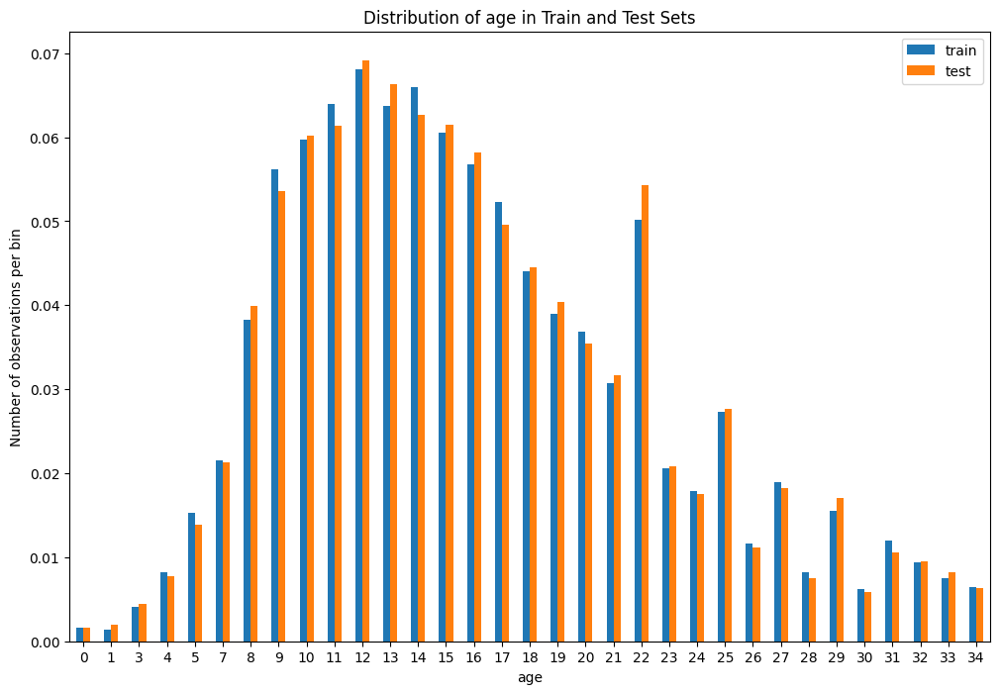

In [5938]:
# list of columns to plot
columns_to_plot = ['age']

for col in columns_to_plot:
    # ccalculate the proportion of observations per bin for training data
    t1 = X_train_hr_ohe.groupby([col])[col].count() / len(X_train_hr_ohe)
    
    # calculate the proportion of observations per bin for test data
    t2 = X_test_hr_ohe.groupby([col])[col].count() / len(X_test_hr_ohe)
    
    # concatenate the results into a single DataFrame
    tmp = pd.concat([t1, t2], axis=1)
    tmp.columns = ['train', 'test']
    
    tmp.plot.bar(figsize=(12,8))
    plt.xticks(rotation=0)
    plt.ylabel('Number of observations per bin')
    plt.title(f'Distribution of {col} in Train and Test Sets')
    plt.show()


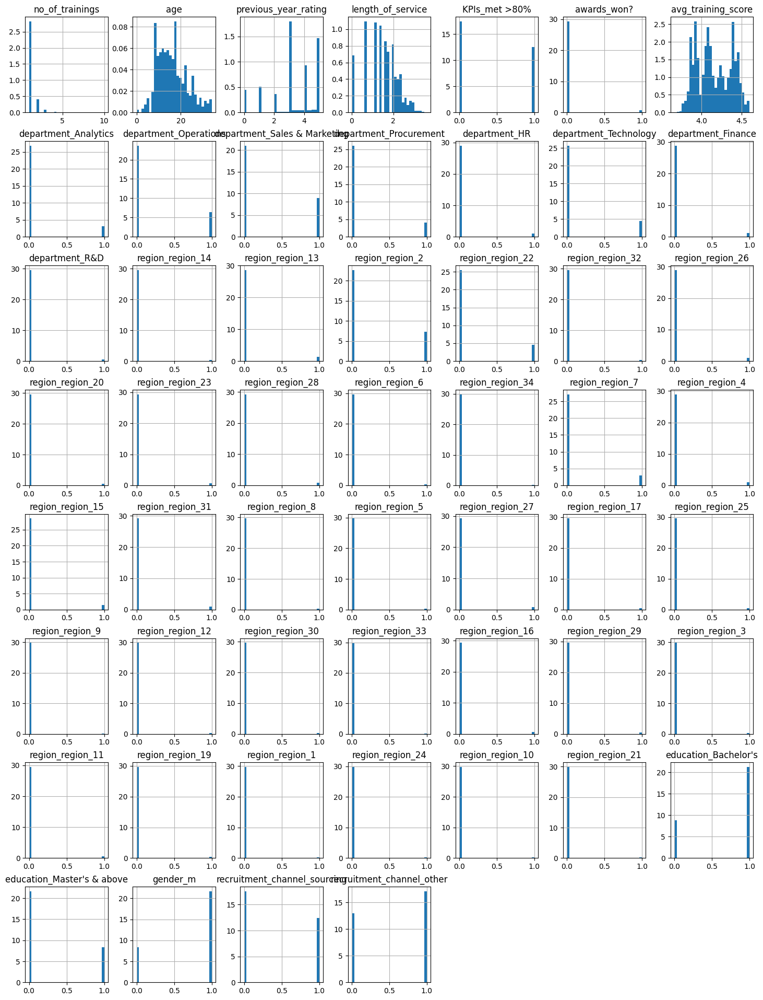

In [5939]:
X_train_hr_ohe.hist(bins=30, figsize=(18,24), density=True)
plt.show()

### Feature Engineering

In [5940]:
# scaler = RobustScaler()

# # fit the scaler to the train set, it will learn the parameters
# scaler.fit(X_train_hr_ohe)

# # transform train and test sets
# X_train_hr_scaled = scaler.transform(X_train_hr_ohe)
# X_test_hr_scaled = scaler.transform(X_test_hr_ohe)

In [5941]:
# scaler.center_

In [5942]:
# scaler.scale_

In [5943]:
# Standard Scaler offers better performance compared to robust scaling
# set up the scaler
scaler = StandardScaler()

# fit the scaler to the train set, it will learn the parameters
scaler.fit(X_train_hr_ohe)

# transform train and test sets
X_train_hr_scaled = scaler.transform(X_train_hr_ohe)
X_test_hr_scaled = scaler.transform(X_test_hr_ohe)

In [5944]:
scaler.mean_

array([1.20223375e+00, 1.60844493e+01, 3.25397035e+00, 1.50092680e+00,
       4.18789295e-01, 2.34011435e-02, 4.15769304e+00, 1.04754307e-01,
       2.12813646e-01, 2.99314301e-01, 1.33549870e-01, 3.34302049e-02,
       1.46390108e-01, 4.02302125e-02, 1.46257147e-02, 1.28592322e-02,
       4.53777043e-02, 2.44382396e-01, 1.48916368e-01, 1.39419150e-02,
       3.56525538e-02, 1.32201265e-02, 2.07799115e-02, 2.44648318e-02,
       1.02000114e-02, 4.17877562e-03, 9.62827891e-02, 3.36961270e-02,
       4.94425133e-02, 2.92514293e-02, 1.11117443e-02, 1.07128611e-02,
       2.72380193e-02, 1.42648204e-02, 1.53854921e-02, 5.66034152e-03,
       7.48380724e-03, 1.04659335e-02, 4.23575892e-03, 2.22994663e-02,
       1.49296256e-02, 6.45810777e-03, 1.88614736e-02, 1.33910764e-02,
       1.06368834e-02, 7.52179611e-03, 1.00480559e-02, 6.19218569e-03,
       7.07694645e-01, 2.79750033e-01, 7.21484605e-01, 4.15009402e-01,
       5.69092256e-01])

In [5945]:
scaler.scale_

array([0.54639826, 6.56335299, 1.49199423, 0.7342965 , 0.49336074,
       0.15117384, 0.21493341, 0.30623658, 0.40929696, 0.45795769,
       0.34016805, 0.17975713, 0.35349688, 0.19649871, 0.12004917,
       0.11266709, 0.20813113, 0.42972042, 0.35600602, 0.1172499 ,
       0.18542235, 0.11421626, 0.14264679, 0.15448723, 0.10047871,
       0.06450824, 0.29497867, 0.18044583, 0.21679011, 0.16851048,
       0.10482497, 0.10294705, 0.16277626, 0.1185805 , 0.12308037,
       0.07502201, 0.08618468, 0.10176639, 0.06494472, 0.14765568,
       0.12127132, 0.08010244, 0.13603572, 0.1149424 , 0.10258528,
       0.0864015 , 0.09973511, 0.07844643, 0.45482187, 0.44887632,
       0.44826841, 0.49272365, 0.49520325])

In [5946]:
X_train_hr_scaled = pd.DataFrame(X_train_hr_scaled, columns=X_train_hr_ohe.columns)
X_test_hr_scaled = pd.DataFrame(X_test_hr_scaled, columns=X_test_hr_ohe.columns)

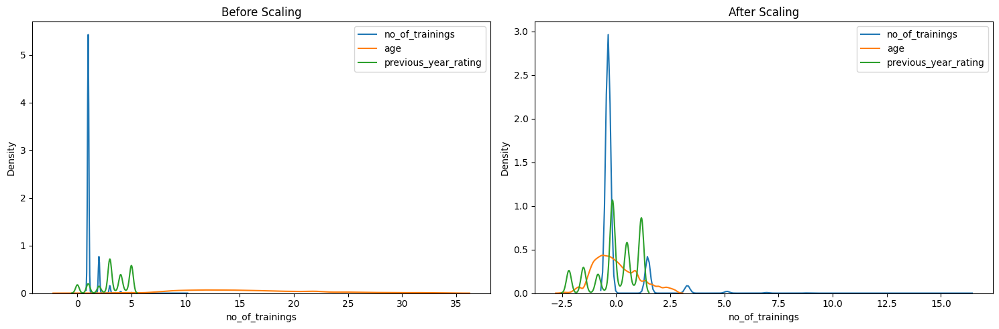

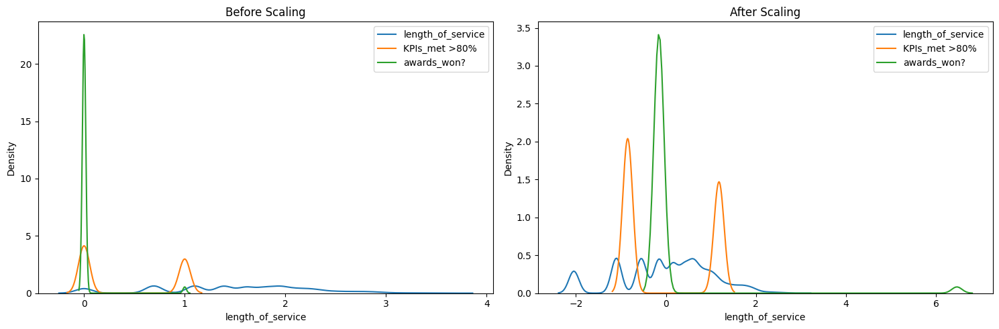

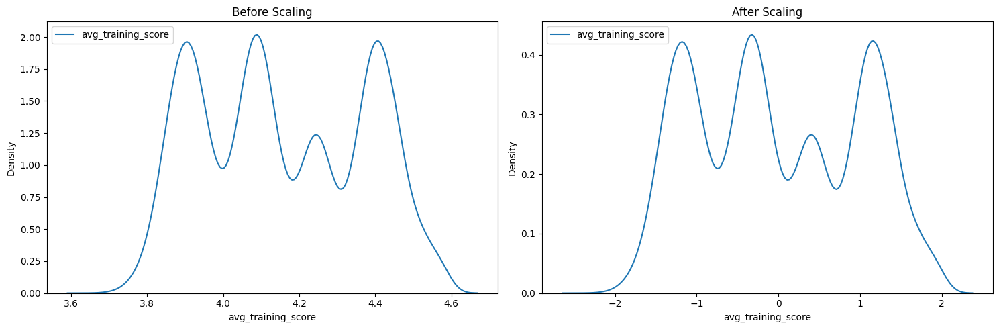

In [5947]:
# plot scaling plots
non_categorical_columns = X_train_hr_ohe.select_dtypes(include=['float64', 'int64']).columns

# define a function to plot KDE plots for a batch of columns
def plot_kde_plots(columns, X_train_listings_ohe, X_train_listings_scaled):
    # Create the figure and axes for plotting
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    
    # plot KDEs for the original data
    for column in columns:
        sns.kdeplot(X_train_listings_ohe[column], ax=axes[0], label=column)
    
    axes[0].set_title('Before Scaling')
    axes[0].legend()
    
    # plot KDEs for the scaled data
    for column in columns:
        sns.kdeplot(X_train_listings_scaled[column], ax=axes[1], label=column)
    
    axes[1].set_title('After Scaling')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# number of columns per batch
batch_size = 3

# loop through non-categorical columns in batches of 3
for i in range(0, len(non_categorical_columns), batch_size):
    batch_columns = non_categorical_columns[i:i + batch_size]
    plot_kde_plots(batch_columns, X_train_hr_ohe, X_train_hr_scaled)


### Polynomial Expansion

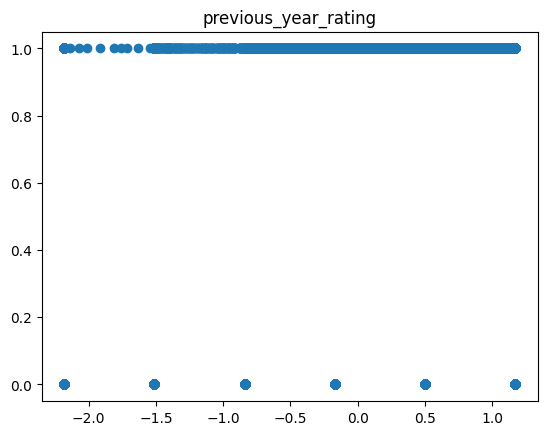

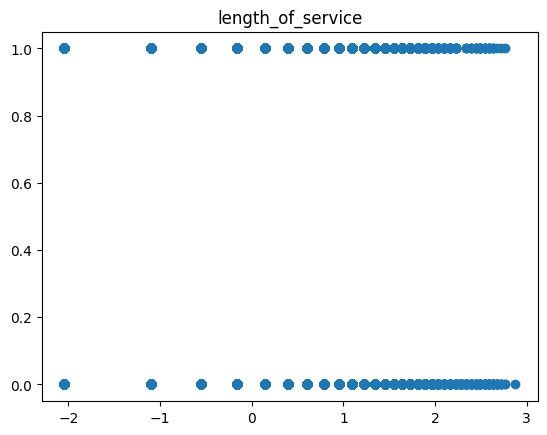

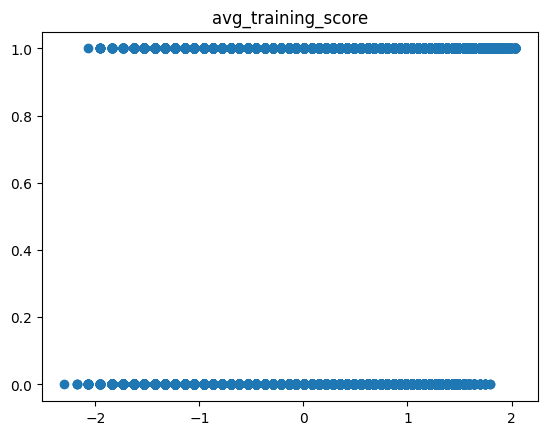

In [5948]:
# plot relation of features of interest with the target

for f in ['previous_year_rating', 'length_of_service', 'avg_training_score']:
    plt.scatter(X_train_hr_scaled[f], y_train_hr)
    plt.title(f)
    plt.show()

In [5949]:
# choose variables with non-linear relationships with the target variable
key_features = ['previous_year_rating', 'length_of_service', 'avg_training_score']

In [5950]:
# set degree to 2
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)

In [5951]:
poly.fit(X_train_hr_scaled[key_features])

PolynomialFeatures(include_bias=False)

In [5952]:
train_t_hr = poly.transform(X_train_hr_scaled[key_features])
test_t_hr = poly.transform(X_test_hr_scaled[key_features])

In [5953]:
poly_features = poly.get_feature_names_out(key_features)

In [5954]:
len(poly.get_feature_names_out(key_features))

9

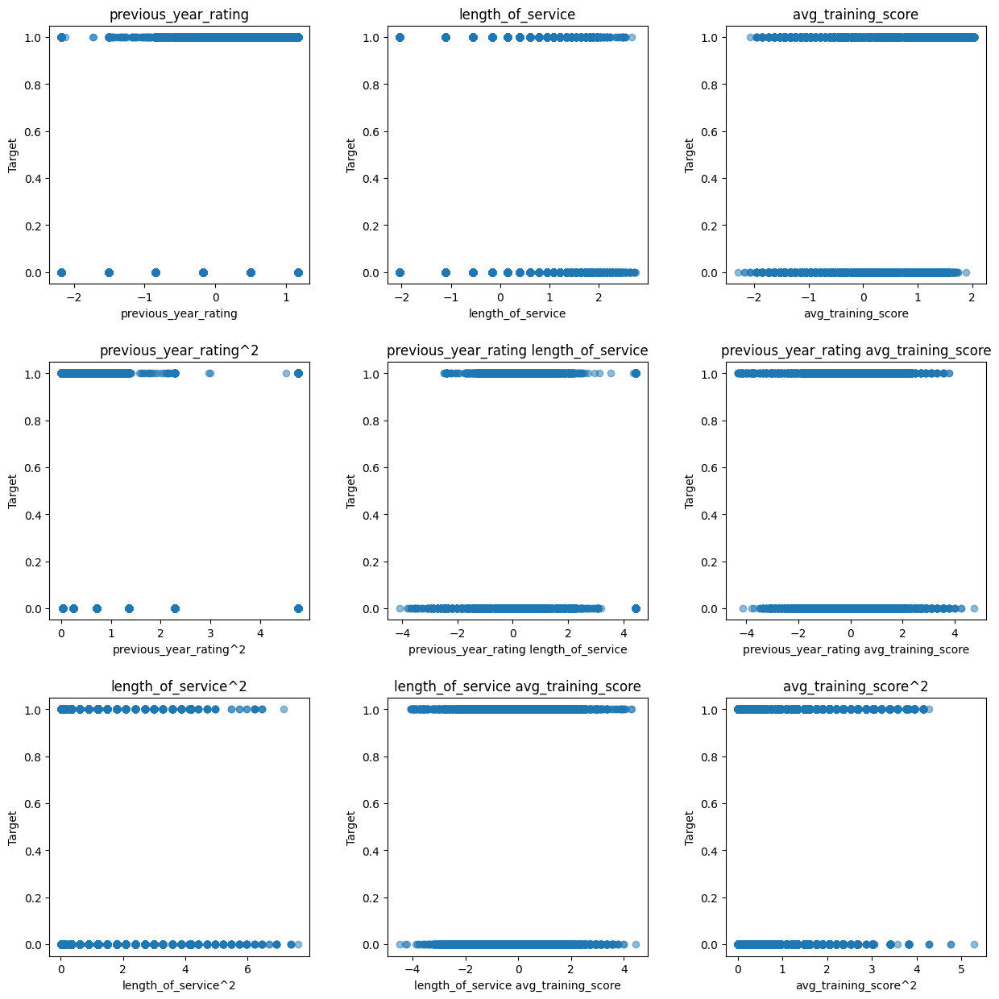

In [5955]:
# capture the returned features in a DataFrame
train_t_hr_df = pd.DataFrame(train_t_hr, columns=poly_features, index=X_train_hr_scaled.index)
test_t_hr_df = pd.DataFrame(test_t_hr, columns=poly_features, index=X_test_hr_scaled.index)

# drop the original key features from scaled dataframes to avoid duplicated column names
X_train_hr_scaled = X_train_hr_scaled.drop(columns=key_features)
X_test_hr_scaled = X_test_hr_scaled.drop(columns=key_features)

# concatenate the polynomial features with the scaled dataframes
X_train_hr_scaled = pd.concat([X_train_hr_scaled, train_t_hr_df], axis=1)
X_test_hr_scaled = pd.concat([X_test_hr_scaled, test_t_hr_df], axis=1)

# define a function to plot features vs target
def plot_features(df, target, poly_features):
    num_features = len(poly_features)
    num_rows = int(np.ceil(num_features / 3))  # Calculate number of rows needed
    
    fig, axs = plt.subplots(num_rows, 3, figsize=(15, num_rows * 5))
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    
    feature_names = poly_features 

    for i in range(num_rows):
        for j in range(3):
            index = i * 3 + j
            if index < len(feature_names):
                feature_name = feature_names[index]
                axs[i, j].scatter(df[feature_name], target, alpha=0.5)
                axs[i, j].set_title(feature_name)
                axs[i, j].set_xlabel(feature_name)
                axs[i, j].set_ylabel('Target')
            else:
                axs[i, j].axis('off')  # Hide unused subplots
    
    plt.show()

plot_features(test_t_hr_df, y_test_hr, poly_features)


In [5956]:
X_train_hr_scaled.head()

,no_of_trainings,age,KPIs_met >80%,awards_won?,department_Analytics,department_Operations,department_Sales & Marketing,department_Procurement,department_HR,department_Technology,...,recruitment_channel_other,previous_year_rating,length_of_service,avg_training_score,previous_year_rating^2,previous_year_rating length_of_service,previous_year_rating avg_training_score,length_of_service^2,length_of_service avg_training_score,avg_training_score^2
0,1.460045,0.291856,-0.848850,-0.154796,2.923379,-0.519949,-0.653585,-0.3926,-0.185974,-0.41412,...,-1.149209,-0.170222,-0.547891,1.380215,0.028976,0.093263,-0.234943,0.300185,-0.756207,1.904993
1,-0.370122,-0.317589,-0.848850,-0.154796,-0.342070,1.923265,-0.653585,-0.3926,-0.185974,-0.41412,...,0.870163,-0.170222,0.147776,0.218670,0.028976,-0.025155,-0.037223,0.021838,0.032314,0.047817
2,-0.370122,-0.622311,1.178064,-0.154796,-0.342070,1.923265,-0.653585,-0.3926,-0.185974,-0.41412,...,0.870163,0.130524,0.396070,-0.533383,0.017037,0.051697,-0.069619,0.156871,-0.211257,0.284497
3,-0.370122,-1.079395,1.178064,-0.154796,-0.342070,-0.519949,1.530023,-0.3926,-0.185974,-0.41412,...,0.870163,-0.840466,-0.547891,-1.332934,0.706383,0.460484,1.120286,0.300185,0.730303,1.776713
4,-0.370122,-0.469950,-0.848850,-0.154796,-0.342070,1.923265,-0.653585,-0.3926,-0.185974,-0.41412,...,0.870163,-0.170222,0.606000,-0.372932,0.028976,-0.103155,0.063481,0.367235,-0.225997,0.139078


In [5957]:
X_test_hr_scaled.head()

,no_of_trainings,age,KPIs_met >80%,awards_won?,department_Analytics,department_Operations,department_Sales & Marketing,department_Procurement,department_HR,department_Technology,...,recruitment_channel_other,previous_year_rating,length_of_service,avg_training_score,previous_year_rating^2,previous_year_rating length_of_service,previous_year_rating avg_training_score,length_of_service^2,length_of_service avg_training_score,avg_training_score^2
0,-0.370122,-0.469950,-0.848850,-0.154796,2.923379,-0.519949,-0.653585,-0.3926,-0.185974,-0.414120,...,0.870163,1.170266,0.606000,1.043735,1.369522,0.709180,1.221448,0.367235,0.632503,1.089384
1,-0.370122,0.139494,-0.848850,-0.154796,-0.342070,-0.519949,-0.653585,-0.3926,-0.185974,2.414759,...,0.870163,-1.510710,0.787849,1.043735,2.282244,-1.190211,-1.576781,0.620706,0.822306,1.089384
2,-0.370122,1.967828,-0.848850,-0.154796,-0.342070,-0.519949,1.530023,-0.3926,-0.185974,-0.414120,...,-1.149209,0.500022,1.965844,-1.332934,0.250022,0.982965,-0.666496,3.864542,-2.620340,1.776713
3,-0.370122,-0.927034,-0.848850,-0.154796,-0.342070,-0.519949,1.530023,-0.3926,-0.185974,-0.414120,...,0.870163,1.170266,-0.156112,-0.960527,1.369522,-0.182692,-1.124072,0.024371,0.149950,0.922612
4,-0.370122,-0.469950,1.178064,-0.154796,-0.342070,1.923265,-0.653585,-0.3926,-0.185974,-0.414120,...,0.870163,-1.178500,0.396070,-0.615732,1.388862,-0.466768,0.725640,0.156871,-0.243873,0.379126


### PCA

In [5958]:
pca = PCA()

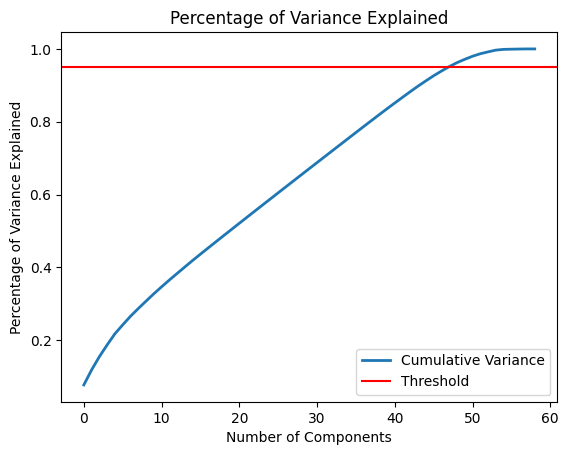

In [5959]:
threshold = 0.95

pca.fit(X_train_hr_scaled)

cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.plot(cumulative_explained_variance, linewidth=2)
plt.axhline(y=threshold, color='red')
plt.title('Percentage of Variance Explained')
plt.xlabel('Number of Components')
plt.ylabel('Percentage of Variance Explained')
plt.legend(['Cumulative Variance', 'Threshold'])
plt.show()

In [5960]:
x_train_hr_final = pca.transform(X_train_hr_scaled)
x_test_hr_final = pca.transform(X_test_hr_scaled)

In [5961]:
print(len(pca.explained_variance_ratio_))
print(pca.explained_variance_ratio_)

59
[7.73206015e-02 4.12586892e-02 3.63485482e-02 3.23694874e-02
 3.05067456e-02 2.43848823e-02 2.35829715e-02 2.11916063e-02
 2.04240996e-02 2.01197868e-02 1.91911837e-02 1.86106765e-02
 1.80960062e-02 1.79433716e-02 1.78152384e-02 1.72431080e-02
 1.71375187e-02 1.70042035e-02 1.69302511e-02 1.68743926e-02
 1.68336688e-02 1.67987369e-02 1.67479712e-02 1.67404942e-02
 1.66931193e-02 1.66675032e-02 1.66443001e-02 1.66249505e-02
 1.66038085e-02 1.65934699e-02 1.65568858e-02 1.65474996e-02
 1.65416309e-02 1.65360277e-02 1.65068327e-02 1.64955536e-02
 1.64453061e-02 1.63477370e-02 1.63401353e-02 1.60500019e-02
 1.58809537e-02 1.56657955e-02 1.55772246e-02 1.52002849e-02
 1.43474583e-02 1.40336410e-02 1.28290012e-02 1.21866433e-02
 1.08515531e-02 9.21360663e-03 8.41127940e-03 6.90976432e-03
 5.17462308e-03 4.77228203e-03 2.02941634e-03 5.12595290e-04
 4.37560972e-04 2.88984112e-04 8.33014957e-06]


Text(0, 0.5, 'Percentage of Variance Explained')

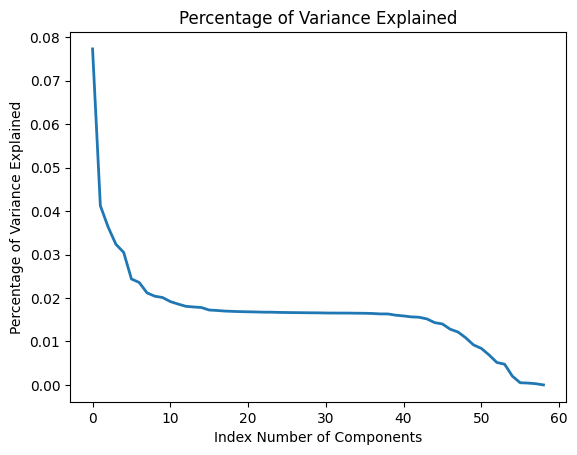

In [5962]:
plt.plot(pca.explained_variance_ratio_, linewidth=2)
plt.title('Percentage of Variance Explained')
plt.xlabel('Index Number of Components')
plt.ylabel('Percentage of Variance Explained')

### 1.3 Correlation Analysis

In [5963]:
hr_data_copy

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0


<Axes: >

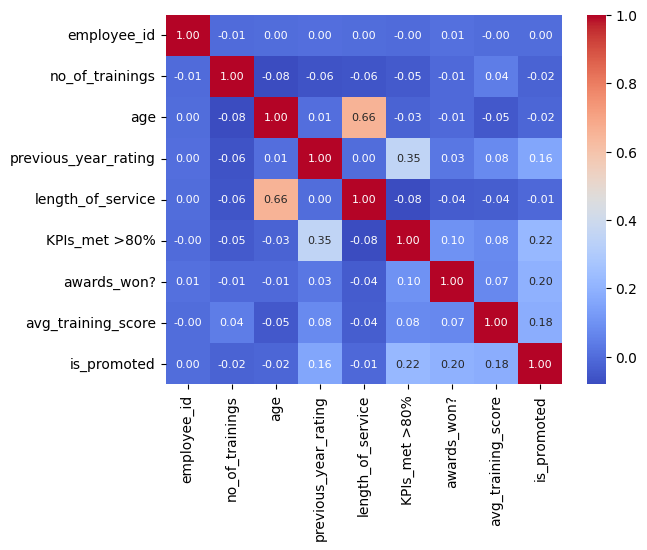

In [5964]:
num_cols = [c for c in hr_data_copy.columns if hr_data_copy[c].dtypes!='O']
correlation_matrix = hr_data_copy[num_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})


<Axes: >

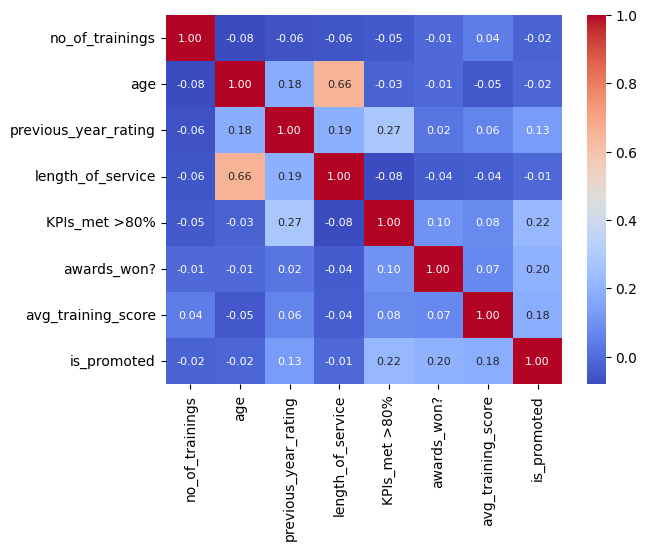

In [5965]:
num_cols = [c for c in hr_data.columns if hr_data[c].dtypes!='O']
correlation_matrix = hr_data[num_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})


In [5966]:
x_train_hr_final = pd.DataFrame(x_train_hr_final)
x_test_hr_final = pd.DataFrame(x_test_hr_final)

In [5967]:
column_names = X_train_hr_scaled.columns
x_train_hr_final.columns = column_names
x_test_hr_final.columns = column_names

### 1.4 Export the data

In [5968]:
# export the final datasets
x_train_hr_final.to_csv('hr_data_new_train.csv', index=False)
x_test_hr_final.to_csv('hr_data_new_test.csv', index=False)


### 1.5 Modeling

In [5969]:
X_train_student_final_premodel_version = x_train_hr_final
X_test_student_final_premodel_version = x_test_hr_final

y_train_student_final_premodel_version = y_train_hr
y_test_student_final_premodel_version = y_test_hr

In [5970]:
X_train_final = X_train_student_final_premodel_version
X_test_final = X_test_student_final_premodel_version

y_train_final = y_train_student_final_premodel_version
y_test_final = y_test_student_final_premodel_version

In [5971]:
#Fit the logistic regression model
logreg = LogisticRegression(solver='lbfgs') # seems to work here after scaling default sets to binary since target is dichotomous
logreg.fit(X_train_final, y_train_final)

LogisticRegression()

In [5972]:
y_train_preds_logreg = logreg.predict(X_train_final)
y_test_preds_logreg = logreg.predict(X_test_final)

In [5973]:
# Train accuracy score
y_true_train = y_train_final
y_pred_train = y_train_preds_logreg

train_accuracy_logreg = accuracy_score(y_true_train, y_pred_train)
print(f"The LogReg Model's accuracy on train data is {train_accuracy_logreg}")

# Test accuracy score
y_true_test = y_test_final
y_pred_test = y_test_preds_logreg

test_accuracy_logreg = accuracy_score(y_true_test, y_pred_test)
print(f"The LogReg Model's accuracy on test data is {test_accuracy_logreg}")

print()
# Train precision score
train_precision_logreg = precision_score(y_true_train, y_pred_train)
print(f"The LogReg Model's precision on train data is {train_precision_logreg}")

# Test precision score
test_precision_logreg = precision_score(y_true_test, y_pred_test)
print(f"The LogReg Model's precision on test data is {test_precision_logreg}")

print()
# Train recall score
train_recall_logreg = recall_score(y_true_train, y_pred_train)
print(f"The LogReg Model's recall on train data is {train_recall_logreg}")

# Test recall score
test_recall_logreg = recall_score(y_true_test, y_pred_test)
print(f"The LogReg Model's recall on test data is {test_recall_logreg}")

print()
#Train f1 score
train_f1_logreg = f1_score(y_true_train, y_pred_train)
print(f"The LogReg Model's F1-score on train data is {train_f1_logreg}")

#Test f1 score
test_f1_logreg = f1_score(y_true_test, y_pred_test)
print(f"The LogReg Model's F1-score on test data is {test_f1_logreg}")

The LogReg Model's accuracy on train data is 0.7970444659714704
The LogReg Model's accuracy on test data is 0.7986083410893942

The LogReg Model's precision on train data is 0.7274057325264348
The LogReg Model's precision on test data is 0.7325689494886892

The LogReg Model's recall on train data is 0.6241725633417028
The LogReg Model's recall on test data is 0.6265571163530347

The LogReg Model's F1-score on train data is 0.6718466877552901
The LogReg Model's F1-score on test data is 0.6754285714285714


In [5974]:
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.83      0.89      0.85     15017
           1       0.73      0.63      0.68      7546

    accuracy                           0.80     22563
   macro avg       0.78      0.76      0.76     22563
weighted avg       0.79      0.80      0.79     22563



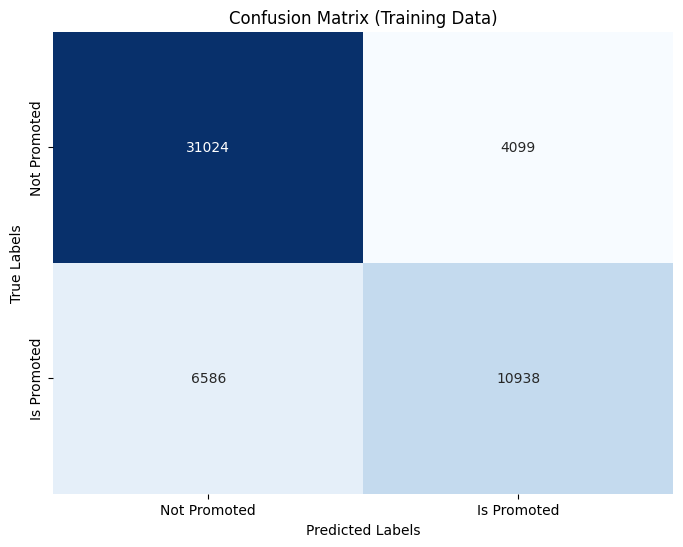

In [5975]:
# plot confusion matrix for train data
conf_matrix_train  = confusion_matrix(y_true_train, y_pred_train)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["Not Promoted", "Is Promoted"], 
            yticklabels=["Not Promoted", "Is Promoted"])

plt.title("Confusion Matrix (Training Data)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

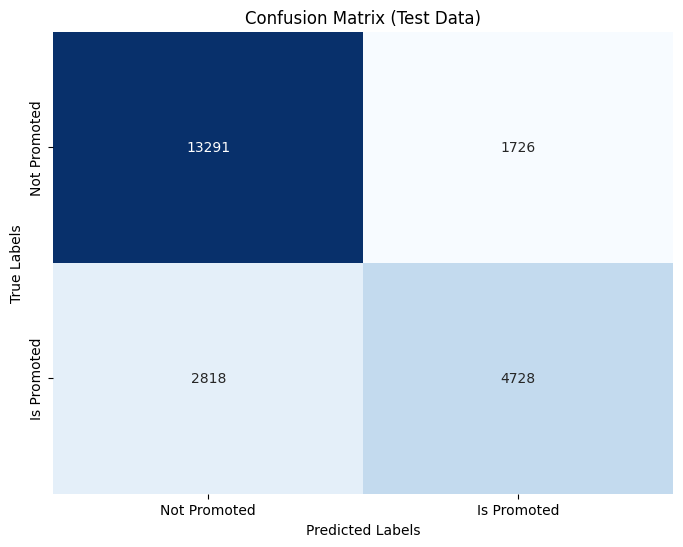

In [5976]:
# plot confusion matrix for train data
conf_matrix_test  = confusion_matrix(y_true_test, y_pred_test)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["Not Promoted", "Is Promoted"], 
            yticklabels=["Not Promoted", "Is Promoted"])

plt.title("Confusion Matrix (Test Data)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

### 1.6 Performance Analysis

In [5977]:
# # pick the modal class from train data
print(stats.mode(y_train_final))

modal_class_label = stats.mode(y_train_final)[0]


# print(f"The modal class label is {int(modal_class_label)}, \
# and the accompanying string value of this label is {y_labels[modal_class_label]}.")

ModeResult(mode=0, count=35123)


In [5978]:
print(type(X_train_final))

<class 'pandas.core.frame.DataFrame'>


In [5979]:
y_train_preds_naive = [int(modal_class_label) for row in X_train_final.iloc[:,0]]
y_train_preds_naive[0:5]

[0, 0, 0, 0, 0]

In [5980]:
y_test_preds_naive = [int(modal_class_label) for row in X_test_final.iloc[:,0]]
y_test_preds_naive[0:5]

[0, 0, 0, 0, 0]

In [5981]:
# # train accuracy score
y_true_train = y_train_final
y_pred_train = y_train_preds_naive

train_accuracy_naive = accuracy_score(y_true_train, y_pred_train) 
print(f"The Naive Baseline Model's accuracy on train data is {train_accuracy_naive:.2f}.")

# test accuracy score
y_true_test = y_test_final
y_pred_test = y_test_preds_naive

test_accuracy_naive = accuracy_score(y_true_test, y_pred_test) 
print(f"The Naive Baseline Model's accuracy on test data is {test_accuracy_naive:.2f}.")

# train precision score
train_precision_naive = precision_score(y_true_train, y_train_preds_naive)
print(f"The Naive Baseline Model's precision on train data is {train_precision_naive:.2f}") 

# test precision score
test_precision_naive = precision_score(y_true_test, y_test_preds_naive)
print(f"The Naive Baseline Model's precision on test data is {test_precision_naive:.2f}")

# train recall score
train_recall_naive = recall_score(y_true_train, y_train_preds_naive)
print(f"The Naive Baseline Model's recall on train data is {train_recall_naive:.2f}")

# test recall score
test_recall_naive = recall_score(y_true_test, y_test_preds_naive)
print(f"The Naive Baseline Model's recall on test data is {test_recall_naive:.2f}")

# train f1 score
train_f1_naive = f1_score(y_true_train, y_train_preds_naive)
print(f"The Naive Baseline Model's F1-score on train data is {train_f1_naive:.2f}")

# test f1 score
test_f1_naive = f1_score(y_true_test, y_test_preds_naive)
print(f"The Naive Baseline Model's F1-score on test data is {test_f1_naive:.2f}")

The Naive Baseline Model's accuracy on train data is 0.67.
The Naive Baseline Model's accuracy on test data is 0.67.
The Naive Baseline Model's precision on train data is 0.00
The Naive Baseline Model's precision on test data is 0.00
The Naive Baseline Model's recall on train data is 0.00
The Naive Baseline Model's recall on test data is 0.00
The Naive Baseline Model's F1-score on train data is 0.00
The Naive Baseline Model's F1-score on test data is 0.00


c:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [5982]:
y_train_hr = y_train_hr.reset_index(drop=True)
X_train_final = X_train_final.reset_index(drop=True)

lg2 = sm.Logit(y_train_hr, sm.add_constant(X_train_final)).fit()
lg2.summary()

Optimization terminated successfully.
         Current function value: 0.414314
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:            is_promoted   No. Observations:                52647
Model:                          Logit   Df Residuals:                    52587
Method:                           MLE   Df Model:                           59
Date:                Sun, 08 Dec 2024   Pseudo R-squ.:                  0.3488
Time:                        22:08:02   Log-Likelihood:                -21812.
converged:                       True   LL-Null:                       -33493.
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
const                                      -0.9631      0.014    -67.559      0.000      -0.991      -0.935
no_of_trainings                            -0.0735      0.006    -13.000      0.000      -0.085      -0.062
age                                         0.0193      0.007      2.576      0.010       0.005       0.034
KPIs_met >80%                               0.4879      0.009     53.095      0.000       0.470       0.506
awards_won?                                 0.0465      0.009      5.453      0.000       0.030       0.063
department_Analytics                       -0.2158      0.010    -22.661      0.000      -0.234      -0.197
department_Operations                       0.3211      0.010     32.238      0.000       0.302       0.341
department_Sales & Marketing                0.0255      0.011      2.425      0.015       0.005       0.046
department_Procurement                      0.0698      0.011      6.461      0.000       0.049       0.091
department_HR                               0.0651      0.011      5.693      0.000       0.043       0.087
department_Technology                       0.9849      0.014     68.166      0.000       0.957       1.013
department_Finance                          0.6682      0.013     50.677      0.000       0.642       0.694
department_R&D                              0.3543      0.014     25.880      0.000       0.327       0.381
region_region_14                            0.2001      0.012     16.906      0.000       0.177       0.223
region_region_13                           -0.2888      0.013    -22.577      0.000      -0.314      -0.264
region_region_2                             0.0263      0.013      2.031      0.042       0.001       0.052
region_region_22                            0.0232      0.012      1.911      0.056      -0.001       0.047
region_region_32                            0.0549      0.012      4.453      0.000       0.031       0.079
region_region_26                           -0.0605      0.013     -4.804      0.000      -0.085      -0.036
region_region_20                           -0.0069      0.012     -0.559      0.576      -0.031       0.017
region_region_23                           -0.0129      0.013     -0.980      0.327      -0.039       0.013
region_region_28                            0.0396      0.013      3.099      0.002       0.015       0.065
region_region_6                             0.0344      0.013      2.637      0.008       0.009       0.060
region_region_34                           -0.0585      0.013     -4.447      0.000      -0.084      -0.033
region_region_7                             0.0191      0.014      1.381      0.167      -0.008       0.046
region_region_4                            -0.0203      0.013     -1.523      0.128      -0.046       0.006
region_region_15                           -0.0181      0.013     -1.437      0.151      -0.043       0.007
r

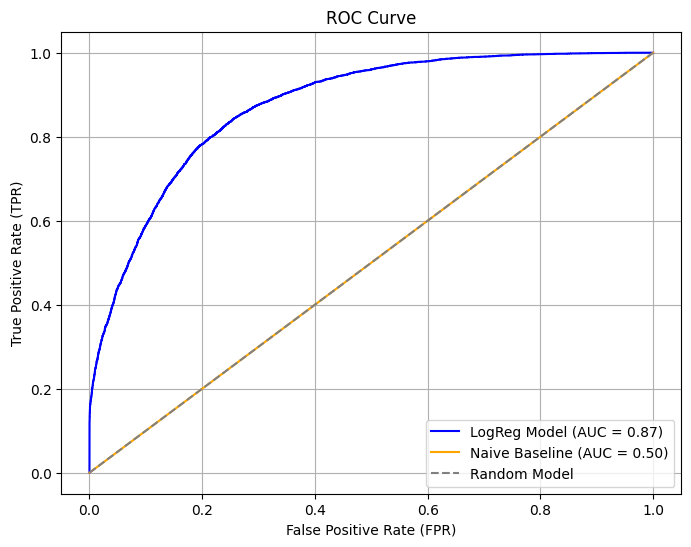

In [5983]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Logistic Regression ROC Curve
logreg_y_scores = logreg.predict_proba(X_test_final)[:, 1]  # Probabilities for the positive class
logreg_fpr, logreg_tpr, logreg_thresholds = roc_curve(y_test_final, logreg_y_scores)
logreg_auc = roc_auc_score(y_test_final, logreg_y_scores)

# Naive Baseline ROC Curve
# Since the naive model predicts a constant value, the scores will be the same for all predictions.
naive_y_scores = [modal_class_label] * len(y_test_final)  # Same score for all predictions
naive_fpr, naive_tpr, naive_thresholds = roc_curve(y_test_final, naive_y_scores)
naive_auc = roc_auc_score(y_test_final, naive_y_scores)

# Plotting
plt.figure(figsize=(8, 6))
plt.plot(logreg_fpr, logreg_tpr, label=f'LogReg Model (AUC = {logreg_auc:.2f})', color='blue')
plt.plot(naive_fpr, naive_tpr, label=f'Naive Baseline (AUC = {naive_auc:.2f})', color='orange')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Model')  # Reference line
plt.title('ROC Curve')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


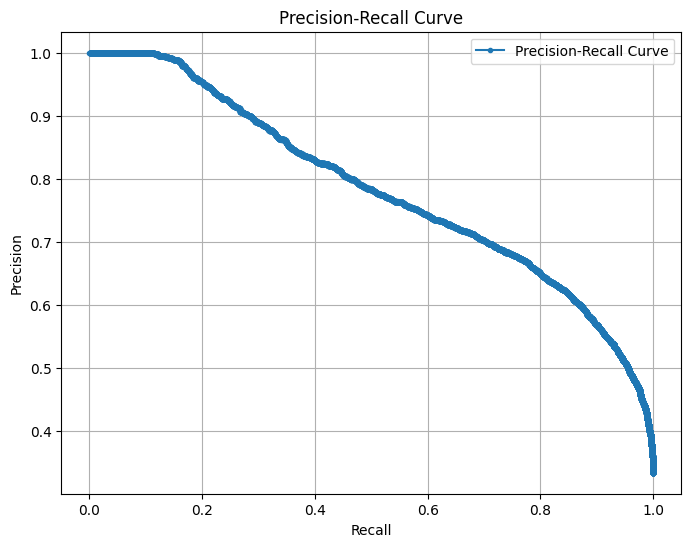

In [5984]:
# precision recall plot
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

y_scores = logreg.predict_proba(X_test_final)[:, 1] 
precision, recall, thresholds = precision_recall_curve(y_true_test, y_scores)

# Plot the curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

In [5985]:
# vif
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["features"] = X_train_final.columns
vif["VIF"] = [variance_inflation_factor(X_train_final.values, i) for i in range(X_train_final.shape[1])]
print(vif)



                                   features  VIF
0                           no_of_trainings  1.0
1                                       age  1.0
2                             KPIs_met >80%  1.0
3                               awards_won?  1.0
4                      department_Analytics  1.0
5                     department_Operations  1.0
6              department_Sales & Marketing  1.0
7                    department_Procurement  1.0
8                             department_HR  1.0
9                     department_Technology  1.0
10                       department_Finance  1.0
11                           department_R&D  1.0
12                         region_region_14  1.0
13                         region_region_13  1.0
14                          region_region_2  1.0
15                         region_region_22  1.0
16                         region_region_32  1.0
17                         region_region_26  1.0
18                         region_region_20  1.0
19                  

In [5986]:
y_train_hr = y_train_hr.reset_index(drop=True)
X_train_final = X_train_final.reset_index(drop=True)

lg2 = sm.Logit(y_train_hr, sm.add_constant(X_train_final)).fit()
lg2.summary()

Optimization terminated successfully.
         Current function value: 0.414314
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:            is_promoted   No. Observations:                52647
Model:                          Logit   Df Residuals:                    52587
Method:                           MLE   Df Model:                           59
Date:                Sun, 08 Dec 2024   Pseudo R-squ.:                  0.3488
Time:                        22:08:16   Log-Likelihood:                -21812.
converged:                       True   LL-Null:                       -33493.
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
const                                      -0.9631      0.014    -67.559      0.000      -0.991      -0.935
no_of_trainings                            -0.0735      0.006    -13.000      0.000      -0.085      -0.062
age                                         0.0193      0.007      2.576      0.010       0.005       0.034
KPIs_met >80%                               0.4879      0.009     53.095      0.000       0.470       0.506
awards_won?                                 0.0465      0.009      5.453      0.000       0.030       0.063
department_Analytics                       -0.2158      0.010    -22.661      0.000      -0.234      -0.197
department_Operations                       0.3211      0.010     32.238      0.000       0.302       0.341
department_Sales & Marketing                0.0255      0.011      2.425      0.015       0.005       0.046
department_Procurement                      0.0698      0.011      6.461      0.000       0.049       0.091
department_HR                               0.0651      0.011      5.693      0.000       0.043       0.087
department_Technology                       0.9849      0.014     68.166      0.000       0.957       1.013
department_Finance                          0.6682      0.013     50.677      0.000       0.642       0.694
department_R&D                              0.3543      0.014     25.880      0.000       0.327       0.381
region_region_14                            0.2001      0.012     16.906      0.000       0.177       0.223
region_region_13                           -0.2888      0.013    -22.577      0.000      -0.314      -0.264
region_region_2                             0.0263      0.013      2.031      0.042       0.001       0.052
region_region_22                            0.0232      0.012      1.911      0.056      -0.001       0.047
region_region_32                            0.0549      0.012      4.453      0.000       0.031       0.079
region_region_26                           -0.0605      0.013     -4.804      0.000      -0.085      -0.036
region_region_20                           -0.0069      0.012     -0.559      0.576      -0.031       0.017
region_region_23                           -0.0129      0.013     -0.980      0.327      -0.039       0.013
region_region_28                            0.0396      0.013      3.099      0.002       0.015       0.065
region_region_6                             0.0344      0.013      2.637      0.008       0.009       0.060
region_region_34                           -0.0585      0.013     -4.447      0.000      -0.084      -0.033
region_region_7                             0.0191      0.014      1.381      0.167      -0.008       0.046
region_region_4                            -0.0203      0.013     -1.523      0.128      -0.046       0.006
region_region_15                           -0.0181      0.013     -1.437      0.151      -0.043       0.007
r

In [5987]:
# drop columns with p-value > 0.05
X_train_final = X_train_final.drop(\
    columns=["department_Procurement", "region_region_20", "region_region_23", "region_region_6",\
              "region_region_7", "region_region_4", "region_region_15", "region_region_31", "region_region_8",\
                  "region_region_17", "region_region_9", "region_region_12", "region_region_30", \
                    "region_region_33", "education_Master's & above", "avg_training_score^2"])

X_test_final = X_test_final.drop(\
    columns=["department_Procurement", "region_region_20", "region_region_23", "region_region_6",\
              "region_region_7", "region_region_4", "region_region_15", "region_region_31", "region_region_8",\
                  "region_region_17", "region_region_9", "region_region_12", "region_region_30", \
                    "region_region_33", "education_Master's & above", "avg_training_score^2"])

y_train_final = y_train_final.drop(\
     columns=["department_Procurement", "region_region_20", "region_region_23", "region_region_6",\
              "region_region_7", "region_region_4", "region_region_15", "region_region_31", "region_region_8",\
                  "region_region_17", "region_region_9", "region_region_12", "region_region_30", \
                    "region_region_33", "education_Master's & above", "avg_training_score^2"])

y_test_final = y_test_final.drop(\
    columns=["department_Procurement", "region_region_20", "region_region_23", "region_region_6",\
              "region_region_7", "region_region_4", "region_region_15", "region_region_31", "region_region_8",\
                  "region_region_17", "region_region_9", "region_region_12", "region_region_30", \
                    "region_region_33", "education_Master's & above", "avg_training_score^2"])

In [5988]:
logreg = LogisticRegression(solver='lbfgs') # seems to work here after scaling default sets to binary since target is dichotomous
logreg.fit(X_train_final, y_train_final)
y_train_preds_logreg = logreg.predict(X_train_final)
y_test_preds_logreg = logreg.predict(X_test_final)
# Train accuracy score
y_true_train = y_train_final
y_pred_train = y_train_preds_logreg

train_accuracy_logreg = accuracy_score(y_true_train, y_pred_train)
print(f"The LogReg Model's accuracy on train data is {train_accuracy_logreg}")

# Test accuracy score
y_true_test = y_test_final
y_pred_test = y_test_preds_logreg

test_accuracy_logreg = accuracy_score(y_true_test, y_pred_test)
print(f"The LogReg Model's accuracy on test data is {test_accuracy_logreg}")

print()
# Train precision score
train_precision_logreg = precision_score(y_true_train, y_pred_train)
print(f"The LogReg Model's precision on train data is {train_precision_logreg}")

# Test precision score
test_precision_logreg = precision_score(y_true_test, y_pred_test)
print(f"The LogReg Model's precision on test data is {test_precision_logreg}")

print()
# Train recall score
train_recall_logreg = recall_score(y_true_train, y_pred_train)
print(f"The LogReg Model's recall on train data is {train_recall_logreg}")

# Test recall score
test_recall_logreg = recall_score(y_true_test, y_pred_test)
print(f"The LogReg Model's recall on test data is {test_recall_logreg}")

print()
#Train f1 score
train_f1_logreg = f1_score(y_true_train, y_pred_train)
print(f"The LogReg Model's F1-score on train data is {train_f1_logreg}")

#Test f1 score
test_f1_logreg = f1_score(y_true_test, y_pred_test)
print(f"The LogReg Model's F1-score on test data is {test_f1_logreg}")

The LogReg Model's accuracy on train data is 0.796075749805307
The LogReg Model's accuracy on test data is 0.7985197003944511

The LogReg Model's precision on train data is 0.7247384452390412
The LogReg Model's precision on test data is 0.7297090352220521

The LogReg Model's recall on train data is 0.6245720155215704
The LogReg Model's recall on test data is 0.6314603763583355

The LogReg Model's F1-score on train data is 0.6709372892784895
The LogReg Model's F1-score on test data is 0.6770389315146348


In [5989]:
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.83      0.88      0.85     15017
           1       0.73      0.63      0.68      7546

    accuracy                           0.80     22563
   macro avg       0.78      0.76      0.77     22563
weighted avg       0.79      0.80      0.79     22563



In [5990]:
y_train_hr = y_train_hr.reset_index(drop=True)
X_train_final = X_train_final.reset_index(drop=True)

lg2 = sm.Logit(y_train_hr, sm.add_constant(X_train_final)).fit()
lg2.summary()

Optimization terminated successfully.
         Current function value: 0.415955
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:            is_promoted   No. Observations:                52647
Model:                          Logit   Df Residuals:                    52603
Method:                           MLE   Df Model:                           43
Date:                Sun, 08 Dec 2024   Pseudo R-squ.:                  0.3462
Time:                        22:08:18   Log-Likelihood:                -21899.
converged:                       True   LL-Null:                       -33493.
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
const                                      -0.9703      0.014    -68.706      0.000      -0.998      -0.943
no_of_trainings                            -0.0739      0.006    -13.108      0.000      -0.085      -0.063
age                                         0.0185      0.007      2.474      0.013       0.004       0.033
KPIs_met >80%                               0.4895      0.009     53.577      0.000       0.472       0.507
awards_won?                                 0.0458      0.008      5.387      0.000       0.029       0.062
department_Analytics                       -0.2123      0.009    -22.553      0.000      -0.231      -0.194
department_Operations                       0.3203      0.010     32.464      0.000       0.301       0.340
department_Sales & Marketing                0.0223      0.010      2.122      0.034       0.002       0.043
department_HR                               0.0597      0.011      5.245      0.000       0.037       0.082
department_Technology                       0.9801      0.014     67.615      0.000       0.952       1.009
department_Finance                          0.6703      0.013     50.756      0.000       0.644       0.696
department_R&D                              0.3630      0.014     26.330      0.000       0.336       0.390
region_region_14                            0.2033      0.012     17.279      0.000       0.180       0.226
region_region_13                           -0.2983      0.013    -23.443      0.000      -0.323      -0.273
region_region_2                             0.0332      0.013      2.583      0.010       0.008       0.058
region_region_22                            0.0275      0.012      2.292      0.022       0.004       0.051
region_region_32                            0.0534      0.012      4.383      0.000       0.030       0.077
region_region_26                           -0.0646      0.012     -5.167      0.000      -0.089      -0.040
region_region_28                            0.0355      0.012      2.848      0.004       0.011       0.060
region_region_34                           -0.0390      0.013     -3.073      0.002      -0.064      -0.014
region_region_5                             0.0323      0.014      2.360      0.018       0.005       0.059
region_region_27                            0.1005      0.014      7.115      0.000       0.073       0.128
region_region_25                           -0.0187      0.013     -1.413      0.158      -0.045       0.007
region_region_16                            0.0305      0.016      1.954      0.051   -8.54e-05       0.061
region_region_29                           -0.1137      0.017     -6.540      0.000      -0.148      -0.080
region_region_3                            -0.1936      0.014    -14.013      0.000      -0.221      -0.167
region_region_11                           -0.1915      0.013    -14.606      0.000      -0.217      -0.166
r

## 2. Airbnb

### 2.1 Load and Explore the data

In [5991]:
# read the file and show the first five rows
listings_data = pd.read_csv('listings.csv')
listings_data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


In [5992]:
# good practice and used to compare correlation analysis with original dataset
listings_data_copy = listings_data.copy()
listings_data_copy.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


In [5993]:
listings_data.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,NaN,NaN,31,61
7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,NaN,NaN,34,365
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,NaN,NaN,3,173
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,NaN,NaN,2,30
7906,38112762,Amazing room with private bathroom walk to Orc...,28788520,Terence,Central Region,River Valley,1.29672,103.83325,Private room,65,90,0,NaN,NaN,7,365


In [5994]:
# show data shape
listings_data.shape

(7907, 16)

In [5995]:
# show data types
listings_data.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [5996]:
listings_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [5997]:
listings_data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,5149.000000,7907.000000,7907.000000
mean,2.338862e+07,9.114481e+07,1.314192,103.848787,169.332996,17.510054,12.807386,1.043669,40.607689,208.726318
std,1.016416e+07,8.190910e+07,0.030577,0.043675,340.187599,42.094616,29.707746,1.285851,65.135253,146.120034
min,4.909100e+04,2.366600e+04,1.243870,103.646560,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.582180e+07,2.305808e+07,1.295795,103.835825,65.000000,1.000000,0.000000,0.180000,2.000000,54.000000
50%,2.470627e+07,6.344891e+07,1.311030,103.849410,124.000000,3.000000,2.000000,0.550000,9.000000,260.000000
75%,3.234850e+07,1.553811e+08,1.322110,103.872535,199.000000,10.000000,10.000000,1.370000,48.000000,355.000000
max,3.811276e+07,2.885676e+08,1.454590,103.973420,10000.000000,1000.000000,323.000000,13.000000,274.000000,365.000000


In [5998]:
# show null values
listings_data.isnull().sum()

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
dtype: int64

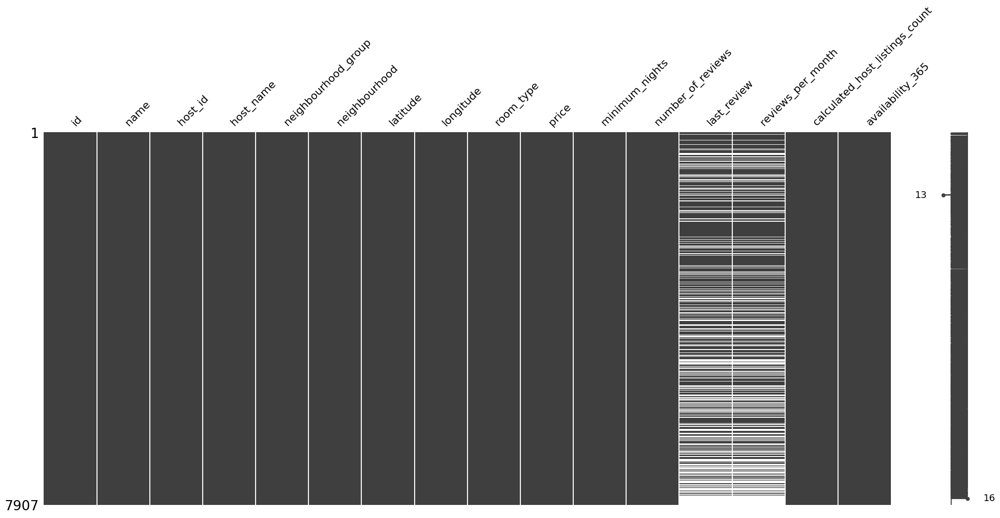

In [5999]:
# show which rows contain missing values 
msno.matrix(listings_data)
plt.show()

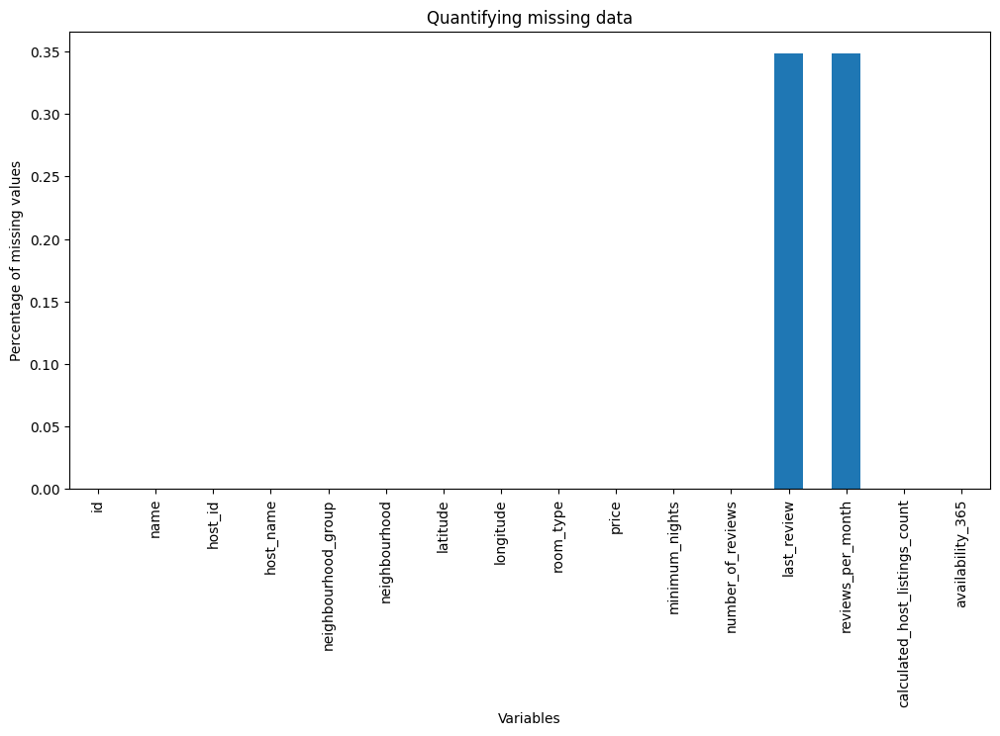

In [6000]:
# visualise percentage of missing values for listings_data
listings_data.isnull().mean().plot.bar(figsize=(12,6))
plt.ylabel('Percentage of missing values')
plt.xlabel('Variables')
plt.title('Quantifying missing data')
plt.show()

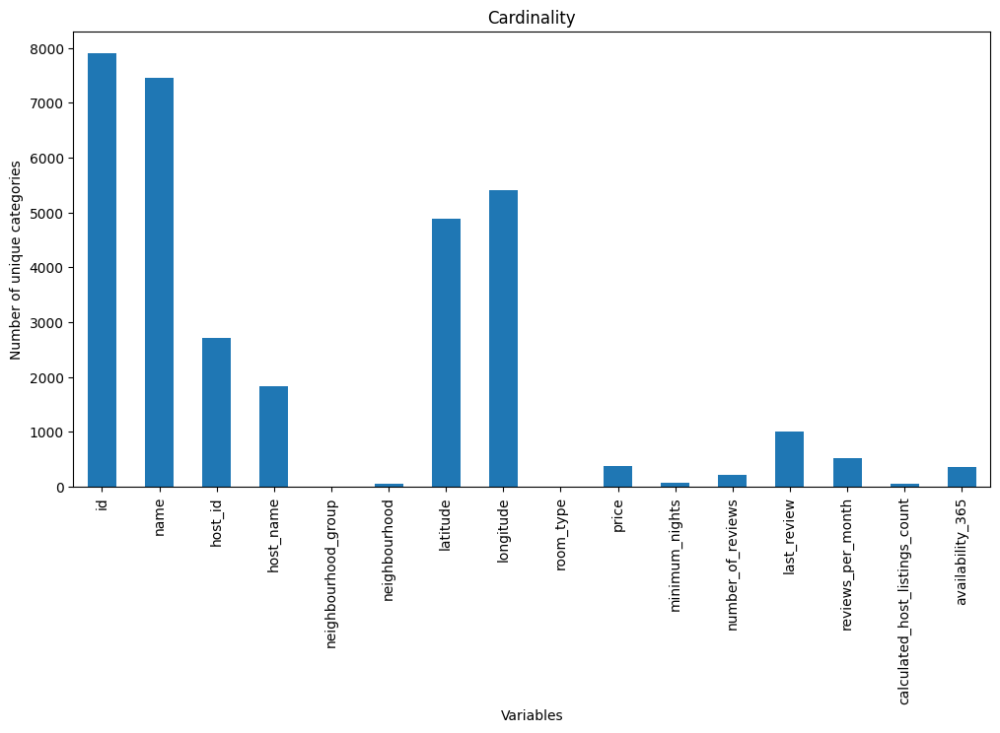

In [6001]:
# check cardinality
listings_data.nunique().plot.bar(figsize=(12,6))

plt.ylabel('Number of unique categories')
plt.xlabel('Variables')
plt.title('Cardinality')
plt.show()

In [6002]:
# check duplicates
# there are no duplicates in this dataset
listings_data[listings_data.duplicated()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365


In [6003]:
# show categorical columns along with their missing value percentages
cat_cols = [c for c in listings_data.columns if listings_data[c].dtypes=='O']
print(listings_data[cat_cols].isnull().mean().sort_values())

host_name              0.000000
neighbourhood_group    0.000000
neighbourhood          0.000000
room_type              0.000000
name                   0.000253
last_review            0.348805
dtype: float64


#### Explore categorical columns

##### Identify if there is a need to group rare categories

In [6004]:
listings_data['neighbourhood_group'].nunique()

5

In [6005]:
# find percentage of how much each category takes up for listings_data for neighbourhood_group
listings_data['neighbourhood_group'].value_counts()/len(listings_data)

neighbourhood_group
Central Region       0.797901
West Region          0.068294
East Region          0.064247
North-East Region    0.043759
North Region         0.025800
Name: count, dtype: float64

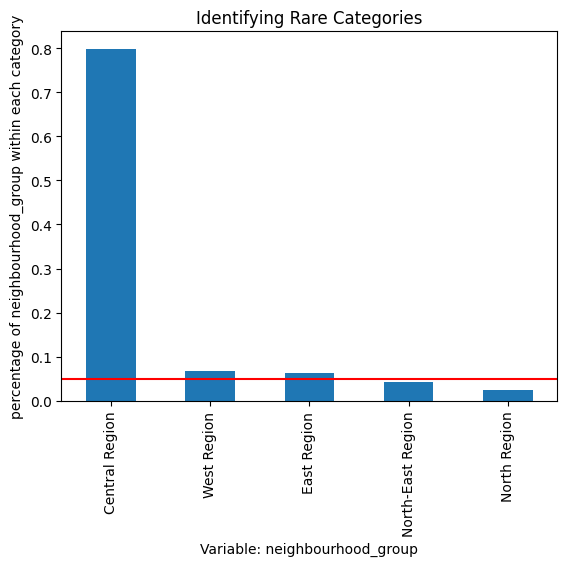

In [6006]:
label_freq = listings_data['neighbourhood_group'].value_counts() / len(listings_data)

fig = label_freq.sort_values(ascending=False).plot.bar()

# add a line to signal 5 % frequency limit
# under which we will consider a category as rare
fig.axhline(y=0.05, color='red')

# add axis labels and title
fig.set_ylabel('percentage of neighbourhood_group within each category')
fig.set_xlabel('Variable: neighbourhood_group')
fig.set_title('Identifying Rare Categories')
plt.show()

##### After the analysis above, even though I have set the rare category threshold to 5%, I choose not to group North and North-East Region as rare. This is because each region of Singapore has a unique range of prices for their listings. Thus, with their distinct characteristics, they could not be grouped together as rare.

In [6007]:
listings_data['neighbourhood'].nunique()

43

In [6008]:
# find percentage of how much each category takes up for listings_data for neighbourhood
listings_data['neighbourhood'].value_counts()/len(listings_data)

neighbourhood
Kallang                    0.131908
Geylang                    0.125711
Novena                     0.067915
Rochor                     0.067788
Outram                     0.060326
Bukit Merah                0.059441
Downtown Core              0.054129
Bedok                      0.047173
River Valley               0.045782
Queenstown                 0.033641
Tanglin                    0.026559
Singapore River            0.022132
Marine Parade              0.021626
Jurong West                0.019350
Orchard                    0.017200
Newton                     0.016947
Bukit Timah                0.016568
Jurong East                0.014923
Hougang                    0.013785
Clementi                   0.012900
Toa Payoh                  0.012773
Pasir Ris                  0.008979
Serangoon                  0.008726
Sengkang                   0.008474
Woodlands                  0.008474
Bukit Batok                0.008221
Tampines                   0.008094
Museum        

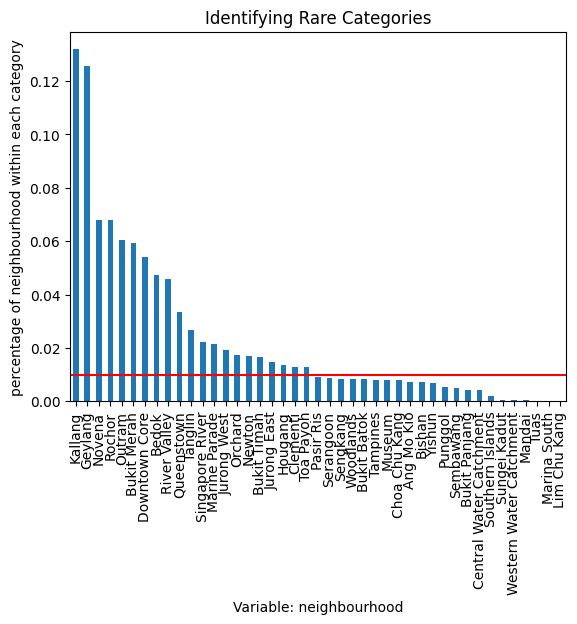

In [6009]:
label_freq = listings_data['neighbourhood'].value_counts() / len(listings_data)

fig = label_freq.sort_values(ascending=False).plot.bar()

# add a line to signal 1 % frequency limit
# under which we will consider a category as rare
fig.axhline(y=0.01, color='red')

# add axis labels and title
fig.set_ylabel('percentage of neighbourhood within each category')
fig.set_xlabel('Variable: neighbourhood')
fig.set_title('Identifying Rare Categories')
plt.show()

##### neighbourhood has categories under the 1% threshold and take up too little percentage of the total dataset so I will be grouping rare categories for neighbourhood.

In [6010]:
listings_data['room_type'].nunique()

3

In [6011]:
# find percentage of how much each category takes up for listings_data for room_type
listings_data['room_type'].value_counts()/len(listings_data)

room_type
Entire home/apt    0.522575
Private room       0.427596
Shared room        0.049829
Name: count, dtype: float64

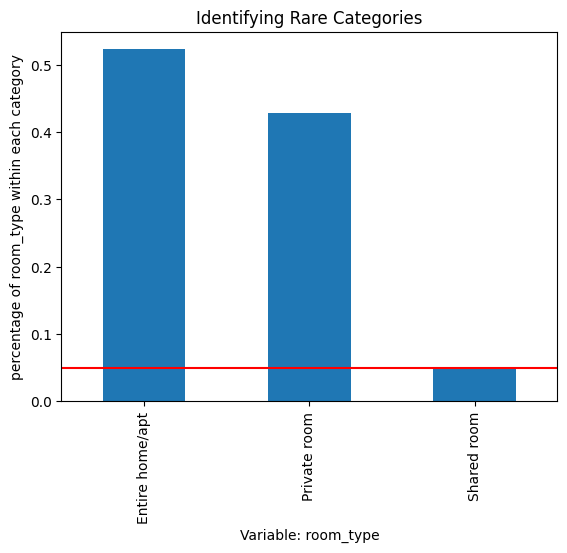

In [6012]:
label_freq = listings_data['room_type'].value_counts() / len(listings_data)

fig = label_freq.sort_values(ascending=False).plot.bar()

# add a line to signal 5 % frequency limit
# under which we will consider a category as rare
fig.axhline(y=0.05, color='red')

# add axis labels and title
fig.set_ylabel('percentage of room_type within each category')
fig.set_xlabel('Variable: room_type')
fig.set_title('Identifying Rare Categories')
plt.show()

##### There is no need to group rare categories for room_type since there is only one room type slightly under the 5% threshold.

#### Explore numerical columns

In [6013]:
# show numerical columns
num_cols = [c for c in listings_data.columns if listings_data[c].dtypes!='O']
print(listings_data[num_cols].isnull().mean().sort_values())


id                                0.000000
host_id                           0.000000
latitude                          0.000000
longitude                         0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
calculated_host_listings_count    0.000000
availability_365                  0.000000
reviews_per_month                 0.348805
dtype: float64


<Axes: >

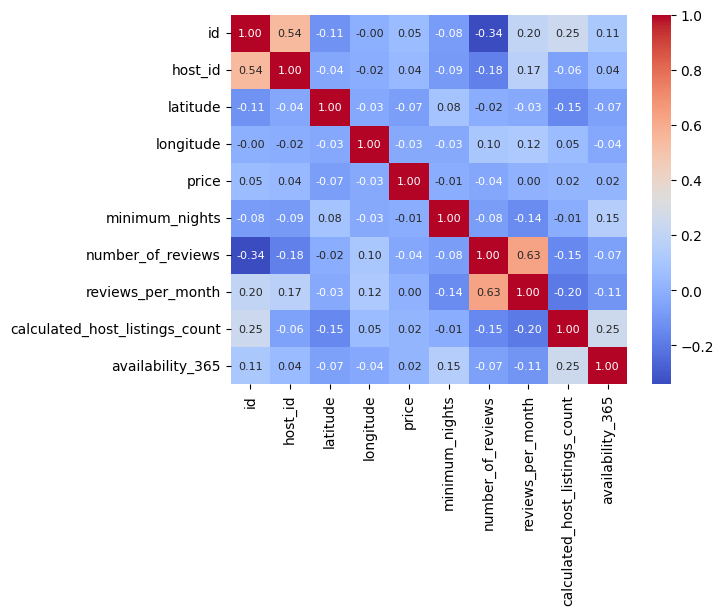

In [6014]:
# show correlation
correlation_matrix = listings_data[num_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})


In [6015]:
listings_data.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [6016]:
cat_cols = [c for c in listings_data.columns if listings_data[c].dtypes=='O']
print(listings_data[cat_cols].isnull().mean().sort_values())


host_name              0.000000
neighbourhood_group    0.000000
neighbourhood          0.000000
room_type              0.000000
name                   0.000253
last_review            0.348805
dtype: float64


In [6017]:
num_cols = [c for c in listings_data.columns if listings_data[c].dtypes!='O']
print(listings_data[num_cols].isnull().mean().sort_values())


id                                0.000000
host_id                           0.000000
latitude                          0.000000
longitude                         0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
calculated_host_listings_count    0.000000
availability_365                  0.000000
reviews_per_month                 0.348805
dtype: float64


In [6018]:
listings_data[num_cols].describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,5149.000000,7907.000000,7907.000000
mean,2.338862e+07,9.114481e+07,1.314192,103.848787,169.332996,17.510054,12.807386,1.043669,40.607689,208.726318
std,1.016416e+07,8.190910e+07,0.030577,0.043675,340.187599,42.094616,29.707746,1.285851,65.135253,146.120034
min,4.909100e+04,2.366600e+04,1.243870,103.646560,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.582180e+07,2.305808e+07,1.295795,103.835825,65.000000,1.000000,0.000000,0.180000,2.000000,54.000000
50%,2.470627e+07,6.344891e+07,1.311030,103.849410,124.000000,3.000000,2.000000,0.550000,9.000000,260.000000
75%,3.234850e+07,1.553811e+08,1.322110,103.872535,199.000000,10.000000,10.000000,1.370000,48.000000,355.000000
max,3.811276e+07,2.885676e+08,1.454590,103.973420,10000.000000,1000.000000,323.000000,13.000000,274.000000,365.000000


### 2.2 Cleanse and Transform the data

### Ensure appropriate data type

In [6019]:
listings_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [6020]:
# convert last_review to datetime
listings_data['last_review'] = pd.to_datetime(listings_data['last_review'])

In [6021]:
listings_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              7907 non-null   int64         
 1   name                            7905 non-null   object        
 2   host_id                         7907 non-null   int64         
 3   host_name                       7907 non-null   object        
 4   neighbourhood_group             7907 non-null   object        
 5   neighbourhood                   7907 non-null   object        
 6   latitude                        7907 non-null   float64       
 7   longitude                       7907 non-null   float64       
 8   room_type                       7907 non-null   object        
 9   price                           7907 non-null   int64         
 10  minimum_nights                  7907 non-null   int64         
 11  numb

In [6022]:
# find latest date in last_review
latest_date = listings_data['last_review'].max()
print(latest_date)

2019-08-27 00:00:00


In [6023]:
# find earliest date in last_review
earliest_date = listings_data['last_review'].min()
print(earliest_date)

2013-10-21 00:00:00


### Create useful features from last_review 

In [6024]:
# create a new feature where we calculate the difference between the latest date and the last_review date
listings_data['days_since_last_review'] = (latest_date - listings_data['last_review']).dt.days

In [6025]:
listings_data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365,2136.0
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365,1705.0
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365,1426.0
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353,16.0
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355,30.0


In [6026]:
listings_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              7907 non-null   int64         
 1   name                            7905 non-null   object        
 2   host_id                         7907 non-null   int64         
 3   host_name                       7907 non-null   object        
 4   neighbourhood_group             7907 non-null   object        
 5   neighbourhood                   7907 non-null   object        
 6   latitude                        7907 non-null   float64       
 7   longitude                       7907 non-null   float64       
 8   room_type                       7907 non-null   object        
 9   price                           7907 non-null   int64         
 10  minimum_nights                  7907 non-null   int64         
 11  numb

In [6027]:
listings_data.shape

(7907, 17)

In [6028]:
# since we have already created a new feature for last_review, we can drop the original last_review column
listings_data = listings_data.drop(columns=['last_review'])

In [6029]:
listings_data.shape

(7907, 16)

### Drop rows with null values

In [6030]:
listings_data.isnull().sum()

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
days_since_last_review            2758
dtype: int64

In [6031]:
listings_data.shape

(7907, 16)

In [6032]:
# find rows with missing values for name
listings_data[listings_data['name'].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review
1024,9436273,NaN,41240585,Audrey,Central Region,Bukit Merah,1.29108,103.83077,Private room,69,2,4,0.09,1,0,1353.0
1331,11573500,NaN,61163169,Educator,Central Region,Bishan,1.35221,103.85148,Private room,650,1,0,NaN,1,0,NaN


In [6033]:
# drop rows with missing values for name since 2 is a small number compared to the total number of rows (7907)
listings_data = listings_data.dropna(subset=['name'])

In [6034]:
# data shape after dropping missing values for name
listings_data.shape

(7905, 16)

### Drop redundant columns

In [6035]:
# drop redundant columns
# id and host_id are not useful for our analysis as these are 
# unique identifiers for each listing and host which is not beneficial for predicting price
# host_name is not useful for our analysis as the name of the host is not beneficial for predicting price
listings_data = listings_data.drop(columns=['id','host_id','host_name'])

In [6036]:
# show data shape after dropping reduntant columns
listings_data.shape

(7905, 13)

In [6037]:
listings_data.head()

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review
0,COZICOMFORT LONG TERM STAY ROOM 2,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,0.01,2,365,2136.0
1,Pleasant Room along Bukit Timah,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,0.28,1,365,1705.0
2,COZICOMFORT,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,0.20,2,365,1426.0
3,Ensuite Room (Room 1 & 2) near EXPO,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,0.15,9,353,16.0
4,B&B Room 1 near Airport & EXPO,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,0.22,9,355,30.0


In [6038]:
listings_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7905 entries, 0 to 7906
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            7905 non-null   object 
 1   neighbourhood_group             7905 non-null   object 
 2   neighbourhood                   7905 non-null   object 
 3   latitude                        7905 non-null   float64
 4   longitude                       7905 non-null   float64
 5   room_type                       7905 non-null   object 
 6   price                           7905 non-null   int64  
 7   minimum_nights                  7905 non-null   int64  
 8   number_of_reviews               7905 non-null   int64  
 9   reviews_per_month               5148 non-null   float64
 10  calculated_host_listings_count  7905 non-null   int64  
 11  availability_365                7905 non-null   int64  
 12  days_since_last_review          5148 no

### Text Analysis

In [6039]:
# data before tokenisation
listings_data.head()

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review
0,COZICOMFORT LONG TERM STAY ROOM 2,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,0.01,2,365,2136.0
1,Pleasant Room along Bukit Timah,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,0.28,1,365,1705.0
2,COZICOMFORT,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,0.20,2,365,1426.0
3,Ensuite Room (Room 1 & 2) near EXPO,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,0.15,9,353,16.0
4,B&B Room 1 near Airport & EXPO,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,0.22,9,355,30.0


In [6040]:
# Download necessary NLTK data files
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [6041]:
# initialize stopwords and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

In [6042]:
# function to clean text
def clean_text(sentence):
    # lowercase the text
    sentence = sentence.lower()
    # remove special characters and numbers
    sentence = re.sub(r'[^\w\s]', '', sentence)  # Remove punctuation
    sentence = re.sub(r'\d+', '', sentence)  # Remove numbers
    # tokenize the text
    words = word_tokenize(sentence)
    # remove stopwords and lemmatize
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
    # join the cleaned words back into a sentence
    return ' '.join(words)

In [6043]:
# apply cleaning to each sentence in name
listings_data['name'] = listings_data['name'].apply(clean_text)

In [6044]:
# data after tokenisation
listings_data.head()

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review
0,cozicomfort long term stay room,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,0.01,2,365,2136.0
1,pleasant room along bukit timah,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,0.28,1,365,1705.0
2,cozicomfort,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,0.20,2,365,1426.0
3,ensuite room room near expo,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,0.15,9,353,16.0
4,bb room near airport expo,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,0.22,9,355,30.0


In [6045]:
# # created a new feature for name which is name_word_count which counts the number of words after tokenisation
# listings_data['name_word_count'] = listings_data['name'].apply(lambda x: len(x.split()))


In [6046]:
# listings_data.head()

In [6047]:
# listings_data.shape

In [6048]:
# # drop name since we have already created a new feature for name
# listings_data = listings_data.drop(columns=['name'])

In [6049]:
# listings_data.shape

##### Found out that Count Vectorizer is a better way to represent the text data for name so I decided to not create the name_word_count feature. Reason: Count Vectorizer allows for a more detailed and meaningful representation of the text, capturing the frequency of individual words and their relationships, which provides more information for analysis or modeling compared to just counting the total number of words.

In [6050]:
listings_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7905 entries, 0 to 7906
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            7905 non-null   object 
 1   neighbourhood_group             7905 non-null   object 
 2   neighbourhood                   7905 non-null   object 
 3   latitude                        7905 non-null   float64
 4   longitude                       7905 non-null   float64
 5   room_type                       7905 non-null   object 
 6   price                           7905 non-null   int64  
 7   minimum_nights                  7905 non-null   int64  
 8   number_of_reviews               7905 non-null   int64  
 9   reviews_per_month               5148 non-null   float64
 10  calculated_host_listings_count  7905 non-null   int64  
 11  availability_365                7905 non-null   int64  
 12  days_since_last_review          5148 no

latitude                          0.000000
longitude                         0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
reviews_per_month                 0.348767
calculated_host_listings_count    0.000000
availability_365                  0.000000
days_since_last_review            0.348767
dtype: float64


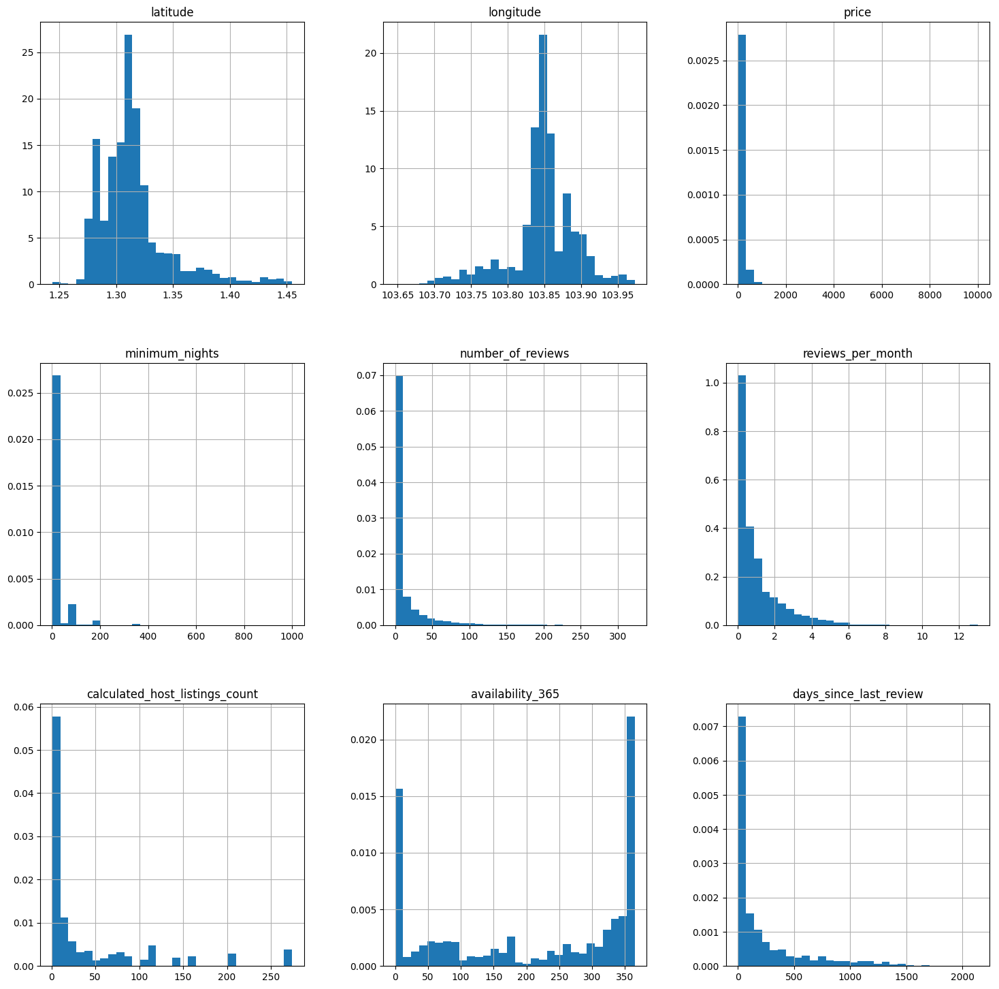

In [6051]:
num_cols = [c for c in listings_data.columns if listings_data[c].dtypes!='O']
print(listings_data[num_cols].isnull().mean())

listings_data[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

<Axes: >

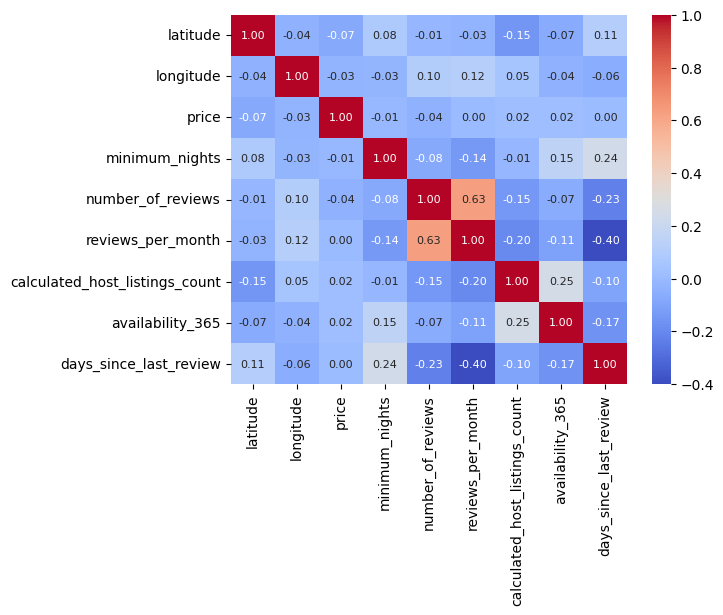

In [6052]:
num_cols = [c for c in listings_data.columns if listings_data[c].dtypes!='O']
correlation_matrix = listings_data[num_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})


### Identifying Outliers

In [6053]:
def find_boundaries(df, variable):

    # distance passed as an argument, gives us the option to
    # estimate 1.5 times or 3 times the IQR to calculate
    # the boundaries.

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df[variable].quantile(0.75) + (IQR * 1.5)

    return upper_boundary, lower_boundary


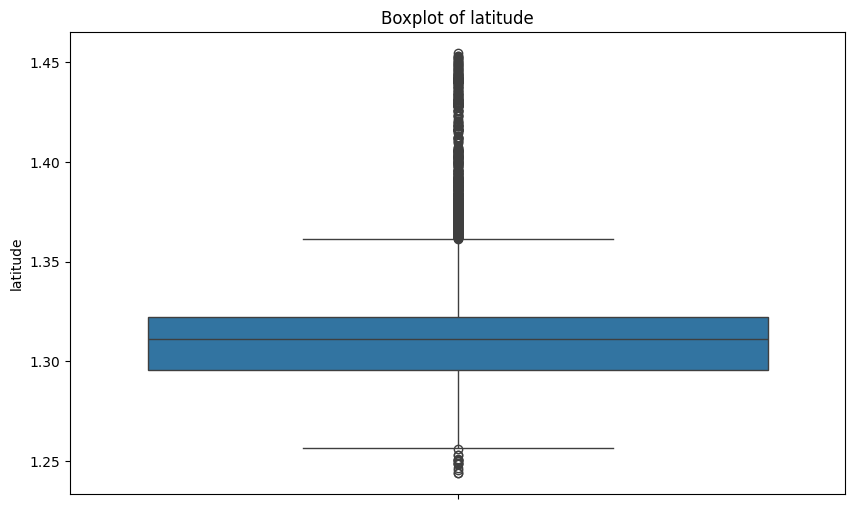

latitude - Upper Boundary: 1.3615749999999998, Lower Boundary: 1.2563350000000004
Number of outliers in latitude: 613
latitude - Number of unique values: 4884
Outliers in latitude:
0     1.44255
2     1.44246
29    1.36743
33    1.37527
36    1.39963
Name: latitude, dtype: float64



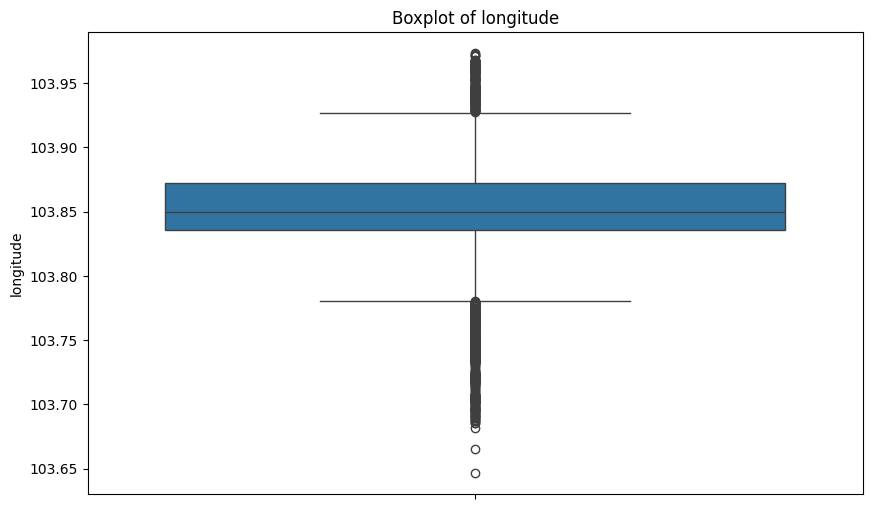

longitude - Upper Boundary: 103.92765499999999, Lower Boundary: 103.78073500000002
Number of outliers in longitude: 851
longitude - Number of unique values: 5414
Outliers in longitude:
3     103.95712
4     103.95963
5     103.96103
6     103.96337
12    103.95984
Name: longitude, dtype: float64



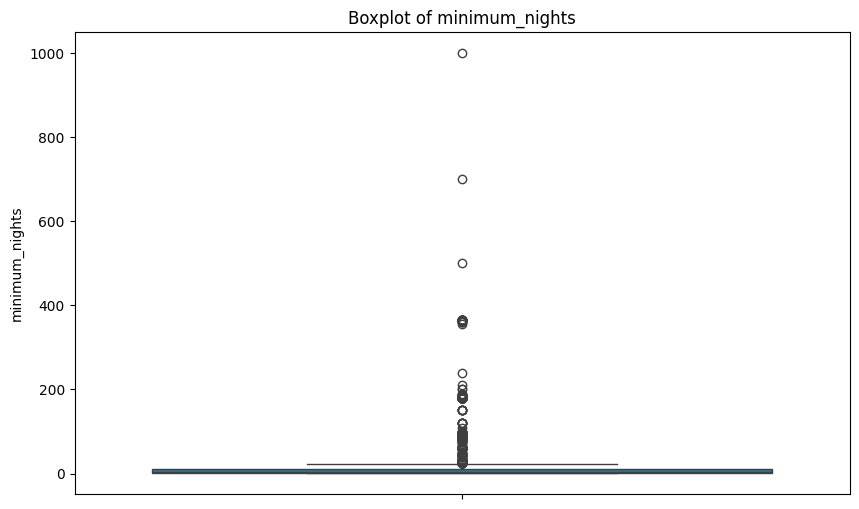

minimum_nights - Upper Boundary: 23.5, Lower Boundary: -12.5
Number of outliers in minimum_nights: 1407
minimum_nights - Number of unique values: 73
Outliers in minimum_nights:
0    180
1     90
7     90
8     90
9     90
Name: minimum_nights, dtype: int64



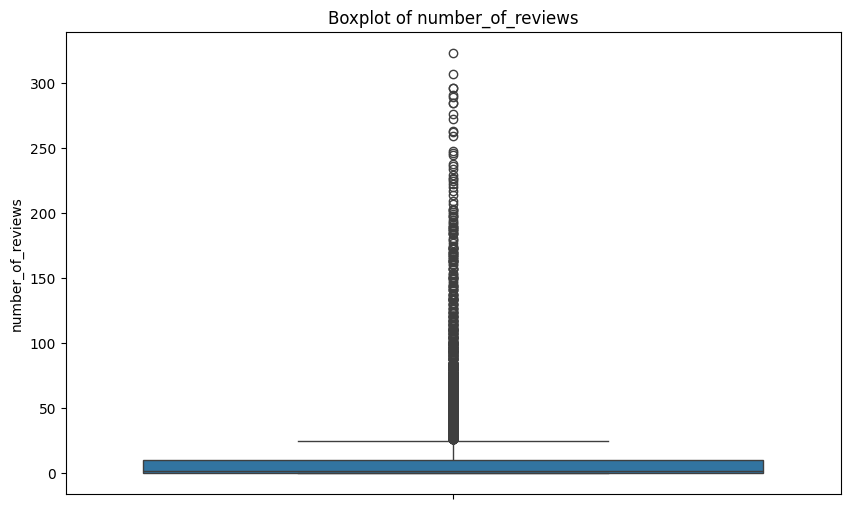

number_of_reviews - Upper Boundary: 25.0, Lower Boundary: -15.0
Number of outliers in number_of_reviews: 1102
number_of_reviews - Number of unique values: 208
Outliers in number_of_reviews:
5      39
7     174
8     198
9     236
13    125
Name: number_of_reviews, dtype: int64



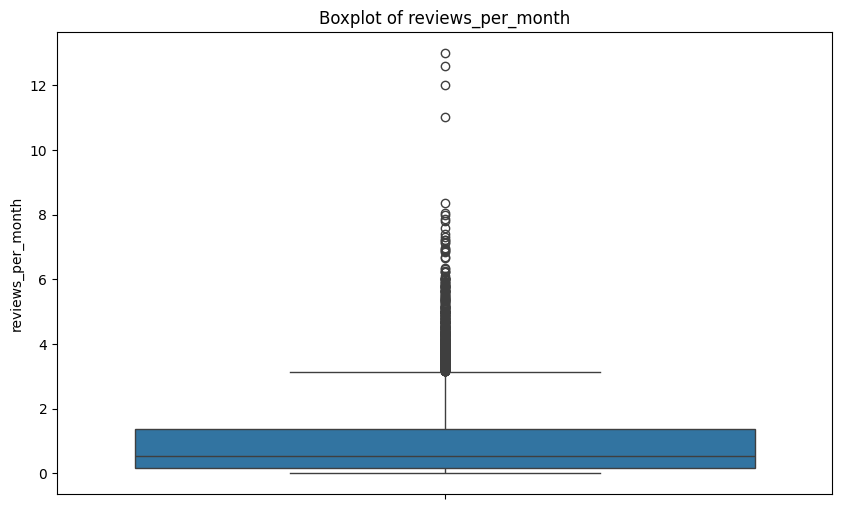

reviews_per_month - Upper Boundary: 3.1550000000000002, Lower Boundary: -1.6050000000000002
Number of outliers in reviews_per_month: 402
reviews_per_month - Number of unique values: 527
Outliers in reviews_per_month:
132    4.72
140    5.44
171    3.41
219    3.66
250    5.63
Name: reviews_per_month, dtype: float64



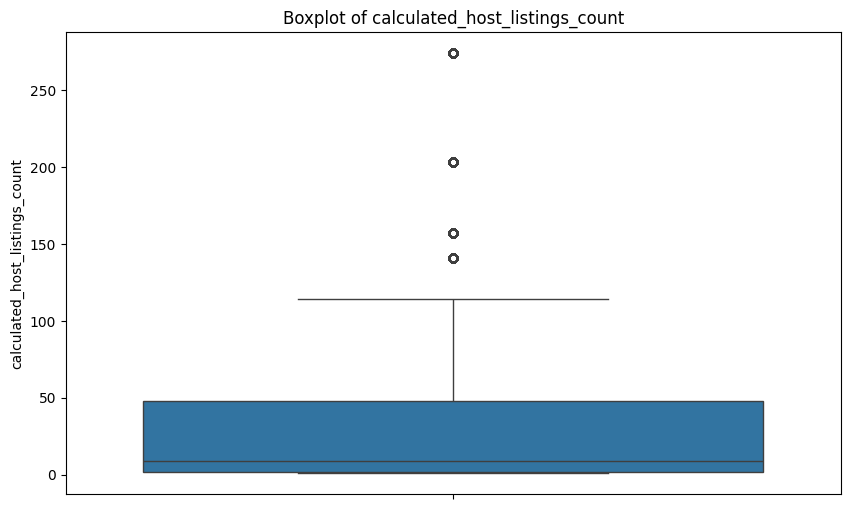

calculated_host_listings_count - Upper Boundary: 117.0, Lower Boundary: -67.0
Number of outliers in calculated_host_listings_count: 775
calculated_host_listings_count - Number of unique values: 55
Outliers in calculated_host_listings_count:
165    203
200    203
243    203
251    203
267    203
Name: calculated_host_listings_count, dtype: int64



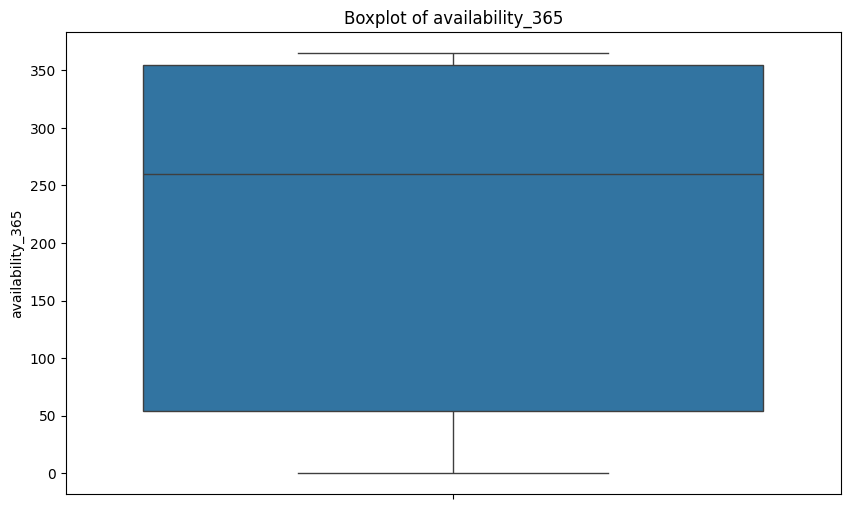

availability_365 - Upper Boundary: 806.5, Lower Boundary: -397.5
Number of outliers in availability_365: 0
availability_365 - Number of unique values: 359
Outliers in availability_365:
Series([], Name: availability_365, dtype: int64)



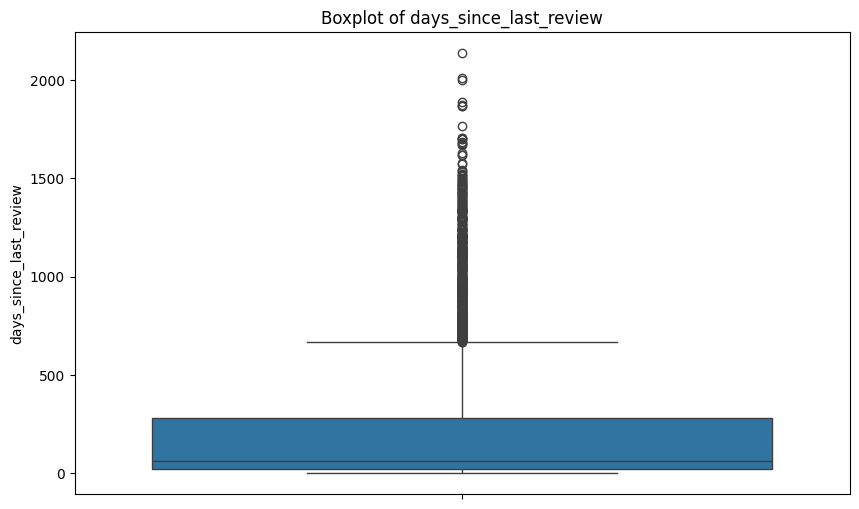

days_since_last_review - Upper Boundary: 667.5, Lower Boundary: -368.5
Number of outliers in days_since_last_review: 600
days_since_last_review - Number of unique values: 1000
Outliers in days_since_last_review:
0     2136.0
1     1705.0
2     1426.0
16    1100.0
21     750.0
Name: days_since_last_review, dtype: float64



In [6054]:
# Loop through each numeric column except 'price'
for column in listings_data.select_dtypes(include=[np.number]).columns:
    if column == 'price':
        continue  # Skip 'price' column
    
    # Plot boxplot
    plt.figure(figsize=(10, 6))
    sns.boxplot(y=listings_data[column])
    plt.title(f'Boxplot of {column}')
    plt.ylabel(column)
    plt.show()
    
    # Calculate boundaries (make sure you define this function 'find_boundaries')
    upper_boundary, lower_boundary = find_boundaries(listings_data, column)
    print(f'{column} - Upper Boundary: {upper_boundary}, Lower Boundary: {lower_boundary}')
    
    # Detect outliers
    outliers = np.where(listings_data[column] > upper_boundary, True,
                        np.where(listings_data[column] < lower_boundary, True, False))
    
    # Print number of outliers
    num_outliers = outliers.sum()
    print(f'Number of outliers in {column}: {num_outliers}')
    
    unique_values = listings_data[column].nunique()
    print(f'{column} - Number of unique values: {unique_values}')    
    
    # Print outlier values
    outliers_df = listings_data.loc[outliers, column]
    print(f'Outliers in {column}:')
    print(outliers_df.head())
    print()

### Plot boxplot for target variable price


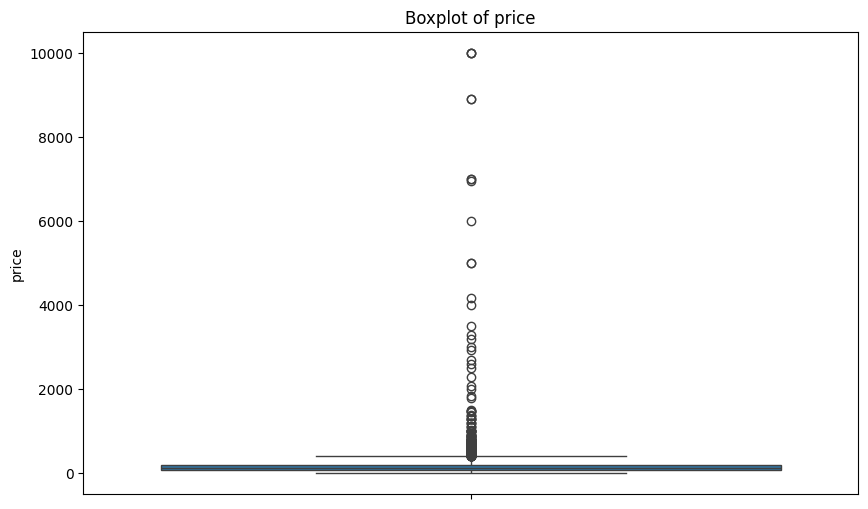

price - Upper Boundary: 400.0, Lower Boundary: -136.0
number of outliers: 323


12      417
38     2604
99      800
100     550
149     462
Name: price, dtype: int64

In [6055]:
# plot boxplot for target variable price
plt.figure(figsize=(10, 6))
sns.boxplot(y=listings_data['price'])
plt.title('Boxplot of price')
plt.ylabel('price')
plt.show()
upper_boundary, lower_boundary = find_boundaries(listings_data, 'price')
print(f'price - Upper Boundary: {upper_boundary}, Lower Boundary: {lower_boundary}')
outliers = np.where(listings_data['price'] > upper_boundary, True,
                    np.where(listings_data['price'] < lower_boundary, True, False))

print(f"number of outliers: {outliers.sum()}")
outliers_df = listings_data.loc[outliers, 'price']
outliers_df.head()

In [6056]:
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30, kde=True)  
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('popularity quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

In [6057]:
# ensure target varaible has no null values
listings_data.isnull().sum()

name                                 0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
reviews_per_month                 2757
calculated_host_listings_count       0
availability_365                     0
days_since_last_review            2757
dtype: int64

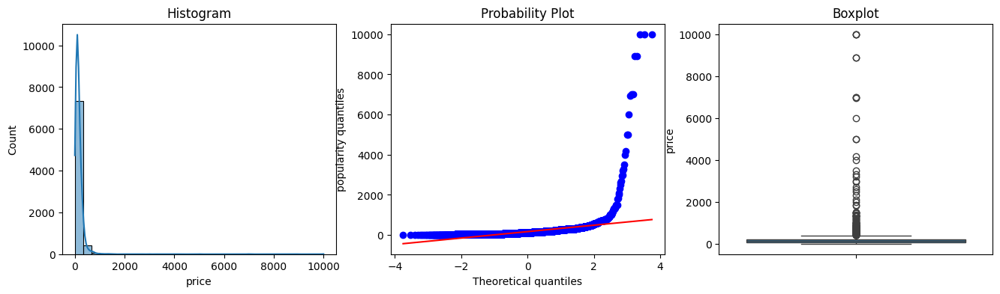

In [6058]:
# print distribution for target variable price before outlier handling
diagnostic_plots(listings_data, 'price')

##### Trimmed outliers for target variable: price

In [6059]:
def find_boundaries2(df, variable, distance):

    # Let's calculate the boundaries outside which sit the outliers
    # for skewed distributions

    # distance passed as an argument, gives us the option to
    # estimate 1.5 times or 3 times the IQR to calculate
    # the boundaries.

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
    upper_boundary = df[variable].quantile(0.75) + (IQR * distance)

    return upper_boundary, lower_boundary

In [6060]:
# find limits for price

price_upper_limit, price_lower_limit = find_boundaries2(listings_data, 'price', 1.5)
price_upper_limit, price_lower_limit

(400.0, -136.0)

In [6061]:
# flag the outliers in the data set

outliers_price = np.where(listings_data['price'] > price_upper_limit, True,
                       np.where(listings_data['price'] < price_lower_limit, True, False))

In [6062]:
# trim the dataset by removing only price outliers

listings_data2 = listings_data.loc[~outliers_price ]

listings_data.shape, listings_data2.shape

((7905, 13), (7582, 13))

##### Tried capping method for price

In [6063]:
# windsorizer = Winsorizer(capping_method ='gaussian', 
#                         tail='both', # cap left, right or both tails
#                         fold =1.5,
#                         variables=['price'])

# windsorizer.fit(listings_data)

In [6064]:
# listings_data = windsorizer.transform(listings_data)

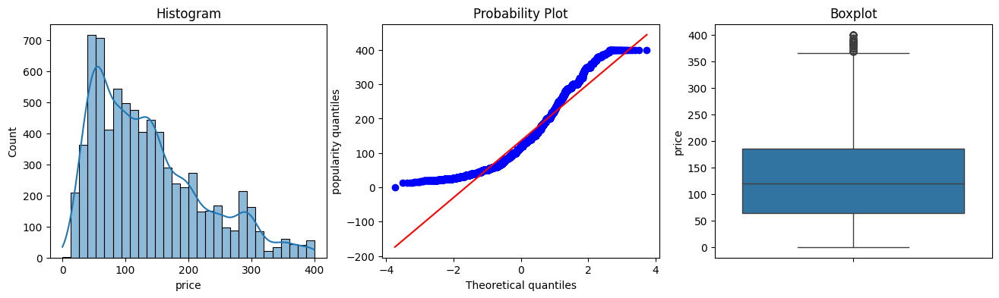

In [6065]:
# print distribution for target variable price after trimming outliers
diagnostic_plots(listings_data2, 'price')

In [6066]:
listings_data = listings_data2

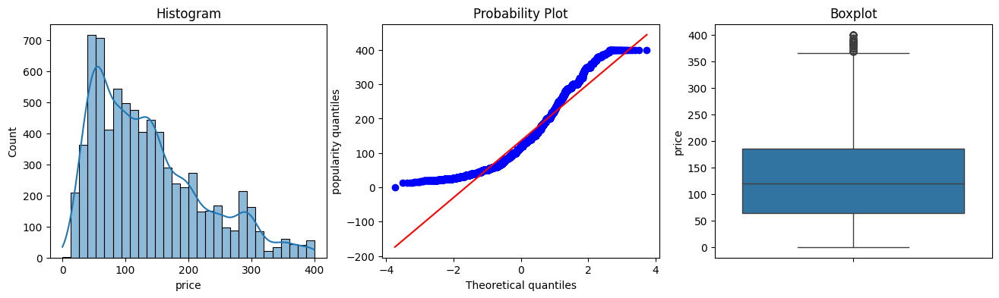

In [6067]:
# print distribution for target variable price after trimming
diagnostic_plots(listings_data, 'price')

### Train Test Split

In [6068]:
X_train_listings, X_test_listings, y_train_listings, y_test_listings = train_test_split(
    listings_data.drop('price',axis=1), listings_data['price'], test_size=0.3, random_state=420)

X_train_listings.shape, X_test_listings.shape

((5307, 12), (2275, 12))

In [6069]:
y_train_listings.shape, y_test_listings.shape

((5307,), (2275,))

### Missing Value Imputation

In [6070]:
listings_data.isnull().sum()

name                                 0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
reviews_per_month                 2597
calculated_host_listings_count       0
availability_365                     0
days_since_last_review            2597
dtype: int64

In [6071]:
cat_cols = [c for c in listings_data.columns if listings_data[c].dtypes=='O']
print(listings_data[cat_cols].isnull().mean().sort_values())

name                   0.0
neighbourhood_group    0.0
neighbourhood          0.0
room_type              0.0
dtype: float64


latitude                          0.000000
longitude                         0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
reviews_per_month                 0.342522
calculated_host_listings_count    0.000000
availability_365                  0.000000
days_since_last_review            0.342522
dtype: float64


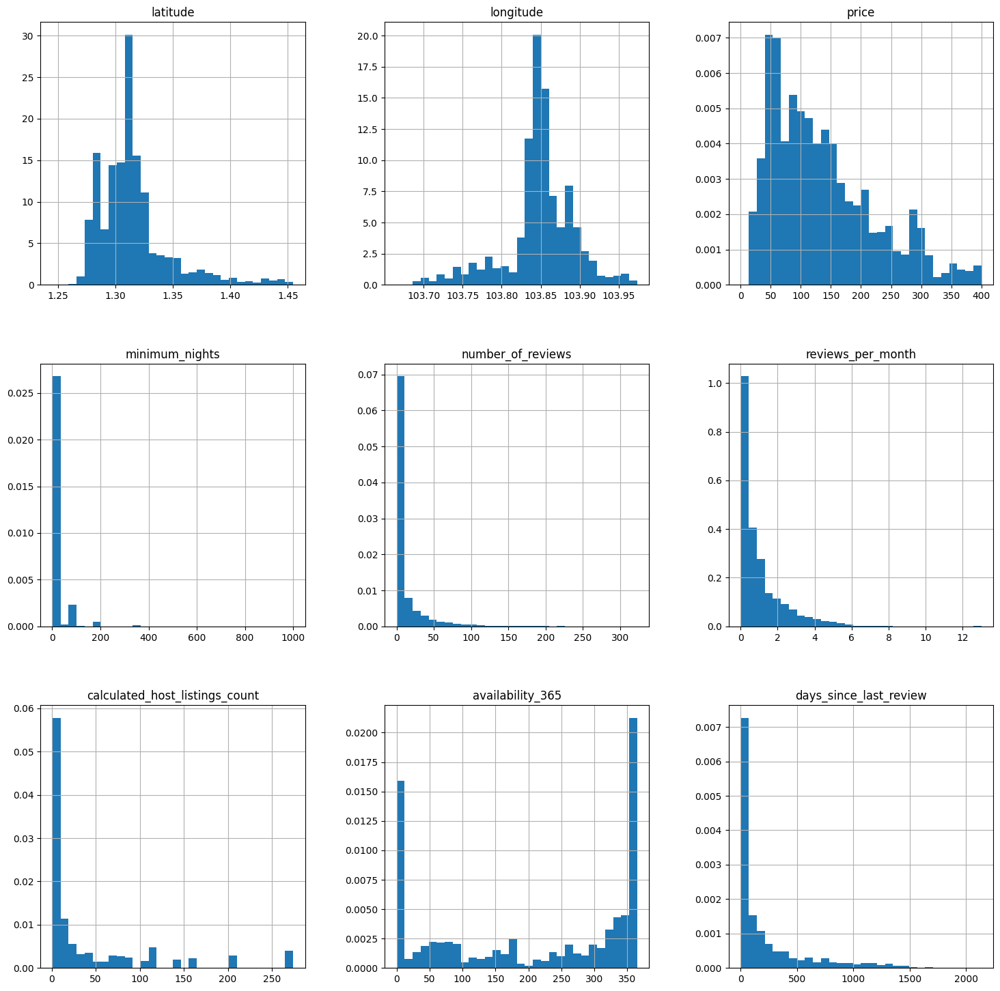

In [6072]:
num_cols = [c for c in listings_data.columns if listings_data[c].dtypes!='O']
print(listings_data[num_cols].isnull().mean())

listings_data[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

In [6073]:
# show rows for missing values for reviews_per_month
# select reviews_per_month, number_of_reviews and days_since_last_review columns
listings_data[listings_data['reviews_per_month'].isnull()][['reviews_per_month','number_of_reviews','days_since_last_review']]

,reviews_per_month,number_of_reviews,days_since_last_review
18,NaN,0,NaN
23,NaN,0,NaN
26,NaN,0,NaN
28,NaN,0,NaN
29,NaN,0,NaN
...,...,...,...
7901,NaN,0,NaN
7902,NaN,0,NaN
7904,NaN,0,NaN
7905,NaN,0,NaN


##### Interestingly, I noticed that the rows with null values for both days_since_last_review and reviews_per_month columns are related to the number_of_reviews column. Because the number_of_reviews is 0, no one has ever reviewed it in the past few months. Thus, it is appropriate to impute the null values for reviews_per_month as 0. 

In [6074]:
# find rows where reviews_per_month and days_since_last_review are missing
# and number_of_reviews is not 0
missing_reviews_data = listings_data[
    listings_data['reviews_per_month'].isnull() &
    listings_data['days_since_last_review'].isnull() &
    (listings_data['number_of_reviews'] != 0)
][['reviews_per_month', 'number_of_reviews', 'days_since_last_review']]

missing_reviews_data

,reviews_per_month,number_of_reviews,days_since_last_review


##### To further support my claim above I have also search if there are any rows with null values in reviews_per_month and days_since_last_review and number_of_reviews is not 0. The result above shows no rows when number_of_reviews is not 0.

In [6200]:
# impute null values for reviews_per_month as 0 for x_train and x_test
X_train_listings['reviews_per_month'] = X_train_listings['reviews_per_month'].fillna(0)
X_test_listings['reviews_per_month'] = X_test_listings['reviews_per_month'].fillna(0)

In [6076]:
X_train_listings.isnull().sum()

name                                 0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
minimum_nights                       0
number_of_reviews                    0
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
days_since_last_review            1804
dtype: int64

In [6077]:
X_test_listings.isnull().sum()

name                                0
neighbourhood_group                 0
neighbourhood                       0
latitude                            0
longitude                           0
room_type                           0
minimum_nights                      0
number_of_reviews                   0
reviews_per_month                   0
calculated_host_listings_count      0
availability_365                    0
days_since_last_review            793
dtype: int64

In [6078]:
listings_data['days_since_last_review'].max()

2136.0

In [6079]:
# define bins and labels for non-missing data
bins = [0, 365, 1095, 1825, listings_data['days_since_last_review'].max() + 1]
labels = ['Up to 1 year', 'Between 1-3 years', 'Between 3-5 years', 'More than 5 years']

In [6080]:
# function to categorize last review period and drop the original column
def categorize_last_review_period(df):
    df['last_review_period'] = df['days_since_last_review'].apply(
        lambda x: 'No Review' if pd.isnull(x) else None
    )
    df.loc[df['last_review_period'].isnull(), 'last_review_period'] = pd.cut(
        df.loc[df['last_review_period'].isnull(), 'days_since_last_review'],
        bins=bins,
        labels=labels,
        right=False
    )
    
    df.drop(columns=['days_since_last_review'], inplace=True)
    return df

In [6081]:
X_train_listings = categorize_last_review_period(X_train_listings)
X_test_listings = categorize_last_review_period(X_test_listings)

In [6082]:
print(X_train_listings[['last_review_period']].head())
print(X_test_listings[['last_review_period']].head())

     last_review_period
3749  Between 1-3 years
4973          No Review
81         Up to 1 year
4061       Up to 1 year
4278       Up to 1 year
     last_review_period
1568          No Review
4303       Up to 1 year
2610  Between 1-3 years
4911          No Review
1763          No Review


In [6083]:
X_train_listings.isnull().sum()

name                              0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
last_review_period                0
dtype: int64

In [6084]:
X_test_listings.isnull().sum()

name                              0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
last_review_period                0
dtype: int64

### Outlier Handling

latitude                          0.0
longitude                         0.0
minimum_nights                    0.0
number_of_reviews                 0.0
reviews_per_month                 0.0
calculated_host_listings_count    0.0
availability_365                  0.0
dtype: float64


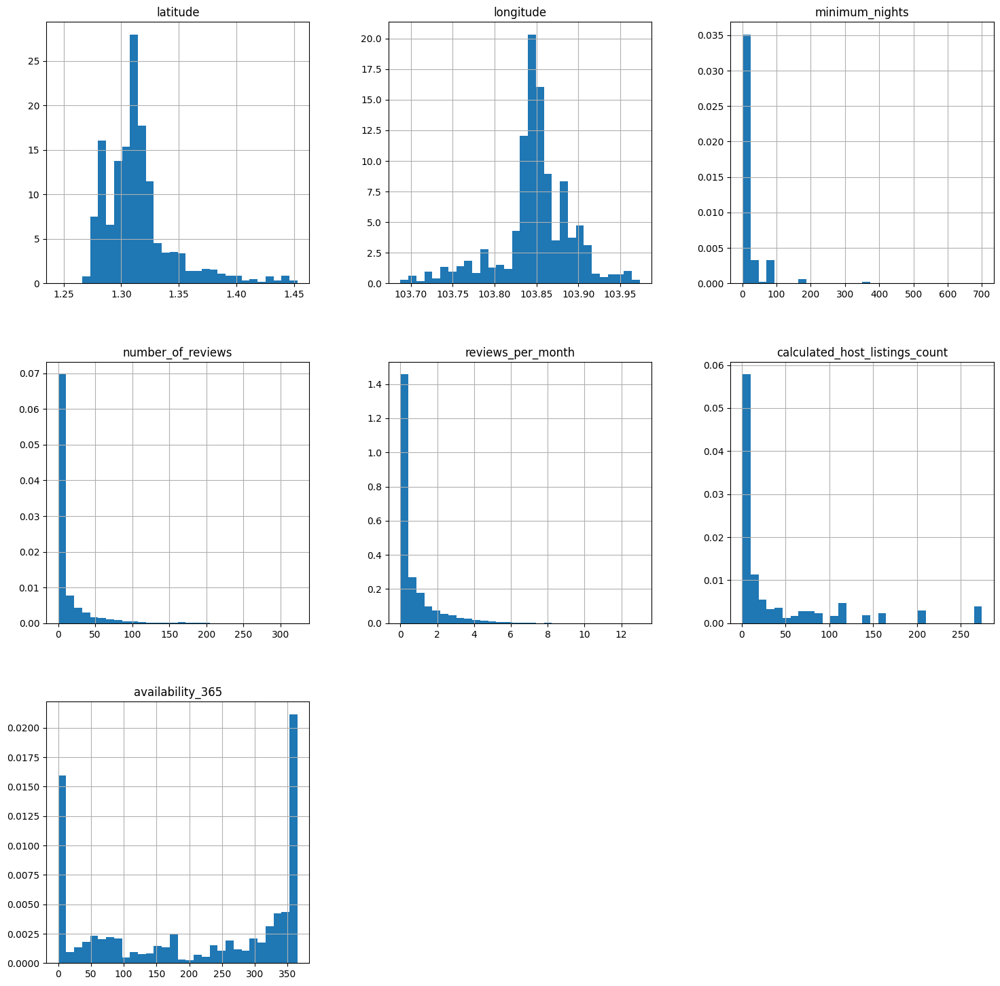

In [6085]:
num_cols = [c for c in X_train_listings.columns if X_train_listings[c].dtypes!='O']
print(X_train_listings[num_cols].isnull().mean())

X_train_listings[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

latitude                          0.0
longitude                         0.0
minimum_nights                    0.0
number_of_reviews                 0.0
reviews_per_month                 0.0
calculated_host_listings_count    0.0
availability_365                  0.0
dtype: float64


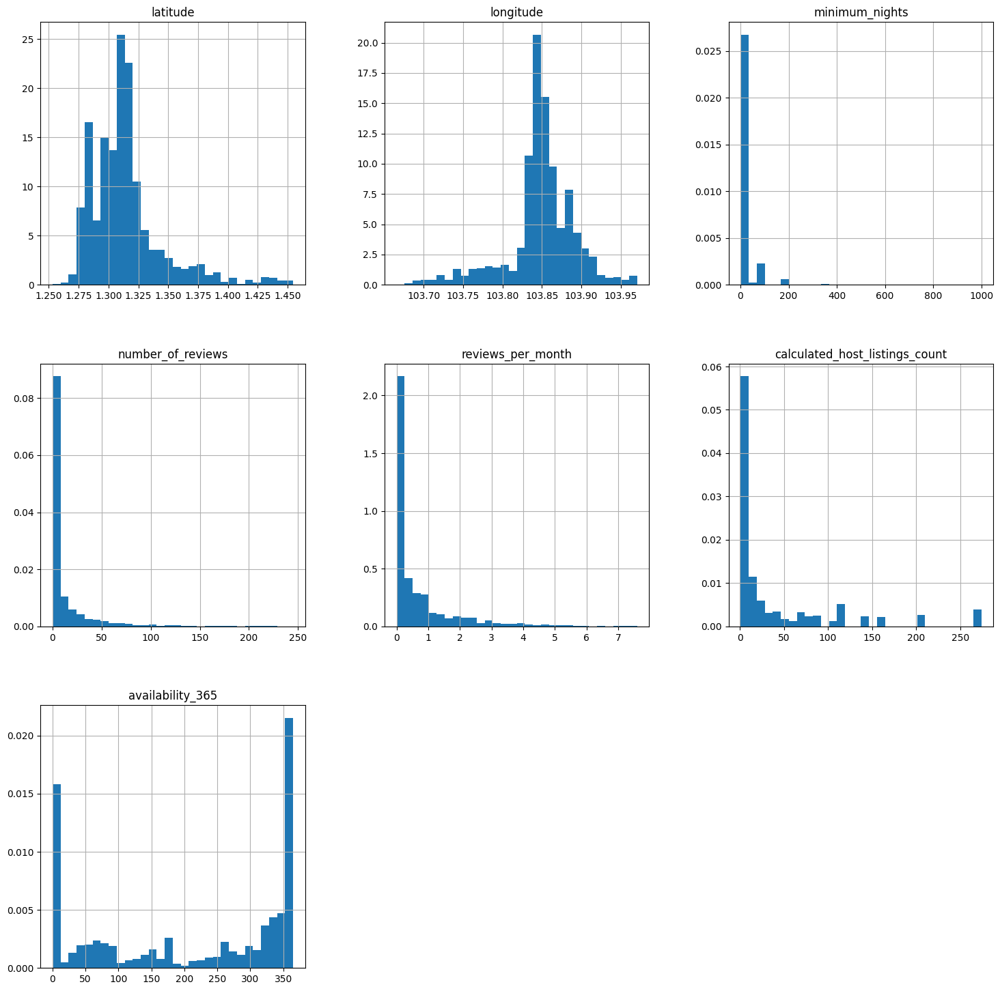

In [6086]:
num_cols = [c for c in X_test_listings.columns if X_test_listings[c].dtypes!='O']
print(X_test_listings[num_cols].isnull().mean())

X_test_listings[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

In [6087]:
num_cols = [c for c in X_train_listings.columns if X_train_listings[c].dtypes!='O']
# except for price
numerical_columns = [c for c in num_cols if c not in ['price']]

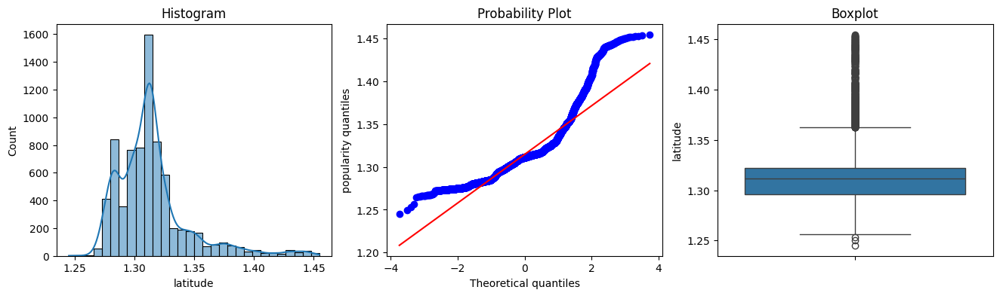

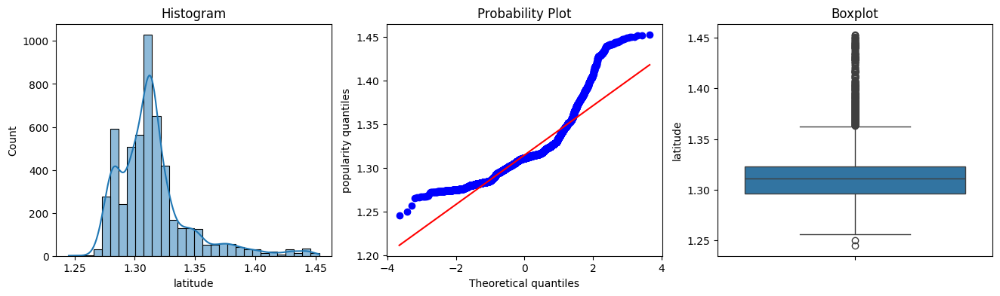

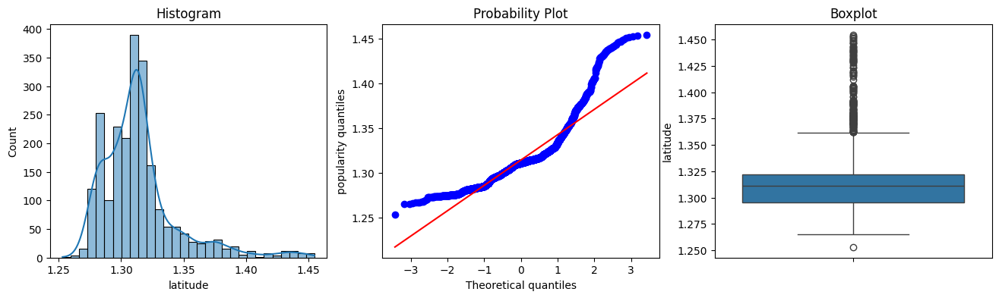

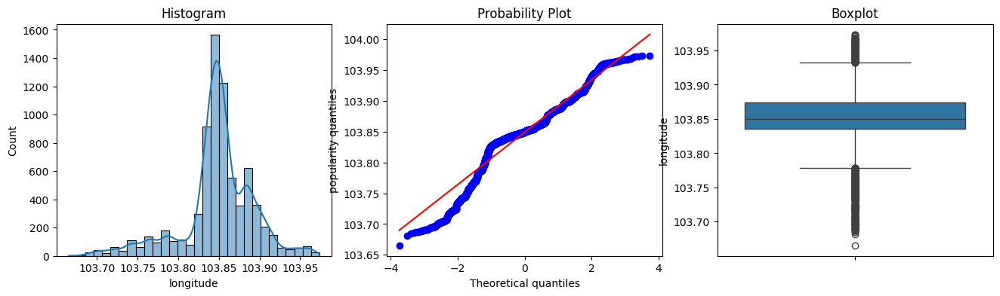

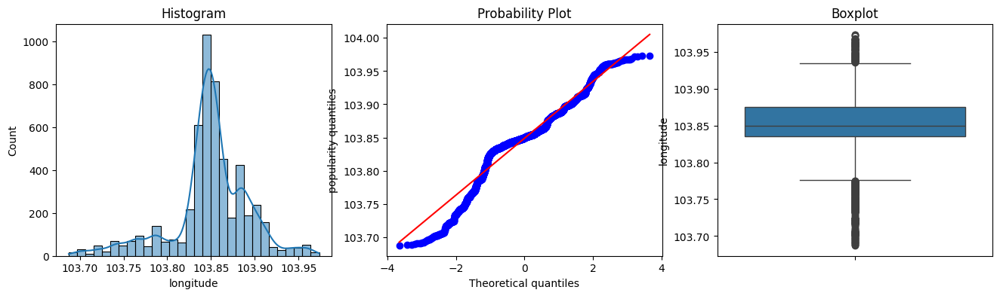

...

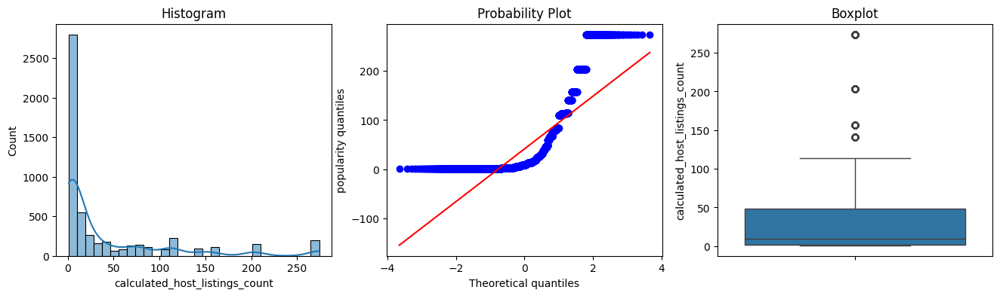

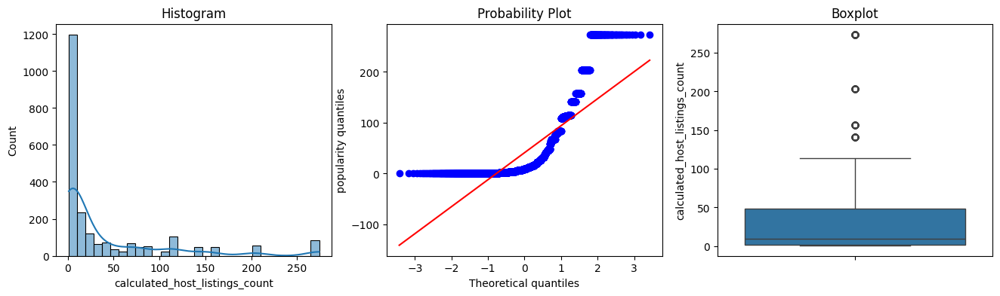

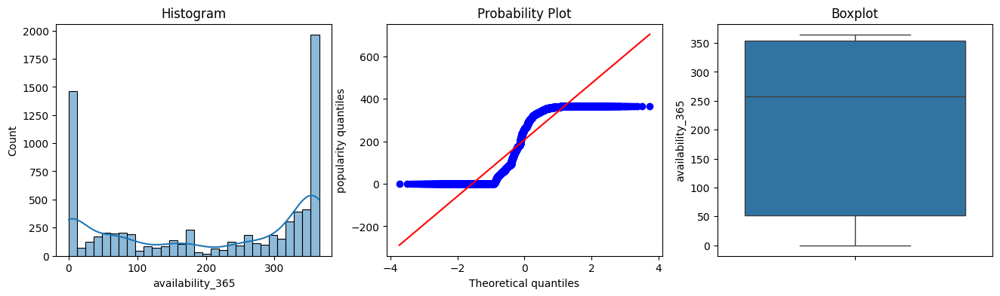

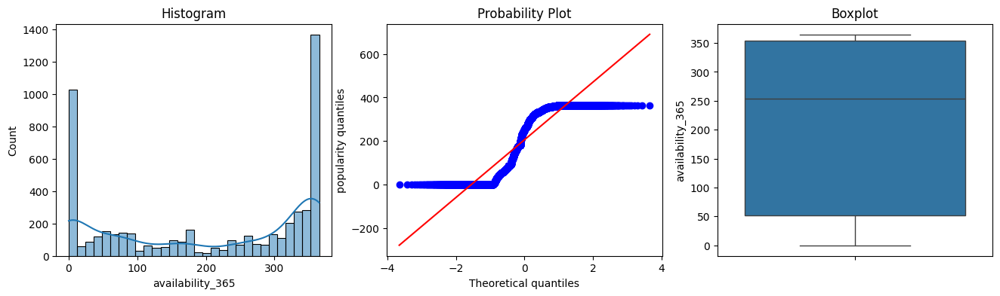

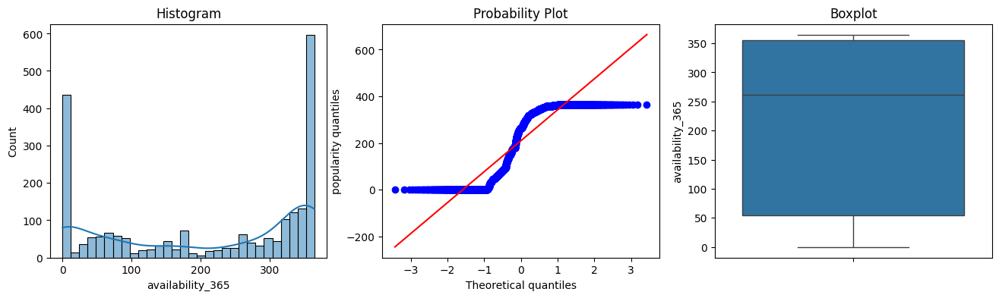

In [6088]:
# print distribution for all numerical columns except target variable before handling outliers
for col in numerical_columns:
    diagnostic_plots(listings_data, col)
    diagnostic_plots(X_train_listings, col)
    diagnostic_plots(X_test_listings, col)
    print()
    print()
    print()


In [6089]:
windsorizer = Winsorizer(capping_method ='quantiles', 
                        tail='both', # cap left, right or both tails
                        fold =0.01,
                        variables=numerical_columns)

windsorizer.fit(X_train_listings)

Winsorizer(capping_method='quantiles', fold=0.01, tail='both',
           variables=['latitude', 'longitude', 'minimum_nights',
                      'number_of_reviews', 'reviews_per_month',
                      'calculated_host_listings_count', 'availability_365'])

In [6090]:
# windsorizer = Winsorizer(capping_method ='quantiles', 
#                         tail='both', # cap left, right or both tails
#                         fold =0.05,
#                         variables=numerical_columns)

# windsorizer.fit(X_train_listings)

In [6091]:
X_train_listings = windsorizer.transform(X_train_listings)
X_test_listings = windsorizer.transform(X_test_listings)

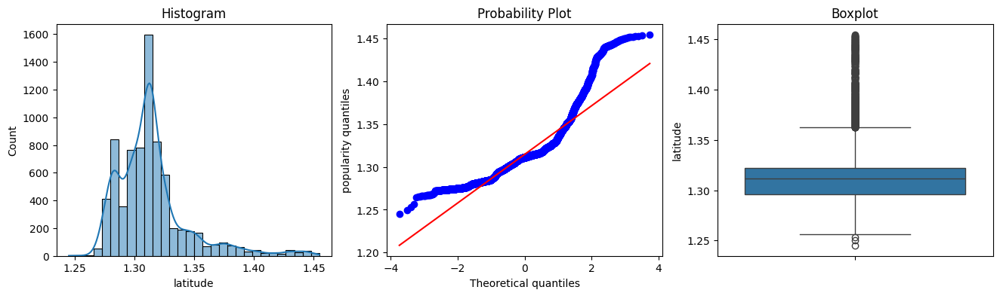

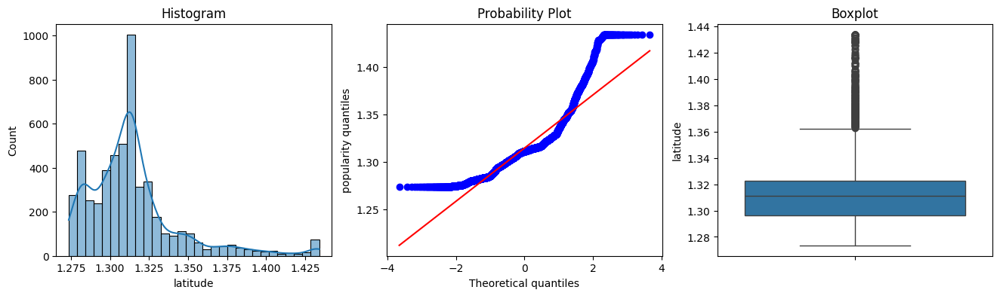

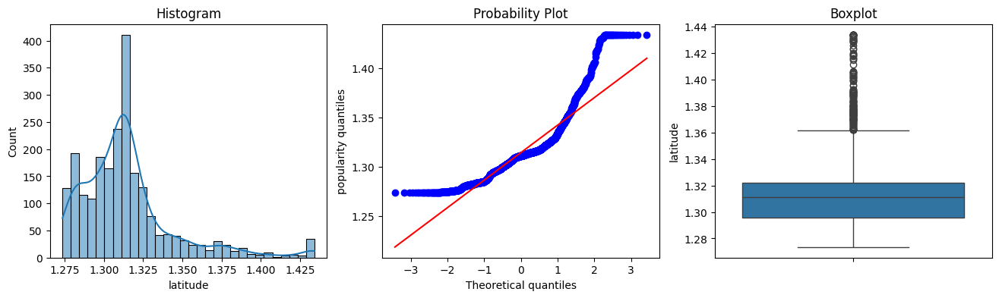

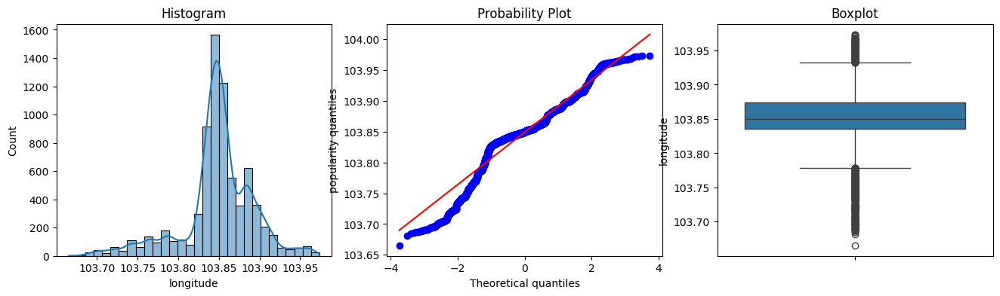

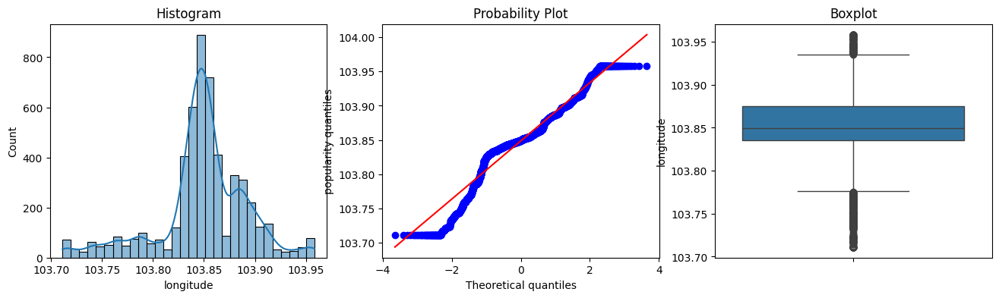

...

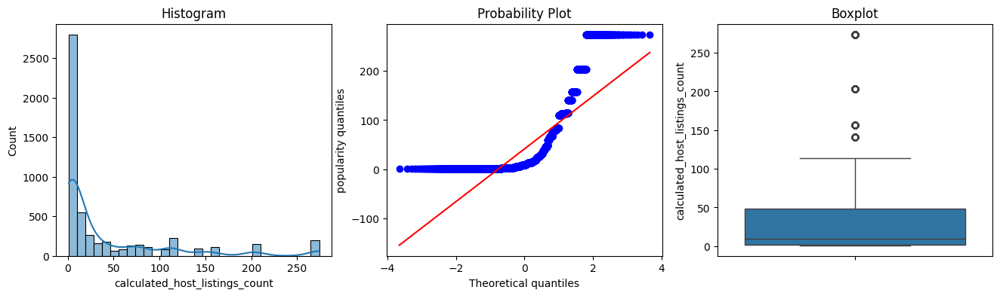

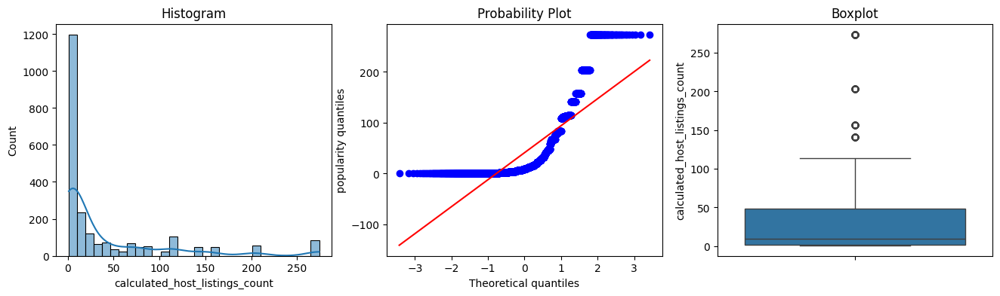

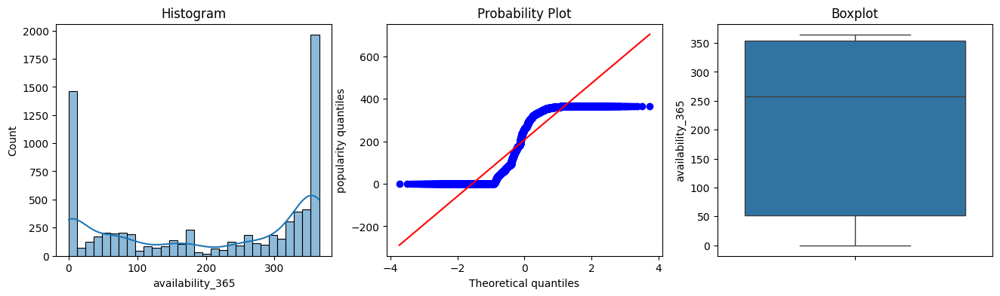

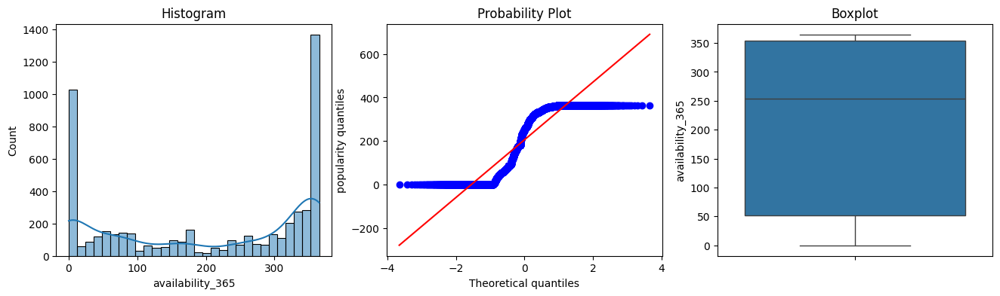

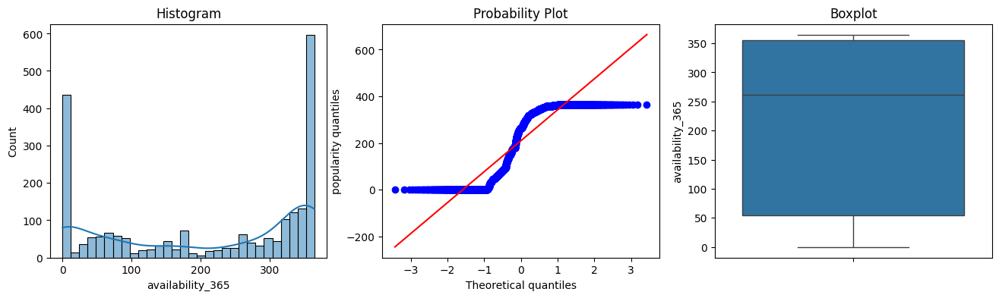

In [6092]:
# print distribution after capping for all numerical columns execept target variable
for col in numerical_columns:
    diagnostic_plots(listings_data, col)
    diagnostic_plots(X_train_listings, col)
    diagnostic_plots(X_test_listings, col)
    print()
    print()
    print()

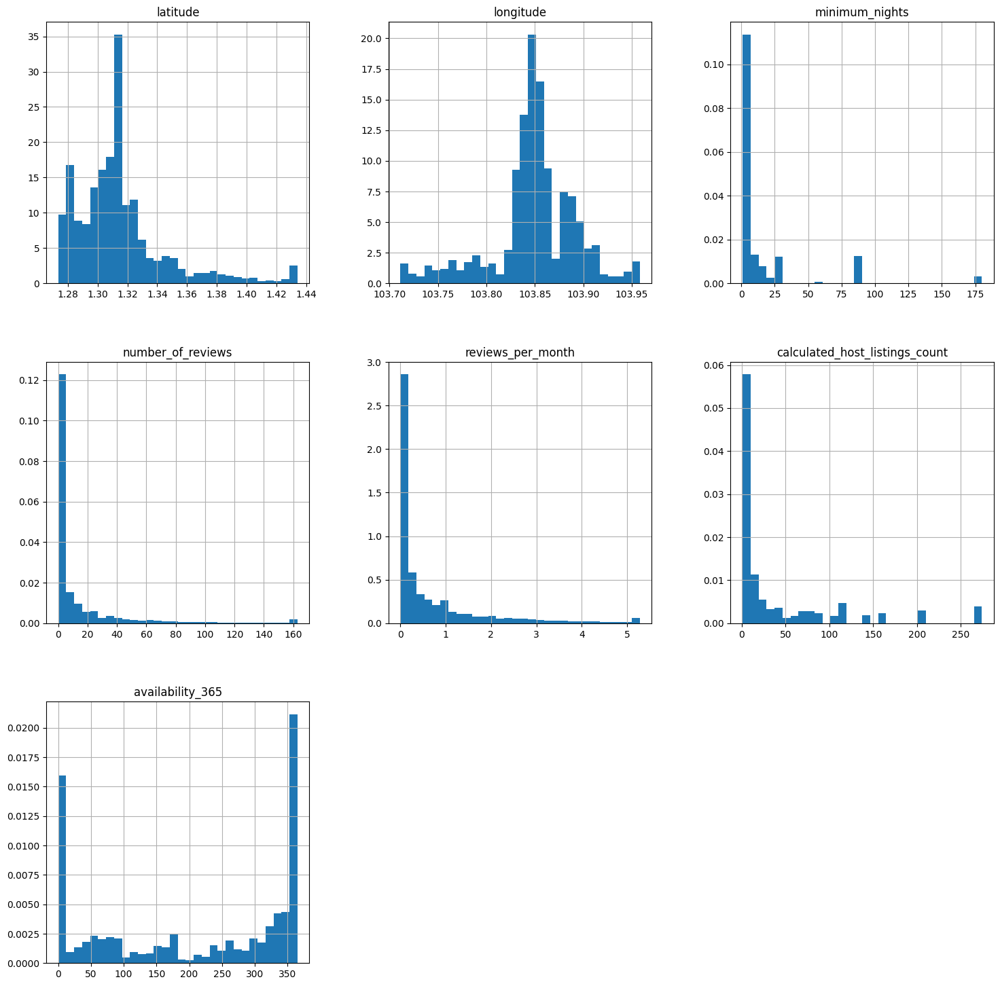

In [6093]:
num_cols = [c for c in X_train_listings.columns if X_train_listings[c].dtypes!='O']
X_train_listings[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

### Numerical Variable Transformation

In [6094]:
X_train_listings.columns

Index(['name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude',
       'room_type', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'last_review_period'],
      dtype='object')

In [6095]:
columns_for_transforming = ['latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

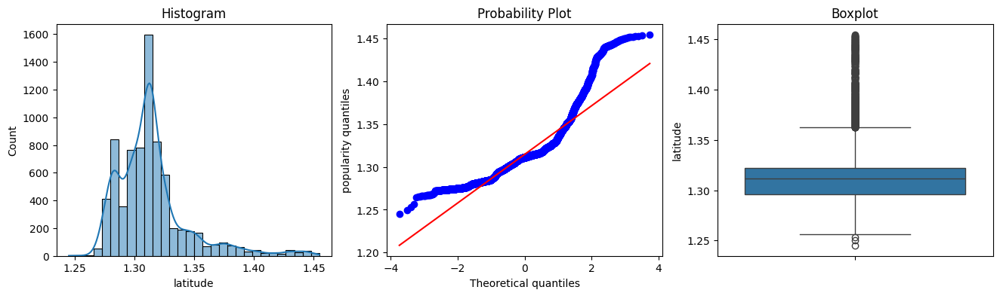

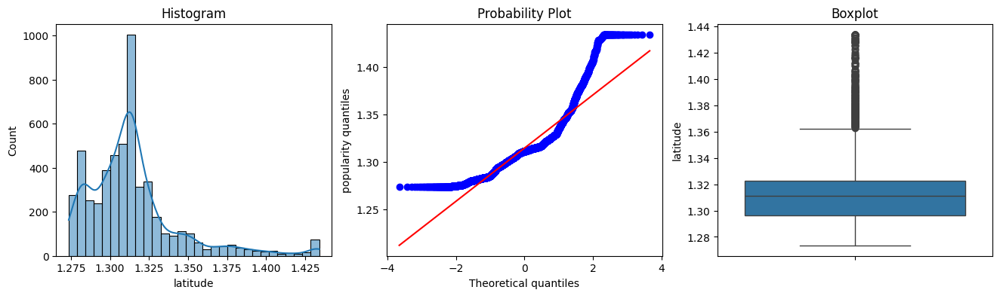

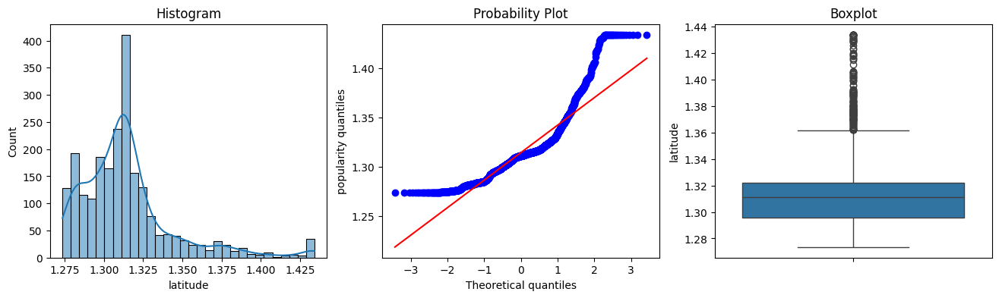

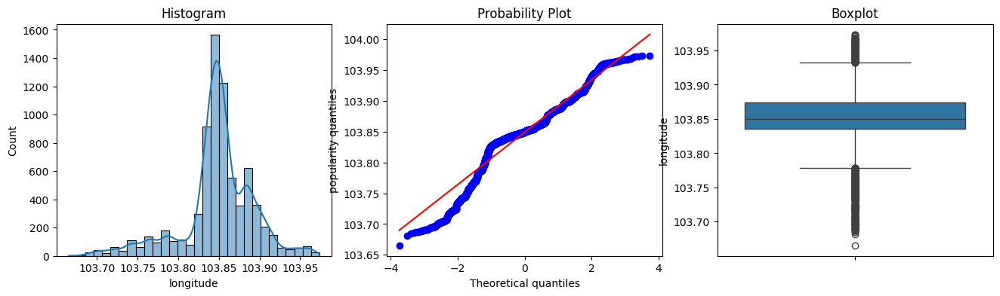

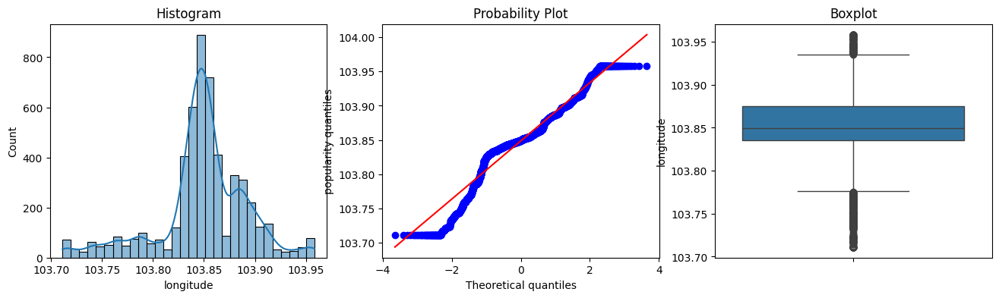

...

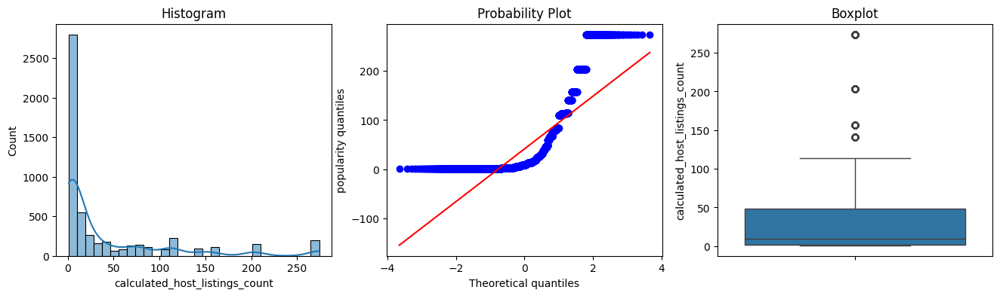

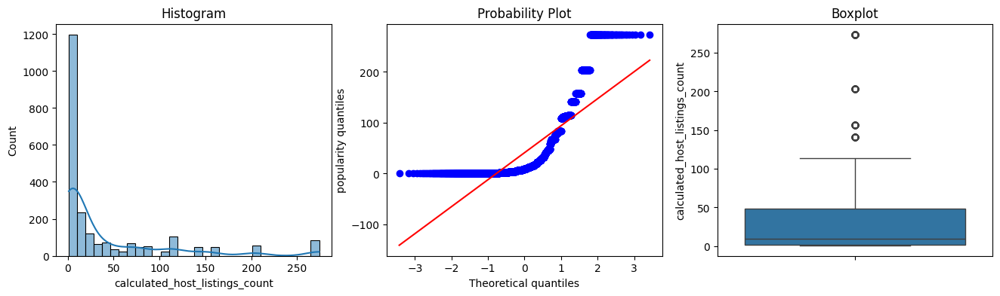

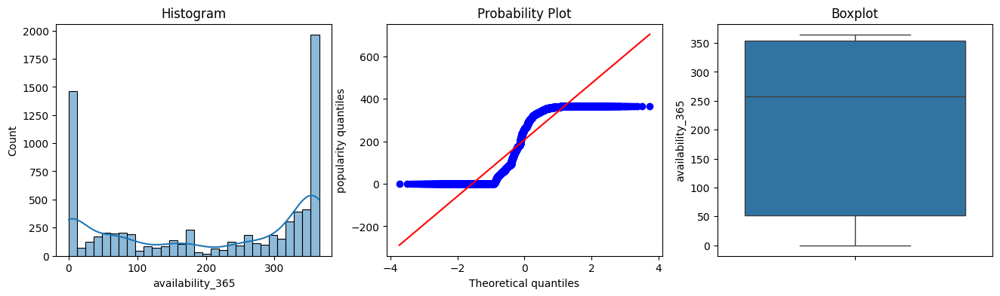

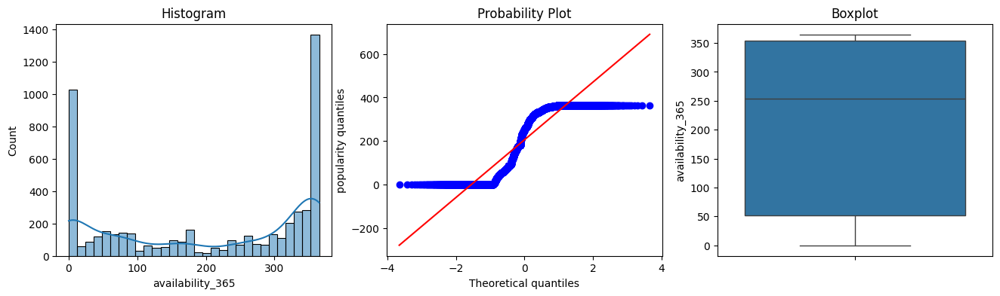

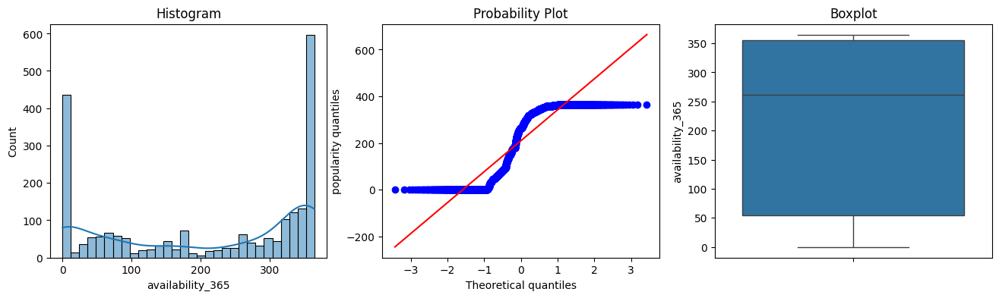

In [6096]:
# print distribution for columns_for_transforming before transformation
for col in columns_for_transforming:
    diagnostic_plots(listings_data, col)
    diagnostic_plots(X_train_listings, col)
    diagnostic_plots(X_test_listings, col)
    print()
    print()
    print()


In [6097]:
# yjt = YeoJohnsonTransformer(variables = ['latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365'])

# yjt.fit(X_train_listings)

In [6098]:
# number_of_reviews, reviews_per_month,  availability_365 contains '0' as values
yjt = YeoJohnsonTransformer(variables = ['number_of_reviews','minimum_nights', 'reviews_per_month','availability_365'])

yjt.fit(X_train_listings)

YeoJohnsonTransformer(variables=['number_of_reviews', 'minimum_nights',
                                 'reviews_per_month', 'availability_365'])

In [6099]:
X_train_listings = yjt.transform(X_train_listings)
X_test_listings = yjt.transform(X_test_listings)

In [6100]:
yjt.lambda_dict_

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\IPython\core\displayhook.py:281: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


{'number_of_reviews': -0.34434017479390705,
 'minimum_nights': -0.5629683195028847,
 'reviews_per_month': -1.7432798166671475,
 'availability_365': 0.5009211211412403}

In [6101]:
lt = LogTransformer(variables=['latitude', 'longitude', 'calculated_host_listings_count'])

lt.fit(X_train_listings)

LogTransformer(variables=['latitude', 'longitude',
                          'calculated_host_listings_count'])

In [6102]:
X_train_listings = lt.transform(X_train_listings)
X_test_listings = lt.transform(X_test_listings)

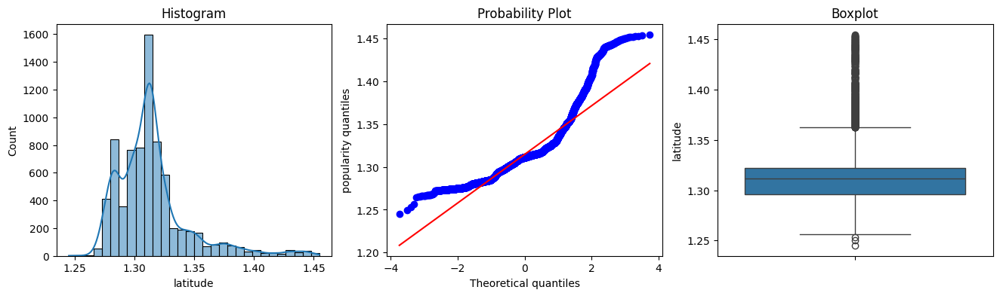

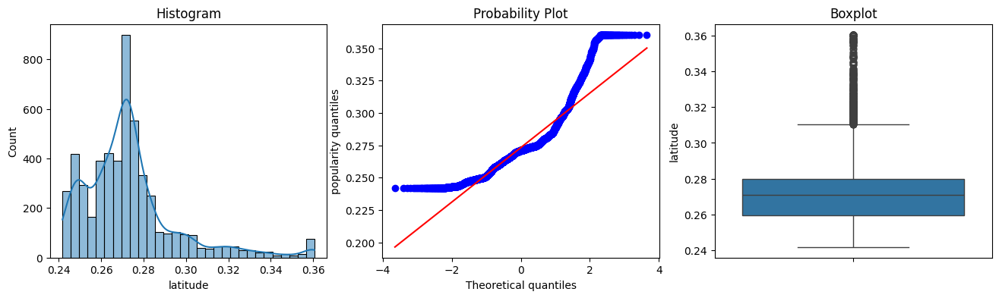

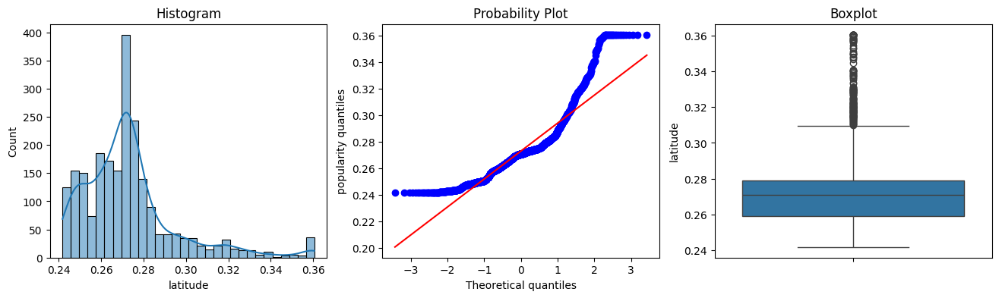

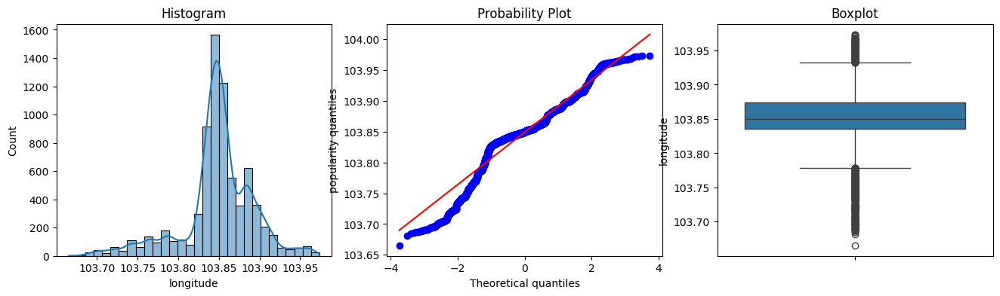

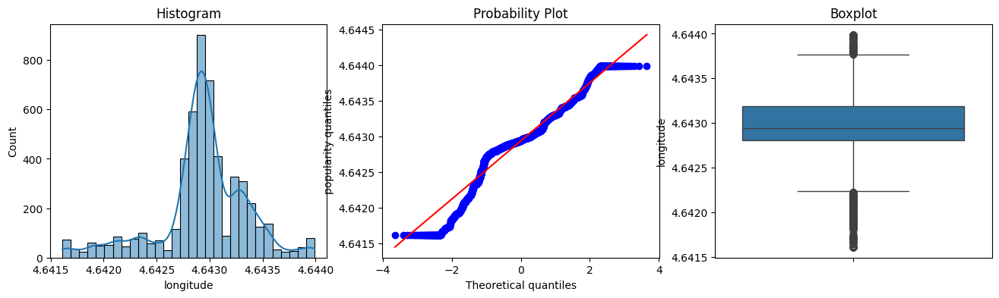

...

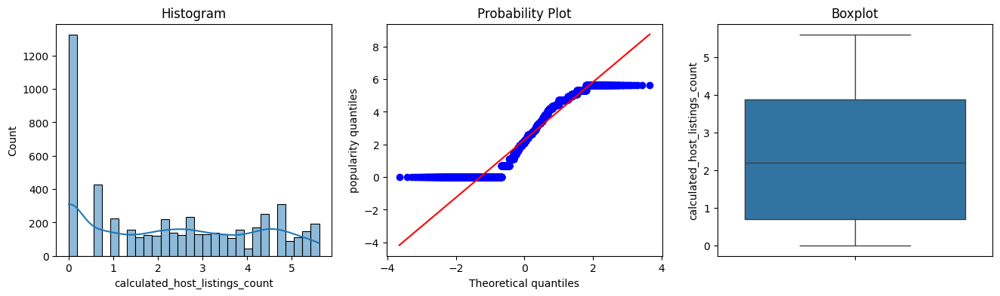

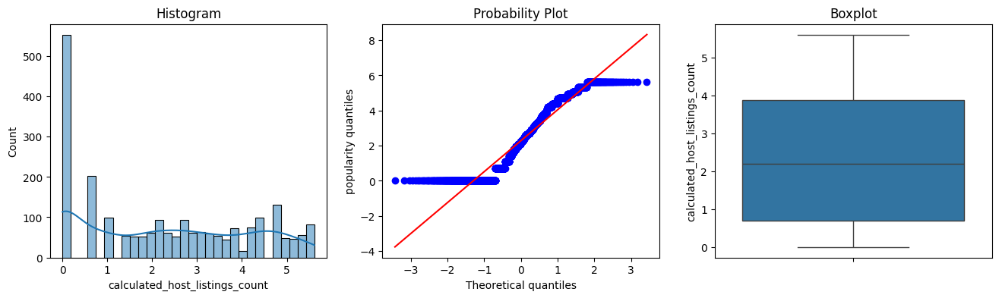

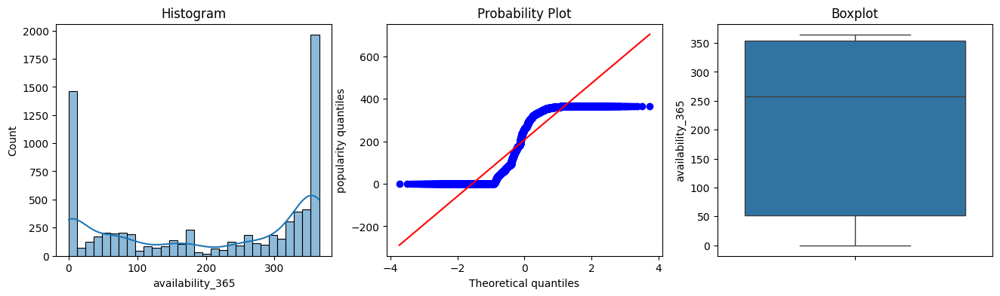

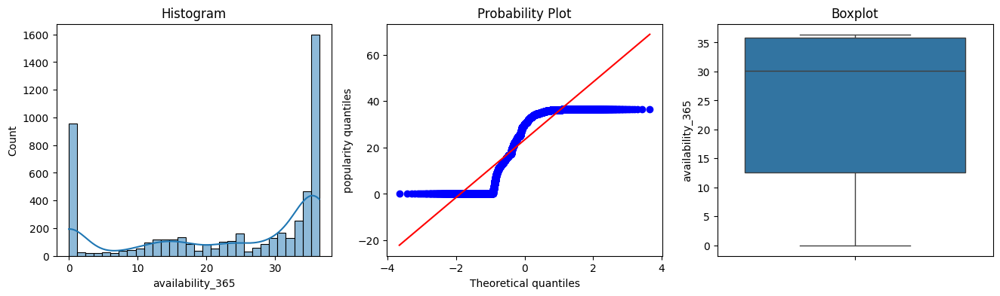

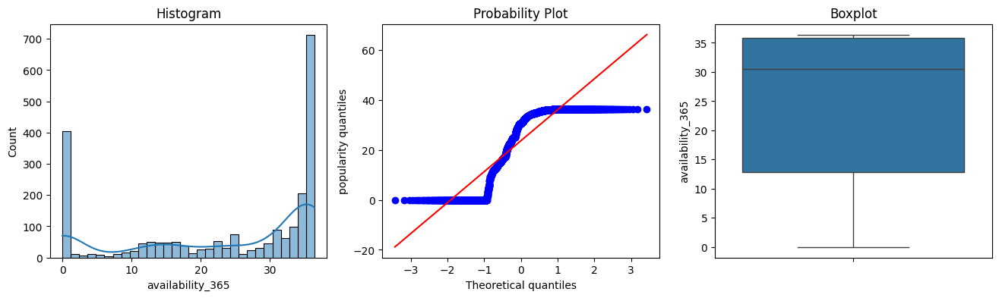

In [6103]:
# print distribution for columns_for_transforming before transformation
for col in columns_for_transforming:
    diagnostic_plots(listings_data, col)
    diagnostic_plots(X_train_listings, col)
    diagnostic_plots(X_test_listings, col)
    print()
    print()
    print()


latitude                          0.0
longitude                         0.0
minimum_nights                    0.0
number_of_reviews                 0.0
reviews_per_month                 0.0
calculated_host_listings_count    0.0
availability_365                  0.0
dtype: float64


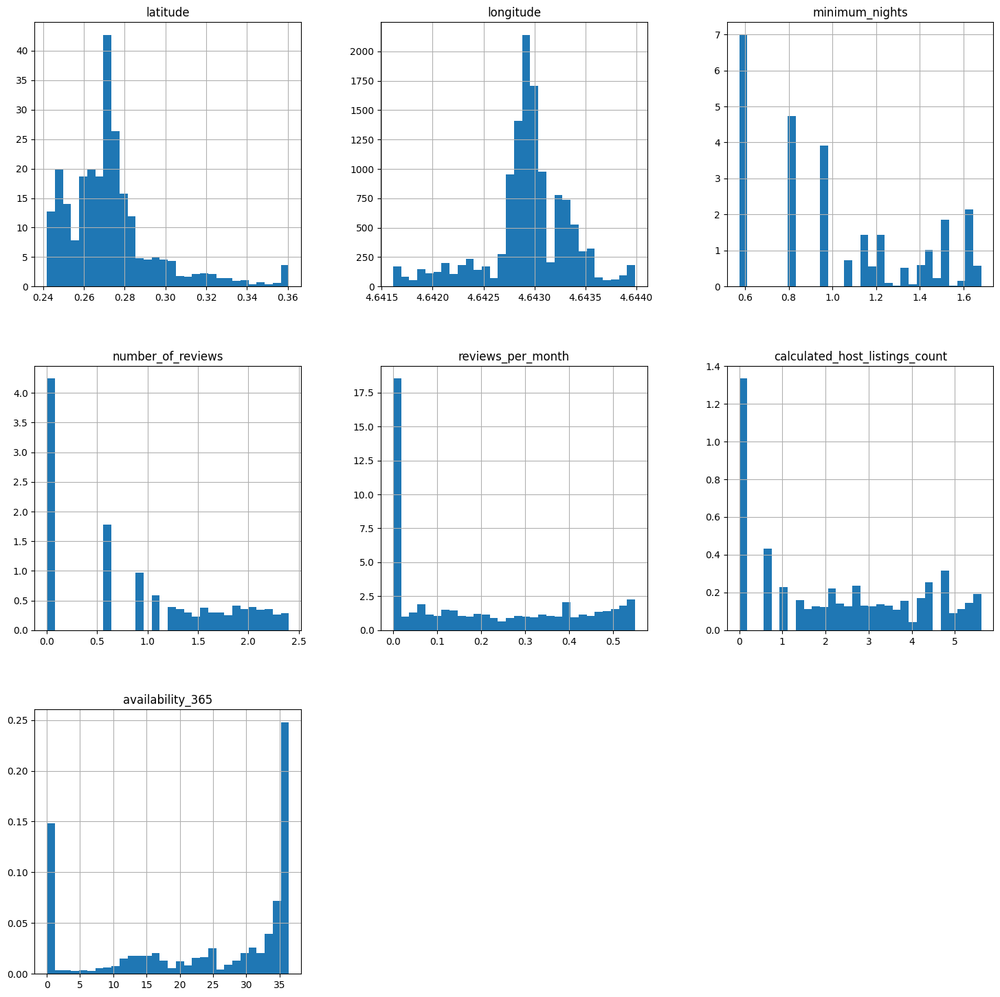

In [6104]:
num_cols = [c for c in X_train_listings.columns if X_train_listings[c].dtypes!='O']
print(X_train_listings[num_cols].isnull().mean())

X_train_listings[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

latitude                          0.0
longitude                         0.0
minimum_nights                    0.0
number_of_reviews                 0.0
reviews_per_month                 0.0
calculated_host_listings_count    0.0
availability_365                  0.0
dtype: float64


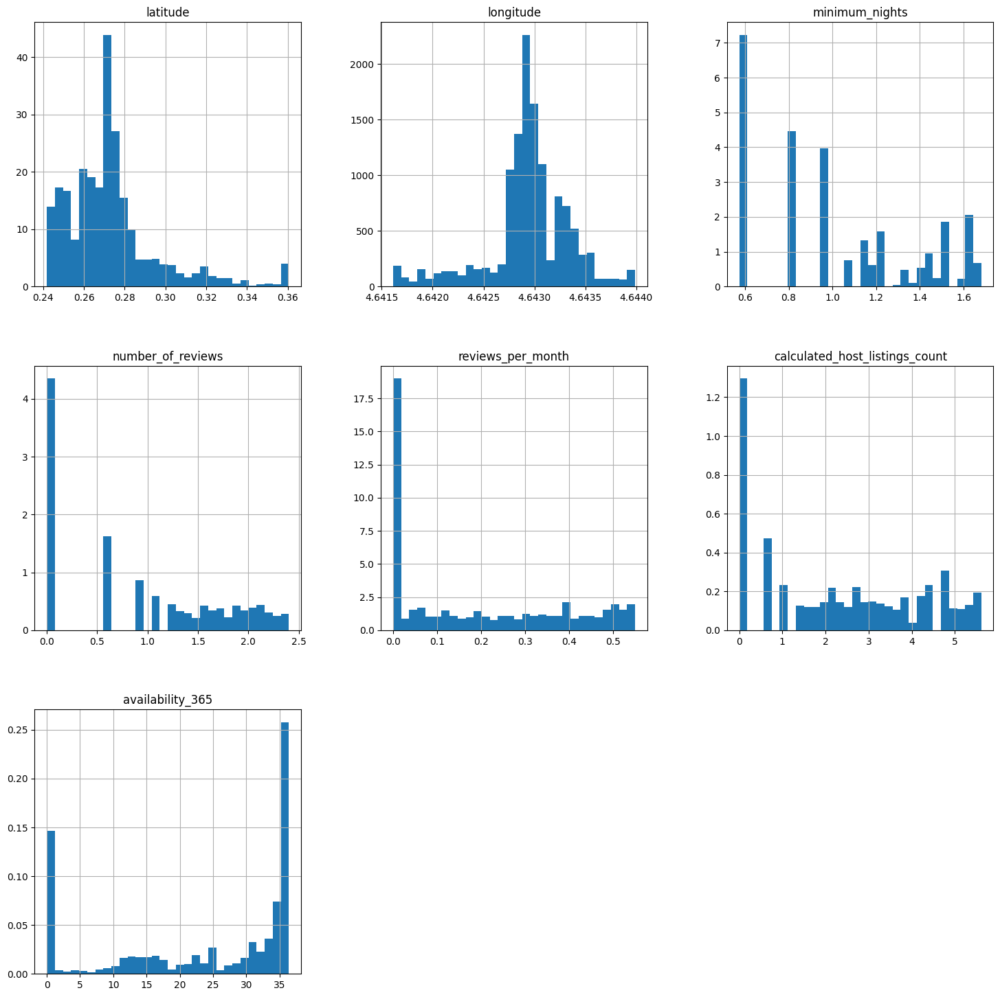

In [6105]:
num_cols = [c for c in X_test_listings.columns if X_test_listings[c].dtypes!='O']
print(X_test_listings[num_cols].isnull().mean())

X_test_listings[num_cols].hist(bins=30, figsize=(18,18), density=True)
plt.show()

### Grouping rare categories

In [6106]:
X_train_listings['neighbourhood'].value_counts()/len(X_train_listings)

neighbourhood
Kallang                    0.129075
Geylang                    0.126060
Novena                     0.071038
Rochor                     0.066704
Outram                     0.060109
Bukit Merah                0.059732
Downtown Core              0.052195
Bedok                      0.048615
River Valley               0.044093
Queenstown                 0.037498
Tanglin                    0.025061
Marine Parade              0.023177
Jurong West                0.019785
Singapore River            0.019031
Newton                     0.018089
Bukit Timah                0.016582
Jurong East                0.016393
Orchard                    0.015263
Hougang                    0.013755
Clementi                   0.013755
Toa Payoh                  0.012813
Pasir Ris                  0.009233
Choa Chu Kang              0.008856
Bukit Batok                0.008856
Woodlands                  0.008856
Tampines                   0.008668
Sengkang                   0.008291
Ang Mo Kio    

In [6107]:
X_test_listings['neighbourhood'].value_counts()/len(X_test_listings)

neighbourhood
Kallang                    0.139341
Geylang                    0.130110
Novena                     0.068132
Outram                     0.065055
Rochor                     0.064615
Bukit Merah                0.060659
Downtown Core              0.056264
River Valley               0.049670
Bedok                      0.046154
Queenstown                 0.028132
Tanglin                    0.028132
Singapore River            0.021099
Marine Parade              0.020220
Jurong West                0.019780
Bukit Timah                0.017582
Toa Payoh                  0.014066
Hougang                    0.014066
Orchard                    0.012747
Jurong East                0.012747
Newton                     0.012747
Clementi                   0.012308
Serangoon                  0.012308
Sengkang                   0.009231
Pasir Ris                  0.009231
Woodlands                  0.008352
Bishan                     0.007473
Bukit Panjang              0.007033
Bukit Batok   

In [6108]:
def find_frequent_labels(df, variable, tolerance):
    
    temp = df[variable].value_counts()  / len(df)
    
    non_rare = [x for x in temp.loc[temp>tolerance].index.values]
    
    return non_rare

In [6109]:
# identify non-rare categories for neighbourhood
frequent_cat = find_frequent_labels(X_train_listings, 'neighbourhood', 0.01)

frequent_cat

['Kallang',
 'Geylang',
 'Novena',
 'Rochor',
 'Outram',
 'Bukit Merah',
 'Downtown Core',
 'Bedok',
 'River Valley',
 'Queenstown',
 'Tanglin',
 'Marine Parade',
 'Jurong West',
 'Singapore River',
 'Newton',
 'Bukit Timah',
 'Jurong East',
 'Orchard',
 'Hougang',
 'Clementi',
 'Toa Payoh']

In [6110]:
# identify rare categories for neighbourhood
rare_categories = [x for x in X_train_listings['neighbourhood'].unique() if x not in frequent_cat]
print("Rare categories:", rare_categories)

Rare categories: ['Bukit Batok', 'Museum', 'Tampines', 'Sengkang', 'Sembawang', 'Central Water Catchment', 'Woodlands', 'Bishan', 'Ang Mo Kio', 'Choa Chu Kang', 'Pasir Ris', 'Yishun', 'Serangoon', 'Punggol', 'Bukit Panjang', 'Western Water Catchment', 'Southern Islands', 'Mandai', 'Sungei Kadut']


In [6111]:
# group rare categories for neighbourhood
X_train_listings['neighbourhood'] = np.where(X_train_listings['neighbourhood'].isin(frequent_cat), X_train_listings['neighbourhood'], 'Rare')
    
X_test_listings['neighbourhood'] = np.where(X_test_listings['neighbourhood'].isin(frequent_cat), X_test_listings['neighbourhood'], 'Rare')

In [6112]:
X_train_listings['neighbourhood'].value_counts() / len(X_train_listings)

neighbourhood
Kallang            0.129075
Geylang            0.126060
Rare               0.111174
Novena             0.071038
Rochor             0.066704
Outram             0.060109
Bukit Merah        0.059732
Downtown Core      0.052195
Bedok              0.048615
River Valley       0.044093
Queenstown         0.037498
Tanglin            0.025061
Marine Parade      0.023177
Jurong West        0.019785
Singapore River    0.019031
Newton             0.018089
Bukit Timah        0.016582
Jurong East        0.016393
Orchard            0.015263
Hougang            0.013755
Clementi           0.013755
Toa Payoh          0.012813
Name: count, dtype: float64

In [6113]:
X_train_listings.head(10)

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_period
3749,superior room near marine parade central,East Region,Bedok,0.268966,4.643539,Private room,0.573908,1.102337,0.143776,4.691348,36.034125,Between 1-3 years
4973,full unit bugis area location convenient,Central Region,Rochor,0.262241,4.642974,Private room,0.573908,-0.000000,-0.000000,0.000000,0.000000,No Review
81,singapore downtown room ensuite bathroom,Central Region,Kallang,0.268836,4.643032,Private room,1.128498,1.917565,0.287398,0.000000,14.529880,Up to 1 year
4061,private apt close mrt stn stn bouna vista,Central Region,Queenstown,0.248258,4.642306,Entire home/apt,1.492552,1.235595,0.309413,2.302585,23.373704,Up to 1 year
4278,bedroom novena mrt dm,Central Region,Novena,0.282559,4.642910,Entire home/apt,1.315783,1.484910,0.306434,4.948760,33.961383,Up to 1 year
3118,superhost br apt heart tg pagar,Central Region,Downtown Core,0.242303,4.642900,Entire home/apt,1.519303,1.541317,0.238020,5.613128,31.098316,Up to 1 year
6665,specious master bedroom min cbd airport,Central Region,Queenstown,0.255479,4.642193,Private room,1.315783,-0.000000,-0.000000,0.000000,30.483141,No Review
718,deluxe bedroom sommerset,Central Region,Newton,0.266586,4.642852,Entire home/apt,0.962391,2.217874,0.461450,1.791759,21.130332,Up to 1 year
3061,centrally located furnish studio apt singapore,Central Region,Rochor,0.260216,4.642969,Entire home/apt,1.225358,1.418131,0.215373,2.397895,12.028119,Up to 1 year
6274,cosy loft apt br city全新近地铁市区复式公寓mrt,Central Region,Geylang,0.270317,4.643274,Entire home/apt,0.573908,1.337125,0.435172,3.091042,22.402035,Up to 1 year


In [6114]:
X_test_listings.head(10)

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_period
1568,happy home,West Region,Jurong West,0.300068,4.641611,Private room,1.182345,-0.000000,-0.000000,0.000000,0.000000,No Review
4303,private happyhut city centre,Central Region,Bukit Merah,0.253828,4.642764,Private room,0.573908,2.102312,0.522454,0.000000,11.738397,Up to 1 year
2610,cosy br apartment min walk mrt,East Region,Bedok,0.283041,4.643877,Entire home/apt,0.962391,1.541317,0.210555,0.693147,20.779267,Between 1-3 years
4911,amazing spacious bedroom apt unit katong,Central Region,Geylang,0.273335,4.643412,Entire home/apt,0.962391,-0.000000,-0.000000,3.806662,11.591228,No Review
1763,private room nice quiet surrounding,North-East Region,Rare,0.322851,4.643058,Private room,0.573908,-0.000000,-0.000000,0.000000,24.915573,No Review
2921,private sanctuary spacious luxury condo ensuite,West Region,Jurong West,0.297717,4.641711,Private room,0.962391,0.616634,0.306434,2.302585,36.403788,Up to 1 year
6145,classic ensuite brba central orachrd,Central Region,River Valley,0.260478,4.642805,Private room,0.819299,1.337125,0.447113,2.639057,32.821128,Up to 1 year
2649,luxury hostel incabin locker single mixed,Central Region,Outram,0.247813,4.642896,Shared room,0.573908,1.102337,0.124038,2.708050,36.140107,Between 1-3 years
1673,city centre large room outram park chinatown,Central Region,Bukit Merah,0.241808,4.642792,Private room,0.819299,1.830680,0.300316,2.197225,36.140107,Up to 1 year
3255,lucky plaza apt orchard near mrt master room e,Central Region,Orchard,0.266563,4.642785,Private room,0.573908,1.632305,0.303402,1.945910,24.840576,Up to 1 year


### Count Vectorisation

In [6115]:
count_vectorizer = CountVectorizer(max_features=50)
X_train_sparse = count_vectorizer.fit_transform(X_train_listings['name'])
X_test_sparse = count_vectorizer.transform(X_test_listings['name'])

In [6116]:
# count_vectorizer = CountVectorizer(max_features=30)
# X_train_sparse = count_vectorizer.fit_transform(X_train_listings['name'])
# X_test_sparse = count_vectorizer.transform(X_test_listings['name'])

In [6117]:
# count_vectorizer = CountVectorizer(max_features=40)
# X_train_sparse = count_vectorizer.fit_transform(X_train_listings['name'])
# X_test_sparse = count_vectorizer.transform(X_test_listings['name'])

In [6118]:
# convert sparse matrices to dense dataframes and retain original data
X_train_listings = X_train_listings.reset_index(drop=True)
X_test_listings = X_test_listings.reset_index(drop=True)

In [6119]:
X_train_listings_vectorized = pd.DataFrame(X_train_sparse.toarray(), columns=count_vectorizer.get_feature_names_out())
X_test_listings_vectorized = pd.DataFrame(X_test_sparse.toarray(), columns=count_vectorizer.get_feature_names_out())

In [6120]:
# concatenate the vectorized features back to the original DataFrame
X_train_listings = pd.concat([X_train_listings, X_train_listings_vectorized], axis=1)
X_test_listings = pd.concat([X_test_listings, X_test_listings_vectorized], axis=1)

In [6121]:
# drop the name column as it is no longer needed
X_train_listings.drop(columns=['name'], inplace=True)
X_test_listings.drop(columns=['name'], inplace=True)

In [6122]:
X_train_listings.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,...,singapore,single,spacious,stay,studio,suite,unit,view,walk,wifi
0,East Region,Bedok,0.268966,4.643539,Private room,0.573908,1.102337,0.143776,4.691348,36.034125,...,0,0,0,0,0,0,0,0,0,0
1,Central Region,Rochor,0.262241,4.642974,Private room,0.573908,-0.000000,-0.000000,0.000000,0.000000,...,0,0,0,0,0,0,1,0,0,0
2,Central Region,Kallang,0.268836,4.643032,Private room,1.128498,1.917565,0.287398,0.000000,14.529880,...,1,0,0,0,0,0,0,0,0,0
3,Central Region,Queenstown,0.248258,4.642306,Entire home/apt,1.492552,1.235595,0.309413,2.302585,23.373704,...,0,0,0,0,0,0,0,0,0,0
4,Central Region,Novena,0.282559,4.642910,Entire home/apt,1.315783,1.484910,0.306434,4.948760,33.961383,...,0,0,0,0,0,0,0,0,0,0


In [6123]:
X_test_listings.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,...,singapore,single,spacious,stay,studio,suite,unit,view,walk,wifi
0,West Region,Jurong West,0.300068,4.641611,Private room,1.182345,-0.000000,-0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
1,Central Region,Bukit Merah,0.253828,4.642764,Private room,0.573908,2.102312,0.522454,0.000000,11.738397,...,0,0,0,0,0,0,0,0,0,0
2,East Region,Bedok,0.283041,4.643877,Entire home/apt,0.962391,1.541317,0.210555,0.693147,20.779267,...,0,0,0,0,0,0,0,0,1,0
3,Central Region,Geylang,0.273335,4.643412,Entire home/apt,0.962391,-0.000000,-0.000000,3.806662,11.591228,...,0,0,1,0,0,0,1,0,0,0
4,North-East Region,Rare,0.322851,4.643058,Private room,0.573908,-0.000000,-0.000000,0.000000,24.915573,...,0,0,0,0,0,0,0,0,0,0


In [6124]:
X_train_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5307 entries, 0 to 5306
Data columns (total 61 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             5307 non-null   object 
 1   neighbourhood                   5307 non-null   object 
 2   latitude                        5307 non-null   float64
 3   longitude                       5307 non-null   float64
 4   room_type                       5307 non-null   object 
 5   minimum_nights                  5307 non-null   float64
 6   number_of_reviews               5307 non-null   float64
 7   reviews_per_month               5307 non-null   float64
 8   calculated_host_listings_count  5307 non-null   float64
 9   availability_365                5307 non-null   float64
 10  last_review_period              5307 non-null   object 
 11  amazing                         5307 non-null   int64  
 12  apartment                       53

In [6125]:
X_test_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2275 entries, 0 to 2274
Data columns (total 61 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             2275 non-null   object 
 1   neighbourhood                   2275 non-null   object 
 2   latitude                        2275 non-null   float64
 3   longitude                       2275 non-null   float64
 4   room_type                       2275 non-null   object 
 5   minimum_nights                  2275 non-null   float64
 6   number_of_reviews               2275 non-null   float64
 7   reviews_per_month               2275 non-null   float64
 8   calculated_host_listings_count  2275 non-null   float64
 9   availability_365                2275 non-null   float64
 10  last_review_period              2275 non-null   object 
 11  amazing                         2275 non-null   int64  
 12  apartment                       22

### Categorical Data Encoding

In [6126]:
categorical_columns = X_train_listings.select_dtypes(include=['object']).columns

# Print cardinality for each categorical column
for col in categorical_columns:
    print(f"Cardinality for '{col}': {X_train_listings[col].nunique()}")

Cardinality for 'neighbourhood_group': 5
Cardinality for 'neighbourhood': 22
Cardinality for 'room_type': 3
Cardinality for 'last_review_period': 5


In [6127]:
listings_data[["neighbourhood", "price"]]

,neighbourhood,price
0,Woodlands,83
1,Bukit Timah,81
2,Woodlands,69
3,Tampines,206
4,Tampines,94
...,...,...
7901,Queenstown,100
7902,Queenstown,100
7904,Kallang,58
7905,River Valley,56


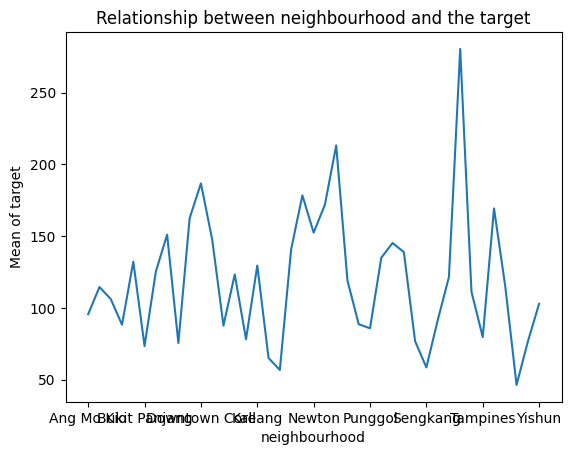

In [6128]:
listings_data.groupby(['neighbourhood'])['price'].mean().plot()
plt.title('Relationship between neighbourhood and the target')
plt.ylabel('Mean of target')
plt.show()

In [6129]:
# calculate the combined target mean for rare categories (mean price of all rare categories)
combined_mean_rare = listings_data[listings_data['neighbourhood'].isin(rare_categories)]['price'].mean()

# calculate the target mean for all neighbourhood categories
ordered_labels = listings_data.groupby('neighbourhood')['price'].mean().to_dict()

# apply target mean encoding to 'neighbourhood' column in the training data
X_train_listings['neighbourhood'] = X_train_listings['neighbourhood'].apply(
    lambda x: combined_mean_rare if x in rare_categories else ordered_labels.get(x, combined_mean_rare)
)

# apply target mean encoding to 'neighbourhood' column in the test data
X_test_listings['neighbourhood'] = X_test_listings['neighbourhood'].apply(
    lambda x: combined_mean_rare if x in rare_categories else ordered_labels.get(x, combined_mean_rare)
)


In [6130]:
X_train_listings_enc = X_train_listings
X_test_listings_enc = X_test_listings

In [6131]:
X_train_listings_enc.shape

(5307, 61)

In [6132]:
X_test_listings_enc.shape

(2275, 61)

In [6133]:
X_train_listings_enc.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,...,singapore,single,spacious,stay,studio,suite,unit,view,walk,wifi
0,East Region,114.482094,0.268966,4.643539,Private room,0.573908,1.102337,0.143776,4.691348,36.034125,...,0,0,0,0,0,0,0,0,0,0
1,Central Region,138.854291,0.262241,4.642974,Private room,0.573908,-0.000000,-0.000000,0.000000,0.000000,...,0,0,0,0,0,0,1,0,0,0
2,Central Region,129.466068,0.268836,4.643032,Private room,1.128498,1.917565,0.287398,0.000000,14.529880,...,1,0,0,0,0,0,0,0,0,0
3,Central Region,134.931559,0.248258,4.642306,Entire home/apt,1.492552,1.235595,0.309413,2.302585,23.373704,...,0,0,0,0,0,0,0,0,0,0
4,Central Region,171.941729,0.282559,4.642910,Entire home/apt,1.315783,1.484910,0.306434,4.948760,33.961383,...,0,0,0,0,0,0,0,0,0,0


In [6134]:
X_test_listings_enc.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,...,singapore,single,spacious,stay,studio,suite,unit,view,walk,wifi
0,West Region,78.100000,0.300068,4.641611,Private room,1.182345,-0.000000,-0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
1,Central Region,132.162637,0.253828,4.642764,Private room,0.573908,2.102312,0.522454,0.000000,11.738397,...,0,0,0,0,0,0,0,0,0,0
2,East Region,114.482094,0.283041,4.643877,Entire home/apt,0.962391,1.541317,0.210555,0.693147,20.779267,...,0,0,0,0,0,0,0,0,1,0
3,Central Region,147.557513,0.273335,4.643412,Entire home/apt,0.962391,-0.000000,-0.000000,3.806662,11.591228,...,0,0,1,0,0,0,1,0,0,0
4,North-East Region,93.635379,0.322851,4.643058,Private room,0.573908,-0.000000,-0.000000,0.000000,24.915573,...,0,0,0,0,0,0,0,0,0,0


In [6135]:
ohe_enc = OneHotEncoder(
    top_categories=None,
    drop_last=True)  # to return k-1, false to return k

ohe_enc.fit(X_train_listings_enc)

ohe_enc.variables

In [6136]:
X_train_listings_ohe = ohe_enc.transform(X_train_listings_enc)
X_test_listings_ohe = ohe_enc.transform(X_test_listings_enc)

X_train_listings_ohe.head()

,neighbourhood,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,amazing,apartment,...,neighbourhood_group_East Region,neighbourhood_group_Central Region,neighbourhood_group_North-East Region,neighbourhood_group_West Region,room_type_Private room,room_type_Entire home/apt,last_review_period_Between 1-3 years,last_review_period_No Review,last_review_period_Up to 1 year,last_review_period_Between 3-5 years
0,114.482094,0.268966,4.643539,0.573908,1.102337,0.143776,4.691348,36.034125,0,0,...,1,0,0,0,1,0,1,0,0,0
1,138.854291,0.262241,4.642974,0.573908,-0.000000,-0.000000,0.000000,0.000000,0,0,...,0,1,0,0,1,0,0,1,0,0
2,129.466068,0.268836,4.643032,1.128498,1.917565,0.287398,0.000000,14.529880,0,0,...,0,1,0,0,1,0,0,0,1,0
3,134.931559,0.248258,4.642306,1.492552,1.235595,0.309413,2.302585,23.373704,0,0,...,0,1,0,0,0,1,0,0,1,0
4,171.941729,0.282559,4.642910,1.315783,1.484910,0.306434,4.948760,33.961383,0,0,...,0,1,0,0,0,1,0,0,1,0


In [6137]:
X_train_listings_ohe.shape

(5307, 68)

In [6138]:
X_test_listings_ohe.shape

(2275, 68)

### Binning

In [6139]:
num_cols = [c for c in X_train_listings.columns if X_train_listings[c].dtypes!='O']
print(X_train_listings[num_cols].isnull().mean().sort_values())

neighbourhood                     0.0
home                              0.0
loft                              0.0
luxury                            0.0
master                            0.0
min                               0.0
modern                            0.0
mrt                               0.0
near                              0.0
new                               0.0
orchard                           0.0
park                              0.0
pool                              0.0
private                           0.0
queen                             0.0
rm                                0.0
road                              0.0
room                              0.0
singapore                         0.0
single                            0.0
spacious                          0.0
stay                              0.0
studio                            0.0
suite                             0.0
unit                              0.0
view                              0.0
heart       

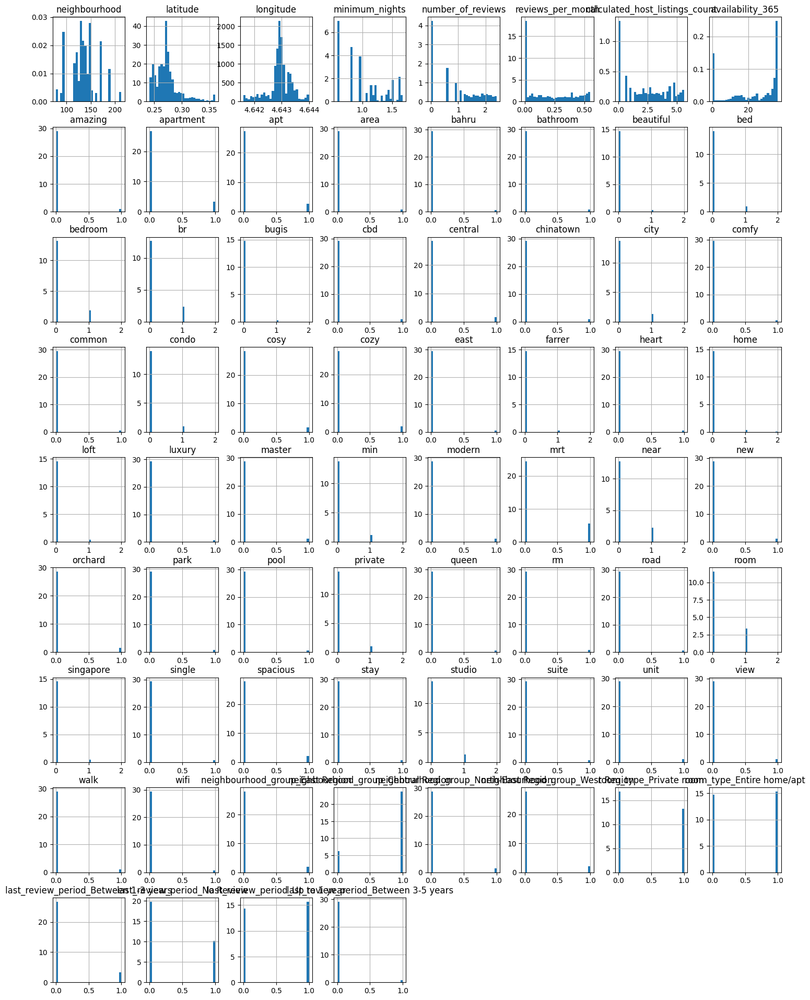

In [6140]:
X_train_listings_ohe.hist(bins=30, figsize=(18,24), density=True)
plt.show()

In [6141]:
# ['latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

In [6142]:
# # tried to make the distribution look more normal 
# disc = EqualWidthDiscretiser(bins=25, variables = ['minimum_nights','latitude', 'longitude']
# )

# disc.fit(X_train_listings_ohe)

In [6143]:
## tried to make the distribution look more normal 
disc = EqualWidthDiscretiser(bins=35, variables = ['minimum_nights','latitude', 'longitude']
)

disc.fit(X_train_listings_ohe)

EqualWidthDiscretiser(bins=35,
                      variables=['minimum_nights', 'latitude', 'longitude'])

In [6144]:
disc.binner_dict_

{'minimum_nights': [-inf,
  0.6055427470016042,
  0.6371775402980153,
  0.6688123335944265,
  0.7004471268908377,
  0.7320819201872488,
  0.7637167134836599,
  0.795351506780071,
  0.8269863000764822,
  0.8586210933728934,
  0.8902558866693046,
  0.9218906799657156,
  0.9535254732621268,
  0.985160266558538,
  1.0167950598549491,
  1.0484298531513603,
  1.0800646464477714,
  1.1116994397441826,
  1.1433342330405938,
  1.174969026337005,
  1.2066038196334161,
  1.2382386129298273,
  1.2698734062262385,
  1.3015081995226496,
  1.3331429928190608,
  1.364777786115472,
  1.3964125794118831,
  1.4280473727082943,
  1.4596821660047052,
  1.4913169593011164,
  1.5229517525975276,
  1.5545865458939387,
  1.58622133919035,
  1.617856132486761,
  1.6494909257831722,
  inf],
 'latitude': [-inf,
  0.2451999974413803,
  0.24859171833939558,
  0.2519834392374109,
  0.25537516013542616,
  0.2587668810334415,
  0.2621586019314568,
  0.26555032282947205,
  0.26894204372748737,
  0.2723337646255027,
  0

In [6145]:
X_train_listings_ohe = disc.transform(X_train_listings_ohe)
X_test_listings_ohe = disc.transform(X_test_listings_ohe)

In [6146]:
# # for skewed distributions to make the distribution look more evenly distributed
# disc = EqualFrequencyDiscretiser(q=15, variables = [ 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365'])
                                 
# disc.fit(X_train_listings_ohe)

In [6147]:
## for skewed distributions to make the distribution look more evenly distributed
disc = EqualFrequencyDiscretiser(q=20, variables = [ 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365'])
                                 
disc.fit(X_train_listings_ohe)

EqualFrequencyDiscretiser(q=20,
                          variables=['number_of_reviews', 'reviews_per_month',
                                     'calculated_host_listings_count',
                                     'availability_365'])

In [6148]:
disc.binner_dict_

{'number_of_reviews': [-inf,
  0.616634004994538,
  0.9147132941709439,
  1.1023369641134315,
  1.3371245230744704,
  1.4849097099984707,
  1.6323045090345563,
  1.8093439571408463,
  1.9454873340448555,
  2.081588014297666,
  2.2248921270256807,
  inf],
 'reviews_per_month': [-inf,
  0.028810144871749734,
  0.06382090476463763,
  0.10283608266059883,
  0.13735081650390205,
  0.18486237530005997,
  0.22923888921274013,
  0.2873976712455325,
  0.3365360947410357,
  0.3827783488443754,
  0.4149491299541765,
  0.460679239340483,
  0.49644538363519797,
  0.5266273574253171,
  inf],
 'calculated_host_listings_count': [-inf,
  0.6931471805599453,
  1.0986122886681098,
  1.3862943611198906,
  1.9459101490553132,
  2.1972245773362196,
  2.5649493574615367,
  2.772588722239781,
  3.1780538303479458,
  3.4657359027997265,
  3.871201010907891,
  4.330733340286331,
  4.6913478822291435,
  4.948759890378168,
  5.313205979041787,
  inf],
 'availability_365': [-inf,
  7.000471117087067,
  12.52111165

In [6149]:
X_train_listings_ohe = disc.transform(X_train_listings_ohe)
X_test_listings_ohe = disc.transform(X_test_listings_ohe)

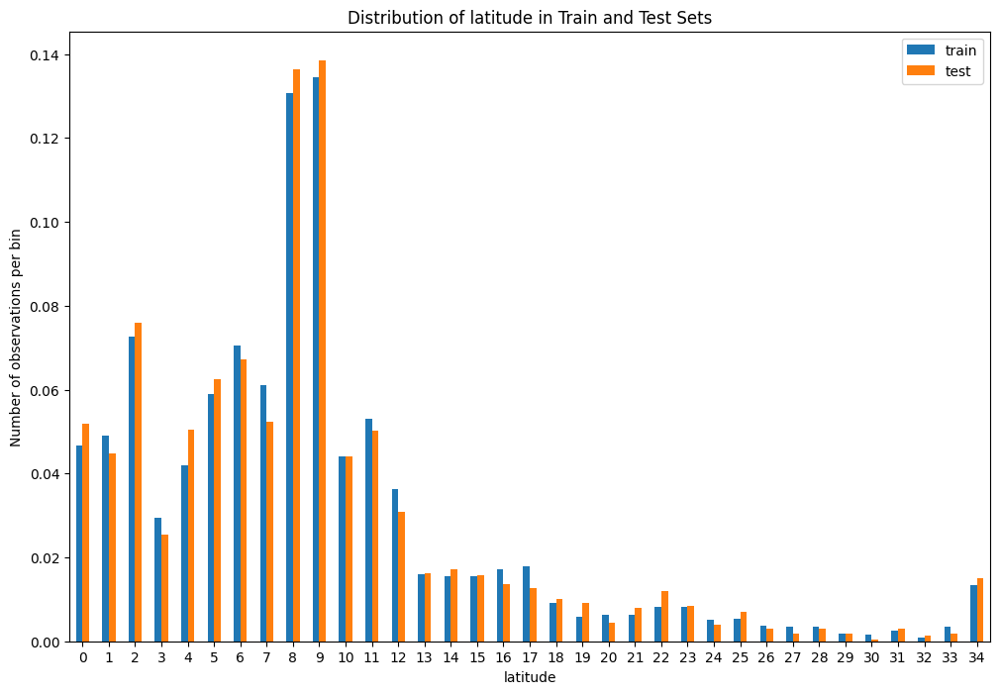

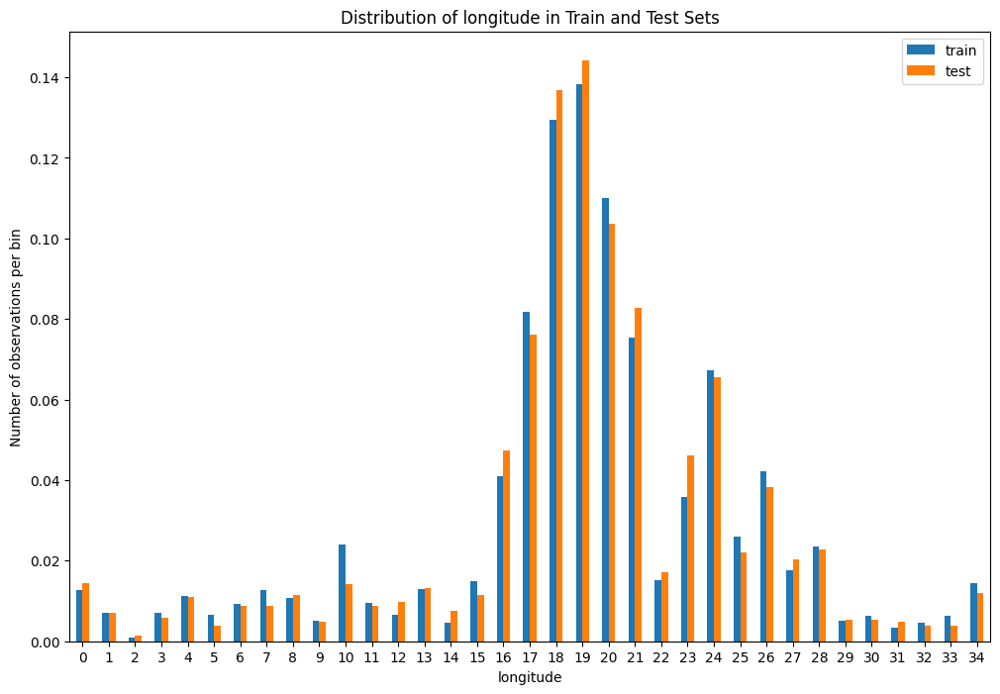

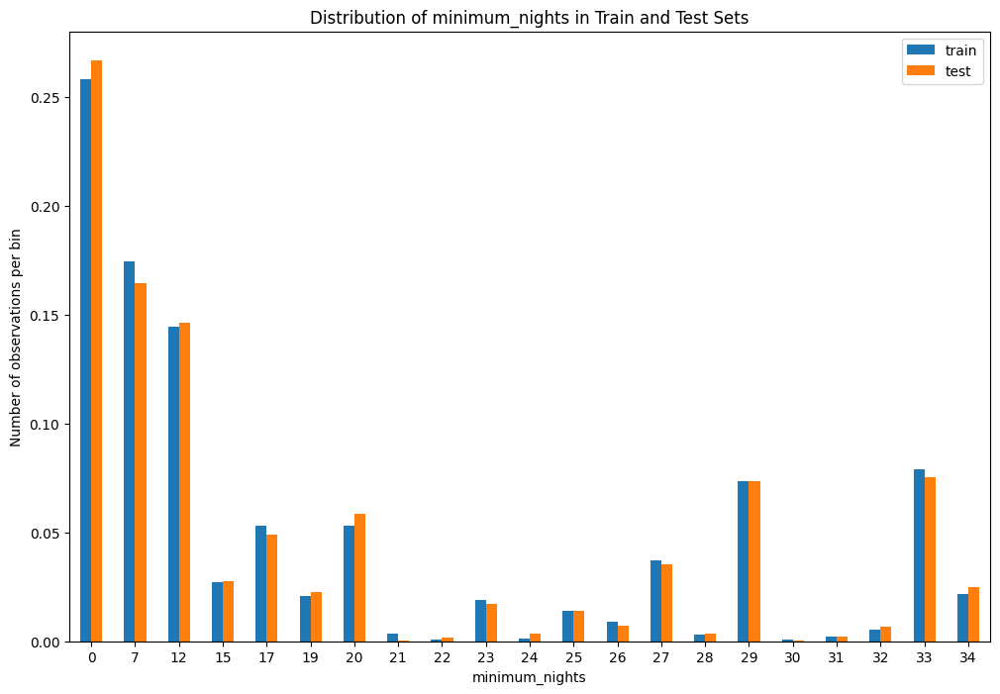

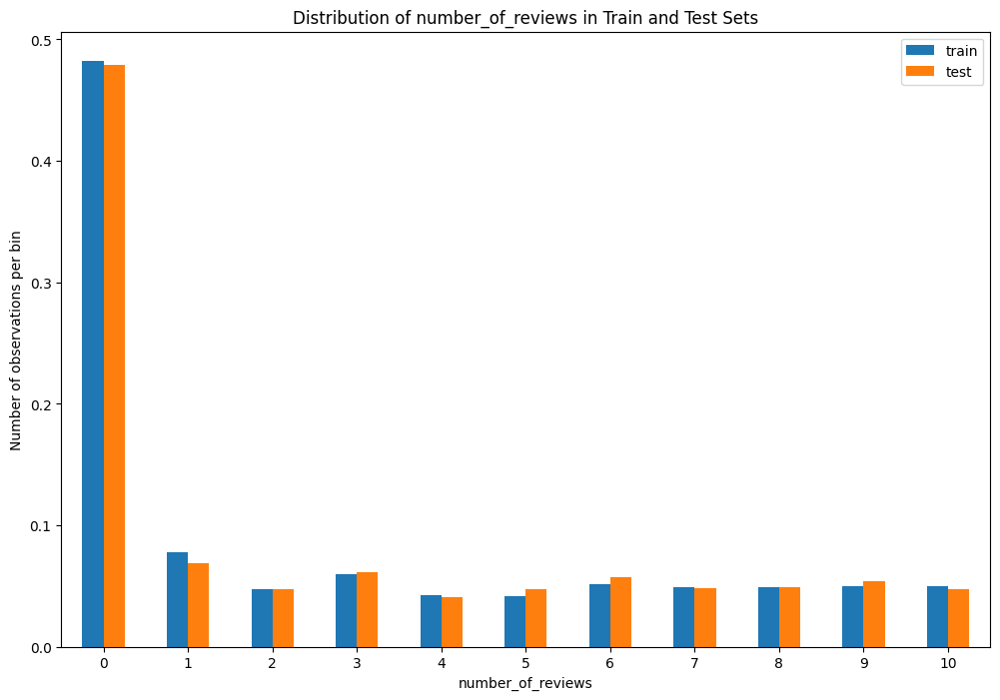

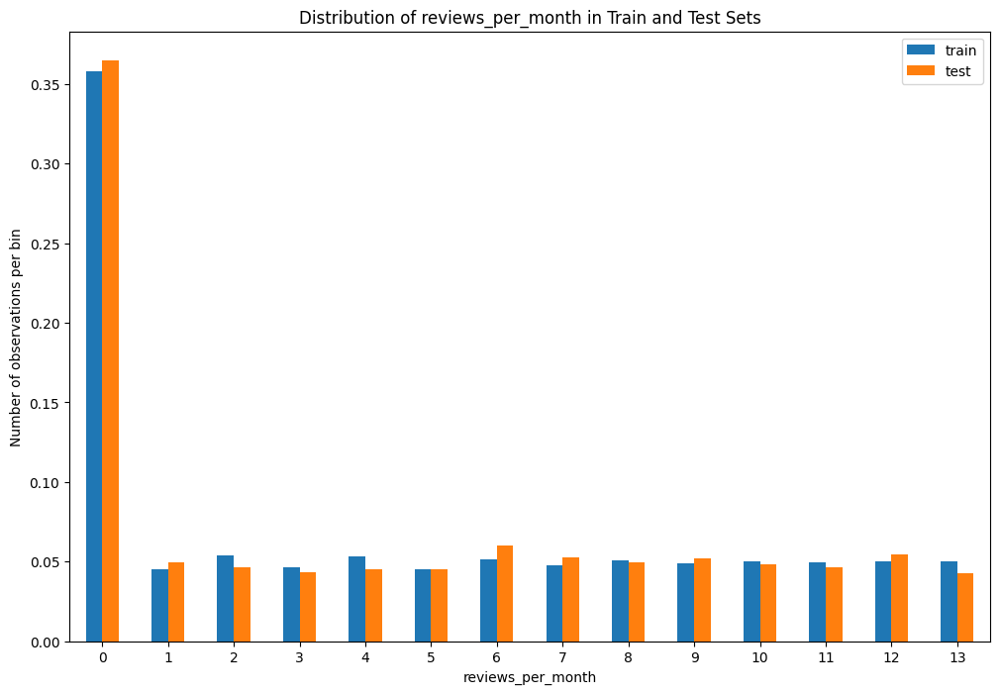

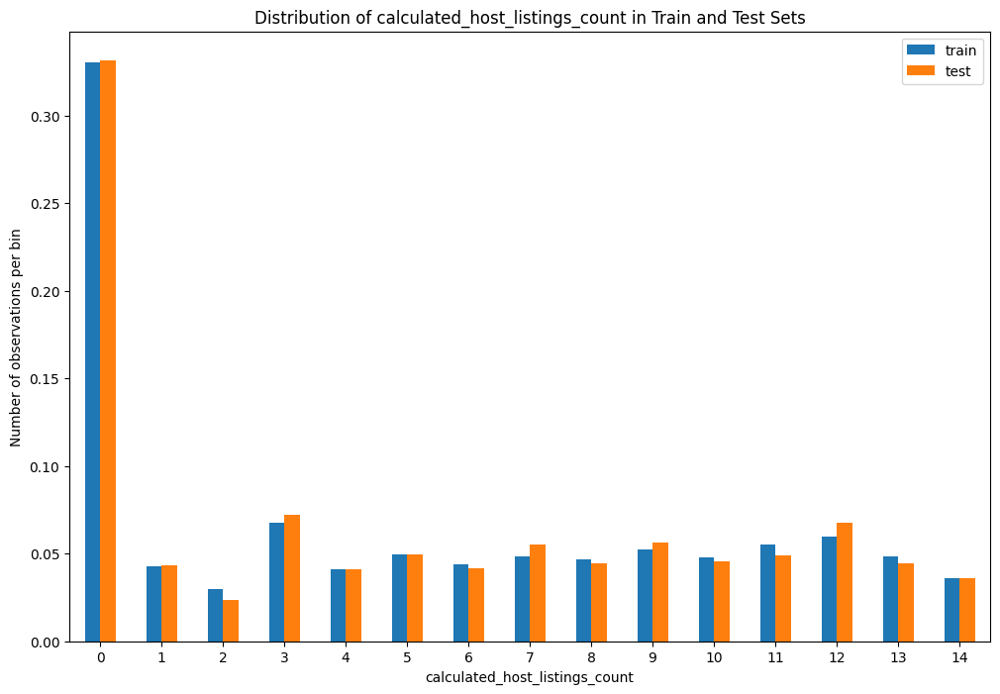

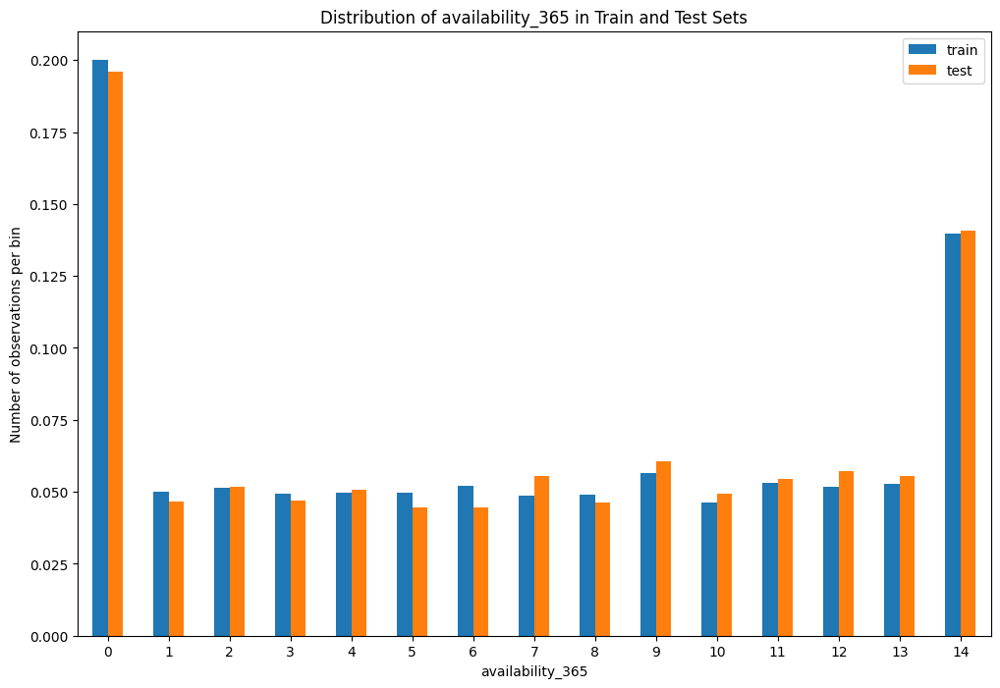

In [6150]:
# list of columns to plot
columns_to_plot = ['latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

for col in columns_to_plot:
    # calculate the proportion of observations per bin for training data
    t1 = X_train_listings_ohe.groupby([col])[col].count() / len(X_train_listings_ohe)
    
    # calculate the proportion of observations per bin for test data
    t2 = X_test_listings_ohe.groupby([col])[col].count() / len(X_test_listings_ohe)
    
    # concatenate the results into a single DataFrame
    tmp = pd.concat([t1, t2], axis=1)
    tmp.columns = ['train', 'test']
    
    tmp.plot.bar(figsize=(12,8))
    plt.xticks(rotation=0)
    plt.ylabel('Number of observations per bin')
    plt.title(f'Distribution of {col} in Train and Test Sets')
    plt.show()


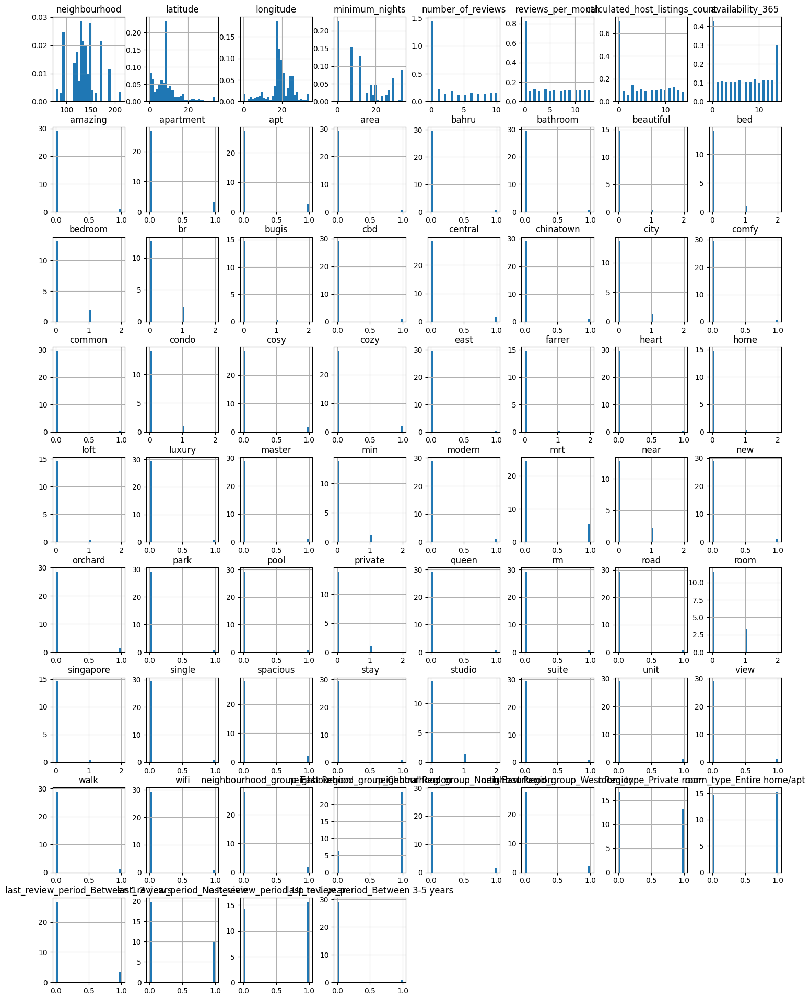

In [6151]:
X_train_listings_ohe.hist(bins=30, figsize=(18,24), density=True)
plt.show()

### Feature Engineering

In [6152]:
# choose robust scaling as my scaler as it is least sensitive to outliers
scaler = RobustScaler()

# fit the scaler to the train set, it will learn the parameters
scaler.fit(X_train_listings_ohe)

# transform train and test sets
X_train_listings_scaled = scaler.transform(X_train_listings_ohe)
X_test_listings_scaled = scaler.transform(X_test_listings_ohe)

In [6153]:
scaler.center_

array([132.16263736,   8.        ,  19.        ,  12.        ,
         1.        ,   3.        ,   4.        ,   6.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   1.        ,
         0.        ,   0.        ,   0.        ,   1.  

In [6154]:
scaler.scale_

array([28.57464357,  6.        ,  6.        , 23.        ,  5.        ,
        8.        ,  9.        ,  9.5       ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
        1.        ,  1.        ,  1.        ])

In [6155]:
# # standardisation: with the StandardScaler from sklearn

# # set up the scaler
# scaler = StandardScaler()

# # fit the scaler to the train set, it will learn the parameters
# scaler.fit(X_train_listings_ohe)

# # transform train and test sets
# X_train_listings_scaled = scaler.transform(X_train_listings_ohe)
# X_test_listings_scaled = scaler.transform(X_test_listings_ohe)

In [6156]:
# scaler.mean_

In [6157]:
# scaler.scale_

In [6158]:
# scaler = MinMaxScaler()

# # fit the scaler to the train set, it will learn the parameters
# scaler.fit(X_train_listings_ohe)

# # transform train and test sets
# X_train_listings_scaled = scaler.transform(X_train_listings_ohe)
# X_test_listings_scaled = scaler.transform(X_test_listings_ohe)

In [6159]:
# scaler.data_max_

In [6160]:
# scaler.min_

In [6161]:
# scaler.data_range_

In [6162]:
X_train_listings_scaled = pd.DataFrame(X_train_listings_scaled, columns=X_train_listings_ohe.columns)
X_test_listings_scaled = pd.DataFrame(X_test_listings_scaled, columns=X_test_listings_ohe.columns)

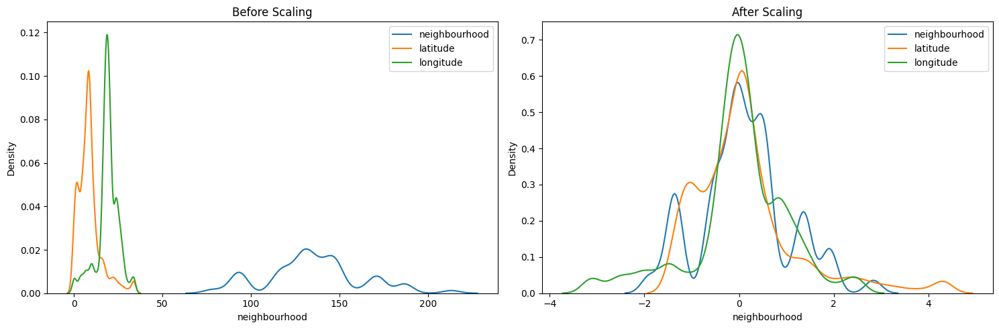

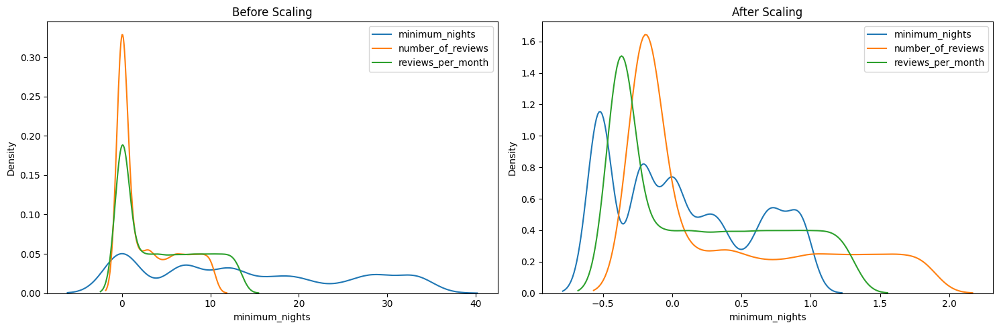

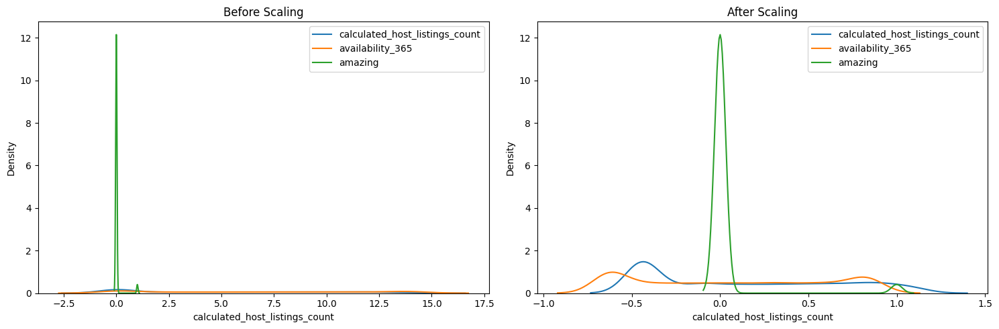

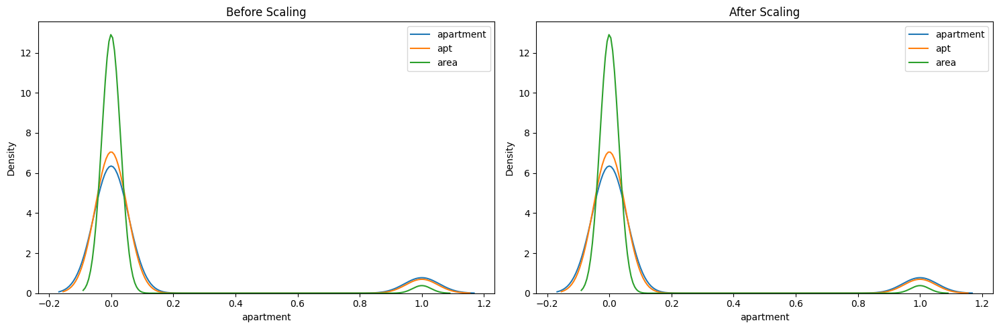

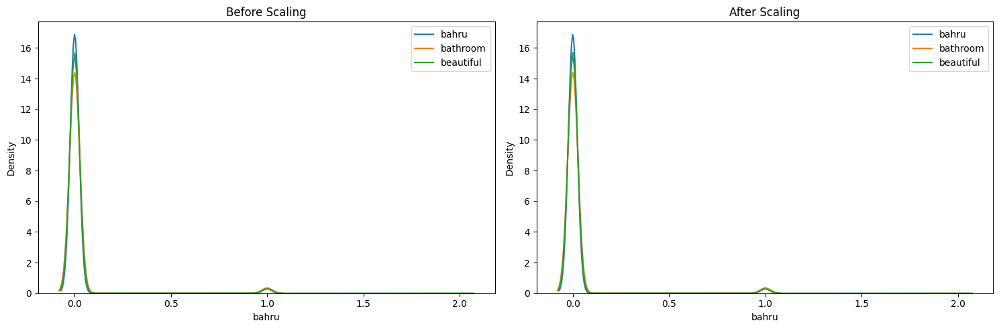

...

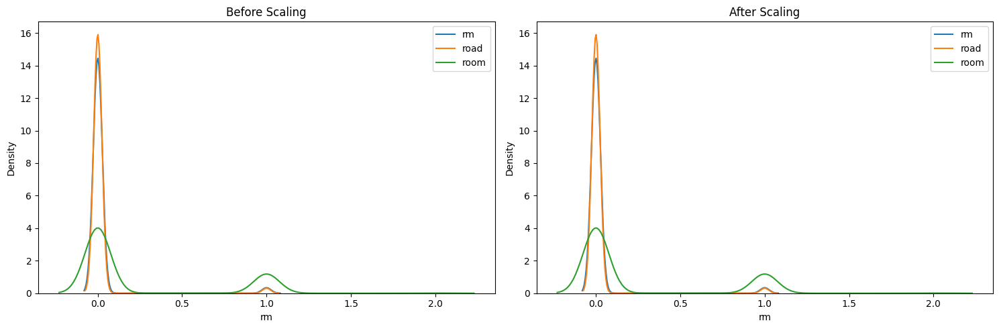

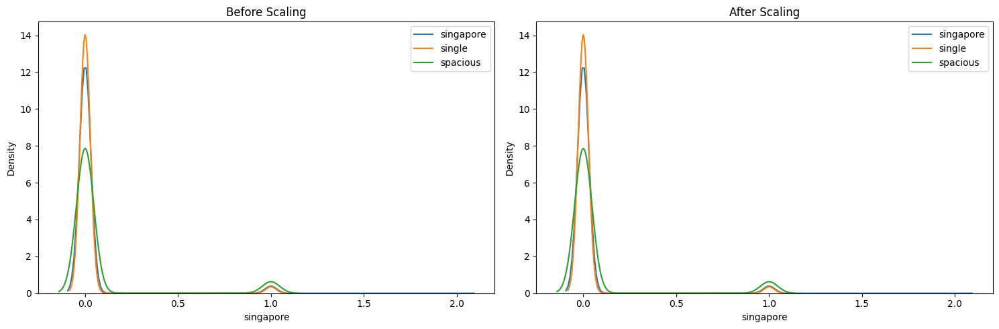

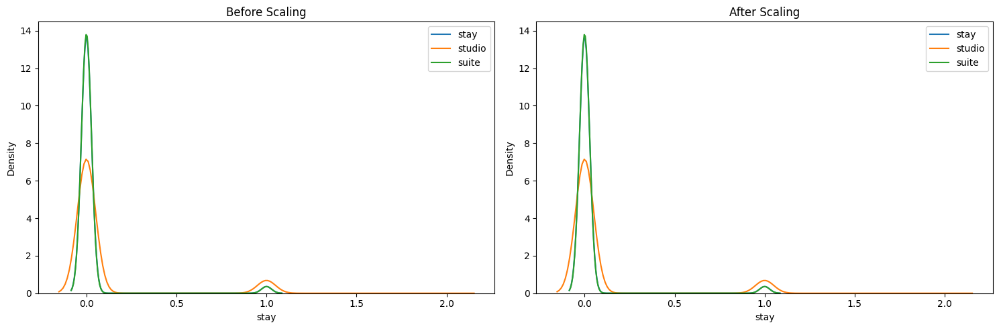

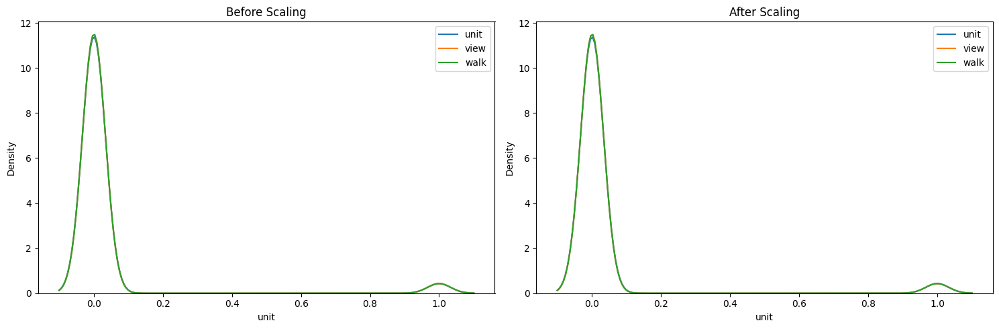

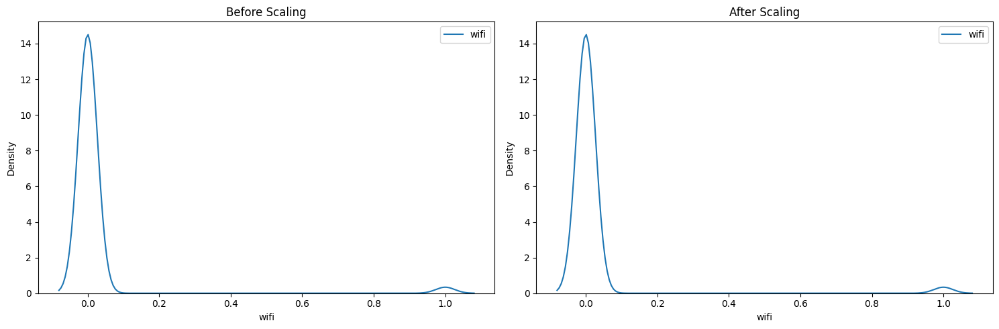

In [6163]:
# plot scaling plots
non_categorical_columns = X_train_listings_ohe.select_dtypes(include=['float64', 'int64']).columns

# define a function to plot KDE plots for a batch of columns
def plot_kde_plots(columns, X_train_listings_ohe, X_train_listings_scaled):
    # Create the figure and axes for plotting
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    
    # plot KDEs for the original data
    for column in columns:
        sns.kdeplot(X_train_listings_ohe[column], ax=axes[0], label=column)
    
    axes[0].set_title('Before Scaling')
    axes[0].legend()
    
    # plot KDEs for the scaled data
    for column in columns:
        sns.kdeplot(X_train_listings_scaled[column], ax=axes[1], label=column)
    
    axes[1].set_title('After Scaling')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# number of columns per batch
batch_size = 3

# loop through non-categorical columns in batches of 3
for i in range(0, len(non_categorical_columns), batch_size):
    batch_columns = non_categorical_columns[i:i + batch_size]
    plot_kde_plots(batch_columns, X_train_listings_ohe, X_train_listings_scaled)


### Polynomial Expansion

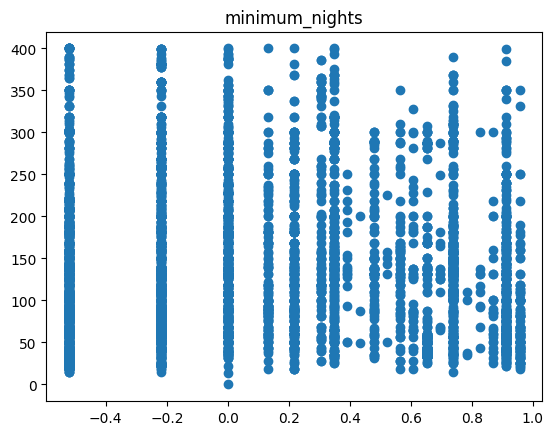

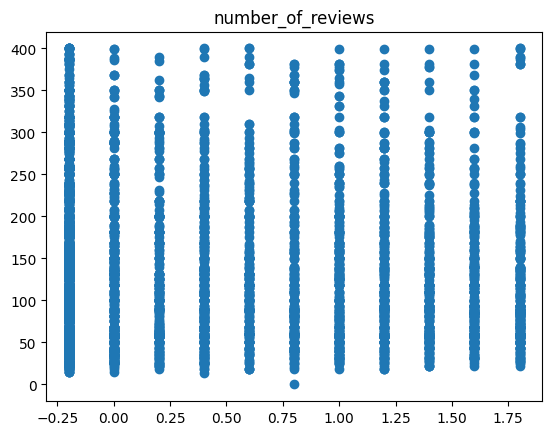

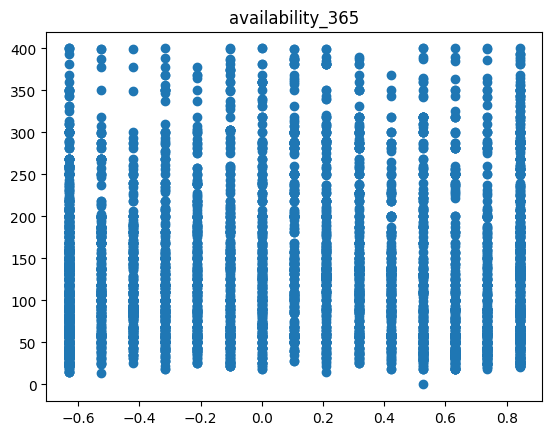

In [6164]:
# plot relation of features of interest with the target

for f in ['minimum_nights', 'number_of_reviews', 'availability_365']:
    plt.scatter(X_train_listings_scaled[f], y_train_listings)
    plt.title(f)
    plt.show()

In [6165]:
# choose variables with non-linear relationships with the target variable
key_features = ['minimum_nights', 'number_of_reviews', 'availability_365']

In [6166]:
# set degree to 2
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)

In [6167]:
poly.fit(X_train_listings_scaled[key_features])

PolynomialFeatures(include_bias=False)

In [6168]:
train_t_listings = poly.transform(X_train_listings_scaled[key_features])
test_t_listings = poly.transform(X_test_listings_scaled[key_features])

In [6169]:
poly_features = poly.get_feature_names_out(key_features)

In [6170]:
len(poly.get_feature_names_out(key_features))

9

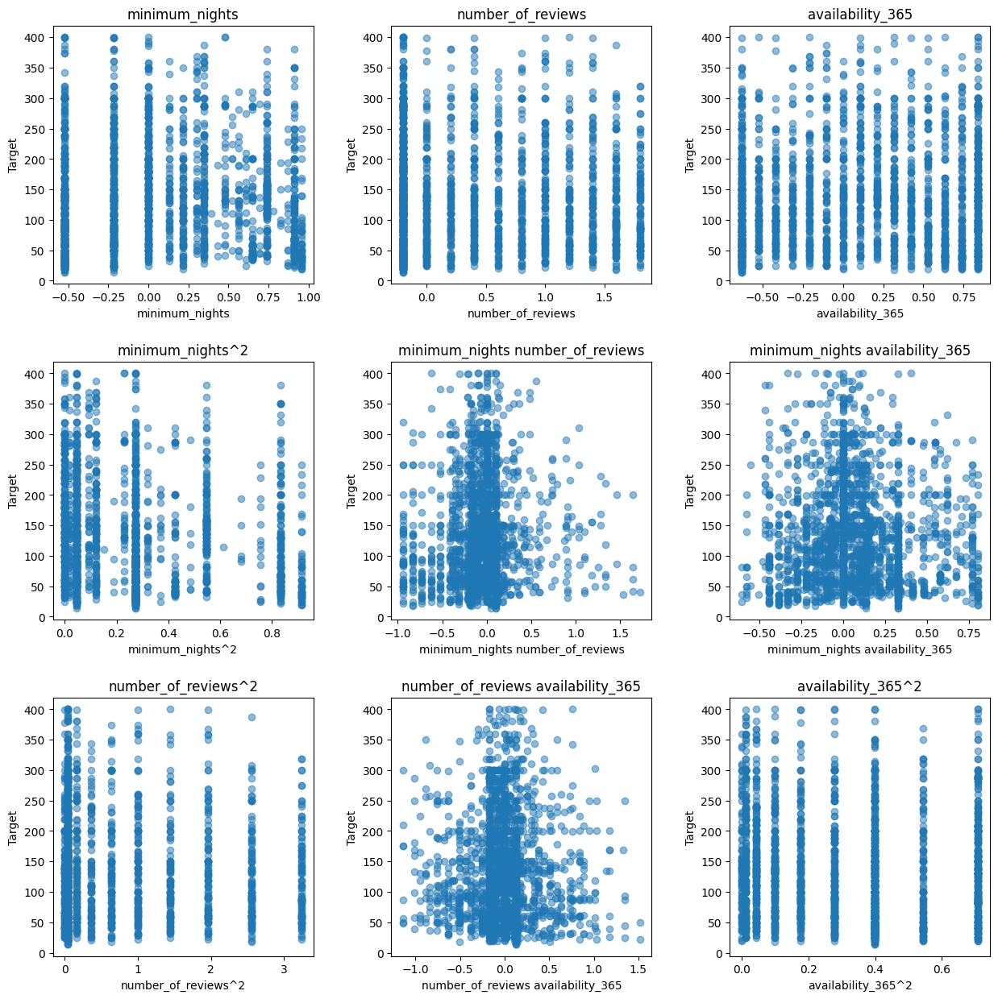

In [6171]:
# capture the returned features in a DataFrame
train_t_listings_df = pd.DataFrame(train_t_listings, columns=poly_features, index=X_train_listings_scaled.index)
test_t_listings_df = pd.DataFrame(test_t_listings, columns=poly_features, index=X_test_listings_scaled.index)

# drop the original key features from scaled dataframes to avoid duplicated column names
X_train_listings_scaled = X_train_listings_scaled.drop(columns=key_features)
X_test_listings_scaled = X_test_listings_scaled.drop(columns=key_features)

# concatenate the polynomial features with the scaled dataframes
X_train_listings_scaled = pd.concat([X_train_listings_scaled, train_t_listings_df], axis=1)
X_test_listings_scaled = pd.concat([X_test_listings_scaled, test_t_listings_df], axis=1)

# define a function to plot features vs target
def plot_features(df, target, poly_features):
    num_features = len(poly_features)
    num_rows = int(np.ceil(num_features / 3))  # Calculate number of rows needed
    
    fig, axs = plt.subplots(num_rows, 3, figsize=(15, num_rows * 5))
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    
    feature_names = poly_features 

    for i in range(num_rows):
        for j in range(3):
            index = i * 3 + j
            if index < len(feature_names):
                feature_name = feature_names[index]
                axs[i, j].scatter(df[feature_name], target, alpha=0.5)
                axs[i, j].set_title(feature_name)
                axs[i, j].set_xlabel(feature_name)
                axs[i, j].set_ylabel('Target')
            else:
                axs[i, j].axis('off')  # Hide unused subplots
    
    plt.show()

plot_features(test_t_listings_df, y_test_listings, poly_features)


In [6172]:
X_train_listings_scaled.head()

,neighbourhood,latitude,longitude,reviews_per_month,calculated_host_listings_count,amazing,apartment,apt,area,bahru,...,last_review_period_Between 3-5 years,minimum_nights,number_of_reviews,availability_365,minimum_nights^2,minimum_nights number_of_reviews,minimum_nights availability_365,number_of_reviews^2,number_of_reviews availability_365,availability_365^2
0,-0.618749,0.000000,1.500000,0.125,0.777778,0.0,0.0,0.0,0.0,0.0,...,0.0,-0.521739,0.2,0.631579,0.272212,-0.104348,-0.329519,0.04,0.126316,0.398892
1,0.234182,-0.333333,0.166667,-0.375,-0.444444,0.0,0.0,0.0,1.0,0.0,...,0.0,-0.521739,-0.2,-0.631579,0.272212,0.104348,0.329519,0.04,0.126316,0.398892
2,-0.094369,-0.166667,0.166667,0.375,-0.444444,0.0,0.0,0.0,0.0,0.0,...,0.0,0.217391,1.2,-0.421053,0.047259,0.260870,-0.091533,1.44,-0.505263,0.177285
3,0.096901,-1.166667,-1.500000,0.500,0.111111,0.0,0.0,1.0,0.0,0.0,...,0.0,0.739130,0.4,-0.105263,0.546314,0.295652,-0.077803,0.16,-0.042105,0.011080
4,1.392112,0.666667,0.000000,0.500,0.888889,0.0,0.0,0.0,0.0,0.0,...,0.0,0.478261,0.6,0.315789,0.228733,0.286957,0.151030,0.36,0.189474,0.099723


In [6173]:
X_test_listings_scaled.head()

,neighbourhood,latitude,longitude,reviews_per_month,calculated_host_listings_count,amazing,apartment,apt,area,bahru,...,last_review_period_Between 3-5 years,minimum_nights,number_of_reviews,availability_365,minimum_nights^2,minimum_nights number_of_reviews,minimum_nights availability_365,number_of_reviews^2,number_of_reviews availability_365,availability_365^2
0,-1.891979,1.500000,-3.166667,-0.375,-0.444444,0.0,0.0,0.0,0.0,0.0,...,0.0,0.304348,-0.2,-0.631579,0.092628,-0.060870,-0.19222,0.04,0.126316,0.398892
1,0.000000,-0.833333,-0.500000,1.125,-0.444444,0.0,0.0,0.0,0.0,0.0,...,0.0,-0.521739,1.6,-0.526316,0.272212,-0.834783,0.27460,2.56,-0.842105,0.277008
2,-0.618749,0.666667,2.333333,0.250,-0.444444,0.0,1.0,0.0,0.0,0.0,...,0.0,0.000000,0.8,-0.210526,0.000000,0.000000,-0.00000,0.64,-0.168421,0.044321
3,0.538760,0.166667,1.166667,-0.375,0.555556,1.0,0.0,1.0,0.0,0.0,...,0.0,0.000000,-0.2,-0.526316,0.000000,-0.000000,-0.00000,0.04,0.105263,0.277008
4,-1.348302,2.500000,0.333333,-0.375,-0.444444,0.0,0.0,0.0,0.0,0.0,...,0.0,-0.521739,-0.2,-0.105263,0.272212,0.104348,0.05492,0.04,0.021053,0.011080


In [6174]:
X_train_listings_scaled.isnull().sum()

neighbourhood                         0
latitude                              0
longitude                             0
reviews_per_month                     0
calculated_host_listings_count        0
                                     ..
minimum_nights number_of_reviews      0
minimum_nights availability_365       0
number_of_reviews^2                   0
number_of_reviews availability_365    0
availability_365^2                    0
Length: 74, dtype: int64

In [6175]:
x_train_listings_final = X_train_listings_scaled
x_test_listings_final = X_test_listings_scaled

### PCA

In [6176]:
# pca = PCA()

In [6177]:
# threshold = 0.95

# pca.fit(X_train_listings_scaled)

# cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

# plt.plot(cumulative_explained_variance, linewidth=2)
# plt.axhline(y=threshold, color='red')
# plt.title('Percentage of Variance Explained')
# plt.xlabel('Number of Components')
# plt.ylabel('Percentage of Variance Explained')
# plt.legend(['Cumulative Variance', 'Threshold'])
# plt.show()

In [6178]:
# x_train_listings_final = pca.transform(X_train_listings_scaled)
# x_test_listings_final = pca.transform(X_test_listings_scaled)

In [6179]:
# print(len(pca.explained_variance_ratio_))
# print(pca.explained_variance_ratio_)

In [6180]:
# plt.plot(pca.explained_variance_ratio_, linewidth=2)
# plt.title('Percentage of Variance Explained')
# plt.xlabel('Index Number of Components')
# plt.ylabel('Percentage of Variance Explained')

### 2.3 Correlation Analysis

In [6181]:
listings_data_copy

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,NaN,NaN,31,61
7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,NaN,NaN,34,365
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,NaN,NaN,3,173
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,NaN,NaN,2,30


<Axes: >

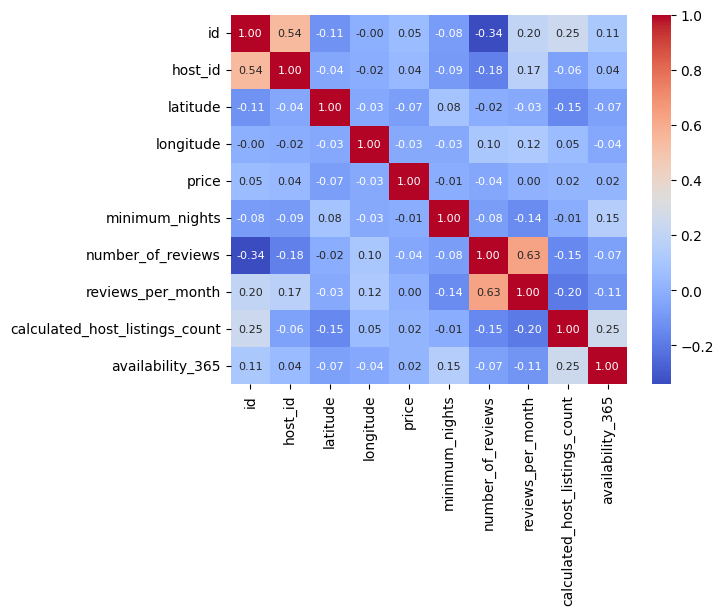

In [6182]:
num_cols = [c for c in listings_data_copy.columns if listings_data_copy[c].dtypes!='O']
correlation_matrix = listings_data_copy[num_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})


<Axes: >

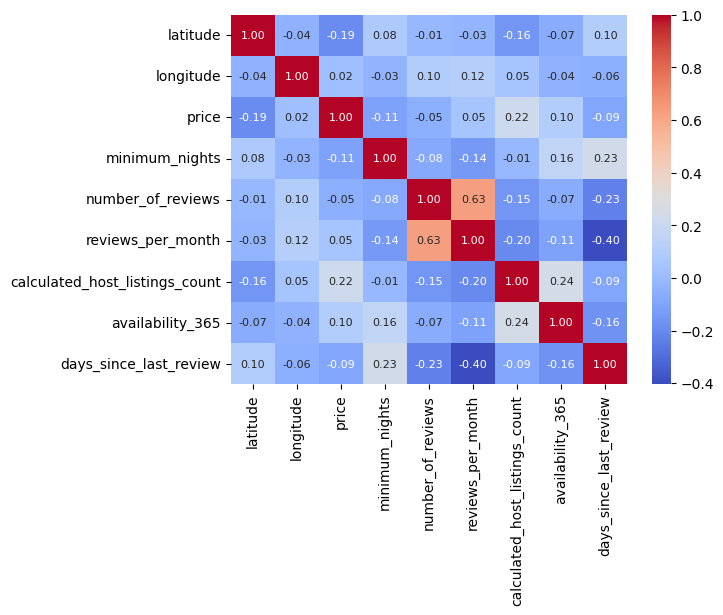

In [6183]:
num_cols = [c for c in listings_data.columns if listings_data[c].dtypes!='O']
correlation_matrix = listings_data[num_cols].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 8})


### 2.4 Export the data

In [6184]:
# export the final datasets
x_train_listings_final.to_csv('listings_new_train.csv', index=False)
x_test_listings_final.to_csv('listings_new_test.csv', index=False)


### 2.5 Modeling

In [6185]:
X_train_student_final_premodel_version = x_train_listings_final
X_test_student_final_premodel_version = x_test_listings_final

y_train_student_final_premodel_version = y_train_listings
y_test_student_final_premodel_version = y_test_listings

In [6186]:
X_train_final = X_train_student_final_premodel_version
X_test_final = X_test_student_final_premodel_version

y_train_final = y_train_student_final_premodel_version
y_test_final = y_test_student_final_premodel_version

In [6187]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [6188]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(X_train_final, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('Linear Regression train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(X_train_final)), 
      '\nLinear Regression test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(X_test_final)))

train_rmse = np.sqrt(mean_squared_error(y_train_final, model_linear_regression.predict(X_train_final)))
test_rmse = np.sqrt(mean_squared_error(y_test_final, model_linear_regression.predict(X_test_final)))
print('Linear Regression train_rmse:', train_rmse,
      '\nLinear Regression test_rmse:', test_rmse)

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('Linear Regression train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(X_train_final)), 
      '\nLinear Regression test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(X_test_final)))



Linear Regression train_mse: 3441.008938576117 
Linear Regression test_mse: 3363.903796361359
Linear Regression train_rmse: 58.66011369385604 
Linear Regression test_rmse: 57.99917065235812
Linear Regression train_r-sq: 0.5419350359505284 
Linear Regression test_r-sq: 0.5314001953656337


In [6189]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Build Lasso Regression Model
model_lasso = Lasso(alpha=1.0)
model_lasso.fit(X_train_final, y_train_final)

# Evaluate the Lasso Regression Model using Mean Squared Error (MSE)
print('Lasso Regression train_mse:', mean_squared_error(y_train_final, model_lasso.predict(X_train_final)), 
      '\nLasso Regression test_mse:', mean_squared_error(y_test_final, model_lasso.predict(X_test_final)))

train_rmse_lasso = np.sqrt(mean_squared_error(y_train_final, model_lasso.predict(X_train_final)))
test_rmse_lasso = np.sqrt(mean_squared_error(y_test_final, model_lasso.predict(X_test_final)))
print('Lasso Regression train_rmse:', train_rmse_lasso,
      '\nLasso Regression test_rmse:', test_rmse_lasso)

# Evaluate the Lasso Regression Model using R-Square
print('Lasso Regression train_r-sq:', r2_score(y_train_final, model_lasso.predict(X_train_final)), 
      '\nLasso Regression test_r-sq:', r2_score(y_test_final, model_lasso.predict(X_test_final)))




Lasso Regression train_mse: 3920.2971206732323 
Lasso Regression test_mse: 3884.6456810805284
Lasso Regression train_rmse: 62.61227611797252 
Lasso Regression test_rmse: 62.32692581124572
Lasso Regression train_r-sq: 0.4781324920395269 
Lasso Regression test_r-sq: 0.4588596115034306


In [6190]:
from sklearn.linear_model import Ridge

# Build Ridge Regression Model
model_ridge = Ridge(alpha=1.0)
model_ridge.fit(X_train_final, y_train_final)

# Evaluate the Ridge Regression Model using Mean Squared Error (MSE)
print('Ridge Regression train_mse:', mean_squared_error(y_train_final, model_ridge.predict(X_train_final)), 
      '\nRidge Regression test_mse:', mean_squared_error(y_test_final, model_ridge.predict(X_test_final)))

train_rmse_ridge = np.sqrt(mean_squared_error(y_train_final, model_ridge.predict(X_train_final)))
test_rmse_ridge = np.sqrt(mean_squared_error(y_test_final, model_ridge.predict(X_test_final)))
print('Ridge Regression train_rmse:', train_rmse_ridge,
      '\nRidge Regression test_rmse:', test_rmse_ridge)

# Evaluate the Ridge Regression Model using R-Square
print('Ridge Regression train_r-sq:', r2_score(y_train_final, model_ridge.predict(X_train_final)), 
      '\nRidge Regression test_r-sq:', r2_score(y_test_final, model_ridge.predict(X_test_final)))




Ridge Regression train_mse: 3441.124084896775 
Ridge Regression test_mse: 3365.849200132101
Ridge Regression train_rmse: 58.66109515596155 
Ridge Regression test_rmse: 58.01593919029581
Ridge Regression train_r-sq: 0.5419197077441291 
Ridge Regression test_r-sq: 0.5311291959904759


### 2.6 Performance Analysis

In [6191]:
# pick the mean target value from all of train data
print(y_train_listings.mean())

mean_target_value = y_train_listings.mean()

print(f"The train mean target value is {mean_target_value:.2f}.")

135.30883738458638
The train mean target value is 135.31.


In [6192]:
y_test_preds_naive = [round(mean_target_value, 2) for _ in range(len(X_test_listings_ohe))]
y_test_preds_naive[0:5]

[135.31, 135.31, 135.31, 135.31, 135.31]

In [6193]:
# Evaluate the naive model using MSE
train_mse_naive = mean_squared_error(y_train_listings, [mean_target_value] * len(y_train_listings))
test_mse_naive = mean_squared_error(y_test_listings, y_test_preds_naive)

print(f"The Naive Baseline Model's MSE on train data is {train_mse_naive}.")
print(f"The Naive Baseline Model's MSE on test data is {test_mse_naive}.")

# Calculate RMSE
train_rmse_naive = np.sqrt(train_mse_naive)
test_rmse_naive = np.sqrt(test_mse_naive)

print(f"The Naive Baseline Model's RMSE on train data is {train_rmse_naive}.")
print(f"The Naive Baseline Model's RMSE on test data is {test_rmse_naive}.")

# Calculate R2 Score
train_r2_naive = r2_score(y_train_listings, [mean_target_value] * len(y_train_listings))
test_r2_naive = r2_score(y_test_listings, y_test_preds_naive)

print(f"The Naive Baseline Model's R2 on train data is {train_r2_naive:.2f}.")
print(f"The Naive Baseline Model's R2 on test data is {test_r2_naive:.2f}.")

The Naive Baseline Model's MSE on train data is 7512.054421617987.
The Naive Baseline Model's MSE on test data is 7178.735994505494.
The Naive Baseline Model's RMSE on train data is 86.67210867180968.
The Naive Baseline Model's RMSE on test data is 84.72742173880599.
The Naive Baseline Model's R2 on train data is 0.00.
The Naive Baseline Model's R2 on test data is -0.00.


In [6194]:
y_train_listings = y_train_listings.reset_index(drop=True)
X_train_final = X_train_final.reset_index(drop=True)
# Create another model lm2 using statsmodel.api: the Ordinary Least Squares (OLS) method and fit functionvv
lm2 = sm.OLS(y_train_listings, sm.add_constant(X_train_final)).fit()
# Summary statistics from the model
lm2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.542
Model:                            OLS   Adj. R-squared:                  0.535
Method:                 Least Squares   F-statistic:                     83.65
Date:                Sun, 08 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:09:50   Log-Likelihood:                -29139.
No. Observations:                5307   AIC:                         5.843e+04
Df Residuals:                    5232   BIC:                         5.892e+04
Df Model:                          74                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                   185.2246      3.423     54.106      0.000     178.513     191.936
neighbourhood                             9.4050      1.206      7.798      0.000       7.041      11.769
latitude                                 -7.6968      1.410     -5.457      0.000     -10.462      -4.932
longitude                                -7.6276      1.546     -4.935      0.000     -10.658      -4.597
reviews_per_month                        13.4058      3.651      3.672      0.000       6.249      20.563
calculated_host_listings_count          -12.6656      2.239     -5.657      0.000     -17.055      -8.276
amazing                                  10.1578      5.802      1.751      0.080      -1.217      21.532
apartment                                 3.8733      2.834      1.367      0.172      -1.683       9.429
apt                                      -6.2523      3.268     -1.913      0.056     -12.659       0.154
area                                     -5.6687      5.112     -1.109      0.268     -15.691       4.354
bahru                                   -30.8321      6.628     -4.652      0.000     -43.826     -17.838
bathroom                                 -1.6783      5.641     -0.298      0.766     -12.736       9.380
beautiful                                 9.5271      6.038      1.578      0.115      -2.311      21.365
bed                                       4.8679      3.661      1.330      0.184      -2.310      12.046
bedroom                                  15.9207      2.895      5.500      0.000      10.246      21.595
br                                       41.2482      2.976     13.863      0.000      35.415      47.081
bugis                                    22.5931      6.147      3.675      0.000      10.542      34.645
cbd                                       6.5582      4.923      1.332      0.183      -3.092      16.208
central                                   6.1446      3.821      1.608      0.108      -1.347      13.636
chinatown                                15.6065      5.115      3.051      0.002       5.580      25.633
city                                     -8.2856      2.980     -2.780      0.005     -14.128      -2.443
comfy                                    -3.5429      6.475     -0.547      0.584     -16.237       9.151
common                                  -21.1789      6.155     -3.441      0.001     -33.245      -9.113
condo                                    -6.7682      3.404     -1.988      0.047     -13.441      -0.095
cosy                                    -16.1903      3.734     -4.336      0.000     -23.510      -8.871
cozy                                    -14.7953      3.472     -4.261      0.000     -21.602      -7.988
east     

In [6195]:
# # drop columns with p-value > 0.05, last_review_period variables (all p-values > 0.05)
# X_train_final = X_train_final.drop(\
#     columns=["last_review_period_Between 1-3 years", "last_review_period_No Review", \
#                             "last_review_period_Up to 1 year", "last_review_period_Between 3-5 years"])

# X_test_final = X_test_final.drop(\
#     columns=["last_review_period_Between 1-3 years", "last_review_period_No Review", \
#                             "last_review_period_Up to 1 year", "last_review_period_Between 3-5 years"])

# y_train_final = y_train_final.drop(\
#     columns=["last_review_period_Between 1-3 years", "last_review_period_No Review", \
#                             "last_review_period_Up to 1 year", "last_review_period_Between 3-5 years"])

# y_test_final = y_test_final.drop(\
#     columns=["last_review_period_Between 1-3 years", "last_review_period_No Review", \
#                             "last_review_period_Up to 1 year", "last_review_period_Between 3-5 years"])

Linear Regression train_mse: 3462.692174434409\
Linear Regression test_mse: 3382.063022853289\
Linear Regression train_rmse: 58.84464439891203\
Linear Regression test_rmse: 58.15550724439852\
Linear Regression train_r-sq: 0.5390485771149944\
Linear Regression test_r-sq: 0.5288705718979132


In [6196]:
# drop columns with p-value > 0.05
X_train_final = X_train_final.drop(\
    columns=["amazing", "apartment", "apt", "area", "bathroom", "beautiful", "bed", "cbd", "central",\
              "comfy", "east", "farrer", "home", "loft", "master", "modern", "mrt", "near", "new", "park",\
                  "pool", "private", "queen", "road", "room", "stay", "suite", "unit", "view", "walk", "wifi",\
                      "neighbourhood_group_East Region", "neighbourhood_group_North-East Region", \
                        "last_review_period_Between 1-3 years", "last_review_period_No Review", \
                            "last_review_period_Up to 1 year", "last_review_period_Between 3-5 years", \
                                "number_of_reviews", "number_of_reviews^2", "number_of_reviews availability_365"])

X_test_final = X_test_final.drop(\
    columns=["amazing", "apartment", "apt", "area", "bathroom", "beautiful", "bed", "cbd", "central",\
              "comfy", "east", "farrer", "home", "loft", "master", "modern", "mrt", "near", "new", "park",\
                  "pool", "private", "queen", "road", "room", "stay", "suite", "unit", "view", "walk", "wifi",\
                      "neighbourhood_group_East Region", "neighbourhood_group_North-East Region", \
                        "last_review_period_Between 1-3 years", "last_review_period_No Review", \
                            "last_review_period_Up to 1 year", "last_review_period_Between 3-5 years", \
                                "number_of_reviews", "number_of_reviews^2", "number_of_reviews availability_365"])

y_train_final = y_train_final.drop(\
    columns=["amazing", "apartment", "apt", "area", "bathroom", "beautiful", "bed", "cbd", "central",\
              "comfy", "east", "farrer", "home", "loft", "master", "modern", "mrt", "near", "new", "park",\
                  "pool", "private", "queen", "road", "room", "stay", "suite", "unit", "view", "walk", "wifi",\
                      "neighbourhood_group_East Region", "neighbourhood_group_North-East Region", \
                        "last_review_period_Between 1-3 years", "last_review_period_No Review", \
                            "last_review_period_Up to 1 year", "last_review_period_Between 3-5 years", \
                                "number_of_reviews", "number_of_reviews^2", "number_of_reviews availability_365"])

y_test_final = y_test_final.drop(\
    columns=["amazing", "apartment", "apt", "area", "bathroom", "beautiful", "bed", "cbd", "central",\
              "comfy", "east", "farrer", "home", "loft", "master", "modern", "mrt", "near", "new", "park",\
                  "pool", "private", "queen", "road", "room", "stay", "suite", "unit", "view", "walk", "wifi",\
                      "neighbourhood_group_East Region", "neighbourhood_group_North-East Region", \
                        "last_review_period_Between 1-3 years", "last_review_period_No Review", \
                            "last_review_period_Up to 1 year", "last_review_period_Between 3-5 years", \
                                "number_of_reviews", "number_of_reviews^2", "number_of_reviews availability_365"])

In [6197]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(X_train_final, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('Linear Regression train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(X_train_final)), 
      '\nLinear Regression test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(X_test_final)))

train_rmse = np.sqrt(mean_squared_error(y_train_final, model_linear_regression.predict(X_train_final)))
test_rmse = np.sqrt(mean_squared_error(y_test_final, model_linear_regression.predict(X_test_final)))
print('Linear Regression train_rmse:', train_rmse,
      '\nLinear Regression test_rmse:', test_rmse)

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('Linear Regression train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(X_train_final)), 
      '\nLinear Regression test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(X_test_final)))


Linear Regression train_mse: 3512.5917912620343 
Linear Regression test_mse: 3399.2605754497968
Linear Regression train_rmse: 59.26712234672807 
Linear Regression test_rmse: 58.30317809047631
Linear Regression train_r-sq: 0.5324059712408908 
Linear Regression test_r-sq: 0.526474911892526


##### The performance worsens after dropping columns with p-value > 0.05.

In [6198]:
y_train_listings = y_train_listings.reset_index(drop=True)
X_train_final = X_train_final.reset_index(drop=True)
# Create another model lm2 using statsmodel.api: the Ordinary Least Squares (OLS) method and fit function
lm2 = sm.OLS(y_train_listings, sm.add_constant(X_train_final)).fit()
# Summary statistics from the model
lm2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.532
Model:                            OLS   Adj. R-squared:                  0.529
Method:                 Least Squares   F-statistic:                     176.6
Date:                Sun, 08 Dec 2024   Prob (F-statistic):               0.00
Time:                        22:09:50   Log-Likelihood:                -29194.
No. Observations:                5307   AIC:                         5.846e+04
Df Residuals:                    5272   BIC:                         5.869e+04
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                192.1215      2.668     72.000      0.000     186.890     197.353
neighbourhood                          9.8023      1.187      8.257      0.000       7.475      12.130
latitude                              -8.9171      1.110     -8.030      0.000     -11.094      -6.740
longitude                             -5.8742      1.231     -4.771      0.000      -8.288      -3.460
reviews_per_month                     -9.0565      1.646     -5.503      0.000     -12.283      -5.830
calculated_host_listings_count       -15.2617      2.129     -7.167      0.000     -19.436     -11.087
bahru                                -30.4677      6.589     -4.624      0.000     -43.385     -17.550
bedroom                               15.5620      2.723      5.716      0.000      10.224      20.900
br                                    41.8711      2.836     14.765      0.000      36.312      47.431
bugis                                 24.0579      6.115      3.934      0.000      12.069      36.047
chinatown                             16.3665      5.071      3.227      0.001       6.425      26.308
city                                  -9.1023      2.952     -3.084      0.002     -14.889      -3.316
common                               -20.7138      6.010     -3.447      0.001     -32.496      -8.932
condo                                 -7.2780      3.340     -2.179      0.029     -13.826      -0.730
cosy                                 -16.5659      3.687     -4.493      0.000     -23.794      -9.338
cozy                                 -15.1212      3.465     -4.363      0.000     -21.915      -8.327
heart                                 12.3253      6.357      1.939      0.053      -0.136      24.787
luxury                                31.7455      5.501      5.771      0.000      20.962      42.529
min                                  -10.1156      2.812     -3.597      0.000     -15.628      -4.603
orchard                               17.7303      4.061      4.366      0.000       9.768      25.692
rm                                   -12.2228      5.640     -2.167      0.030     -23.280      -1.165
singapore                             23.7643      4.826      4.924      0.000      14.304      33.225
single                               -25.3401      5.505     -4.603      0.000     -36.133     -14.547
spacious                              13.1352      3.237      4.058      0.000       6.789      19.481
studio                               -36.1287      3.267    -11.060      0.000     -42.533     -29.725
neighbourhood_group_Central Region   -24.4566      3.925     -6.230      0.000     -32.152     -16.761
neighbourhood_group_West Region      -28.0851      5.893     -4.766      0.000     -39.637     -

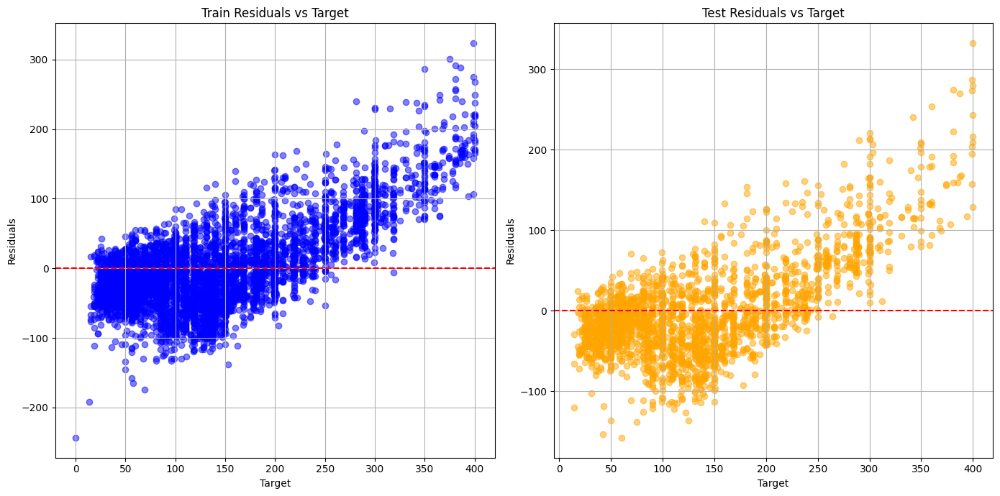

In [6199]:
train_residuals = y_train_final - model_linear_regression.predict(X_train_final)
test_residuals = y_test_final - model_linear_regression.predict(X_test_final)

# Create the residual plots
plt.figure(figsize=(14, 7))

# Train residuals plot
plt.subplot(1, 2, 1)
plt.scatter(y_train_final, train_residuals, color='blue', alpha=0.5)
plt.axhline(0, color='red', linestyle='--')  # Add a horizontal line at y = 0 for reference
plt.title('Train Residuals vs Target')
plt.xlabel('Target')
plt.ylabel('Residuals')
plt.grid(True)

# Test residuals plot
plt.subplot(1, 2, 2)
plt.scatter(y_test_final, test_residuals, color='orange', alpha=0.5)
plt.axhline(0, color='red', linestyle='--')  # Add a horizontal line at y = 0 for reference
plt.title('Test Residuals vs Target')
plt.xlabel('Target')
plt.ylabel('Residuals')
plt.grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Machine Learning Assignment 1 Report

## Table of Contents
##### Summary/Overview
##### HR Analytics
##### Airbnb
##### Summary and Further Improvements

## Summary/Overview

In this report, I would be outlining the workflow and prepare two datasets (hr_data.csv and listings.csv) for machine learning modelling to address specific predictive tasks.

For the hr_data.csv dataset, the objective is to build a logistics regression model to predict whether the employee would be promoted or not. The dataset contains variables on demographics (‘age’, ‘region’, ‘gender’ etc), professional details (‘department’, ‘length_of_service’, ‘recruitment_channel’ etc) and performance metrics (‘previous_year_rating’, ‘KPIs_met >80%’, ‘awards_won?’ etc). With this dataset, I would be exploring the data, addressing missing values and outliers, encoding categorical variables, and performing statistical analysis to retain relevant features that contribute significantly to the model's accuracy.

As for the Airbnb dataset (listings.csv), the objective is to develop a linear regression model to predict rental prices based on attributes like property details (‘room_type’, ‘availability_365’), location (‘neighbourhood_group’, ‘latitude’, ‘longitude’) and review metrics (‘number_of_reviews’, ‘reviews_per_month’). The approach mirrors that of the human resource dataset, focusing on data exploration, cleansing, transformation, and feature selection to enhance predictive performance.

Each step of the process is meticulously documented, highlighting how data is cleaned, transformed, and prepared for modelling. Correlation analysis is performed to identify relationships among variables, ensuring only relevant predictors are included. Once prepared, the models are evaluated to assess their effectiveness. The logistic regression model for the hr dataset is evaluated using performance metrics such as accuracy, precision, recall, and F1-score, while the Airbnb linear regression model is assessed using RMSE and R^2 metrics.

The overarching aim of this report is to provide actionable insights through these models—enhancing decision-making for employee promotions in the hr domain and optimising rental pricing strategies for Airbnb. By leveraging data-driven approaches, the outcomes are expected to deliver practical value to these predictive tasks.


## HR Analytics

#### Problem Understanding

The hr dataset addresses the challenge of identifying employees likely to be promoted, a critical aspect of workforce management. By applying machine learning, we aim to replace manual, subjective promotion decisions with a data-driven approach. The dataset includes demographic details (age, gender, region), professional attributes (department, length of service), and performance metrics (KPIs met, awards won, training scores). The objective is to build a logistic regression model to predict promotions accurately, ensuring fairness and efficiency. This approach enables HR departments to recognise deserving talent, fostering transparency and enhancing decision-making processes for career development and organisational growth.

#### Data Exploration

When I first loaded the data, I used .head() and .tail() respectively to view the first and last 5 rows of the dataset respectively. Then, I used .shape to find out the shape of the dataset and it contains 54,808 rows and 14 columns. To understand the data types of each variable, I used .dtypes, followed by .info() to check the non-null count for each column. Next, I used .describe() to get summary statistics on the numerical columns. isnull().sum() was used to find out if there are any null values and it appears to be null values in the education (2409) and previous_year_rating (4124) columns. I then visualised the missing values using a missing number matrix to find out any patterns related to the missing data, and I believe that there is no relationship between the missing values for the two columns with each other. A bar chart was plotted to display the percentage of missing values for each column and both education and previous_year_rating have missing values accounting for less than 10% of the total data. A cardinality plot was plotted, and it shows that employee_id has the highest number of unique values while the other columns have relatively lower cardinality. I also checked for duplicates using hr_data[hr_data.duplicated()] and there seem to be no duplicates in this dataset. 

I then explored the categorical columns and identified if there is a need to group rare categories. For department there are 9 unique values, and I set the tolerance rate to 5%. This threshold strikes a balance between identifying categories that are genuinely rare and ensuring that each category has sufficient data for meaningful analysis. There are 4 categories under the 5% threshold (Finance, HR, Legal, R&D) but I chose not to group them as rare because each department has their own unique sets of criteria of being promoted and grouping them would risk oversimplifying the analysis. For region, it has 34 unique regions, and I set the tolerance rate to 1%. Even though there are 8 regions below the threshold, I still chose not to group the rare categories as different regions may have varying number of positions available for employee promotion. For gender, there are only 2 genders, with approximately 70% of the employees being male. For recruitment channel, there are 3 unique values with other taking up 55% and sourcing taking up 42% which implies that there is no need to group rare categories. Lastly, for education, there are also 3 unique values with Bachelor's being the most common at approximately 67% followed by Master's & above with 27% which also implies that there is no need to group rare categories for education.

I then explored the numerical columns and created a correlation plot. I noticed that employee_id has little to no correlation (0.00 – 0.01) with all the variables especially target variable. With this information, I have decided to drop this column in the later stages of the data cleaning process as this column would not be useful in predicting employee promotion. Lastly, I also noticed that there are no highly correlated variables which is good as it suggests that we do not need to deal with multicollinearity, and we could proceed with model development without needing to address this concern.


#### Data Cleansing and Transformation

Firstly, I checked if there are any rows which could be dropped due to the low number of nulls. However, there are no columns with low number of nulls so I will not be dropping any rows. Next, I dropped employee_id as it has no correlation with the target variable (is_promoted) as evident in the correlation analysis earlier. The shape of the dataset before dropping was (54808, 14) and after dropping employee_id the data shape became (54808, 13). A histogram was plotted to view the distribution of the numerical columns, and I compared the distribution to the data types. I then discovered from the histogram that previous_year_rating is a discrete variable as it has only 5 distinct values. I then decided to convert previous_year_rating to integer. However, since previous_year_rating contains null values, I had to impute the null values as 0 first before converting to integer. After converting previous_year_rating  to integer, I replaced the 0 with null values back to it original data. 

Next, I identified outliers in the dataset. I plotted the boxplot to look at the distribution of the numerical variables and printed the number of outliers. I noticed that most of the numerical variables are discrete or Boolean and not continuous and in discrete data, outliers may not have the same impact as they would in continuous data. Moreover, outliers in discrete variables could represent valid or rare occurrences and may not necessarily need to be removed or adjusted.

To achieve a balanced dataset and improve the F1-score, I applied SMOTENC, a technique designed to generate synthetic samples for imbalanced datasets while preserving categorical features. The primary goal of using SMOTENC was to balance the target variable (is_promoted), which had a significant class imbalance: 50,140 samples for 0 (not promoted) and only 4,668 for 1 (promoted). This imbalance can lead to biased model predictions and poor performance on the minority class. By generating synthetic samples for the minority class, SMOTENC helps address this issue, making the dataset more balanced and enabling the model to better generalise, especially for the underrepresented class.

First, I ensured the dataset had no missing values, as SMOTENC requires completeness. I identified rows with missing values and marked the affected columns in a new column, null_loc, then filled these missing values with 0. I then identified and converted categorical columns to string format and passed their indices to SMOTENC. I used a 1:2 sampling strategy, resampling the minority class to half the size of the majority class. This strategy creates a balanced dataset, which improves the model’s ability to make more accurate predictions for both classes, thereby enhancing the F1-score, particularly for the minority class. I performed SMOTENC before the train-test split to avoid data leakage and ensure that the resampling process does not influence the test set, maintaining its integrity for proper evaluation.

Without SMOTENC:\
The LogReg Model's accuracy on train data is 0.9169034276032842\
The LogReg Model's accuracy on test data is 0.9168035030103996

The LogReg Model's precision on train data is 0.5555555555555556\
The LogReg Model's precision on test data is 0.5248618784530387

The LogReg Model's recall on train data is 0.14320536258379038\
The LogReg Model's recall on test data is 0.1370851370851371

The LogReg Model's F1-score on train data is 0.22771317829457363\
The LogReg Model's F1-score on test data is 0.21739130434782608

With SMOTENC:\
The LogReg Model's accuracy on train data is 0.7970444659714704\
The LogReg Model's accuracy on test data is 0.7986083410893942

The LogReg Model's precision on train data is 0.7274057325264348\
The LogReg Model's precision on test data is 0.7325689494886892

The LogReg Model's recall on train data is 0.6241725633417028\
The LogReg Model's recall on test data is 0.6265571163530347

The LogReg Model's F1-score on train data is 0.6718466877552901\
The LogReg Model's F1-score on test data is 0.6754285714285714

After applying SMOTENC with a 1:2 sampling strategy, the dataset became more balanced, with the minority class (promoted) resampled to a size of 25,070, which is half the size of the majority class (not promoted, with 50,140 samples). To ensure that the dataset reflects the original state of the missing values, I also reversed the null values back to their original state. This was achieved by using the apply_nulls function, which checks the null_loc column for the indices of previously missing values and restores them to NaN. After applying this function, I removed the null_loc column to maintain a clean dataset.

For missing value imputation, I imputed previous_year_rating as 0 for the null values to indicate that the employee has not been rated since the employee has not been with the company for 2 years. I then chose mode as my imputation method for education majority of the employees have a Bachelor's to get in the company. There were some issues with the value_count of education where I discovered that the smotenc has encoding 0 for education where there is no 0 for education. So, I chose to replace the 0 with the mode which is Bachelor's to ensure the appropriate record under education. 

For outlier handling, I plotted diagnostic plots to analyse the distribution of the numerical variables. These plots include a histogram, QQ-plot and boxplot. I chose variables which contains outliers and have a substantial number of unique values like age, length_of_service and avg_training_score. I attempted to cap outliers at both tails at 0.01 fold but it worsens the performance of the model so I chose not to handle any outliers. 

With fold = 0.01:\
The LogReg Model's accuracy on train data is 0.7967785438866413\
The LogReg Model's accuracy on test data is 0.7975889730975491

The LogReg Model's precision on train data is 0.7271517007255541\
The LogReg Model's precision on test data is 0.7304657279900975

The LogReg Model's recall on train data is 0.6233736589819676\
The LogReg Model's recall on test data is 0.6256294725682481

The LogReg Model's F1-score on train data is 0.6712753863643347\
The LogReg Model's F1-score on test data is 0.673995288742951

Without handling outliers:\
The LogReg Model's accuracy on train data is 0.7970444659714704\
The LogReg Model's accuracy on test data is 0.7986083410893942

The LogReg Model's precision on train data is 0.7274057325264348\
The LogReg Model's precision on test data is 0.7325689494886892

The LogReg Model's recall on train data is 0.6241725633417028\
The LogReg Model's recall on test data is 0.6265571163530347

The LogReg Model's F1-score on train data is 0.6718466877552901\
The LogReg Model's F1-score on test data is 0.6754285714285714

As for numerical transformation, I experimented with yeojohnson and log transformation for the numerical variables: age, length_of_service and avg_training_score. The reason for choosing these columns mirrors the same reason as for outlier handling. After experimenting with the variables, I found that log transformation gives better performance compared to Yeojohnson transformation. 

YeoJohnson all:\
The LogReg Model's accuracy on train data is 0.7959237943282618\
The LogReg Model's accuracy on test data is 0.7974560120551345

The LogReg Model's precision on train data is 0.72572912504994\
The LogReg Model's precision on test data is 0.7304118922266956

The LogReg Model's recall on train data is 0.621947044053869\
The LogReg Model's recall on test data is 0.6250993904055129

The LogReg Model's F1-score on train data is 0.6698420502734928\
The LogReg Model's F1-score on test data is 0.6736646672379321

Log all:\
The LogReg Model's accuracy on train data is 0.7970444659714704\
The LogReg Model's accuracy on test data is 0.7986083410893942

The LogReg Model's precision on train data is 0.7274057325264348\
The LogReg Model's precision on test data is 0.7325689494886892

The LogReg Model's recall on train data is 0.6241725633417028\
The LogReg Model's recall on test data is 0.6265571163530347

The LogReg Model's F1-score on train data is 0.6718466877552901\
The LogReg Model's F1-score on test data is 0.6754285714285714

For Categorical Encoding, I applied one hot encoding to all categorical variables. Before one hot encoding, the shape for train was (52647, 12). The number of categories for each variable is as follows: department(9), region(34), education(3), gender(2), recruitment_channel(3). Since the number of categories is less than 10% of the total number of rows in the dataset, one-hot encoding is manageable and helps preserve the interpretability of the feature without overwhelming the model with too many additional columns. This is the shape of the train data after categorical data encoding (52647, 53).

For binning, I have experimented with binning avg_training_score, age and length_of_service using EqualWidthDiscretiser with 35 bins and I found out that binning length_of_service and avg_training_score worsens the model performance. On the contrary, binning age helps to improve the model performance. The rationale behind selecting 35 bins is to capture subtle variations within these features while maintaining enough granularity to preserve significant differences. By doing so, we can normalise the distributions and make them more uniform, thus simplifying the modelling process. I opted not to use EqualFrequencyDiscretiser, as the distributions of these variables are not skewed.

Before Binning:\
The LogReg Model's accuracy on train data is 0.7969304993636864\
The LogReg Model's accuracy on test data is 0.7983867393520365

The LogReg Model's precision on train data is 0.727266679970731\
The LogReg Model's precision on test data is 0.7320737184450984

The LogReg Model's recall on train data is 0.6238872403560831\
The LogReg Model's recall on test data is 0.6264245958123509

The LogReg Model's F1-score on train data is 0.6716220782013085\
The LogReg Model's F1-score on test data is 0.6751410412054559

Binning avg_training_score, age & length_of_service:\
The LogReg Model's accuracy on train data is 0.7951260280737744\
The LogReg Model's accuracy on test data is 0.7976332934450207

The LogReg Model's precision on train data is 0.7245401226339643\
The LogReg Model's precision on test data is 0.7300092621179376

The LogReg Model's recall on train data is 0.6203492353343986\
The LogReg Model's recall on test data is 0.6266896368937185

The LogReg Model's F1-score on train data is 0.668408755533694\
The LogReg Model's F1-score on test data is 0.6744152880775813

Binning only age:\
The LogReg Model's accuracy on train data is 0.7970444659714704\
The LogReg Model's accuracy on test data is 0.7986083410893942

The LogReg Model's precision on train data is 0.7274057325264348\
The LogReg Model's precision on test data is 0.7325689494886892

The LogReg Model's recall on train data is 0.6241725633417028\
The LogReg Model's recall on test data is 0.6265571163530347

The LogReg Model's F1-score on train data is 0.6718466877552901\
The LogReg Model's F1-score on test data is 0.6754285714285714

I chose the standard scaler over the robust scaler because it provided better performance for this dataset. The standard scaler scales the features based on their mean and standard deviation, which works well when the variables follow a normal distribution and do not have significant outliers. Since the variables in this dataset do not exhibit strong outliers, the standard scaler effectively standardizes the features without being impacted by extreme values, resulting in better model performance. In contrast, the robust scaler is more effective when there are outliers, which was not the case here.

Robust Scaler:\
The LogReg Model's accuracy on train data is 0.7970444659714704\
The LogReg Model's accuracy on test data is 0.798431059699508

The LogReg Model's precision on train data is 0.7277692666355825\
The LogReg Model's precision on test data is 0.7324031007751938

The LogReg Model's recall on train data is 0.6234877881762155\
The LogReg Model's recall on test data is 0.6260270341902995

The LogReg Model's F1-score on train data is 0.6716046347235455\
The LogReg Model's F1-score on test data is 0.675050014289797

Standard Scaler:\
The LogReg Model's accuracy on train data is 0.7970444659714704\
The LogReg Model's accuracy on test data is 0.7986083410893942

The LogReg Model's precision on train data is 0.7274057325264348\
The LogReg Model's precision on test data is 0.7325689494886892

The LogReg Model's recall on train data is 0.6241725633417028\
The LogReg Model's recall on test data is 0.6265571163530347

The LogReg Model's F1-score on train data is 0.6718466877552901\
The LogReg Model's F1-score on test data is 0.6754285714285714

I have also touched on Polynomial Expansion with variables with non-linear relationships with the target variable which are previous_year_rating, length_of_service and avg_training_score. Expanding these features to the second degree allows the model to capture more complex patterns, such as the potential for diminishing returns or accelerated impacts on the likelihood of promotion. This enables the model to better understand how these variables influence the target in a non-linear way, leading to improved prediction accuracy.

By integrating these engineered features into the dataset, this provides the predictive model with a richer, more nuanced representation of player performance. This approach has improved the model's performance and thus would offer deeper insights into the factors that influence employee promotion.

Before Polynomial Expansion:\
The LogReg Model's accuracy on train data is 0.7927897126142041\
The LogReg Model's accuracy on test data is 0.7981208172672074

The LogReg Model's precision on train data is 0.7210747944656106\
The LogReg Model's precision on test data is 0.7325454828176022

The LogReg Model's recall on train data is 0.6156128737731111\
The LogReg Model's recall on test data is 0.62430426716141

The LogReg Model's F1-score on train data is 0.6641834692935201\
The LogReg Model's F1-score on test data is 0.6741074622594262

After Polynomial Expansion:\
The LogReg Model's accuracy on train data is 0.7970444659714704\
The LogReg Model's accuracy on test data is 0.7986083410893942

The LogReg Model's precision on train data is 0.7274057325264348\
The LogReg Model's precision on test data is 0.7325689494886892

The LogReg Model's recall on train data is 0.6241725633417028\
The LogReg Model's recall on test data is 0.6265571163530347

The LogReg Model's F1-score on train data is 0.6718466877552901\
The LogReg Model's F1-score on test data is 0.6754285714285714

Lastly, I applied Principal Component Analysis (PCA) to the dataset, which resulted in a modest improvement in the model's performance. While the dataset did not contain highly correlated columns in which PCA is typically most effective, PCA still proved valuable in identifying patterns and transforming the data into principal components that captured the maximum variance. This process reduced the dimensionality of the dataset, allowing the model to focus on the most informative features while minimising noise from less significant variables. By simplifying the feature space and retaining the core informational content, PCA contributed to a slight yet meaningful enhancement in the model's predictive accuracy and overall efficiency.

With PCA:\
The LogReg Model's accuracy on train data is 0.7970444659714704\
The LogReg Model's accuracy on test data is 0.7986083410893942

The LogReg Model's precision on train data is 0.7274057325264348\
The LogReg Model's precision on test data is 0.7325689494886892

The LogReg Model's recall on train data is 0.6241725633417028\
The LogReg Model's recall on test data is 0.6265571163530347

The LogReg Model's F1-score on train data is 0.6718466877552901\
The LogReg Model's F1-score on test data is 0.6754285714285714

Without PCA:\
The LogReg Model's accuracy on train data is 0.7970254715368397\
The LogReg Model's accuracy on test data is 0.7984753800469796

The LogReg Model's precision on train data is 0.7277207939256694\
The LogReg Model's precision on test data is 0.7324445822353124

The LogReg Model's recall on train data is 0.6234877881762155\
The LogReg Model's recall on test data is 0.6261595547309833

The LogReg Model's F1-score on train data is 0.6715839940992071\
The LogReg Model's F1-score on test data is 0.675144673858684

#### Correlation Analysis

To investigate the relationships between features, I conducted a thorough analysis of their correlations. This helped identify variables likely to be helpful in making predictions. Features with meaningful correlations to the target variable, such as previous_year_rating, avg_training_score, and KPIs_met >80%, stood out as influential in determining promotions.

In contrast, some variables were dropped due to their irrelevance or potential to introduce noise. For instance, dropping employee_id was a strategic decision, as it is a unique identifier that lacks predictive value. Comparing the correlation analysis before and after the train-test split confirmed this, as employee_id showed no meaningful relationship with the target or other features.

Additionally, I created new features, such as polynomial expansions of variables like avg_training_score, to capture non-linear relationships, which improved model performance. These steps ensured the dataset focused on informative features while excluding irrelevant or redundant ones.


#### Modelling

I have developed a logistics regression model to predict is_promoted. These are the final scores:

The LogReg Model's accuracy on train data is 0.7970444659714704\
The LogReg Model's accuracy on test data is 0.7986083410893942

The LogReg Model's precision on train data is 0.7274057325264348\
The LogReg Model's precision on test data is 0.7325689494886892

The LogReg Model's recall on train data is 0.6241725633417028\
The LogReg Model's recall on test data is 0.6265571163530347

The LogReg Model's F1-score on train data is 0.6718466877552901\
The LogReg Model's F1-score on test data is 0.6754285714285714

The model demonstrates consistent performance between the train and test datasets, indicating minimal overfitting. The slightly higher precision compared to recall reflects the model's strength in correctly identifying positive cases while minimizing false positives. However, recall suggests room for improvement in capturing all actual positive cases. The F1-score, which balances precision and recall, provides a comprehensive measure of the model's effectiveness, with the test F1-score slightly higher than the train score, affirming its generalisation capability.


#### Performance Analysis

The logistic regression model was evaluated using several metrics: accuracy, precision, recall, and F1-score. Accuracy, at 79.7% for the training set and 79.9% for the test set, indicates strong generalization, with minimal differences between the two datasets. However, as accuracy alone may not provide a complete picture in cases of class imbalance, other metrics offer deeper insights. Precision, measuring the model’s ability to correctly identify positive cases (promoted employees), stood at 72.7% for the training data and 73.3% for the test data. This reflects the model's effectiveness in minimizing false positives, though there is still room to improve predictions further. Recall, capturing the model’s ability to identify all actual positive cases, was 62.4% for the training set and 62.7% for the test set. While decent, the lower recall compared to precision indicates that the model may miss some true positives, which could be critical in certain business situations. The F1-score, which balances precision and recall, reached 67.2% for training data and 67.5% for test data. The slightly higher F1-score on the test data suggests that the model generalizes well without overfitting.

The Naive Baseline Model's accuracy on train data is 0.67.\
The Naive Baseline Model's accuracy on test data is 0.67.\
The Naive Baseline Model's precision on train data is 0.00\
The Naive Baseline Model's precision on test data is 0.00\
The Naive Baseline Model's recall on train data is 0.00\
The Naive Baseline Model's recall on test data is 0.00\
The Naive Baseline Model's F1-score on train data is 0.00\
The Naive Baseline Model's F1-score on test data is 0.00

Compared to the naive baseline model, which predicts all instances as the majority class, the logistic regression model significantly outperformed in all metrics. The logistic regression model achieves an accuracy of 79.7% on the training data and 79.9% on the test data, compared to the baseline model's accuracy of 67%. This indicates that the logistic regression model predicts significantly better than random guessing, as the baseline model's accuracy is aligned with the majority class proportion. The logistic regression model demonstrates a precision of 72.7% (train) and 73.3% (test), whereas the naive baseline has a precision of 0%. The baseline fails to identify any positive class correctly, highlighting the superiority of the logistic regression model in reducing false positives. For recall, the logistic regression model achieves 62.4% on the training set and 62.7% on the test set, while the baseline model scores 0%. This stark difference reflects the logistic regression model's ability to capture a substantial portion of the true positive cases, unlike the baseline model, which does not identify any. The F1-score for logistic regression is 67.2% (train) and 67.5% (test), while the baseline model's F1-score is 0%. The F1-score demonstrates a balanced performance of the logistic regression model in terms of precision and recall. 

The confusion matrix for the training data highlights that the logistic regression model effectively predicts both classes, with 31,024 true negatives and 10,938 true positives. However, there are still 6,586 false negatives, indicating room for improvement in recall. The naive baseline model, by contrast, would predict all instances as the majority class, failing to capture any of the positive class.

The confusion matrix for the test data highlights that the logistic regression model effectively predicts both classes, with 13,291true negatives and 4728 true positives. However, there are still 2,818 false negatives, indicating room for improvement in recall. The naive baseline model, by contrast, would predict all instances as the majority class, failing to capture any of the positive class.

Moreover, visualizations such as the Receiver Operating Characteristic (ROC) curve and the Precision-Recall curve provide additional validation of the model's predictive capabilities. The ROC curve, with an Area Under the Curve (AUC) of 0.87, demonstrates strong predictive power, significantly outperforming the naive baseline model’s AUC of 0.50, which represents random guessing. This highlights the logistic regression model’s ability to effectively discriminate between the positive and negative classes.

The Precision-Recall curve further complements this by illustrating the model's capacity to maintain high precision as recall increases, ensuring a well-calibrated balance between minimising false positives and capturing true positives. This highlights the model’s strength in scenarios where the positive class is critical, reinforcing its utility for data-driven decision-making.

In addition, the Variance Inflation Factor (VIF) for all variables is calculated to ensure that multicollinearity does not significantly affect the model's reliability. With a VIF of 1 for each variable, there is no significant correlation between the variables in the model, confirming that multicollinearity is not an issue. This supports the reliability of the model’s estimates which further strengthens the argument for its predictive power.

Metrics after removing variables with p-values greater than 0.05:\
The LogReg Model's accuracy on train data is 0.796075749805307\
The LogReg Model's accuracy on test data is 0.7985197003944511

The LogReg Model's precision on train data is 0.7247384452390412\
The LogReg Model's precision on test data is 0.7297090352220521

The LogReg Model's recall on train data is 0.6245720155215704\
The LogReg Model's recall on test data is 0.6314603763583355

The LogReg Model's F1-score on train data is 0.6709372892784895\
The LogReg Model's F1-score on test data is 0.6770389315146348

Further feature selection, achieved by removing all variables with p-values greater than 0.05 (a common threshold for statistical significance which indicates a 5% chance of a false positive, balancing the inclusion of relevant features while minimizing random noise), resulted in a streamlined model with minimal performance changes. The accuracy remained consistent, with 79.61% on the training data and 79.85% on the test data, suggesting that the dropped features did not significantly contribute to predictions. Precision showed a slight improvement, reaching 72.47% for the training set and 72.97% for the test set, indicating reduced false positives. Recall also saw a modest increase, improving to 62.46% on the training data and 63.15% on the test data, which reflects the model's enhanced ability to capture true positives. The F1-score improved slightly as well, reaching 67.09% for training data and 67.70% for test data, reinforcing the model's balanced performance. **However, I would be keeping all the features and not drop any feature as the overall performance is still better without dropping any features.** 

In conclusion, the logistic regression model has proven to be a reliable and high-performing tool, significantly outperforming the naive baseline model while demonstrating strong generalisation capabilities. The feature selection process has effectively streamlined the model, enhancing its interpretability and efficiency without sacrificing predictive accuracy. With further optimization of recall, the model can capture more true positives, increasing its value for business-critical decision-making.

#### Others

Notes: I have exported the data to csv as hr_data_new_test.csv and hr_data_new_train.csv for both test and train data respectively.

## Airbnb

#### Problem Understanding

The problem is to predict the rental price of Airbnb apartments using a dataset from 2013 to 2019, which includes various features of each listing such as listings and host IDs, geographical location, room type, minimum nights, and number of reviews, providing an overview of the listing's profile. The goal is to clean the data and develop a linear regression model to predict the rental price based on these features. The target variable is the rental price, and the task involves identifying relevant features, handling missing or outlier data, and building an accurate predictive model.

#### Data Exploration

When I first loaded the data, I used .head() and .tail() respectively to view the first and last 5 rows of the dataset. Then, I used .shape to find out the shape of the dataset, which contains 7,907 rows and 16 columns. To understand the data types of each variable, I used .dtypes, followed by .info() to check the non-null count for each column. Next, I used .describe() to get summary statistics on the numerical columns and .isnull().sum() to check for null values. It appears that there are null values in the last_review (2758) and reviews_per_month (2758) columns. I then visualised the missing values using a missing number matrix and identified a correlation between last_review and reviews_per_month. Each row with a missing value in last_review also has a missing value in reviews_per_month. A bar chart was plotted to display the percentage of missing values for each column, and both last_review and reviews_per_month had missing values accounting for approximately 35% of the total data.

A cardinality plot was created, revealing that id has the highest number of unique values, while other columns have varying cardinality, with name having the second highest cardinality at roughly 7,400 unique values. I also checked for duplicates using listings_data[listings_data.duplicated()] and found that there are no duplicates in this dataset. I then explored the categorical columns and identified the need to group rare categories. For neighbourhood_group, there are 5 unique values, and I set the tolerance rate to 5%. This threshold strikes a balance between identifying genuinely rare categories and ensuring sufficient data for meaningful analysis. There are 2 categories under the 5% threshold (North-East Region and North Region), but I chose not to group them as rare because each region has its unique rental price range and grouping them would risk oversimplifying the analysis.

For neighbourhood, there are 43 unique categories, and I set the tolerance rate to 1% to balance identifying rare categories and retaining sufficient data. After applying this threshold, I found that 22 neighbourhoods have fewer than 1% of the listings, which I chose to group together to prevent overfitting. For room_type, there are 3 unique values, with Entire home/apt taking up 52% and Private room taking up 43%, meaning there was no need to group rare categories. I then explored the numerical columns and created a correlation plot, noticing that no variables were highly correlated, which is positive as it suggests that multicollinearity does not need to be addressed.


#### Data Cleansing and Transformation

Firstly, I ensured that the columns were in the appropriate data type. I noticed that last_review was identified as an object, so I converted it to a datetime object. I explored the earliest and latest date for last_review and created a new feature days_since_last_review, which calculates the difference in days between the latest date and last_review. I then dropped last_review since we had already created a new feature. The data shape changed from (7907, 17) to (7907, 16). There were 2 null values in name, and I decided to drop the rows containing them since the loss of 2 rows is insignificant compared to the 7907 rows. The data shape changed from (7907, 16) to (7905, 16) after dropping the rows with nulls for name.

Next, I dropped redundant columns that would not be useful in predicting price. I dropped id and host_id because these unique identifiers are not beneficial for predicting price. host_name was also dropped as the host's name does not contribute meaningful information. The data shape changed from (7905, 16) to (7905, 13). For the name column, I performed text analysis using NLTK. I downloaded necessary data files for tokenization, stopwords, and lemmatization. This allowed me to clean and prepare the text by removing irrelevant words and reducing words to their root form. I used a function clean_text to process each sentence in the name column. I first converted the text to lowercase to avoid case sensitivity. I used regular expressions to remove special characters and numbers, which don't contribute to the analysis. Then, I tokenized the text, removed stopwords, and applied lemmatization. Finally, I joined the processed words back together into a clean sentence. This cleaned version of the text is now ready for further analysis.

I initially created a new feature called name_word_count, which counts the number of words in the name, but later decided not to create this feature, as using a CountVectorizer provides a more meaningful representation by capturing the frequency of words and their relationships. To identify outliers, I plotted boxplots for all numerical columns to understand the distribution and identify outliers. For each numerical column, along with the boxplot, I also printed the upper and lower boundary, the total number of outliers in the column, the number of unique values, and .head() for columns with outliers. There are some numerical columns like longitude and latitude, which are continuous variables containing outliers on both tails of the distribution, and I plan to handle them later. I also plotted a boxplot for price to understand the distribution of values and identify outliers. From the boxplot, I noticed that most of the outliers in price fall between the 75th-100th percentile, with 323 outliers.

After plotting diagnostic plots (histogram, Q-Q plot, and boxplot), I observed that the distribution of salary is right-skewed. To handle the outliers for price, I experimented with two methods: trimming and Winsorization (capping). For trimming, I calculated the upper and lower limits, flagged the outliers by checking if the price values were greater than the upper limit or less than the lower limit, and removed the outliers from the dataset using .loc[], reducing the dataset from (7905, 13) to (7582, 13), removing 323 rows. I also experimented with capping the outliers using Winsorization with a Gaussian method and a fold parameter set to 1.5 to cap both ends of the distribution. However, I chose trimming because not only is the performance better, it more effectively addressed extreme outliers by removing them entirely, avoiding potential bias. While Winsorization keeps outliers within the dataset, it can still distort the distribution. Trimming, on the other hand, reduces noise and improves data quality, making the dataset better suited for linear regression and improving model reliability and interpretability.

Trimming:\
Linear Regression train_mse: 3441.008938576117\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.66011369385604\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505284\
Linear Regression test_r-sq: 0.5314001953656337

Winsorisation:\
Linear Regression train_mse: 8328.559142932967\
Linear Regression test_mse: 9361.683230321587\
Linear Regression train_rmse: 91.26093985343876\
Linear Regression test_rmse: 96.75579171461307\
Linear Regression train_r-sq: 0.42464527650849093\
Linear Regression test_r-sq: 0.4069742469417146

After train-test split, I imputed missing values. I explored the reason for the missing values in the reviews_per_month and days_since_last_review columns. I noticed that rows with null values for both columns were related to the number_of_reviews column, which was 0, meaning no one had reviewed these listings. Thus, it was appropriate to impute the reviews_per_month column as 0. For the days_since_last_review column, I created a new feature last_review_period, which categorises the data based on the number of days since the last review. Missing values were assigned a category labelled "No Review," while non-missing values were divided into categories such as "Up to 1 year," "Between 1-3 years," "Between 3-5 years," and "More than 5 years." This binning made the data more interpretable and suitable for modelling. I then dropped the original days_since_last_review column to avoid redundancy.

For the numerical variables, I capped them using Winsorization with a method of 'quantiles' and a fold parameter of 0.01, targeting the 1st and 99th percentiles for outlier handling.  This ensures extreme values are capped, reducing their potential to skew results. A diagnostic plot consisting of histogram, Q-Q plot and boxplot was created to show the before and after for outlier handling. This would thus prove that the winsorization method is effective in handling outliers. I have also experimented with fold 0.05 but 0.01 gives better performance. 

Before handling outliers:\
Linear Regression train_mse: 3441.5105584607923\
Linear Regression test_mse: 3363.0767610352923\
Linear Regression train_rmse: 58.66438918509927\
Linear Regression test_rmse: 57.992040497255246\
Linear Regression train_r-sq: 0.5418682606242966\
Linear Regression test_r-sq: 0.5315154033548275

Fold = 0.05:\
Linear Regression train_mse: 3447.9754451819294\
Linear Regression test_mse: 3371.3689228894677\
Linear Regression train_rmse: 58.719463938134936\
Linear Regression test_rmse: 58.06349044700523\
Linear Regression train_r-sq: 0.5410076589355584\
Linear Regression test_r-sq: 0.5303602854739101

Fold = 0.01:\
Linear Regression train_mse: 3441.008938576117\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.66011369385604\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505284\
Linear Regression test_r-sq: 0.5314001953656337

I also applied transformations to the numerical variables, including Yeo-Johnson and Log transformations. For variables with zeros, such as number_of_reviews, reviews_per_month, and availability_365, I applied Yeo-Johnson transformation, which can handle both positive and zero values. For variables with positive continuous values, like latitude, longitude, and calculated_host_listings_count, I applied Log transformations, which are effective in stabilising variance and making skewed distributions more symmetric. Diagnostic plots showed improved distributions after these transformations, indicating better data normalisation. 

I experimented with using Yeo-Johnson transformation for all variables but found that the presence of too many zeros in some variables made it less effective. Yeo-Johnson works well when there are a mix of zeros and positive values, but when the number of zeros is high, it does not significantly improve the distribution. Therefore, I opted to use Log transformation for positive values, which was more suitable for variables with continuous, positive values and led to better results. This combination of transformations enhanced the quality of the data, ensuring it was more suitable for modelling.

Before transformation:\
Linear Regression train_mse: 3500.2951277255097\
Linear Regression test_mse: 3459.2477930746695\
Linear Regression train_rmse: 59.16329206294651\
Linear Regression test_rmse: 58.81537038117391\
Linear Regression train_r-sq: 0.5340428954225285\
Linear Regression test_r-sq: 0.5181185497129714

Mixed Transformation:\
Linear Regression train_mse: 3441.008938576117\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.66011369385604\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505284\
Linear Regression test_r-sq: 0.5314001953656337

I grouped rare categories for the neighbourhood variable with a 1% tolerance rate, reducing the number of categories from 43 to 22. This prevents overfitting and scoring issues by avoiding the inclusion of infrequent labels that may appear only in the training or test set. I chose a 1% threshold because it effectively groups rare categories without losing too much data granularity. Using a higher rate, like 5%, would have left only 8 categories, potentially masking important distinctions and reducing model accuracy. 

I applied Count Vectorization to the name column, converting the text data into numerical format. The CountVectorizer counts word frequencies, creating a sparse matrix where each row corresponds to a text sample and each column represents a word. I set the maximum number of features to 50, after testing values of 30, 40, and 50, with 50 providing the best model performance. Increasing the number of features allowed the model to capture more important terms without introducing excessive noise or computational overhead. After transformation, I dropped the name column as it was no longer needed.

Max features = 30:\
Linear Regression train_mse: 3590.0987960671478\
Linear Regression test_mse: 3560.7652967309446\
Linear Regression train_rmse: 59.91743315652923\
Linear Regression test_rmse: 59.6721484172553\
Linear Regression train_r-sq: 0.522088287095517\
Linear Regression test_r-sq: 0.5039769198507396

Max features = 40:\
Linear Regression train_mse: 3538.6853506758916\
Linear Regression test_mse: 3493.9454585375224\
Linear Regression train_rmse: 59.48685023327333\
Linear Regression test_rmse: 59.109605467618564\
Linear Regression train_r-sq: 0.5289324128839696\
Linear Regression test_r-sq: 0.5132850823365414

Max features = 50:\
Linear Regression train_mse: 3441.008938576117\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.66011369385604\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505284\
Linear Regression test_r-sq: 0.5314001953656337

I used a mix of categorical encoding methods for the dataset's four categorical variables: neighbourhood_group (5 categories), neighbourhood (22 categories), room_type (3 categories), and last_review_period (5 categories). Applying one-hot encoding to all variables would have increased the feature count from 51 to 79, creating a sparse matrix and adding complexity without necessarily improving performance.

For the neighbourhood variable, I applied target mean encoding due to its high cardinality (22 categories). This approach reduces dimensionality by replacing each category with the mean of the target variable (price) for that category, preserving the relationship between the categorical variable and the target while maintaining a compact dataset.

For the other variables (neighbourhood_group, room_type, and last_review_period), I opted for one-hot encoding because they have relatively few categories, making it manageable and preserving interpretability. Since the number of categories is about 10% of the total rows, one-hot encoding is efficient and doesn’t overwhelm the model. After encoding, the dataset has a shape of (5307, 58), which balances model complexity and performance.

Binning was applied to select numerical columns to normalize skewed distributions, reduce the impact of outliers, and enhance data interpretability. For minimum_nights, latitude, and longitude, I used EqualWidthDiscretiser with 35 bins. This choice was made to capture subtle variations while maintaining enough granularity to preserve significant differences. I experimented with 25 bins, but 35 bins provided better performance in normalising the distributions and simplifying the modelling process.

For number_of_reviews, reviews_per_month, calculated_host_listings_count, and availability_365, I used EqualFrequencyDiscretiser with 20 bins to balance the skewed data. This method ensures that each bin contains approximately the same number of observations, making the distribution more uniform and reducing bias in the model. I also tested 15 bins but found 20 bins provided better results in terms of maintaining granularity and capturing important patterns.

Before binning:\
Linear Regression train_mse: 3519.843376372401\
Linear Regression test_mse: 3489.107099357123\
Linear Regression train_rmse: 59.3282679367298\
Linear Regression test_rmse: 59.06866427605353\
Linear Regression train_r-sq: 0.5314406447531728\
Linear Regression test_r-sq: 0.5139590772852491

EqualWidthDiscretiser bins = 25:\
Linear Regression train_mse: 3537.1798176657444\
Linear Regression test_mse: 3490.8509758817595\
Linear Regression train_rmse: 59.47419455247582\
Linear Regression test_rmse: 59.083423867289206\
Linear Regression train_r-sq: 0.5291328284994123\
Linear Regression test_r-sq: 0.5137161511350914

EqualFrequencyDiscretiser q(bin) = 15:\
Linear Regression train_mse: 3551.7085014649147\
Linear Regression test_mse: 3504.268296805748\
Linear Regression train_rmse: 59.596212140243566\
Linear Regression test_rmse: 59.19686053166796\
Linear Regression train_r-sq: 0.5271987791723255\
Linear Regression test_r-sq: 0.5118470863983119

After binning:\
Linear Regression train_mse: 3441.008938576117\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.66011369385604\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505284\
Linear Regression test_r-sq: 0.5314001953656337

I selected robust scaling for feature scaling due to its effectiveness in handling outliers. Robust scaling removes the median and scales data based on the interquartile range (IQR), reducing the impact of extreme values. This is particularly useful when dealing with significant outliers, such as in the latitude (613) and longitude (851) features.

In comparison, standardization, while effective for normally distributed data, is sensitive to outliers, which can distort the mean and standard deviation. Min-max scaling, although useful for maintaining data relationships, is highly sensitive to outliers, where even a single extreme value can affect the scaling.

Robust scaling provided stable results for the model without being influenced by extreme values. The performance metrics for robust scaling were similar to those for standard scaling and min-max scaling, but robust scaling was chosen for its ability to effectively manage outliers and provide more consistent results across features.

Robust Scaling:\
Linear Regression train_mse: 3441.008938576117\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.66011369385604\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505284\
Linear Regression test_r-sq: 0.5314001953656337

Standard Scaling:\
Linear Regression train_mse: 3441.0089385761185\
Linear Regression test_mse: 3363.9037963613587\
Linear Regression train_rmse: 58.660113693856054\
Linear Regression test_rmse: 57.99917065235811\
Linear Regression train_r-sq: 0.5419350359505283\
Linear Regression test_r-sq: 0.5314001953656338\

MinMax Scaling:\
Linear Regression train_mse: 3441.0089385761185\
Linear Regression test_mse: 3363.903796361358\
Linear Regression train_rmse: 58.660113693856054\
Linear Regression test_rmse: 57.99917065235811\
Linear Regression train_r-sq: 0.5419350359505283\
Linear Regression test_r-sq: 0.5314001953656338

I applied polynomial expansion to features with non-linear relationships to the target variable, ‘price’. Specifically, I expanded minimum_nights, number_of_reviews, and availability_365 to the second degree to capture more complex patterns, such as diminishing returns or exponential impacts of these attributes on rental prices.

This transformation provided the model with a richer representation of the data, allowing it to better account for non-linear effects, thus improving the model's performance. By capturing these relationships, the model was able to offer deeper insights into the factors influencing Airbnb rental prices.

Before polynomial expansion:\
Linear Regression train_mse: 3513.4132435291526\
Linear Regression test_mse: 3448.708126554776\
Linear Regression train_rmse: 59.27405202556303\
Linear Regression test_rmse: 58.72570243560119\
Linear Regression train_r-sq: 0.5322966200273593\
Linear Regression test_r-sq: 0.5195867503426909

After polynomial expansion:\
Linear Regression train_mse: 3441.008938576117\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.66011369385604\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505284\
Linear Regression test_r-sq: 0.5314001953656337

After experimenting with Principal Component Analysis (PCA), I found that it did not improve the model's performance. While PCA is typically used to reduce dimensionality and create uncorrelated components, it did not provide any significant benefit in this case. There were no highly correlated features in the dataset, and the principal components did not enhance the model's predictive power. The performance metrics (MSE, RMSE, and R^2) remained unchanged with and without PCA, indicating that the transformation did not add value.

With PCA:\
Linear Regression train_mse: 3441.0089385761185\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.660113693856054\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505283\
Linear Regression test_r-sq: 0.5314001953656337

Without PCA:\
Linear Regression train_mse: 3441.008938576117\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.66011369385604\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505284\
Linear Regression test_r-sq: 0.5314001953656337


#### Correlation Analysis

I conducted a correlation analysis to explore the relationships between features and identify variables most relevant for predicting rental price. Features like calculated_host_listings_count and latitude showed meaningful correlations with the target and were retained for their predictive value.

In contrast, variables like id and host_id were dropped, as they are unique identifiers with no predictive power and could introduce noise into the model. I also created new features, such as polynomial expansions of availability_365, to capture non-linear relationships, which enhanced model performance. These steps helped focus the dataset on informative features while excluding irrelevant or redundant ones, ensuring more effective and efficient predictions.


#### Modelling

I developed a linear regression model to predict price and evaluated it alongside Lasso and Ridge regression, which incorporate regularization to prevent overfitting and improve generalisability. These are the final scores:

Linear Regression:\
Linear Regression train_mse: 3441.008938576117\
Linear Regression test_mse: 3363.903796361359\
Linear Regression train_rmse: 58.66011369385604\
Linear Regression test_rmse: 57.99917065235812\
Linear Regression train_r-sq: 0.5419350359505284\
Linear Regression test_r-sq: 0.5314001953656337

Lasso Regression:\
Lasso Regression train_mse: 3920.2971206732323\
Lasso Regression test_mse: 3884.6456810805284\
Lasso Regression train_rmse: 62.61227611797252\
Lasso Regression test_rmse: 62.32692581124572\
Lasso Regression train_r-sq: 0.4781324920395269\
Lasso Regression test_r-sq: 0.4588596115034306

Ridge Regression:\
Ridge Regression train_mse: 3441.124084896775\
Ridge Regression test_mse: 3365.849200132101\
Ridge Regression train_rmse: 58.66109515596155\
Ridge Regression test_rmse: 58.01593919029581\
Ridge Regression train_r-sq: 0.5419197077441291 

The Linear Regression model served as a strong baseline, with its error metrics (MSE and RMSE) indicating a well-balanced fit. The R^2 values of 0.54 (train) and 0.53 (test) suggest that this model explains approximately 53% of the variance in the target variable, providing a reasonable starting point for predictions.

Lasso Regression, which uses L1 regularization, showed higher MSE and RMSE values (train: 3920, test: 3885) and lower R^2 scores (train: 0.48, test: 0.46) compared to Linear Regression. These results suggest that Lasso’s strong regularization may have overly penalised the coefficients, preventing the model from capturing underlying patterns effectively.

Ridge Regression, employing L2 regularization, produced results very similar to Linear Regression, with MSE values close to 3441 for both the training and test sets. The R^2 values were also comparable (0.54 for train, 0.53 for test), indicating that Ridge did not significantly outperform Linear Regression in terms of explanatory power. However, Ridge may be more beneficial in cases where multicollinearity is an issue, as it helps to shrink correlated coefficients and manage feature dependencies more effectively.

Overall, while all models showed similar performance, Linear Regression offered the best balance between simplicity, accuracy, and generalisability. The regularisation in Lasso and Ridge helped reduce overfitting, but did not noticeably improve predictive accuracy over the simpler Linear Regression model.

#### Performance Analysis

For this performance analysis, I will focus on the Linear Regression model, as it provided the best overall performance.
The Linear Regression model was evaluated using key metrics: Mean Squared Error (MSE), Root Mean Squared Error (RMSE), and R^2. The MSE for the training data was 3441.01, and for the test data, it was 3363.90, showing minimal difference between the training and test sets. The RMSE values were 58.66 for the training set and 58.00 for the test set, reflecting strong predictive accuracy with little variation across datasets. The R^2 values were 0.54 for the training set and 0.53 for the test set, indicating the model explains about 53% of the variance in the target variable, suggesting moderate explanatory power without overfitting.

Naïve Baseline Model:\
The Naive Baseline Model's MSE on train data is 7512.054421617987.\
The Naive Baseline Model's MSE on test data is 7178.735994505494.\
The Naive Baseline Model's RMSE on train data is 86.67210867180968.\
The Naive Baseline Model's RMSE on test data is 84.72742173880599.\
The Naive Baseline Model's R2 on train data is 0.00.\
The Naive Baseline Model's R2 on test data is -0.00.

In contrast, the Naive Baseline Model (which predicts the mean of the target variable) performed poorly, with much higher MSE (7512.05 for train and 7178.74 for test), higher RMSE (86.67 for train and 84.73 for test), and R^2 values close to 0.00, highlighting the value of using more sophisticated models like Linear Regression.

I also performed feature selection by removing variables with p-values greater than 0.05—a common threshold for statistical significance which indicates a 5% chance of a false positive, balancing the inclusion of relevant features while minimising random noise. After removing variables based on their p-values, the following performance metrics were observed:

After removing variables with p-values greater than 0.05 (only last review period variables):\
Linear Regression train_mse: 3462.692174434409\
Linear Regression test_mse: 3382.063022853289\
Linear Regression train_rmse: 58.84464439891203\
Linear Regression test_rmse: 58.15550724439852\
Linear Regression train_r-sq: 0.5390485771149944\
Linear Regression test_r-sq: 0.5288705718979132

After removing **all** variables with p-values greater than 0.05:\
Linear Regression train_mse: 3512.5917912620343\
Linear Regression test_mse: 3399.2605754497968\
Linear Regression train_rmse: 59.26712234672807\
Linear Regression test_rmse: 58.30317809047631\
Linear Regression train_r-sq: 0.5324059712408908\
Linear Regression test_r-sq: 0.526474911892526

When removing variables with p-values greater than 0.05 (only last review period variables), we observed a slight increase in both MSE and RMSE values, indicating a marginal loss in model accuracy. Specifically:\
•	Train MSE increased from 3441.01 to 3462.69.\
•	Test MSE increased from 3363.90 to 3382.06.\
•	Train RMSE increased slightly from 58.66 to 58.84.\
•	Test RMSE showed a small increase from 58.00 to 58.16.

Despite these small increases, the model still explained about 53% of the variance in both training and test data (R^2 values of 0.54 for train and 0.53 for test). This suggests that removing these variables did not drastically affect the model's ability to generalise.

When removing all variables with p-values greater than 0.05, the impact was more pronounced, with further increases in the MSE and RMSE values:\
•	Train MSE increased to 3512.59 from 3441.01.\
•	Test MSE rose to 3399.26 from 3363.90.\
•	Train RMSE increased to 59.27 from 58.66.\
•	Test RMSE went up to 58.30 from 58.00.

Additionally, the R^2 values showed a slight decline from 0.54 (train) and 0.53 (test) to 0.53 (train) and 0.53 (test), which indicates that dropping more features led to a small loss in explanatory power.

Despite these small changes, the model's overall performance remained relatively strong. The Linear Regression model with all features retained a slight edge in terms of predictive accuracy (lower MSE and RMSE), suggesting that dropping features did not significantly enhance performance.

I plotted residual plots to further assess model performance. These plots show the relationship between residuals (errors) and the target variable for both the training and test datasets.

•	Training Residual Plot: A funnel-shaped pattern was observed, indicating heteroscedasticity—the variance of errors increases as the target value grows. This suggests that the model may not fully capture the variance in the training data, pointing to a need for potential feature transformation or a more flexible modelling approach.\
•	Testing Residual Plot: Similar to the training residuals, the spread of residuals increases with higher target values, reinforcing the presence of heteroscedasticity. Outliers were also present in both plots, which could affect model performance.

These patterns suggest that while the model performs well overall, there may be room for improvement by addressing heteroscedasticity through feature engineering or more advanced techniques.

After evaluating the models and the impact of feature selection, I concluded that the Linear Regression model with all features provided the best performance. The small loss in accuracy observed after removing features (either just the last review period variables or all variables with p-values greater than 0.05) suggests that retaining all features yields better results. The model demonstrated consistent performance across both training and test datasets, with no significant improvement from feature removal. **Therefore, I would be keeping all features as the overall performance is still better without removing any features.**

In conclusion, Linear Regression has proven to be a reliable tool for predicting price, significantly outperforming the naive baseline model and showing strong generalisation across datasets. With an R^2 value around 0.53, it explains a substantial portion of the variance while avoiding overfitting. While Lasso and Ridge Regression were tested, they did not improve predictive accuracy compared to the simpler Linear Regression model. The feature selection process showed only minor changes, further suggesting that keeping all features is more beneficial. Overall, Linear Regression strikes an excellent balance between simplicity, interpretability, and predictive power.


#### Others

Notes: I have exported the data to csv as listings_new_test.csv and listings_new_train.csv for both test and train data respectively.

## Summary and Further Improvements

## Summarize your findings on the two datasets
For the Employee Promotion model, the linear regression model demonstrated good performance, achieving an accuracy of 79.7% on the training data and 79.9% on the test data, indicating strong generalisation with minimal overfitting. Precision scores were 72.7% (train) and 73.3% (test), which suggests that the model was effective at minimising false positives. However, recall, at 62.4% for training and 62.7% for testing, highlighted a significant opportunity for improvement, as the model missed several true positives (promoted employees). The F1-scores of 67.2% (train) and 67.5% (test) indicated a balanced trade-off between precision and recall, though further improvement in recall would strengthen the model's overall performance.

The naive baseline model, which predicted all employees as non-promoted, had a lower accuracy (67%) and zero precision and recall, showing that the logistic regression model offered substantial improvement over the baseline. ROC-AUC and Precision-Recall curves confirmed that while the model had strong discriminatory power, it still missed several true positives, as evidenced by false negatives.

For the Airbnb Rental Price prediction, the linear regression model performed reasonably well. The model explained about 53% of the variance in rental prices, with an R^2 of 54.2% on the training data and 53.1% on the test data, indicating good generalisation and minimal overfitting. The Mean Squared Error (MSE) was 3441.01 for training and 3363.90 for testing, while the Root Mean Squared Error (RMSE) was 58.66 for the training data and 58.00 for the test data, showing a relatively low error margin in price predictions. The model's predictive power was further validated by the R^2 values, which were significantly higher than the naive baseline model, which predicted the average price for all properties and had an R^2 score of 0.00 for both training and test sets.

Key features such as latitude and room type played a significant role in determining rental prices, consistent with common predictors in Airbnb pricing. Feature selection revealed that removing variables with p-values greater than 0.05 had minimal effect on performance, suggesting that retaining most features was beneficial for the model. For the Airbnb rental price model, eliminating redundant features slightly improved performance, emphasising the benefit of a streamlined model.

## Further improvements
### Employee Promotion Model
The primary area for improvement in the Employee Promotion model is recall, as the model currently misses several true positives, resulting in a high number of false negatives. One way to address this is by adjusting the decision threshold for predicting promotions. Lowering the threshold can increase recall by making the model more sensitive, but it may also reduce precision. Thus, it’s important to monitor this trade-off and find an optimal balance. Additionally, applying class balancing techniques, such as oversampling the promoted class or undersampling the non-promoted class, can help improve recall by addressing class imbalance.

Another key area for improvement is feature engineering. Introducing interaction terms between variables, such as how performance scores and years of experience interact, could better capture their combined impact on promotion likelihood. Additionally, adding more polynomial features (e.g., squared or cubic terms) for variables like age or performance ratings could help the model capture non-linear relationships that a simple linear model may miss.

Finally, experimenting with more advanced machine learning algorithms could improve performance. While logistic regression is a good starting point, algorithms like Random Forests, Gradient Boosting Machines (GBMs), and Support Vector Machines (SVMs) are better suited to handle non-linear relationships and complex interactions. Random Forests can capture interactions between features and reduce overfitting by averaging multiple decision trees. GBMs build decision trees sequentially to correct previous errors, improving accuracy. SVMs are particularly effective at modelling non-linear decision boundaries, especially in high-dimensional spaces.

### Airbnb Rental Price Model:
For the Airbnb model, the first recommendation is to use non-linear algorithms like Random Forests, GBMs, or SVMs. The current linear regression model assumes linear relationships between predictors and the target variable, which may not fully capture the complexity of rental price determination. Random Forests and GBMs are more adept at modelling non-linear relationships, and SVMs are effective for high-dimensional feature spaces, allowing the model to capture intricate interactions between features such as calculated_host_listings_count.

Feature engineering also plays a significant role in improving performance. Introducing interaction terms, such as neighbourhood × room type, could reveal nuanced effects of location on pricing depending on the type of property being rented. Incorporating text-based features from property descriptions could provide valuable insights. Natural Language Processing (NLP) techniques can extract meaningful keywords (grand etc) and sentiments that influence pricing. Additionally, geospatial features like latitude and longitude could be enhanced by clustering properties based on proximity to landmarks or public transportation hubs, helping the model better account for regional price variations.

Finally, addressing outliers is crucial for improving model performance. Outliers, such as properties with extremely high or low prices, can disproportionately affect predictions. Techniques like Isolation Forests or DBSCAN can help identify and handle these outliers, ensuring the model focuses on more typical listings and improves generalisation.

### Conclusion
Both the Employee Promotion and Airbnb Rental Price models have demonstrated strong performance, but there are opportunities for refinement. For the promotion model, focusing on improving recall, enhancing feature engineering, and experimenting with more sophisticated algorithms can significantly boost performance. For the Airbnb model, adopting non-linear models, enhancing feature engineering, and managing outliers will improve price predictions. By addressing these areas, both models can be optimised to deliver more accurate insights, leading to better decision-making in their respective domains.
